In [1]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df_test = pd.read_csv("D:/Desktop/Hackathon/Test.csv")
df_train = pd.read_csv("D:/desktop/Hackathon/Train.csv")

In [3]:
df_test.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,...,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50
0,Apcnt_1000032,3236.0,0.34875,10.2006,0.0000,0.0,418564.0,418564.0,418564.0,540710.0,...,NaN,0.825000,1.01,0.800000,NaN,0.0,charge,NaN,0.000000,0.011221
1,Apcnt_1000048,3284.0,1.27360,2.9606,9.0198,0.0,0.0,9858816.0,49014.0,1510098.0,...,18.8415,0.507694,4.04,0.623248,1.0,0.0,lending,NaN,0.504974,0.043525
2,Apcnt_1000052,NaN,0.27505,0.0600,0.0000,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,0.00,NaN,NaN,NaN,charge,NaN,0.000000,NaN
3,Apcnt_1000076,3232.0,0.28505,2.8032,0.0000,0.0,0.0,473802.0,473802.0,1724437.0,...,NaN,0.916663,2.02,0.464224,NaN,NaN,charge,90.163742,0.788809,0.104029
4,Apcnt_1000080,3466.0,2.09545,0.8318,2.5182,0.0,19839.0,1150662.0,1150662.0,7860523.0,...,NaN,0.234047,23.23,0.726688,0.0,0.0,lending,1303.587148,1.637733,0.163124


In [4]:
df_train.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,...,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status
0,Apcnt_1000000,3436.0,0.28505,1.6560,0.0,0.000,0.0,10689720.0,252072.0,4272776.0,...,0.392854,2.02,0.711632,0.0,0.0,charge,NaN,1.129518,0.044335,no
1,Apcnt_1000004,3456.0,0.67400,0.2342,0.0,0.000,0.0,898979.0,497531.0,9073814.0,...,0.314281,8.08,0.183584,NaN,0.0,charge,349.805730,1.620483,0.322436,no
2,Apcnt_1000008,3276.0,0.53845,3.1510,0.0,6.282,NaN,956940.0,NaN,192944.0,...,0.162965,18.18,0.791136,0.0,0.0,charge,NaN,1.513370,0.011640,yes
3,Apcnt_1000012,3372.0,0.17005,0.5050,0.0,0.000,192166.0,3044703.0,385499.0,3986472.0,...,0.488884,2.02,0.685168,NaN,0.0,charge,89.940100,0.664452,0.082729,no
4,Apcnt_1000016,3370.0,0.77270,1.1010,0.0,0.000,1556.0,214728.0,214728.0,1284089.0,...,0.275000,12.12,0.438168,0.0,0.0,charge,97.887502,1.427891,0.045630,no


In [5]:
df_train.describe()

,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,...,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field48,form_field49,form_field50
count,53471.000000,52156.000000,55645.000000,55645.000000,55645.000000,4.264000e+04,5.083700e+04,4.264000e+04,4.799200e+04,5.564500e+04,...,12271.000000,17771.000000,54677.000000,55432.000000,50617.000000,24683.000000,40096.000000,3.511100e+04,55645.000000,4.494400e+04
mean,3491.795665,0.550737,1.052225,0.851979,1.956317,6.244479e+05,6.865210e+06,2.626690e+06,1.316002e+07,1.185585e+07,...,147.797977,108.117363,0.368215,6.634511,0.563377,0.072520,0.095371,3.052449e+05,1.049061,6.005862e+05
std,188.462426,0.820979,2.147768,3.157692,10.512396,1.433422e+06,1.912729e+07,3.927355e+06,1.977963e+07,2.669459e+07,...,45.085889,36.765769,0.412858,6.378946,0.196973,0.291146,0.335210,1.647757e+06,1.806160,5.842405e+06
min,2990.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.021000,0.000000,0.000000,0.000000,0.048528,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,3358.000000,0.070788,0.000000,0.000000,0.000000,1.400400e+04,6.869740e+05,1.929440e+05,1.368502e+06,4.500730e+05,...,136.191750,87.055500,0.000000,2.020000,0.411672,0.000000,0.000000,7.710079e+01,0.000000,4.560141e-02
50%,3484.000000,0.267575,0.062000,0.000000,0.000000,1.155330e+05,2.704328e+06,9.639420e+05,5.506295e+06,3.707559e+06,...,150.000000,118.441500,0.220000,5.050000,0.588648,0.000000,0.000000,3.181243e+02,0.000000,1.703996e-01
75%,3620.000000,0.719512,1.282000,0.000000,0.000000,5.259280e+05,6.993831e+06,3.751516e+06,1.694552e+07,1.326101e+07,...,167.754000,137.496750,0.628573,10.100000,0.753840,0.000000,0.000000,1.153022e+03,1.181754,4.993370e-01
max,3900.000000,18.015050,57.371600,91.672200,407.748600,5.313546e+07,2.158794e+09,1.037397e+08,3.200533e+08,2.191361e+09,...,645.450000,255.000000,2.200000,91.910000,0.800000,5.000000,5.000000,5.321014e+07,28.000000,2.307571e+08


In [6]:
df_test.describe()

,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,...,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field48,form_field49,form_field50
count,22890.000000,22291.000000,23854.000000,23854.000000,23854.000000,1.839600e+04,2.176900e+04,1.839600e+04,2.060000e+04,2.385300e+04,...,5172.000000,7651.000000,23422.000000,23750.000000,21638.000000,10462.000000,17115.000000,1.507800e+04,23854.000000,1.920300e+04
mean,3492.284404,0.557676,1.065443,0.859146,2.183538,6.263036e+05,6.797033e+06,2.654142e+06,1.350593e+07,1.187478e+07,...,147.623280,108.209648,0.369684,6.580480,0.566219,0.066526,0.097926,3.015440e+05,1.064118,6.749843e+05
std,190.502764,0.826543,2.198444,3.403115,11.415706,1.457540e+06,1.626022e+07,3.968185e+06,2.289125e+07,2.477113e+07,...,43.580328,36.426276,0.414077,6.363075,0.196060,0.278211,0.370392,1.868574e+06,1.816837,6.561031e+06
min,2986.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.075000,0.000000,0.000000,0.000000,0.066432,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,3356.000000,0.068675,0.000000,0.000000,0.000000,1.400400e+04,6.725810e+05,1.816630e+05,1.349441e+06,4.208980e+05,...,135.531750,87.499500,0.000000,2.020000,0.413268,0.000000,0.000000,7.272364e+01,0.000000,4.500510e-02
50%,3484.000000,0.273250,0.058200,0.000000,0.000000,1.155330e+05,2.719888e+06,9.594685e+05,5.529830e+06,3.651543e+06,...,150.000000,117.984000,0.220000,5.050000,0.592100,0.000000,0.000000,3.131754e+02,0.000000,1.680000e-01
75%,3624.000000,0.728850,1.304250,0.000000,0.000000,5.159112e+05,7.073576e+06,3.799849e+06,1.728658e+07,1.318126e+07,...,167.078250,137.207250,0.628573,10.100000,0.756544,0.000000,0.000000,1.195997e+03,1.254155,5.007093e-01
max,3900.000000,22.315050,34.541400,206.452800,297.885600,4.818738e+07,7.709887e+08,1.135141e+08,1.443921e+09,7.741014e+08,...,401.413500,211.693500,2.200000,91.910000,0.800000,5.000000,19.000000,1.213991e+08,24.000000,2.524591e+08


In [7]:
df_train.skew()

form_field1       0.120458
form_field2       4.299532
form_field3       4.233351
form_field4       5.427310
form_field5      10.465192
form_field6       6.203867
form_field7      36.556045
form_field8       3.935070
form_field9       3.503331
form_field10     18.007423
form_field11      9.633062
form_field12      4.734462
form_field13     53.667658
form_field14    118.547478
form_field15      5.533132
form_field16      3.999875
form_field17      5.044450
form_field18      4.966005
form_field19      3.327070
form_field20      3.174999
form_field21      1.714100
form_field22      0.799056
form_field23      0.901040
form_field24     30.440138
form_field25      1.711413
form_field26      1.471489
form_field27      1.452973
form_field28      0.993735
form_field29      0.933382
form_field30      0.038387
form_field31      0.738210
form_field32      2.447196
form_field33      1.565371
form_field34      6.205108
form_field35      4.167426
form_field36      2.634626
form_field37      1.949271
f

### Explorative Data Analysis

Text(0.5, 1.0, 'default status(Target) Distribution')

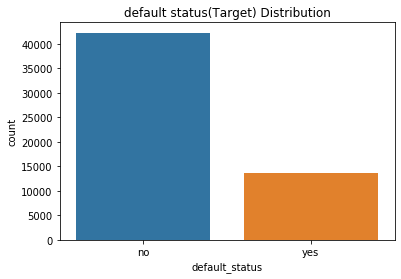

In [8]:
sns.countplot(df_train.default_status)
plt.title('default status(Target) Distribution')

In [9]:
batch1 = df_train[['form_field1', 'form_field2', 'form_field3',
       'form_field4', 'form_field5', 'form_field6', 'form_field7',
       'form_field8', 'form_field9', 'form_field10', 'default_status']]
batch2 = df_train[['form_field11','form_field12', 'form_field13', 'form_field14', 'form_field15',
       'form_field16', 'form_field17', 'form_field18', 'form_field19',
       'form_field20', 'default_status']]
batch3= df_train[['form_field21', 'form_field22', 'form_field23',
       'form_field24', 'form_field25', 'form_field26', 'form_field27',
       'form_field28', 'form_field29', 'form_field30', 'default_status']]
batch4 = df_train[['form_field31',
       'form_field32', 'form_field33', 'form_field34', 'form_field35',
       'form_field36', 'form_field37', 'form_field38', 'form_field39',
       'form_field40', 'default_status']]
batch5 = df_train[['form_field41', 'form_field42', 'form_field43',
       'form_field44', 'form_field45', 'form_field46', 'form_field47',
       'form_field48', 'form_field49', 'form_field50', 'default_status']]


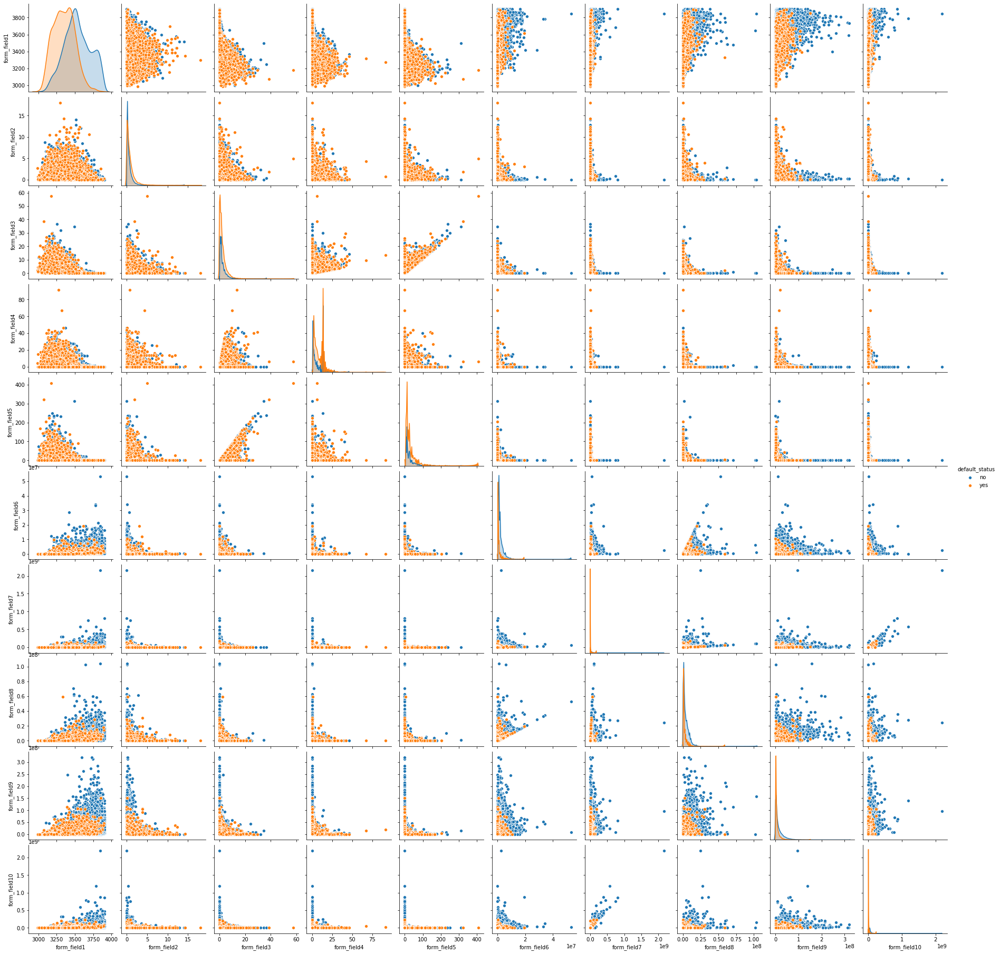

In [10]:
sns.pairplot(batch1, hue = 'default_status')

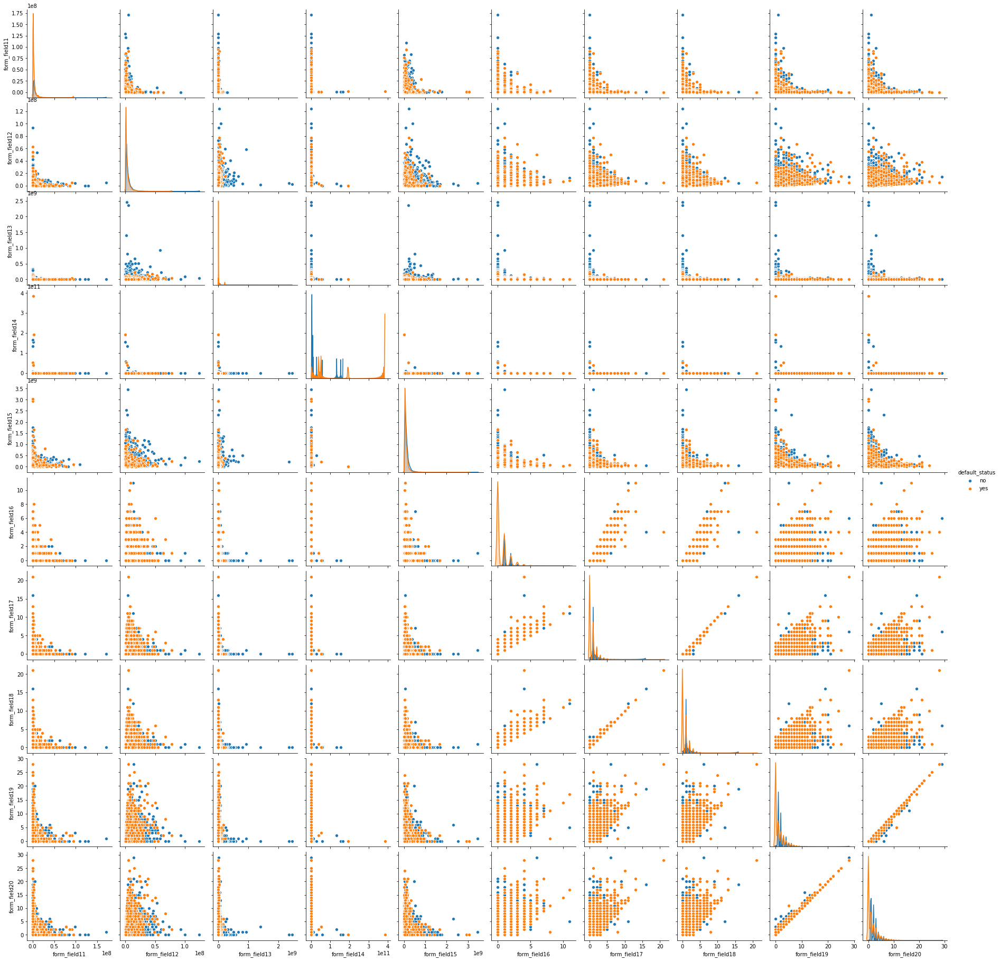

In [11]:
sns.pairplot(batch2, hue = 'default_status')

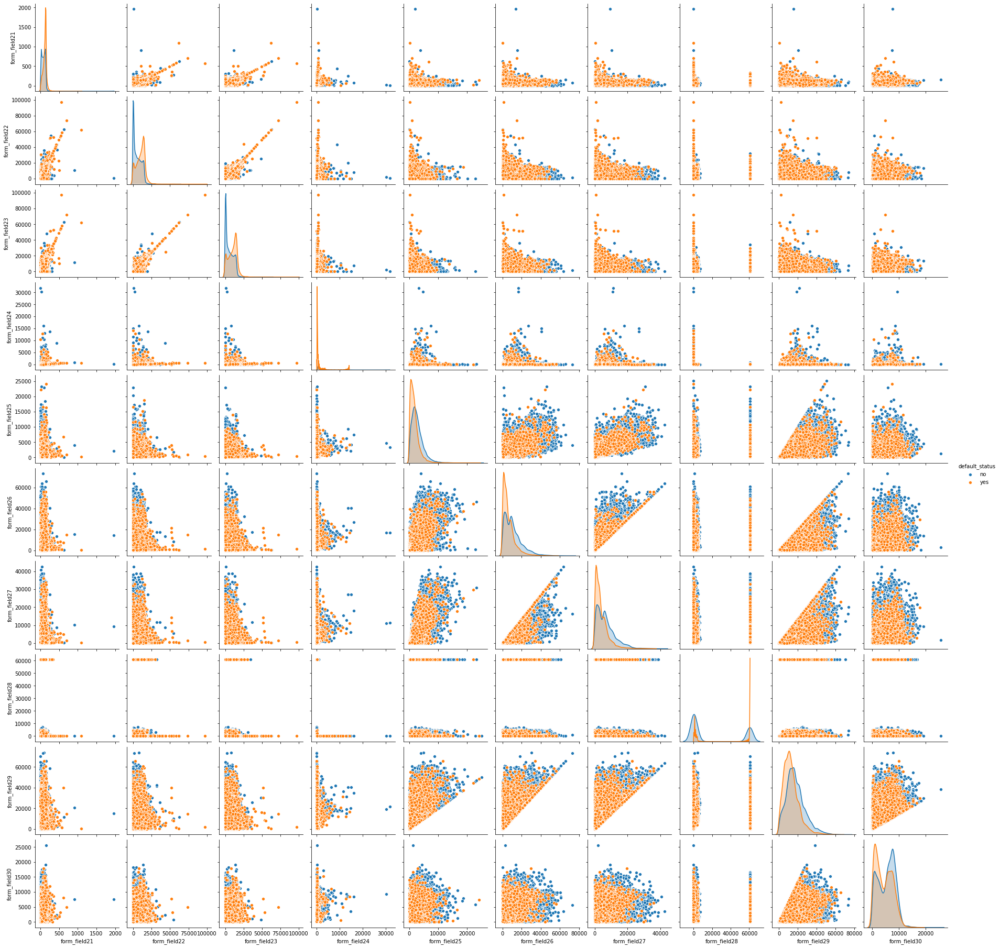

In [12]:
sns.pairplot(batch3, hue = 'default_status')

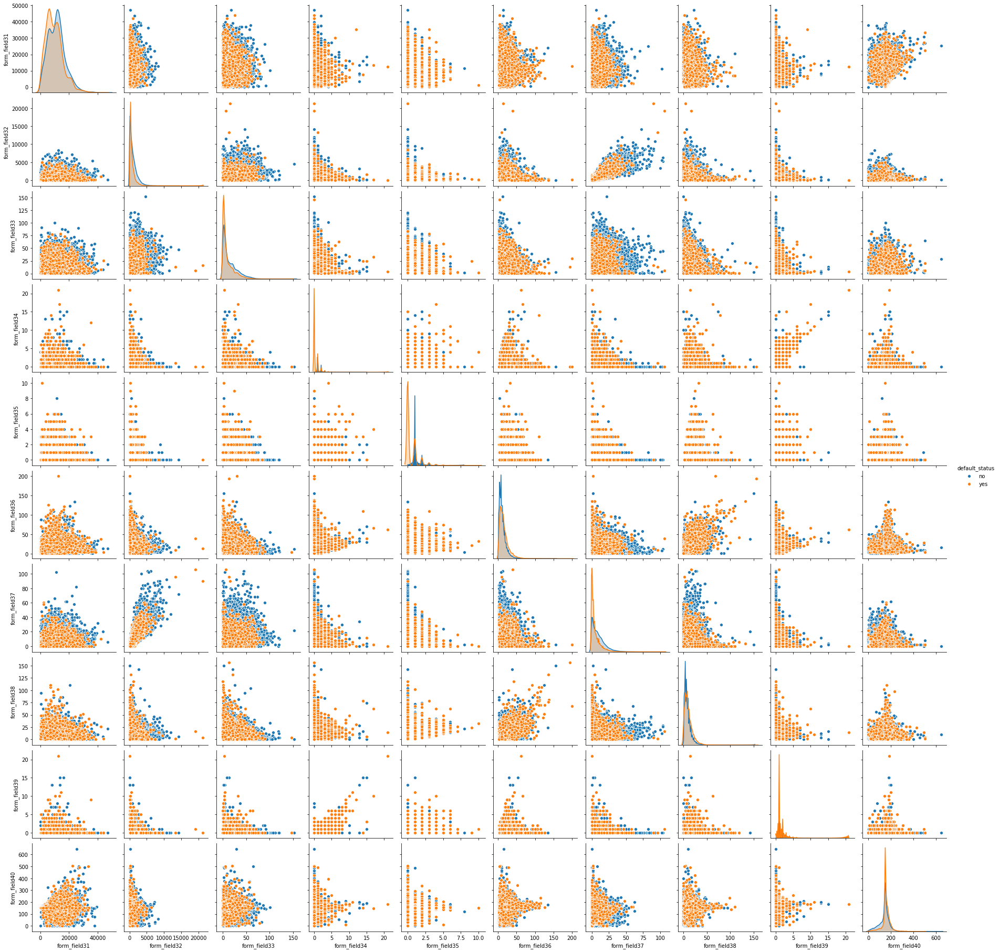

In [13]:
sns.pairplot(batch4, hue = 'default_status')

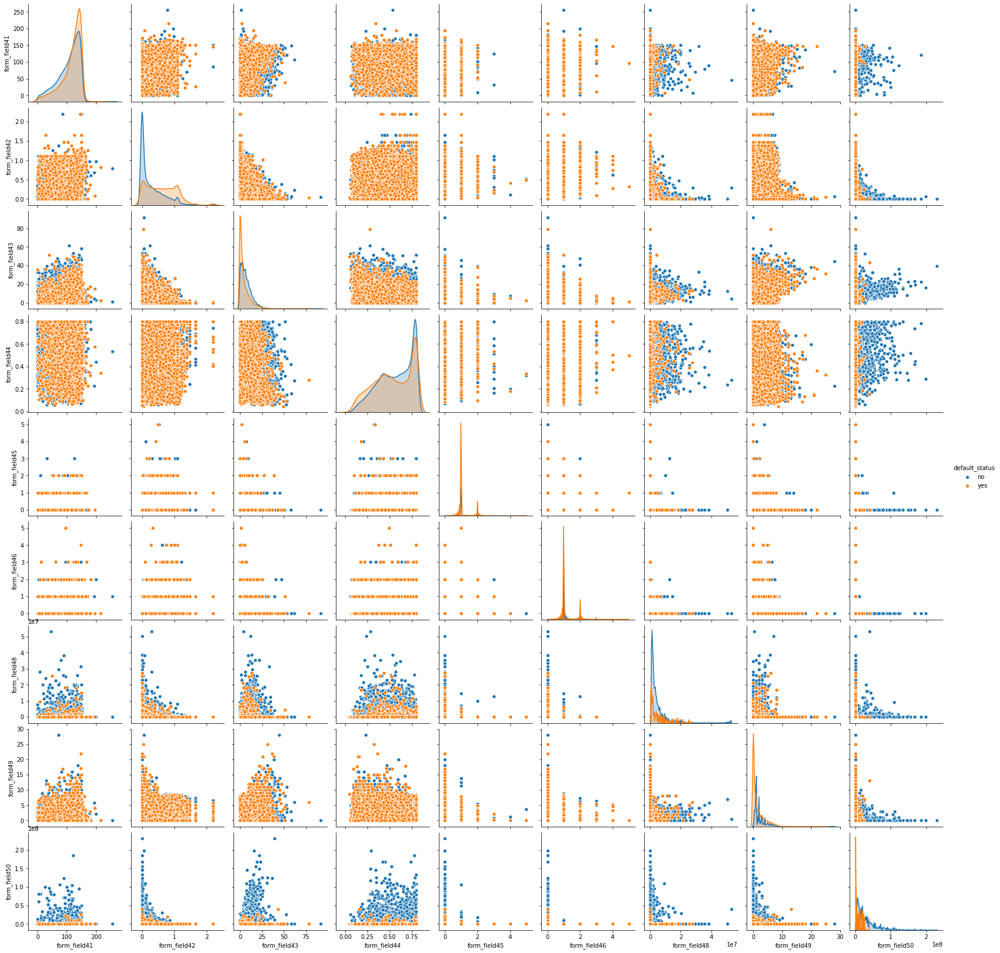

In [14]:
sns.pairplot(batch5, hue = 'default_status')

In [18]:
def histplot(x):
    plt.figure(figsize = (20,20))
    j = list()
    for i in x:
        j.append(i)
    for a in range(1,11):        
        plt.subplot(2,5,a)
        plt.hist(x[j[a-1]])
        plt.title(j[a-1])
    

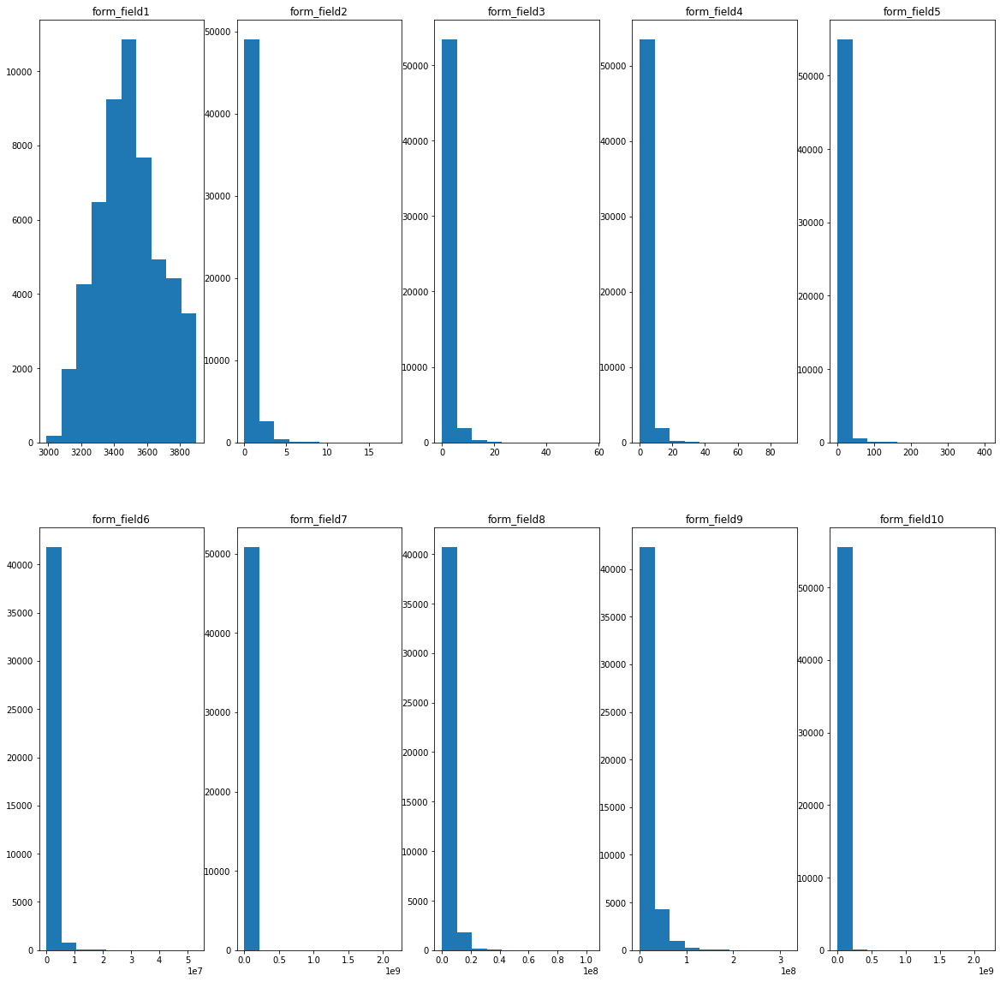

In [19]:
histplot(batch1)

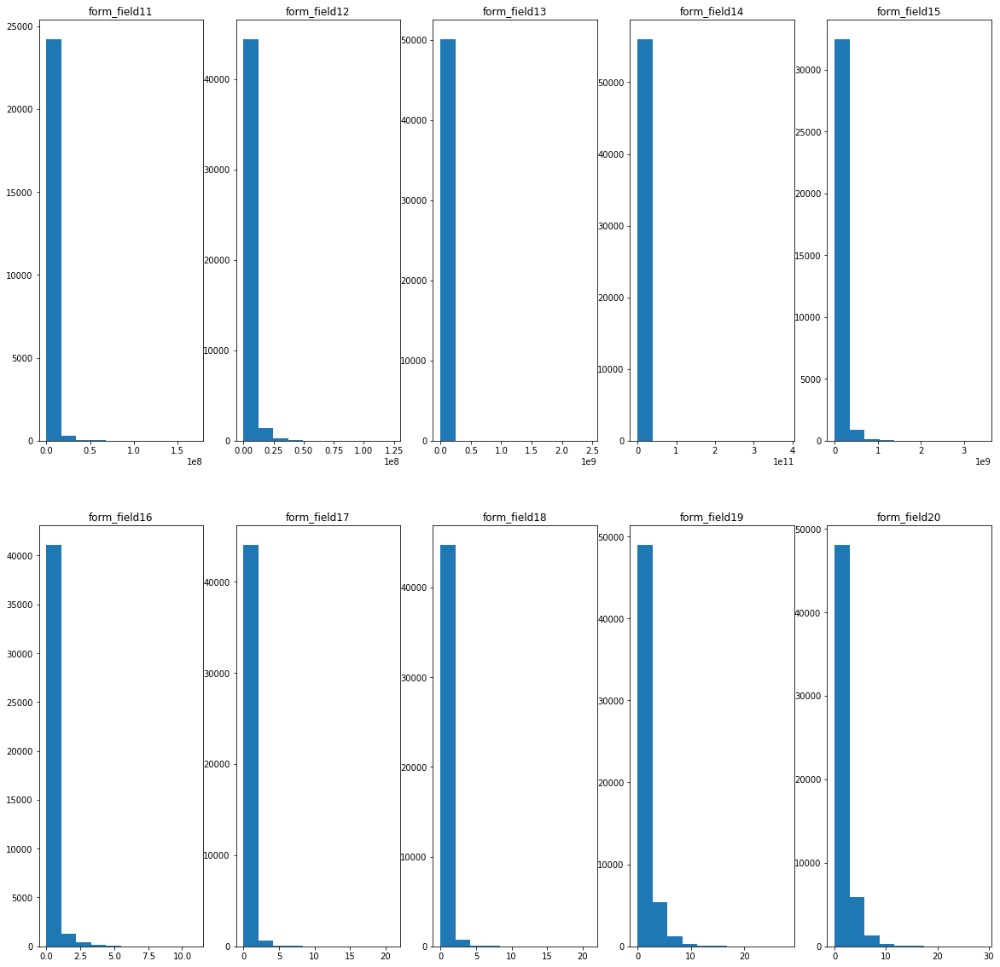

In [20]:
histplot(batch2)

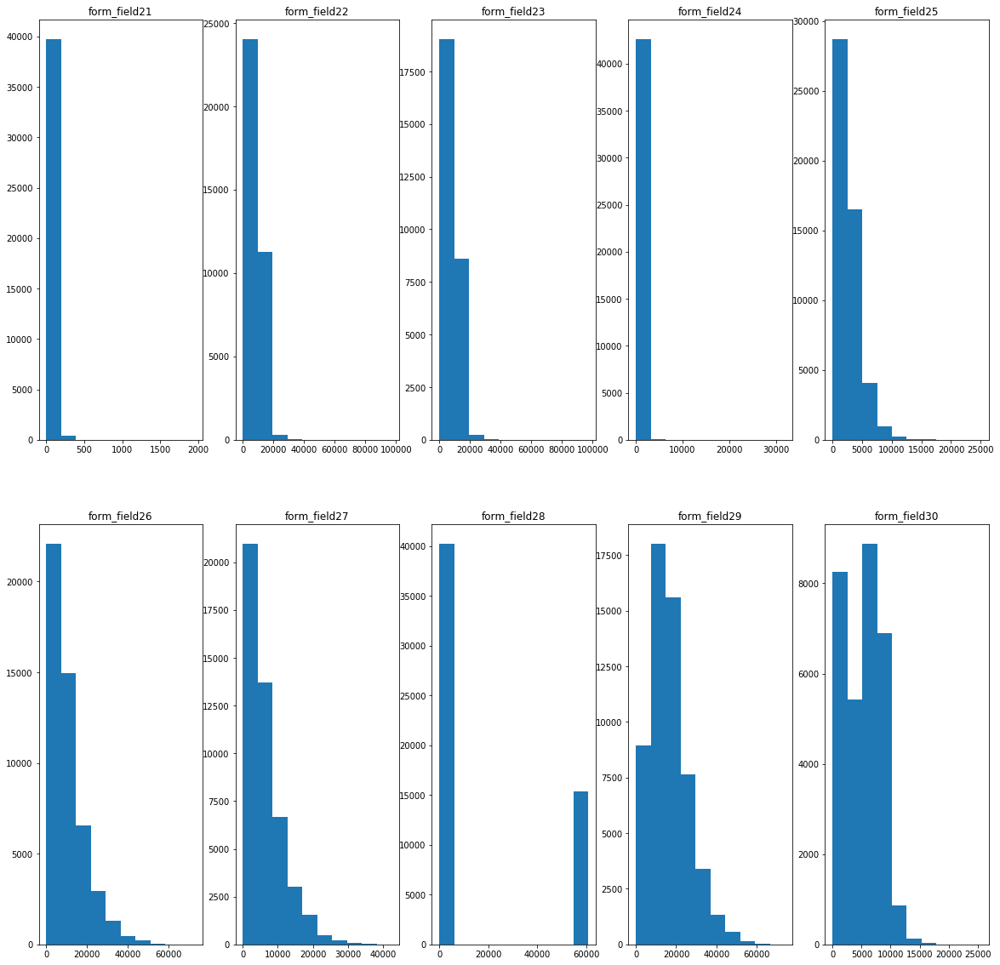

In [21]:
histplot(batch3)

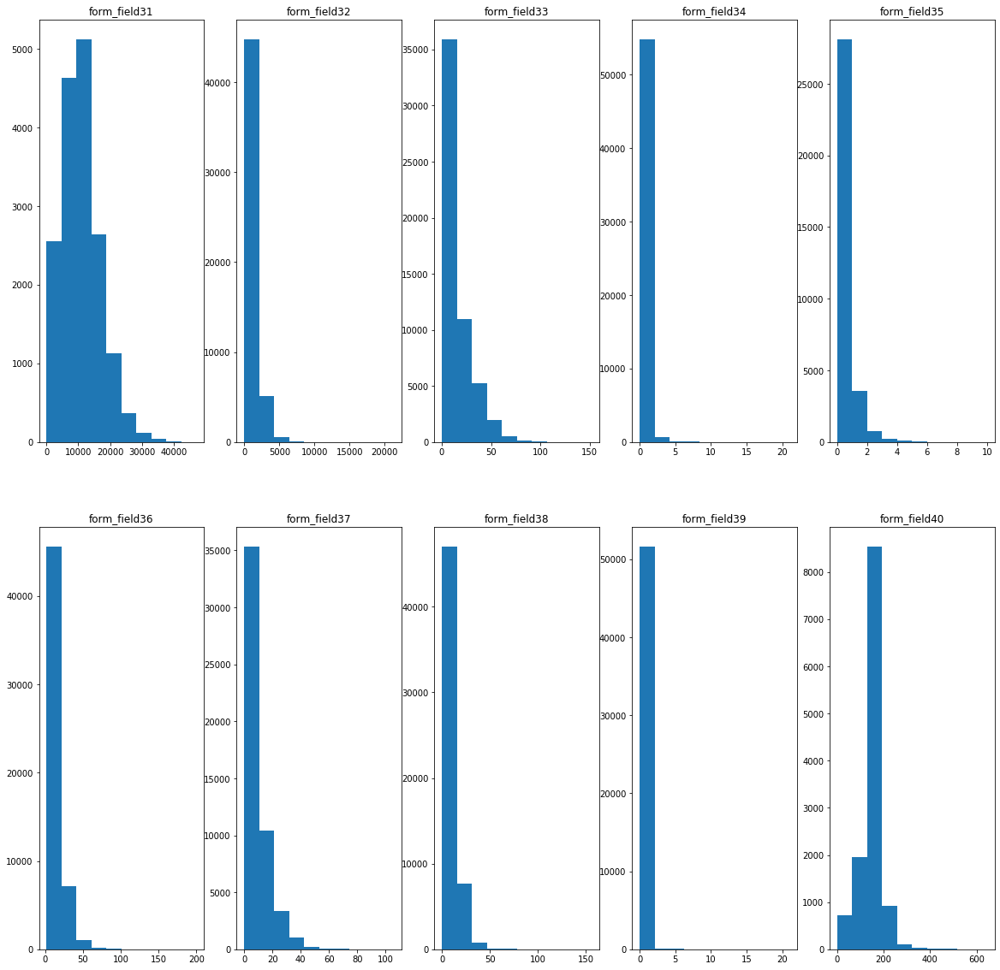

In [22]:
histplot(batch4)

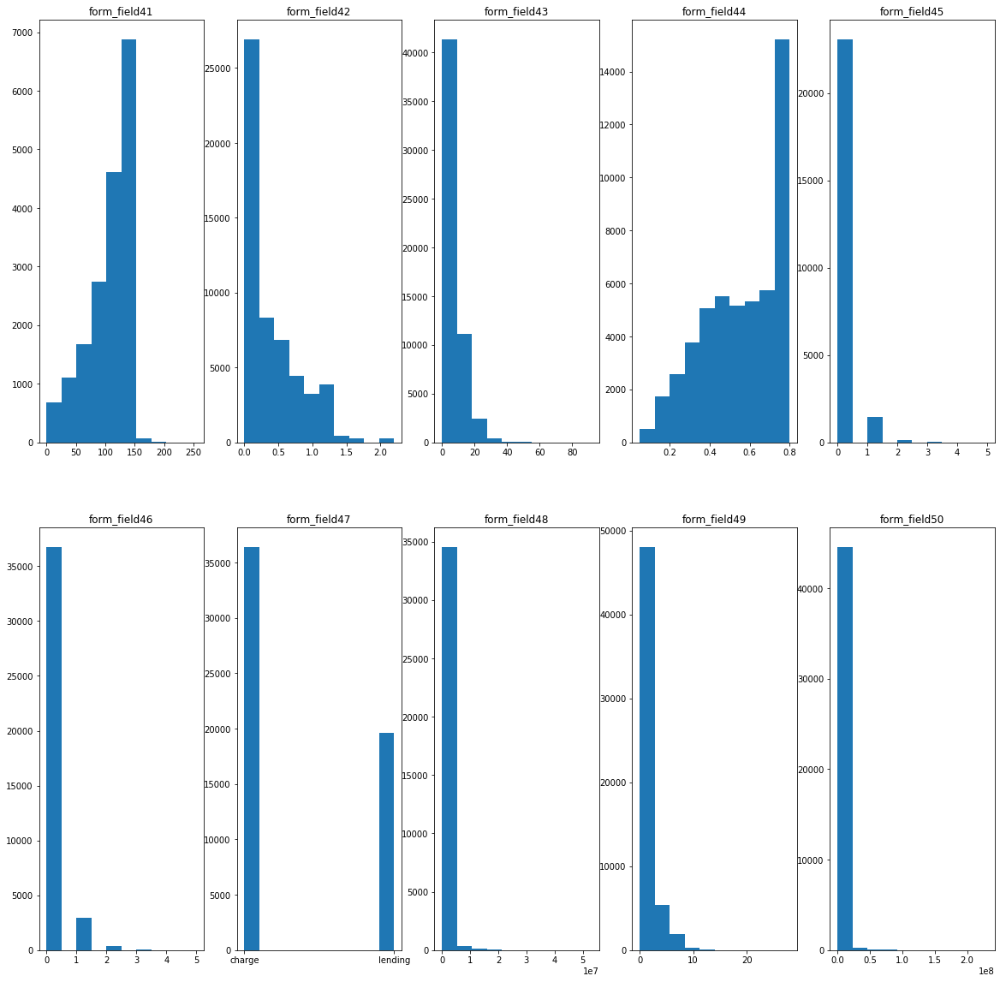

In [23]:
histplot(batch5)

In [24]:
def boxplot(x):
    plt.figure(figsize = (30,10))
    j = list()
    for i in x:
        j.append(i)
    for a in range(1,11):        
        plt.subplot(2,5,a)
        sns.boxplot(x[j[a-1]])
        #plt.title(j[a-1])

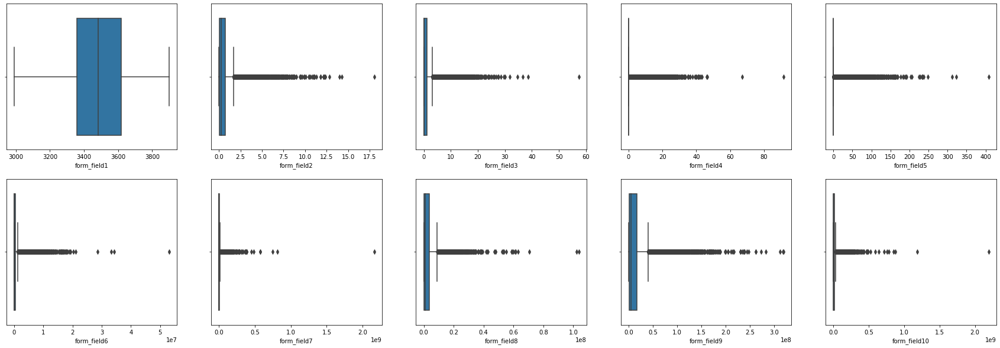

In [25]:
boxplot(batch1)

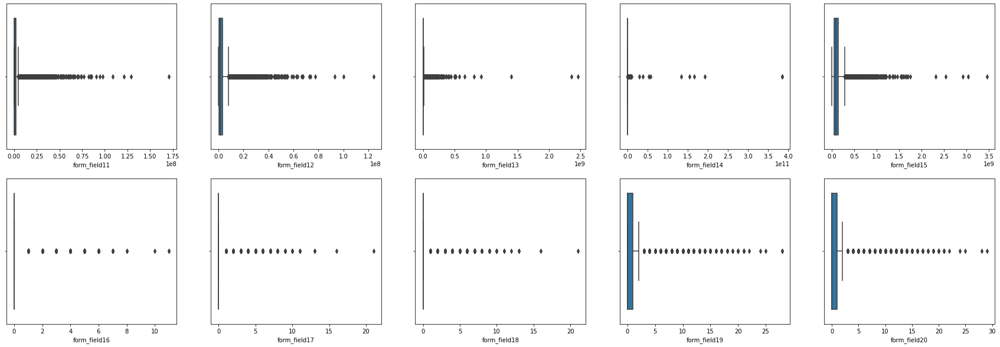

In [26]:
boxplot(batch2)

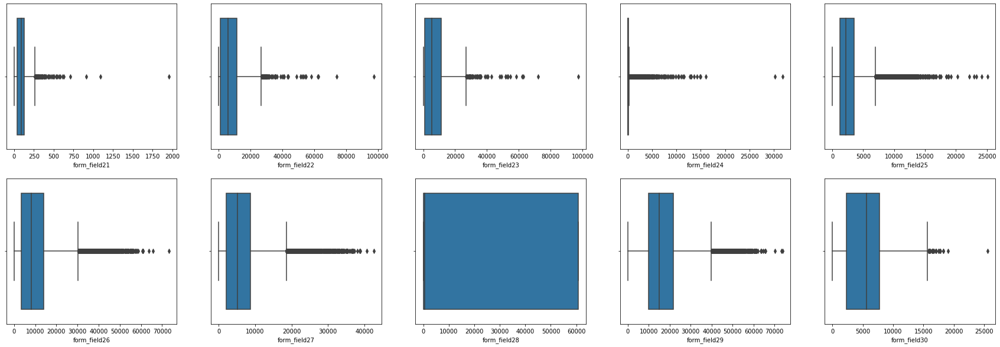

In [27]:
boxplot(batch3)

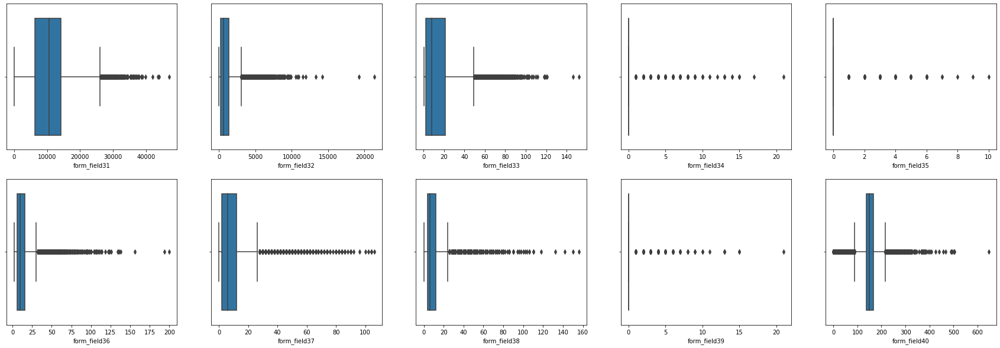

In [28]:
boxplot(batch4)

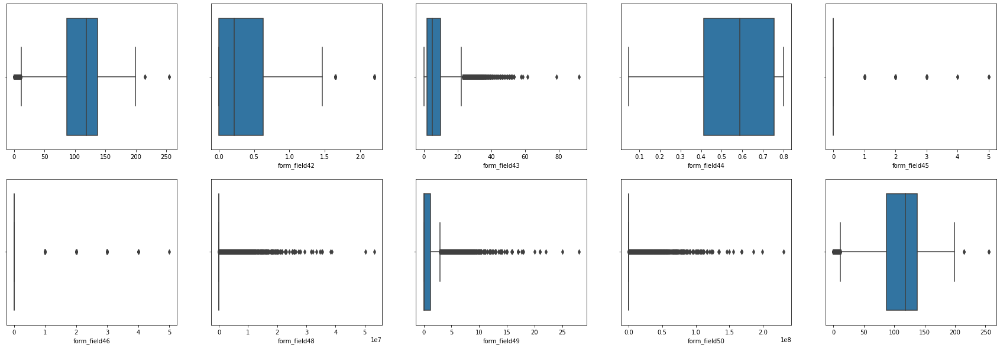

In [36]:
batch5x = df_train[['form_field41', 'form_field42', 'form_field43',
       'form_field44', 'form_field45', 'form_field46','form_field48', 'form_field49', 'form_field50','form_field41']]
boxplot(batch5x)

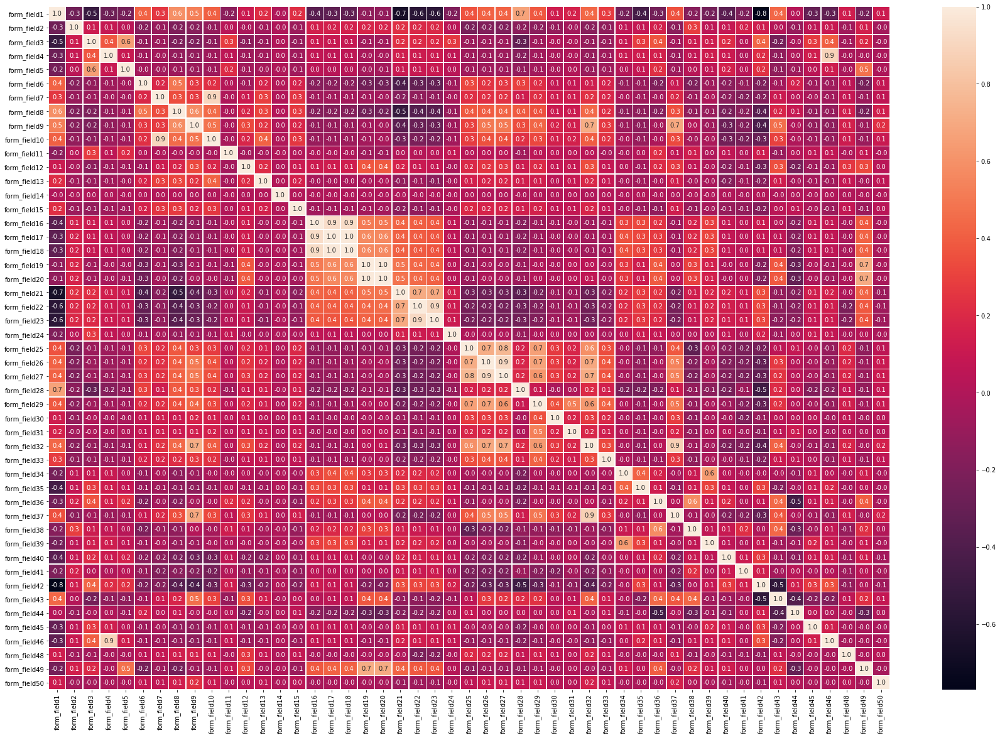

In [39]:
f, ax = plt.subplots(figsize=(30,20))
sns.heatmap(df_train.corr(), annot=True, linewidths=.5, fmt='.1f', ax=ax)

### Data preprocessing

In [40]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 52 columns):
Applicant_ID      56000 non-null object
form_field1       53471 non-null float64
form_field2       52156 non-null float64
form_field3       55645 non-null float64
form_field4       55645 non-null float64
form_field5       55645 non-null float64
form_field6       42640 non-null float64
form_field7       50837 non-null float64
form_field8       42640 non-null float64
form_field9       47992 non-null float64
form_field10      55645 non-null float64
form_field11      24579 non-null float64
form_field12      46105 non-null float64
form_field13      50111 non-null float64
form_field14      56000 non-null int64
form_field15      33525 non-null float64
form_field16      42964 non-null float64
form_field17      44849 non-null float64
form_field18      45598 non-null float64
form_field19      55996 non-null float64
form_field20      55645 non-null float64
form_field21      40146 non-null 

In [41]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 51 columns):
Applicant_ID    24000 non-null object
form_field1     22890 non-null float64
form_field2     22291 non-null float64
form_field3     23854 non-null float64
form_field4     23854 non-null float64
form_field5     23854 non-null float64
form_field6     18396 non-null float64
form_field7     21769 non-null float64
form_field8     18396 non-null float64
form_field9     20600 non-null float64
form_field10    23853 non-null float64
form_field11    10602 non-null float64
form_field12    19817 non-null float64
form_field13    21537 non-null float64
form_field14    24000 non-null int64
form_field15    14408 non-null float64
form_field16    18526 non-null float64
form_field17    19305 non-null float64
form_field18    19631 non-null float64
form_field19    24000 non-null float64
form_field20    23853 non-null float64
form_field21    17293 non-null float64
form_field22    15276 non-null float

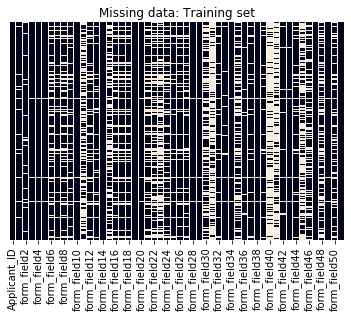

In [42]:
sns.heatmap(df_train.isnull(), yticklabels=False, cbar=False) #cmap='tab20c_r')
plt.title('Missing data: Training set')
plt.show()

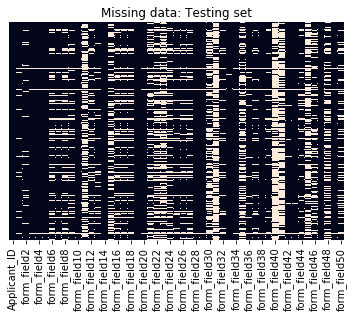

In [43]:
sns.heatmap(df_test.isnull(), yticklabels=False, cbar=False) #cmap='tab20c_r')
plt.title('Missing data: Testing set')
plt.show()

In [44]:
#Labell encoding the categorical variables
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
df_train["form_field47"] = enc.fit_transform(df_train["form_field47"])
df_train["default_status"] = enc.fit_transform(df_train["default_status"])
df_test["form_field47"] = enc.fit_transform(df_test["form_field47"])

In [45]:
#filling the null values
df_train = df_train.fillna(-999)
df_test = df_test.fillna(-999)

In [46]:
df_train.isnull().sum()

Applicant_ID      0
form_field1       0
form_field2       0
form_field3       0
form_field4       0
form_field5       0
form_field6       0
form_field7       0
form_field8       0
form_field9       0
form_field10      0
form_field11      0
form_field12      0
form_field13      0
form_field14      0
form_field15      0
form_field16      0
form_field17      0
form_field18      0
form_field19      0
form_field20      0
form_field21      0
form_field22      0
form_field23      0
form_field24      0
form_field25      0
form_field26      0
form_field27      0
form_field28      0
form_field29      0
form_field30      0
form_field31      0
form_field32      0
form_field33      0
form_field34      0
form_field35      0
form_field36      0
form_field37      0
form_field38      0
form_field39      0
form_field40      0
form_field41      0
form_field42      0
form_field43      0
form_field44      0
form_field45      0
form_field46      0
form_field47      0
form_field48      0
form_field49      0


In [47]:
df_test.isnull().sum()

Applicant_ID    0
form_field1     0
form_field2     0
form_field3     0
form_field4     0
form_field5     0
form_field6     0
form_field7     0
form_field8     0
form_field9     0
form_field10    0
form_field11    0
form_field12    0
form_field13    0
form_field14    0
form_field15    0
form_field16    0
form_field17    0
form_field18    0
form_field19    0
form_field20    0
form_field21    0
form_field22    0
form_field23    0
form_field24    0
form_field25    0
form_field26    0
form_field27    0
form_field28    0
form_field29    0
form_field30    0
form_field31    0
form_field32    0
form_field33    0
form_field34    0
form_field35    0
form_field36    0
form_field37    0
form_field38    0
form_field39    0
form_field40    0
form_field41    0
form_field42    0
form_field43    0
form_field44    0
form_field45    0
form_field46    0
form_field47    0
form_field48    0
form_field49    0
form_field50    0
dtype: int64

In [48]:
X = df_train.drop(["Applicant_ID", "default_status"], axis=1)
y = df_train["default_status"]
X_test = df_test.drop(["Applicant_ID"], axis=1)

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.metrics import roc_auc_score

### Model building

In [50]:
from catboost import CatBoostClassifier

clf = CatBoostClassifier(iterations=10000,
                         learning_rate = 0.01,
                         use_best_model = True,
                         eval_metric = 'AUC', 
                         random_state = 50)

In [51]:
from sklearn.model_selection import StratifiedKFold
skfolds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 0)

In [52]:
total_pred = list()
scores = list()
for fold, (tr, te) in enumerate(skfolds.split(X,y), 1):
    train_X, test_X = X.iloc[tr], X.iloc[te]
    train_y, test_y = y.iloc[tr], y.iloc[te]
    
    
    clf.fit(train_X, train_y, eval_set = [(train_X,train_y),(test_X, test_y)])
    
    yhat = clf.predict_proba(test_X)[:,1]
    score = roc_auc_score(test_y, yhat)
    
    scores.append(score)
    print('>', score)
    pred = clf.predict_proba(X_test)[:,1]
    total_pred.append(pred)
average_pred = np.mean(total_pred, 0)

0:	test: 0.7930622	test1: 0.7933042	best: 0.7933042 (0)	total: 314ms	remaining: 52m 16s
1:	test: 0.7995093	test1: 0.7990688	best: 0.7990688 (1)	total: 399ms	remaining: 33m 16s
2:	test: 0.8060519	test1: 0.8054573	best: 0.8054573 (2)	total: 455ms	remaining: 25m 15s
3:	test: 0.8121299	test1: 0.8107885	best: 0.8107885 (3)	total: 519ms	remaining: 21m 37s
4:	test: 0.8124447	test1: 0.8104370	best: 0.8107885 (3)	total: 583ms	remaining: 19m 25s
5:	test: 0.8126576	test1: 0.8104908	best: 0.8107885 (3)	total: 644ms	remaining: 17m 52s
6:	test: 0.8143531	test1: 0.8114980	best: 0.8114980 (6)	total: 738ms	remaining: 17m 34s
7:	test: 0.8162424	test1: 0.8135336	best: 0.8135336 (7)	total: 833ms	remaining: 17m 19s
8:	test: 0.8163990	test1: 0.8138301	best: 0.8138301 (8)	total: 929ms	remaining: 17m 11s
9:	test: 0.8171215	test1: 0.8145675	best: 0.8145675 (9)	total: 1.02s	remaining: 16m 55s
10:	test: 0.8178440	test1: 0.8153559	best: 0.8153559 (10)	total: 1.1s	remaining: 16m 41s
11:	test: 0.8179157	test1: 0.81

94:	test: 0.8286771	test1: 0.8226366	best: 0.8226694 (93)	total: 6.51s	remaining: 11m 18s
95:	test: 0.8287138	test1: 0.8226551	best: 0.8226694 (93)	total: 6.57s	remaining: 11m 18s
96:	test: 0.8287747	test1: 0.8226990	best: 0.8226990 (96)	total: 6.63s	remaining: 11m 16s
97:	test: 0.8288140	test1: 0.8227505	best: 0.8227505 (97)	total: 6.69s	remaining: 11m 16s
98:	test: 0.8289226	test1: 0.8228283	best: 0.8228283 (98)	total: 6.75s	remaining: 11m 15s
99:	test: 0.8291037	test1: 0.8229628	best: 0.8229628 (99)	total: 6.81s	remaining: 11m 14s
100:	test: 0.8292075	test1: 0.8230355	best: 0.8230355 (100)	total: 6.87s	remaining: 11m 13s
101:	test: 0.8292869	test1: 0.8231030	best: 0.8231030 (101)	total: 6.93s	remaining: 11m 12s
102:	test: 0.8293206	test1: 0.8231235	best: 0.8231235 (102)	total: 7s	remaining: 11m 12s
103:	test: 0.8294360	test1: 0.8232496	best: 0.8232496 (103)	total: 7.06s	remaining: 11m 11s
104:	test: 0.8295279	test1: 0.8233318	best: 0.8233318 (104)	total: 7.12s	remaining: 11m 11s
105

185:	test: 0.8343559	test1: 0.8270943	best: 0.8270943 (185)	total: 12.1s	remaining: 10m 35s
186:	test: 0.8344257	test1: 0.8271128	best: 0.8271128 (186)	total: 12.1s	remaining: 10m 35s
187:	test: 0.8344686	test1: 0.8271394	best: 0.8271394 (187)	total: 12.2s	remaining: 10m 35s
188:	test: 0.8345185	test1: 0.8271995	best: 0.8271995 (188)	total: 12.2s	remaining: 10m 34s
189:	test: 0.8345650	test1: 0.8272023	best: 0.8272023 (189)	total: 12.3s	remaining: 10m 34s
190:	test: 0.8346004	test1: 0.8272171	best: 0.8272171 (190)	total: 12.3s	remaining: 10m 34s
191:	test: 0.8346603	test1: 0.8272692	best: 0.8272692 (191)	total: 12.4s	remaining: 10m 33s
192:	test: 0.8347182	test1: 0.8273301	best: 0.8273301 (192)	total: 12.5s	remaining: 10m 33s
193:	test: 0.8347758	test1: 0.8273823	best: 0.8273823 (193)	total: 12.5s	remaining: 10m 33s
194:	test: 0.8348101	test1: 0.8274230	best: 0.8274230 (194)	total: 12.6s	remaining: 10m 32s
195:	test: 0.8348484	test1: 0.8274316	best: 0.8274316 (195)	total: 12.6s	remaini

277:	test: 0.8380105	test1: 0.8297567	best: 0.8297567 (277)	total: 17.5s	remaining: 10m 11s
278:	test: 0.8380365	test1: 0.8297616	best: 0.8297616 (278)	total: 17.5s	remaining: 10m 10s
279:	test: 0.8380664	test1: 0.8297902	best: 0.8297902 (279)	total: 17.6s	remaining: 10m 11s
280:	test: 0.8381047	test1: 0.8298125	best: 0.8298125 (280)	total: 17.7s	remaining: 10m 10s
281:	test: 0.8381437	test1: 0.8298562	best: 0.8298562 (281)	total: 17.7s	remaining: 10m 10s
282:	test: 0.8381853	test1: 0.8298928	best: 0.8298928 (282)	total: 17.8s	remaining: 10m 10s
283:	test: 0.8382121	test1: 0.8299097	best: 0.8299097 (283)	total: 17.8s	remaining: 10m 10s
284:	test: 0.8382518	test1: 0.8299421	best: 0.8299421 (284)	total: 17.9s	remaining: 10m 10s
285:	test: 0.8382907	test1: 0.8299585	best: 0.8299585 (285)	total: 18s	remaining: 10m 9s
286:	test: 0.8383212	test1: 0.8299887	best: 0.8299887 (286)	total: 18s	remaining: 10m 9s
287:	test: 0.8383472	test1: 0.8300017	best: 0.8300017 (287)	total: 18.1s	remaining: 10

369:	test: 0.8407454	test1: 0.8314454	best: 0.8314454 (369)	total: 22.8s	remaining: 9m 54s
370:	test: 0.8407663	test1: 0.8314610	best: 0.8314610 (370)	total: 22.9s	remaining: 9m 54s
371:	test: 0.8407933	test1: 0.8314491	best: 0.8314610 (370)	total: 23s	remaining: 9m 54s
372:	test: 0.8408171	test1: 0.8314711	best: 0.8314711 (372)	total: 23s	remaining: 9m 53s
373:	test: 0.8408396	test1: 0.8314761	best: 0.8314761 (373)	total: 23.1s	remaining: 9m 53s
374:	test: 0.8408648	test1: 0.8314965	best: 0.8314965 (374)	total: 23.1s	remaining: 9m 53s
375:	test: 0.8408830	test1: 0.8315000	best: 0.8315000 (375)	total: 23.2s	remaining: 9m 53s
376:	test: 0.8409063	test1: 0.8315088	best: 0.8315088 (376)	total: 23.2s	remaining: 9m 53s
377:	test: 0.8409331	test1: 0.8315279	best: 0.8315279 (377)	total: 23.3s	remaining: 9m 53s
378:	test: 0.8409544	test1: 0.8315341	best: 0.8315341 (378)	total: 23.4s	remaining: 9m 53s
379:	test: 0.8409752	test1: 0.8315472	best: 0.8315472 (379)	total: 23.4s	remaining: 9m 52s
380

460:	test: 0.8430132	test1: 0.8327002	best: 0.8327002 (460)	total: 28.2s	remaining: 9m 42s
461:	test: 0.8430308	test1: 0.8327143	best: 0.8327143 (461)	total: 28.2s	remaining: 9m 42s
462:	test: 0.8430549	test1: 0.8327348	best: 0.8327348 (462)	total: 28.3s	remaining: 9m 42s
463:	test: 0.8430757	test1: 0.8327529	best: 0.8327529 (463)	total: 28.3s	remaining: 9m 42s
464:	test: 0.8431064	test1: 0.8327731	best: 0.8327731 (464)	total: 28.4s	remaining: 9m 41s
465:	test: 0.8431358	test1: 0.8327867	best: 0.8327867 (465)	total: 28.4s	remaining: 9m 41s
466:	test: 0.8431543	test1: 0.8327878	best: 0.8327878 (466)	total: 28.5s	remaining: 9m 41s
467:	test: 0.8431722	test1: 0.8327969	best: 0.8327969 (467)	total: 28.6s	remaining: 9m 41s
468:	test: 0.8431906	test1: 0.8328090	best: 0.8328090 (468)	total: 28.6s	remaining: 9m 41s
469:	test: 0.8432178	test1: 0.8328194	best: 0.8328194 (469)	total: 28.7s	remaining: 9m 41s
470:	test: 0.8432391	test1: 0.8328319	best: 0.8328319 (470)	total: 28.7s	remaining: 9m 41s

554:	test: 0.8452252	test1: 0.8338567	best: 0.8338567 (554)	total: 33.6s	remaining: 9m 32s
555:	test: 0.8452531	test1: 0.8338756	best: 0.8338756 (555)	total: 33.7s	remaining: 9m 32s
556:	test: 0.8452713	test1: 0.8338794	best: 0.8338794 (556)	total: 33.7s	remaining: 9m 31s
557:	test: 0.8452875	test1: 0.8338940	best: 0.8338940 (557)	total: 33.8s	remaining: 9m 31s
558:	test: 0.8453074	test1: 0.8339043	best: 0.8339043 (558)	total: 33.9s	remaining: 9m 31s
559:	test: 0.8453403	test1: 0.8339212	best: 0.8339212 (559)	total: 33.9s	remaining: 9m 31s
560:	test: 0.8453502	test1: 0.8339284	best: 0.8339284 (560)	total: 34s	remaining: 9m 31s
561:	test: 0.8453746	test1: 0.8339341	best: 0.8339341 (561)	total: 34s	remaining: 9m 31s
562:	test: 0.8454148	test1: 0.8339468	best: 0.8339468 (562)	total: 34.1s	remaining: 9m 31s
563:	test: 0.8454305	test1: 0.8339516	best: 0.8339516 (563)	total: 34.1s	remaining: 9m 31s
564:	test: 0.8454531	test1: 0.8339596	best: 0.8339596 (564)	total: 34.2s	remaining: 9m 31s
565

645:	test: 0.8471730	test1: 0.8347574	best: 0.8347574 (645)	total: 39.4s	remaining: 9m 30s
646:	test: 0.8471826	test1: 0.8347638	best: 0.8347638 (646)	total: 39.5s	remaining: 9m 30s
647:	test: 0.8472051	test1: 0.8347763	best: 0.8347763 (647)	total: 39.6s	remaining: 9m 31s
648:	test: 0.8472272	test1: 0.8347856	best: 0.8347856 (648)	total: 39.7s	remaining: 9m 31s
649:	test: 0.8472478	test1: 0.8347839	best: 0.8347856 (648)	total: 39.8s	remaining: 9m 32s
650:	test: 0.8472629	test1: 0.8347810	best: 0.8347856 (648)	total: 39.9s	remaining: 9m 32s
651:	test: 0.8472938	test1: 0.8347998	best: 0.8347998 (651)	total: 40s	remaining: 9m 33s
652:	test: 0.8473120	test1: 0.8348084	best: 0.8348084 (652)	total: 40s	remaining: 9m 33s
653:	test: 0.8473391	test1: 0.8348146	best: 0.8348146 (653)	total: 40.1s	remaining: 9m 33s
654:	test: 0.8473540	test1: 0.8348163	best: 0.8348163 (654)	total: 40.2s	remaining: 9m 32s
655:	test: 0.8473702	test1: 0.8348088	best: 0.8348163 (654)	total: 40.2s	remaining: 9m 32s
656

739:	test: 0.8489932	test1: 0.8353626	best: 0.8353626 (739)	total: 45.1s	remaining: 9m 23s
740:	test: 0.8490100	test1: 0.8353710	best: 0.8353710 (740)	total: 45.1s	remaining: 9m 23s
741:	test: 0.8490213	test1: 0.8353691	best: 0.8353710 (740)	total: 45.2s	remaining: 9m 23s
742:	test: 0.8490352	test1: 0.8353669	best: 0.8353710 (740)	total: 45.2s	remaining: 9m 23s
743:	test: 0.8490570	test1: 0.8353724	best: 0.8353724 (743)	total: 45.3s	remaining: 9m 23s
744:	test: 0.8490897	test1: 0.8353898	best: 0.8353898 (744)	total: 45.3s	remaining: 9m 23s
745:	test: 0.8491060	test1: 0.8353882	best: 0.8353898 (744)	total: 45.4s	remaining: 9m 23s
746:	test: 0.8491258	test1: 0.8353986	best: 0.8353986 (746)	total: 45.5s	remaining: 9m 23s
747:	test: 0.8491468	test1: 0.8354030	best: 0.8354030 (747)	total: 45.5s	remaining: 9m 22s
748:	test: 0.8491632	test1: 0.8354148	best: 0.8354148 (748)	total: 45.6s	remaining: 9m 22s
749:	test: 0.8491911	test1: 0.8354275	best: 0.8354275 (749)	total: 45.7s	remaining: 9m 23s

833:	test: 0.8506929	test1: 0.8359618	best: 0.8359618 (833)	total: 50.6s	remaining: 9m 15s
834:	test: 0.8507121	test1: 0.8359630	best: 0.8359630 (834)	total: 50.6s	remaining: 9m 15s
835:	test: 0.8507378	test1: 0.8359759	best: 0.8359759 (835)	total: 50.7s	remaining: 9m 15s
836:	test: 0.8507494	test1: 0.8359862	best: 0.8359862 (836)	total: 50.7s	remaining: 9m 15s
837:	test: 0.8507675	test1: 0.8359890	best: 0.8359890 (837)	total: 50.8s	remaining: 9m 15s
838:	test: 0.8507787	test1: 0.8359956	best: 0.8359956 (838)	total: 50.9s	remaining: 9m 15s
839:	test: 0.8507928	test1: 0.8360009	best: 0.8360009 (839)	total: 50.9s	remaining: 9m 15s
840:	test: 0.8508114	test1: 0.8360067	best: 0.8360067 (840)	total: 51s	remaining: 9m 15s
841:	test: 0.8508311	test1: 0.8360186	best: 0.8360186 (841)	total: 51s	remaining: 9m 15s
842:	test: 0.8508470	test1: 0.8360264	best: 0.8360264 (842)	total: 51.1s	remaining: 9m 15s
843:	test: 0.8508710	test1: 0.8360355	best: 0.8360355 (843)	total: 51.2s	remaining: 9m 14s
844

927:	test: 0.8524022	test1: 0.8365744	best: 0.8365744 (927)	total: 56s	remaining: 9m 7s
928:	test: 0.8524129	test1: 0.8365777	best: 0.8365777 (928)	total: 56.1s	remaining: 9m 7s
929:	test: 0.8524354	test1: 0.8365924	best: 0.8365924 (929)	total: 56.1s	remaining: 9m 7s
930:	test: 0.8524530	test1: 0.8365970	best: 0.8365970 (930)	total: 56.2s	remaining: 9m 7s
931:	test: 0.8524645	test1: 0.8365996	best: 0.8365996 (931)	total: 56.2s	remaining: 9m 7s
932:	test: 0.8524865	test1: 0.8366031	best: 0.8366031 (932)	total: 56.3s	remaining: 9m 7s
933:	test: 0.8525076	test1: 0.8366022	best: 0.8366031 (932)	total: 56.3s	remaining: 9m 6s
934:	test: 0.8525356	test1: 0.8366173	best: 0.8366173 (934)	total: 56.4s	remaining: 9m 6s
935:	test: 0.8525495	test1: 0.8366104	best: 0.8366173 (934)	total: 56.5s	remaining: 9m 6s
936:	test: 0.8525775	test1: 0.8366199	best: 0.8366199 (936)	total: 56.5s	remaining: 9m 6s
937:	test: 0.8525918	test1: 0.8366281	best: 0.8366281 (937)	total: 56.6s	remaining: 9m 6s
938:	test: 0

1022:	test: 0.8541201	test1: 0.8369834	best: 0.8369834 (1022)	total: 1m 1s	remaining: 8m 59s
1023:	test: 0.8541458	test1: 0.8369935	best: 0.8369935 (1023)	total: 1m 1s	remaining: 8m 59s
1024:	test: 0.8541692	test1: 0.8370004	best: 0.8370004 (1024)	total: 1m 1s	remaining: 8m 59s
1025:	test: 0.8541936	test1: 0.8370028	best: 0.8370028 (1025)	total: 1m 1s	remaining: 8m 59s
1026:	test: 0.8542073	test1: 0.8370001	best: 0.8370028 (1025)	total: 1m 1s	remaining: 8m 59s
1027:	test: 0.8542195	test1: 0.8370009	best: 0.8370028 (1025)	total: 1m 1s	remaining: 8m 59s
1028:	test: 0.8542403	test1: 0.8370122	best: 0.8370122 (1028)	total: 1m 1s	remaining: 8m 59s
1029:	test: 0.8542645	test1: 0.8370173	best: 0.8370173 (1029)	total: 1m 1s	remaining: 8m 59s
1030:	test: 0.8542819	test1: 0.8370229	best: 0.8370229 (1030)	total: 1m 1s	remaining: 8m 59s
1031:	test: 0.8543043	test1: 0.8370303	best: 0.8370303 (1031)	total: 1m 2s	remaining: 8m 58s
1032:	test: 0.8543179	test1: 0.8370326	best: 0.8370326 (1032)	total: 1

1113:	test: 0.8558262	test1: 0.8373380	best: 0.8373434 (1111)	total: 1m 6s	remaining: 8m 52s
1114:	test: 0.8558422	test1: 0.8373446	best: 0.8373446 (1114)	total: 1m 6s	remaining: 8m 52s
1115:	test: 0.8558690	test1: 0.8373511	best: 0.8373511 (1115)	total: 1m 6s	remaining: 8m 52s
1116:	test: 0.8558892	test1: 0.8373614	best: 0.8373614 (1116)	total: 1m 6s	remaining: 8m 52s
1117:	test: 0.8559047	test1: 0.8373706	best: 0.8373706 (1117)	total: 1m 7s	remaining: 8m 52s
1118:	test: 0.8559238	test1: 0.8373699	best: 0.8373706 (1117)	total: 1m 7s	remaining: 8m 52s
1119:	test: 0.8559457	test1: 0.8373726	best: 0.8373726 (1119)	total: 1m 7s	remaining: 8m 52s
1120:	test: 0.8559602	test1: 0.8373744	best: 0.8373744 (1120)	total: 1m 7s	remaining: 8m 52s
1121:	test: 0.8559710	test1: 0.8373811	best: 0.8373811 (1121)	total: 1m 7s	remaining: 8m 52s
1122:	test: 0.8559813	test1: 0.8373780	best: 0.8373811 (1121)	total: 1m 7s	remaining: 8m 52s
1123:	test: 0.8560082	test1: 0.8373837	best: 0.8373837 (1123)	total: 1

1204:	test: 0.8576013	test1: 0.8376329	best: 0.8376368 (1202)	total: 1m 11s	remaining: 8m 45s
1205:	test: 0.8576288	test1: 0.8376342	best: 0.8376368 (1202)	total: 1m 12s	remaining: 8m 45s
1206:	test: 0.8576503	test1: 0.8376432	best: 0.8376432 (1206)	total: 1m 12s	remaining: 8m 45s
1207:	test: 0.8576714	test1: 0.8376469	best: 0.8376469 (1207)	total: 1m 12s	remaining: 8m 45s
1208:	test: 0.8576935	test1: 0.8376423	best: 0.8376469 (1207)	total: 1m 12s	remaining: 8m 45s
1209:	test: 0.8577113	test1: 0.8376491	best: 0.8376491 (1209)	total: 1m 12s	remaining: 8m 45s
1210:	test: 0.8577341	test1: 0.8376556	best: 0.8376556 (1210)	total: 1m 12s	remaining: 8m 44s
1211:	test: 0.8577556	test1: 0.8376667	best: 0.8376667 (1211)	total: 1m 12s	remaining: 8m 44s
1212:	test: 0.8577664	test1: 0.8376696	best: 0.8376696 (1212)	total: 1m 12s	remaining: 8m 44s
1213:	test: 0.8577801	test1: 0.8376646	best: 0.8376696 (1212)	total: 1m 12s	remaining: 8m 44s
1214:	test: 0.8577995	test1: 0.8376661	best: 0.8376696 (1212

1292:	test: 0.8593384	test1: 0.8378676	best: 0.8378839 (1285)	total: 1m 17s	remaining: 8m 38s
1293:	test: 0.8593663	test1: 0.8378656	best: 0.8378839 (1285)	total: 1m 17s	remaining: 8m 38s
1294:	test: 0.8593859	test1: 0.8378744	best: 0.8378839 (1285)	total: 1m 17s	remaining: 8m 38s
1295:	test: 0.8594149	test1: 0.8378702	best: 0.8378839 (1285)	total: 1m 17s	remaining: 8m 38s
1296:	test: 0.8594375	test1: 0.8378846	best: 0.8378846 (1296)	total: 1m 17s	remaining: 8m 38s
1297:	test: 0.8594484	test1: 0.8378826	best: 0.8378846 (1296)	total: 1m 17s	remaining: 8m 38s
1298:	test: 0.8594709	test1: 0.8378885	best: 0.8378885 (1298)	total: 1m 17s	remaining: 8m 37s
1299:	test: 0.8594870	test1: 0.8378934	best: 0.8378934 (1299)	total: 1m 17s	remaining: 8m 37s
1300:	test: 0.8595060	test1: 0.8378908	best: 0.8378934 (1299)	total: 1m 17s	remaining: 8m 37s
1301:	test: 0.8595292	test1: 0.8378944	best: 0.8378944 (1301)	total: 1m 17s	remaining: 8m 37s
1302:	test: 0.8595537	test1: 0.8378994	best: 0.8378994 (1302

1383:	test: 0.8611623	test1: 0.8380769	best: 0.8380769 (1383)	total: 1m 22s	remaining: 8m 31s
1384:	test: 0.8611854	test1: 0.8380737	best: 0.8380769 (1383)	total: 1m 22s	remaining: 8m 31s
1385:	test: 0.8612047	test1: 0.8380713	best: 0.8380769 (1383)	total: 1m 22s	remaining: 8m 31s
1386:	test: 0.8612304	test1: 0.8380762	best: 0.8380769 (1383)	total: 1m 22s	remaining: 8m 31s
1387:	test: 0.8612445	test1: 0.8380785	best: 0.8380785 (1387)	total: 1m 22s	remaining: 8m 31s
1388:	test: 0.8612647	test1: 0.8380853	best: 0.8380853 (1388)	total: 1m 22s	remaining: 8m 31s
1389:	test: 0.8612842	test1: 0.8380838	best: 0.8380853 (1388)	total: 1m 22s	remaining: 8m 31s
1390:	test: 0.8612982	test1: 0.8380788	best: 0.8380853 (1388)	total: 1m 22s	remaining: 8m 31s
1391:	test: 0.8613192	test1: 0.8380820	best: 0.8380853 (1388)	total: 1m 22s	remaining: 8m 31s
1392:	test: 0.8613369	test1: 0.8380774	best: 0.8380853 (1388)	total: 1m 22s	remaining: 8m 30s
1393:	test: 0.8613550	test1: 0.8380725	best: 0.8380853 (1388

1471:	test: 0.8627852	test1: 0.8381733	best: 0.8381739 (1470)	total: 1m 27s	remaining: 8m 25s
1472:	test: 0.8628059	test1: 0.8381712	best: 0.8381739 (1470)	total: 1m 27s	remaining: 8m 25s
1473:	test: 0.8628207	test1: 0.8381690	best: 0.8381739 (1470)	total: 1m 27s	remaining: 8m 25s
1474:	test: 0.8628441	test1: 0.8381705	best: 0.8381739 (1470)	total: 1m 27s	remaining: 8m 24s
1475:	test: 0.8628667	test1: 0.8381730	best: 0.8381739 (1470)	total: 1m 27s	remaining: 8m 24s
1476:	test: 0.8628837	test1: 0.8381753	best: 0.8381753 (1476)	total: 1m 27s	remaining: 8m 24s
1477:	test: 0.8629073	test1: 0.8381764	best: 0.8381764 (1477)	total: 1m 27s	remaining: 8m 24s
1478:	test: 0.8629252	test1: 0.8381862	best: 0.8381862 (1478)	total: 1m 27s	remaining: 8m 24s
1479:	test: 0.8629397	test1: 0.8381935	best: 0.8381935 (1479)	total: 1m 27s	remaining: 8m 24s
1480:	test: 0.8629566	test1: 0.8381909	best: 0.8381935 (1479)	total: 1m 27s	remaining: 8m 24s
1481:	test: 0.8629688	test1: 0.8381858	best: 0.8381935 (1479

1562:	test: 0.8645750	test1: 0.8383275	best: 0.8383340 (1553)	total: 1m 32s	remaining: 8m 18s
1563:	test: 0.8646003	test1: 0.8383303	best: 0.8383340 (1553)	total: 1m 32s	remaining: 8m 18s
1564:	test: 0.8646169	test1: 0.8383343	best: 0.8383343 (1564)	total: 1m 32s	remaining: 8m 18s
1565:	test: 0.8646363	test1: 0.8383370	best: 0.8383370 (1565)	total: 1m 32s	remaining: 8m 18s
1566:	test: 0.8646556	test1: 0.8383426	best: 0.8383426 (1566)	total: 1m 32s	remaining: 8m 18s
1567:	test: 0.8646685	test1: 0.8383432	best: 0.8383432 (1567)	total: 1m 32s	remaining: 8m 18s
1568:	test: 0.8646923	test1: 0.8383402	best: 0.8383432 (1567)	total: 1m 32s	remaining: 8m 18s
1569:	test: 0.8647151	test1: 0.8383513	best: 0.8383513 (1569)	total: 1m 32s	remaining: 8m 18s
1570:	test: 0.8647398	test1: 0.8383512	best: 0.8383513 (1569)	total: 1m 32s	remaining: 8m 18s
1571:	test: 0.8647606	test1: 0.8383494	best: 0.8383513 (1569)	total: 1m 32s	remaining: 8m 18s
1572:	test: 0.8647788	test1: 0.8383554	best: 0.8383554 (1572

1652:	test: 0.8662197	test1: 0.8385066	best: 0.8385066 (1652)	total: 1m 37s	remaining: 8m 12s
1653:	test: 0.8662359	test1: 0.8385111	best: 0.8385111 (1653)	total: 1m 37s	remaining: 8m 12s
1654:	test: 0.8662576	test1: 0.8385133	best: 0.8385133 (1654)	total: 1m 37s	remaining: 8m 12s
1655:	test: 0.8662652	test1: 0.8385104	best: 0.8385133 (1654)	total: 1m 37s	remaining: 8m 12s
1656:	test: 0.8662832	test1: 0.8385088	best: 0.8385133 (1654)	total: 1m 37s	remaining: 8m 12s
1657:	test: 0.8663005	test1: 0.8385086	best: 0.8385133 (1654)	total: 1m 37s	remaining: 8m 12s
1658:	test: 0.8663234	test1: 0.8385149	best: 0.8385149 (1658)	total: 1m 37s	remaining: 8m 12s
1659:	test: 0.8663276	test1: 0.8385090	best: 0.8385149 (1658)	total: 1m 37s	remaining: 8m 12s
1660:	test: 0.8663500	test1: 0.8385040	best: 0.8385149 (1658)	total: 1m 37s	remaining: 8m 11s
1661:	test: 0.8663781	test1: 0.8385141	best: 0.8385149 (1658)	total: 1m 38s	remaining: 8m 11s
1662:	test: 0.8663982	test1: 0.8385078	best: 0.8385149 (1658

1740:	test: 0.8678700	test1: 0.8385947	best: 0.8386040 (1735)	total: 1m 42s	remaining: 8m 6s
1741:	test: 0.8678906	test1: 0.8386057	best: 0.8386057 (1741)	total: 1m 42s	remaining: 8m 6s
1742:	test: 0.8679109	test1: 0.8386063	best: 0.8386063 (1742)	total: 1m 42s	remaining: 8m 6s
1743:	test: 0.8679299	test1: 0.8385999	best: 0.8386063 (1742)	total: 1m 42s	remaining: 8m 6s
1744:	test: 0.8679465	test1: 0.8385913	best: 0.8386063 (1742)	total: 1m 42s	remaining: 8m 6s
1745:	test: 0.8679664	test1: 0.8385911	best: 0.8386063 (1742)	total: 1m 42s	remaining: 8m 6s
1746:	test: 0.8679851	test1: 0.8385899	best: 0.8386063 (1742)	total: 1m 42s	remaining: 8m 6s
1747:	test: 0.8680067	test1: 0.8385974	best: 0.8386063 (1742)	total: 1m 42s	remaining: 8m 6s
1748:	test: 0.8680223	test1: 0.8385944	best: 0.8386063 (1742)	total: 1m 43s	remaining: 8m 6s
1749:	test: 0.8680419	test1: 0.8385954	best: 0.8386063 (1742)	total: 1m 43s	remaining: 8m 6s
1750:	test: 0.8680628	test1: 0.8386012	best: 0.8386063 (1742)	total: 1

1832:	test: 0.8695084	test1: 0.8386631	best: 0.8386809 (1823)	total: 1m 47s	remaining: 8m
1833:	test: 0.8695257	test1: 0.8386660	best: 0.8386809 (1823)	total: 1m 47s	remaining: 8m
1834:	test: 0.8695292	test1: 0.8386648	best: 0.8386809 (1823)	total: 1m 47s	remaining: 8m
1835:	test: 0.8695477	test1: 0.8386670	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1836:	test: 0.8695692	test1: 0.8386704	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1837:	test: 0.8695864	test1: 0.8386679	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1838:	test: 0.8696053	test1: 0.8386705	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1839:	test: 0.8696327	test1: 0.8386622	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1840:	test: 0.8696500	test1: 0.8386682	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1841:	test: 0.8696775	test1: 0.8386600	best: 0.8386809 (1823)	total: 1m 48s	remaining: 8m
1842:	test: 0.8696981	test1: 0.8386631	best: 0.8386809 (1823)	total: 1m 48s	remaining: 7m 59s
1843:	

1920:	test: 0.8709851	test1: 0.8387188	best: 0.8387310 (1906)	total: 1m 52s	remaining: 7m 54s
1921:	test: 0.8710020	test1: 0.8387234	best: 0.8387310 (1906)	total: 1m 52s	remaining: 7m 54s
1922:	test: 0.8710181	test1: 0.8387291	best: 0.8387310 (1906)	total: 1m 53s	remaining: 7m 54s
1923:	test: 0.8710392	test1: 0.8387329	best: 0.8387329 (1923)	total: 1m 53s	remaining: 7m 54s
1924:	test: 0.8710585	test1: 0.8387373	best: 0.8387373 (1924)	total: 1m 53s	remaining: 7m 54s
1925:	test: 0.8710708	test1: 0.8387368	best: 0.8387373 (1924)	total: 1m 53s	remaining: 7m 54s
1926:	test: 0.8710865	test1: 0.8387385	best: 0.8387385 (1926)	total: 1m 53s	remaining: 7m 54s
1927:	test: 0.8711055	test1: 0.8387402	best: 0.8387402 (1927)	total: 1m 53s	remaining: 7m 54s
1928:	test: 0.8711261	test1: 0.8387333	best: 0.8387402 (1927)	total: 1m 53s	remaining: 7m 54s
1929:	test: 0.8711451	test1: 0.8387402	best: 0.8387402 (1927)	total: 1m 53s	remaining: 7m 54s
1930:	test: 0.8711607	test1: 0.8387384	best: 0.8387402 (1927

2011:	test: 0.8725186	test1: 0.8388363	best: 0.8388420 (2007)	total: 1m 58s	remaining: 7m 48s
2012:	test: 0.8725358	test1: 0.8388355	best: 0.8388420 (2007)	total: 1m 58s	remaining: 7m 48s
2013:	test: 0.8725504	test1: 0.8388376	best: 0.8388420 (2007)	total: 1m 58s	remaining: 7m 48s
2014:	test: 0.8725716	test1: 0.8388392	best: 0.8388420 (2007)	total: 1m 58s	remaining: 7m 48s
2015:	test: 0.8725781	test1: 0.8388367	best: 0.8388420 (2007)	total: 1m 58s	remaining: 7m 48s
2016:	test: 0.8725923	test1: 0.8388419	best: 0.8388420 (2007)	total: 1m 58s	remaining: 7m 48s
2017:	test: 0.8726133	test1: 0.8388443	best: 0.8388443 (2017)	total: 1m 58s	remaining: 7m 48s
2018:	test: 0.8726257	test1: 0.8388457	best: 0.8388457 (2018)	total: 1m 58s	remaining: 7m 48s
2019:	test: 0.8726433	test1: 0.8388467	best: 0.8388467 (2019)	total: 1m 58s	remaining: 7m 48s
2020:	test: 0.8726562	test1: 0.8388451	best: 0.8388467 (2019)	total: 1m 58s	remaining: 7m 48s
2021:	test: 0.8726610	test1: 0.8388458	best: 0.8388467 (2019

2102:	test: 0.8739627	test1: 0.8388723	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 43s
2103:	test: 0.8739771	test1: 0.8388735	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 43s
2104:	test: 0.8739977	test1: 0.8388670	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 43s
2105:	test: 0.8740122	test1: 0.8388732	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2106:	test: 0.8740198	test1: 0.8388720	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2107:	test: 0.8740370	test1: 0.8388762	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2108:	test: 0.8740581	test1: 0.8388654	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2109:	test: 0.8740771	test1: 0.8388681	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2110:	test: 0.8740932	test1: 0.8388676	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2111:	test: 0.8741120	test1: 0.8388637	best: 0.8388990 (2065)	total: 2m 3s	remaining: 7m 42s
2112:	test: 0.8741206	test1: 0.8388649	best: 0.8388990 (2065)	total: 2

2194:	test: 0.8754304	test1: 0.8389211	best: 0.8389438 (2178)	total: 2m 8s	remaining: 7m 37s
2195:	test: 0.8754585	test1: 0.8389270	best: 0.8389438 (2178)	total: 2m 8s	remaining: 7m 37s
2196:	test: 0.8754736	test1: 0.8389284	best: 0.8389438 (2178)	total: 2m 8s	remaining: 7m 37s
2197:	test: 0.8754896	test1: 0.8389353	best: 0.8389438 (2178)	total: 2m 8s	remaining: 7m 37s
2198:	test: 0.8755094	test1: 0.8389357	best: 0.8389438 (2178)	total: 2m 8s	remaining: 7m 37s
2199:	test: 0.8755292	test1: 0.8389358	best: 0.8389438 (2178)	total: 2m 8s	remaining: 7m 37s
2200:	test: 0.8755439	test1: 0.8389346	best: 0.8389438 (2178)	total: 2m 9s	remaining: 7m 37s
2201:	test: 0.8755662	test1: 0.8389435	best: 0.8389438 (2178)	total: 2m 9s	remaining: 7m 37s
2202:	test: 0.8755735	test1: 0.8389455	best: 0.8389455 (2202)	total: 2m 9s	remaining: 7m 37s
2203:	test: 0.8755907	test1: 0.8389574	best: 0.8389574 (2203)	total: 2m 9s	remaining: 7m 36s
2204:	test: 0.8755918	test1: 0.8389568	best: 0.8389574 (2203)	total: 2

2285:	test: 0.8767442	test1: 0.8389308	best: 0.8389700 (2206)	total: 2m 13s	remaining: 7m 31s
2286:	test: 0.8767553	test1: 0.8389299	best: 0.8389700 (2206)	total: 2m 13s	remaining: 7m 31s
2287:	test: 0.8767829	test1: 0.8389380	best: 0.8389700 (2206)	total: 2m 13s	remaining: 7m 31s
2288:	test: 0.8768042	test1: 0.8389394	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2289:	test: 0.8768200	test1: 0.8389383	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2290:	test: 0.8768353	test1: 0.8389365	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2291:	test: 0.8768538	test1: 0.8389319	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2292:	test: 0.8768546	test1: 0.8389318	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2293:	test: 0.8768698	test1: 0.8389361	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2294:	test: 0.8768837	test1: 0.8389414	best: 0.8389700 (2206)	total: 2m 14s	remaining: 7m 31s
2295:	test: 0.8768959	test1: 0.8389382	best: 0.8389700 (2206

2374:	test: 0.8780775	test1: 0.8389605	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2375:	test: 0.8780985	test1: 0.8389648	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2376:	test: 0.8781175	test1: 0.8389689	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2377:	test: 0.8781375	test1: 0.8389719	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2378:	test: 0.8781585	test1: 0.8389692	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2379:	test: 0.8781672	test1: 0.8389674	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2380:	test: 0.8781813	test1: 0.8389633	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2381:	test: 0.8781820	test1: 0.8389628	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2382:	test: 0.8781944	test1: 0.8389619	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2383:	test: 0.8782084	test1: 0.8389637	best: 0.8389733 (2356)	total: 2m 19s	remaining: 7m 26s
2384:	test: 0.8782226	test1: 0.8389659	best: 0.8389733 (2356

2464:	test: 0.8793471	test1: 0.8389547	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 21s
2465:	test: 0.8793629	test1: 0.8389536	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 21s
2466:	test: 0.8793841	test1: 0.8389494	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 21s
2467:	test: 0.8794017	test1: 0.8389419	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 21s
2468:	test: 0.8794252	test1: 0.8389516	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 21s
2469:	test: 0.8794402	test1: 0.8389533	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 20s
2470:	test: 0.8794490	test1: 0.8389531	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 20s
2471:	test: 0.8794659	test1: 0.8389588	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 20s
2472:	test: 0.8794780	test1: 0.8389518	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 20s
2473:	test: 0.8794908	test1: 0.8389581	best: 0.8389733 (2356)	total: 2m 24s	remaining: 7m 20s
2474:	test: 0.8795067	test1: 0.8389611	best: 0.8389733 (2356

2554:	test: 0.8806100	test1: 0.8389616	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2555:	test: 0.8806244	test1: 0.8389726	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2556:	test: 0.8806367	test1: 0.8389681	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2557:	test: 0.8806559	test1: 0.8389642	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2558:	test: 0.8806724	test1: 0.8389658	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2559:	test: 0.8806899	test1: 0.8389581	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2560:	test: 0.8807023	test1: 0.8389567	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2561:	test: 0.8807100	test1: 0.8389489	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2562:	test: 0.8807210	test1: 0.8389531	best: 0.8389752 (2478)	total: 2m 29s	remaining: 7m 15s
2563:	test: 0.8807314	test1: 0.8389534	best: 0.8389752 (2478)	total: 2m 30s	remaining: 7m 15s
2564:	test: 0.8807318	test1: 0.8389532	best: 0.8389752 (2478

2642:	test: 0.8818493	test1: 0.8389243	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 10s
2643:	test: 0.8818631	test1: 0.8389231	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 10s
2644:	test: 0.8818767	test1: 0.8389221	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 10s
2645:	test: 0.8818970	test1: 0.8389224	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 9s
2646:	test: 0.8819172	test1: 0.8389265	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 9s
2647:	test: 0.8819339	test1: 0.8389312	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 9s
2648:	test: 0.8819473	test1: 0.8389361	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 9s
2649:	test: 0.8819690	test1: 0.8389399	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 9s
2650:	test: 0.8819839	test1: 0.8389413	best: 0.8389752 (2478)	total: 2m 34s	remaining: 7m 9s
2651:	test: 0.8820004	test1: 0.8389371	best: 0.8389752 (2478)	total: 2m 35s	remaining: 7m 9s
2652:	test: 0.8820138	test1: 0.8389382	best: 0.8389752 (2478)	total

2731:	test: 0.8832035	test1: 0.8389540	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2732:	test: 0.8832201	test1: 0.8389485	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2733:	test: 0.8832356	test1: 0.8389583	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2734:	test: 0.8832465	test1: 0.8389565	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2735:	test: 0.8832575	test1: 0.8389574	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2736:	test: 0.8832703	test1: 0.8389483	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2737:	test: 0.8832794	test1: 0.8389529	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2738:	test: 0.8832926	test1: 0.8389574	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 8s
2739:	test: 0.8833037	test1: 0.8389547	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 7s
2740:	test: 0.8833150	test1: 0.8389556	best: 0.8389752 (2478)	total: 2m 41s	remaining: 7m 7s
2741:	test: 0.8833283	test1: 0.8389594	best: 0.8389752 (2478)	total: 2

2821:	test: 0.8844095	test1: 0.8390001	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2822:	test: 0.8844196	test1: 0.8390007	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2823:	test: 0.8844317	test1: 0.8389959	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2824:	test: 0.8844411	test1: 0.8389953	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2825:	test: 0.8844552	test1: 0.8389897	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2826:	test: 0.8844744	test1: 0.8389921	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2827:	test: 0.8844850	test1: 0.8389920	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2828:	test: 0.8844958	test1: 0.8389973	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2829:	test: 0.8845165	test1: 0.8389993	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2830:	test: 0.8845339	test1: 0.8389962	best: 0.8390092 (2790)	total: 2m 46s	remaining: 7m 2s
2831:	test: 0.8845440	test1: 0.8389925	best: 0.8390092 (2790)	total: 2

2912:	test: 0.8857266	test1: 0.8389892	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 57s
2913:	test: 0.8857437	test1: 0.8389874	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 57s
2914:	test: 0.8857444	test1: 0.8389871	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 57s
2915:	test: 0.8857567	test1: 0.8389836	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2916:	test: 0.8857689	test1: 0.8389883	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2917:	test: 0.8857874	test1: 0.8389880	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2918:	test: 0.8857988	test1: 0.8389824	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2919:	test: 0.8858104	test1: 0.8389841	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2920:	test: 0.8858211	test1: 0.8389818	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2921:	test: 0.8858364	test1: 0.8389851	best: 0.8390092 (2790)	total: 2m 51s	remaining: 6m 56s
2922:	test: 0.8858547	test1: 0.8389903	best: 0.8390092 (2790

3000:	test: 0.8868771	test1: 0.8389468	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3001:	test: 0.8868956	test1: 0.8389434	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3002:	test: 0.8869165	test1: 0.8389440	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3003:	test: 0.8869207	test1: 0.8389416	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3004:	test: 0.8869397	test1: 0.8389355	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3005:	test: 0.8869518	test1: 0.8389304	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3006:	test: 0.8869709	test1: 0.8389359	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3007:	test: 0.8869874	test1: 0.8389400	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3008:	test: 0.8870055	test1: 0.8389398	best: 0.8390092 (2790)	total: 2m 56s	remaining: 6m 51s
3009:	test: 0.8870186	test1: 0.8389391	best: 0.8390092 (2790)	total: 2m 57s	remaining: 6m 51s
3010:	test: 0.8870306	test1: 0.8389349	best: 0.8390092 (2790

3089:	test: 0.8881103	test1: 0.8388454	best: 0.8390092 (2790)	total: 3m 1s	remaining: 6m 46s
3090:	test: 0.8881331	test1: 0.8388434	best: 0.8390092 (2790)	total: 3m 1s	remaining: 6m 46s
3091:	test: 0.8881435	test1: 0.8388437	best: 0.8390092 (2790)	total: 3m 1s	remaining: 6m 46s
3092:	test: 0.8881441	test1: 0.8388435	best: 0.8390092 (2790)	total: 3m 1s	remaining: 6m 46s
3093:	test: 0.8881581	test1: 0.8388387	best: 0.8390092 (2790)	total: 3m 1s	remaining: 6m 46s
3094:	test: 0.8881694	test1: 0.8388365	best: 0.8390092 (2790)	total: 3m 1s	remaining: 6m 45s
3095:	test: 0.8881855	test1: 0.8388289	best: 0.8390092 (2790)	total: 3m 2s	remaining: 6m 45s
3096:	test: 0.8881986	test1: 0.8388304	best: 0.8390092 (2790)	total: 3m 2s	remaining: 6m 45s
3097:	test: 0.8882093	test1: 0.8388265	best: 0.8390092 (2790)	total: 3m 2s	remaining: 6m 45s
3098:	test: 0.8882231	test1: 0.8388266	best: 0.8390092 (2790)	total: 3m 2s	remaining: 6m 45s
3099:	test: 0.8882397	test1: 0.8388370	best: 0.8390092 (2790)	total: 3

3179:	test: 0.8893256	test1: 0.8388648	best: 0.8390092 (2790)	total: 3m 6s	remaining: 6m 40s
3180:	test: 0.8893386	test1: 0.8388699	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3181:	test: 0.8893519	test1: 0.8388751	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3182:	test: 0.8893651	test1: 0.8388748	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3183:	test: 0.8893832	test1: 0.8388746	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3184:	test: 0.8893934	test1: 0.8388711	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3185:	test: 0.8894038	test1: 0.8388762	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3186:	test: 0.8894146	test1: 0.8388761	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3187:	test: 0.8894232	test1: 0.8388828	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3188:	test: 0.8894356	test1: 0.8388880	best: 0.8390092 (2790)	total: 3m 7s	remaining: 6m 40s
3189:	test: 0.8894537	test1: 0.8388868	best: 0.8390092 (2790)	total: 3

3269:	test: 0.8904588	test1: 0.8388512	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3270:	test: 0.8904772	test1: 0.8388503	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3271:	test: 0.8904972	test1: 0.8388502	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3272:	test: 0.8905070	test1: 0.8388518	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3273:	test: 0.8905237	test1: 0.8388520	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3274:	test: 0.8905393	test1: 0.8388508	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3275:	test: 0.8905502	test1: 0.8388449	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 35s
3276:	test: 0.8905602	test1: 0.8388437	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 34s
3277:	test: 0.8905771	test1: 0.8388382	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 34s
3278:	test: 0.8905871	test1: 0.8388333	best: 0.8390092 (2790)	total: 3m 12s	remaining: 6m 34s
3279:	test: 0.8905998	test1: 0.8388356	best: 0.8390092 (2790

3360:	test: 0.8916054	test1: 0.8387766	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3361:	test: 0.8916200	test1: 0.8387750	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3362:	test: 0.8916344	test1: 0.8387743	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3363:	test: 0.8916525	test1: 0.8387731	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3364:	test: 0.8916699	test1: 0.8387790	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3365:	test: 0.8916842	test1: 0.8387809	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3366:	test: 0.8917067	test1: 0.8387822	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3367:	test: 0.8917208	test1: 0.8387795	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3368:	test: 0.8917302	test1: 0.8387755	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3369:	test: 0.8917414	test1: 0.8387733	best: 0.8390092 (2790)	total: 3m 17s	remaining: 6m 29s
3370:	test: 0.8917549	test1: 0.8387655	best: 0.8390092 (2790

3448:	test: 0.8927029	test1: 0.8387394	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 24s
3449:	test: 0.8927088	test1: 0.8387388	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 24s
3450:	test: 0.8927226	test1: 0.8387384	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 24s
3451:	test: 0.8927381	test1: 0.8387294	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 24s
3452:	test: 0.8927438	test1: 0.8387304	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 24s
3453:	test: 0.8927577	test1: 0.8387219	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 24s
3454:	test: 0.8927737	test1: 0.8387234	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 23s
3455:	test: 0.8927911	test1: 0.8387195	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 23s
3456:	test: 0.8927998	test1: 0.8387234	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 23s
3457:	test: 0.8928058	test1: 0.8387235	best: 0.8390092 (2790)	total: 3m 22s	remaining: 6m 23s
3458:	test: 0.8928132	test1: 0.8387243	best: 0.8390092 (2790

3536:	test: 0.8937823	test1: 0.8386955	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3537:	test: 0.8937930	test1: 0.8386957	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3538:	test: 0.8938115	test1: 0.8386963	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3539:	test: 0.8938327	test1: 0.8386957	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3540:	test: 0.8938523	test1: 0.8386919	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3541:	test: 0.8938644	test1: 0.8386946	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3542:	test: 0.8938829	test1: 0.8386930	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3543:	test: 0.8938973	test1: 0.8386881	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3544:	test: 0.8939173	test1: 0.8386881	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3545:	test: 0.8939280	test1: 0.8386837	best: 0.8390092 (2790)	total: 3m 27s	remaining: 6m 18s
3546:	test: 0.8939340	test1: 0.8386828	best: 0.8390092 (2790

3626:	test: 0.8949329	test1: 0.8386646	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3627:	test: 0.8949481	test1: 0.8386590	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3628:	test: 0.8949636	test1: 0.8386618	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3629:	test: 0.8949730	test1: 0.8386604	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3630:	test: 0.8949866	test1: 0.8386618	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3631:	test: 0.8949983	test1: 0.8386635	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3632:	test: 0.8950161	test1: 0.8386554	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3633:	test: 0.8950287	test1: 0.8386618	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 13s
3634:	test: 0.8950445	test1: 0.8386604	best: 0.8390092 (2790)	total: 3m 32s	remaining: 6m 12s
3635:	test: 0.8950550	test1: 0.8386613	best: 0.8390092 (2790)	total: 3m 33s	remaining: 6m 12s
3636:	test: 0.8950663	test1: 0.8386696	best: 0.8390092 (2790

3714:	test: 0.8960466	test1: 0.8386534	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 8s
3715:	test: 0.8960637	test1: 0.8386480	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 8s
3716:	test: 0.8960717	test1: 0.8386508	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 7s
3717:	test: 0.8960824	test1: 0.8386506	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 7s
3718:	test: 0.8961002	test1: 0.8386507	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 7s
3719:	test: 0.8961085	test1: 0.8386487	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 7s
3720:	test: 0.8961213	test1: 0.8386431	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 7s
3721:	test: 0.8961361	test1: 0.8386489	best: 0.8390092 (2790)	total: 3m 37s	remaining: 6m 7s
3722:	test: 0.8961454	test1: 0.8386542	best: 0.8390092 (2790)	total: 3m 38s	remaining: 6m 7s
3723:	test: 0.8961576	test1: 0.8386594	best: 0.8390092 (2790)	total: 3m 38s	remaining: 6m 7s
3724:	test: 0.8961779	test1: 0.8386596	best: 0.8390092 (2790)	total: 3

3805:	test: 0.8971516	test1: 0.8386006	best: 0.8390092 (2790)	total: 3m 42s	remaining: 6m 2s
3806:	test: 0.8971672	test1: 0.8386009	best: 0.8390092 (2790)	total: 3m 42s	remaining: 6m 2s
3807:	test: 0.8971807	test1: 0.8385916	best: 0.8390092 (2790)	total: 3m 42s	remaining: 6m 2s
3808:	test: 0.8971962	test1: 0.8385965	best: 0.8390092 (2790)	total: 3m 42s	remaining: 6m 2s
3809:	test: 0.8972086	test1: 0.8385906	best: 0.8390092 (2790)	total: 3m 43s	remaining: 6m 2s
3810:	test: 0.8972159	test1: 0.8385874	best: 0.8390092 (2790)	total: 3m 43s	remaining: 6m 2s
3811:	test: 0.8972268	test1: 0.8385809	best: 0.8390092 (2790)	total: 3m 43s	remaining: 6m 2s
3812:	test: 0.8972352	test1: 0.8385791	best: 0.8390092 (2790)	total: 3m 43s	remaining: 6m 2s
3813:	test: 0.8972438	test1: 0.8385760	best: 0.8390092 (2790)	total: 3m 43s	remaining: 6m 2s
3814:	test: 0.8972530	test1: 0.8385791	best: 0.8390092 (2790)	total: 3m 43s	remaining: 6m 2s
3815:	test: 0.8972671	test1: 0.8385770	best: 0.8390092 (2790)	total: 3

3896:	test: 0.8981728	test1: 0.8385270	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 57s
3897:	test: 0.8981850	test1: 0.8385278	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 57s
3898:	test: 0.8981970	test1: 0.8385274	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3899:	test: 0.8982128	test1: 0.8385320	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3900:	test: 0.8982243	test1: 0.8385279	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3901:	test: 0.8982343	test1: 0.8385301	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3902:	test: 0.8982453	test1: 0.8385305	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3903:	test: 0.8982543	test1: 0.8385285	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3904:	test: 0.8982592	test1: 0.8385299	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3905:	test: 0.8982776	test1: 0.8385303	best: 0.8390092 (2790)	total: 3m 48s	remaining: 5m 56s
3906:	test: 0.8982921	test1: 0.8385294	best: 0.8390092 (2790

3986:	test: 0.8992203	test1: 0.8385876	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3987:	test: 0.8992311	test1: 0.8385880	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3988:	test: 0.8992356	test1: 0.8385879	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3989:	test: 0.8992492	test1: 0.8385914	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3990:	test: 0.8992626	test1: 0.8385984	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3991:	test: 0.8992761	test1: 0.8385945	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3992:	test: 0.8992884	test1: 0.8386027	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3993:	test: 0.8993010	test1: 0.8385968	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3994:	test: 0.8993113	test1: 0.8385953	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3995:	test: 0.8993255	test1: 0.8385984	best: 0.8390092 (2790)	total: 3m 53s	remaining: 5m 51s
3996:	test: 0.8993261	test1: 0.8385999	best: 0.8390092 (2790

4074:	test: 0.9002151	test1: 0.8385959	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4075:	test: 0.9002194	test1: 0.8385968	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4076:	test: 0.9002310	test1: 0.8385949	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4077:	test: 0.9002362	test1: 0.8385999	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4078:	test: 0.9002421	test1: 0.8385977	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4079:	test: 0.9002513	test1: 0.8386005	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4080:	test: 0.9002702	test1: 0.8385943	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 46s
4081:	test: 0.9002811	test1: 0.8386049	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 45s
4082:	test: 0.9002945	test1: 0.8386046	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 45s
4083:	test: 0.9003058	test1: 0.8385996	best: 0.8390092 (2790)	total: 3m 58s	remaining: 5m 45s
4084:	test: 0.9003239	test1: 0.8385974	best: 0.8390092 (2790

4166:	test: 0.9012911	test1: 0.8385412	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4167:	test: 0.9013010	test1: 0.8385402	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4168:	test: 0.9013147	test1: 0.8385371	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4169:	test: 0.9013246	test1: 0.8385379	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4170:	test: 0.9013360	test1: 0.8385377	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4171:	test: 0.9013459	test1: 0.8385346	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4172:	test: 0.9013535	test1: 0.8385353	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4173:	test: 0.9013620	test1: 0.8385312	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4174:	test: 0.9013806	test1: 0.8385357	best: 0.8390092 (2790)	total: 4m 3s	remaining: 5m 40s
4175:	test: 0.9013978	test1: 0.8385299	best: 0.8390092 (2790)	total: 4m 4s	remaining: 5m 40s
4176:	test: 0.9014107	test1: 0.8385328	best: 0.8390092 (2790)	total: 4

4257:	test: 0.9023167	test1: 0.8385224	best: 0.8390092 (2790)	total: 4m 8s	remaining: 5m 35s
4258:	test: 0.9023255	test1: 0.8385203	best: 0.8390092 (2790)	total: 4m 8s	remaining: 5m 35s
4259:	test: 0.9023365	test1: 0.8385256	best: 0.8390092 (2790)	total: 4m 8s	remaining: 5m 35s
4260:	test: 0.9023490	test1: 0.8385294	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4261:	test: 0.9023589	test1: 0.8385284	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4262:	test: 0.9023662	test1: 0.8385306	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4263:	test: 0.9023758	test1: 0.8385311	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4264:	test: 0.9023885	test1: 0.8385370	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4265:	test: 0.9024053	test1: 0.8385447	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4266:	test: 0.9024230	test1: 0.8385468	best: 0.8390092 (2790)	total: 4m 9s	remaining: 5m 35s
4267:	test: 0.9024296	test1: 0.8385453	best: 0.8390092 (2790)	total: 4

4348:	test: 0.9033272	test1: 0.8385070	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 30s
4349:	test: 0.9033393	test1: 0.8385063	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 30s
4350:	test: 0.9033519	test1: 0.8385033	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 30s
4351:	test: 0.9033604	test1: 0.8384983	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4352:	test: 0.9033724	test1: 0.8385009	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4353:	test: 0.9033859	test1: 0.8384976	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4354:	test: 0.9033942	test1: 0.8385011	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4355:	test: 0.9034018	test1: 0.8385016	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4356:	test: 0.9034139	test1: 0.8385093	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4357:	test: 0.9034253	test1: 0.8385105	best: 0.8390092 (2790)	total: 4m 14s	remaining: 5m 29s
4358:	test: 0.9034387	test1: 0.8385126	best: 0.8390092 (2790

4439:	test: 0.9043640	test1: 0.8385054	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4440:	test: 0.9043724	test1: 0.8385001	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4441:	test: 0.9043826	test1: 0.8385014	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4442:	test: 0.9043953	test1: 0.8385021	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4443:	test: 0.9044081	test1: 0.8385057	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4444:	test: 0.9044187	test1: 0.8385045	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4445:	test: 0.9044231	test1: 0.8385058	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4446:	test: 0.9044400	test1: 0.8385099	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4447:	test: 0.9044536	test1: 0.8385121	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4448:	test: 0.9044658	test1: 0.8385131	best: 0.8390092 (2790)	total: 4m 19s	remaining: 5m 24s
4449:	test: 0.9044798	test1: 0.8385098	best: 0.8390092 (2790

4529:	test: 0.9053653	test1: 0.8385361	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4530:	test: 0.9053833	test1: 0.8385370	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4531:	test: 0.9054034	test1: 0.8385445	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4532:	test: 0.9054095	test1: 0.8385552	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4533:	test: 0.9054195	test1: 0.8385577	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4534:	test: 0.9054301	test1: 0.8385477	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4535:	test: 0.9054376	test1: 0.8385458	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 19s
4536:	test: 0.9054493	test1: 0.8385458	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 18s
4537:	test: 0.9054603	test1: 0.8385533	best: 0.8390092 (2790)	total: 4m 24s	remaining: 5m 18s
4538:	test: 0.9054661	test1: 0.8385511	best: 0.8390092 (2790)	total: 4m 25s	remaining: 5m 18s
4539:	test: 0.9054738	test1: 0.8385536	best: 0.8390092 (2790

4618:	test: 0.9063452	test1: 0.8384835	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 15s
4619:	test: 0.9063632	test1: 0.8384904	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 15s
4620:	test: 0.9063759	test1: 0.8384928	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4621:	test: 0.9063902	test1: 0.8384945	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4622:	test: 0.9064053	test1: 0.8384950	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4623:	test: 0.9064152	test1: 0.8384872	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4624:	test: 0.9064181	test1: 0.8384849	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4625:	test: 0.9064285	test1: 0.8384852	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4626:	test: 0.9064362	test1: 0.8384872	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4627:	test: 0.9064389	test1: 0.8384844	best: 0.8390092 (2790)	total: 4m 30s	remaining: 5m 14s
4628:	test: 0.9064457	test1: 0.8384807	best: 0.8390092 (2790

4708:	test: 0.9073443	test1: 0.8384845	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4709:	test: 0.9073524	test1: 0.8384835	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4710:	test: 0.9073643	test1: 0.8384832	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4711:	test: 0.9073767	test1: 0.8384781	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4712:	test: 0.9073822	test1: 0.8384774	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4713:	test: 0.9074024	test1: 0.8384820	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4714:	test: 0.9074140	test1: 0.8384763	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 8s
4715:	test: 0.9074237	test1: 0.8384741	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 7s
4716:	test: 0.9074321	test1: 0.8384823	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 7s
4717:	test: 0.9074436	test1: 0.8384833	best: 0.8390092 (2790)	total: 4m 34s	remaining: 5m 7s
4718:	test: 0.9074527	test1: 0.8384867	best: 0.8390092 (2790)	total: 4

4799:	test: 0.9082882	test1: 0.8384364	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4800:	test: 0.9082974	test1: 0.8384377	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4801:	test: 0.9083085	test1: 0.8384326	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4802:	test: 0.9083209	test1: 0.8384376	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4803:	test: 0.9083335	test1: 0.8384430	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4804:	test: 0.9083388	test1: 0.8384416	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4805:	test: 0.9083479	test1: 0.8384397	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4806:	test: 0.9083604	test1: 0.8384501	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4807:	test: 0.9083726	test1: 0.8384520	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 2s
4808:	test: 0.9083860	test1: 0.8384457	best: 0.8390092 (2790)	total: 4m 39s	remaining: 5m 1s
4809:	test: 0.9083939	test1: 0.8384457	best: 0.8390092 (2790)	total: 4

4890:	test: 0.9092166	test1: 0.8383876	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4891:	test: 0.9092263	test1: 0.8383897	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4892:	test: 0.9092339	test1: 0.8383920	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4893:	test: 0.9092436	test1: 0.8383938	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4894:	test: 0.9092609	test1: 0.8383887	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4895:	test: 0.9092666	test1: 0.8383888	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4896:	test: 0.9092748	test1: 0.8383907	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4897:	test: 0.9092804	test1: 0.8383857	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4898:	test: 0.9092959	test1: 0.8383877	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4899:	test: 0.9093123	test1: 0.8383891	best: 0.8390092 (2790)	total: 4m 43s	remaining: 4m 55s
4900:	test: 0.9093165	test1: 0.8383890	best: 0.8390092 (2790

4981:	test: 0.9101163	test1: 0.8383886	best: 0.8390092 (2790)	total: 4m 46s	remaining: 4m 48s
4982:	test: 0.9101238	test1: 0.8383803	best: 0.8390092 (2790)	total: 4m 46s	remaining: 4m 48s
4983:	test: 0.9101367	test1: 0.8383762	best: 0.8390092 (2790)	total: 4m 46s	remaining: 4m 48s
4984:	test: 0.9101423	test1: 0.8383738	best: 0.8390092 (2790)	total: 4m 46s	remaining: 4m 48s
4985:	test: 0.9101555	test1: 0.8383676	best: 0.8390092 (2790)	total: 4m 46s	remaining: 4m 48s
4986:	test: 0.9101617	test1: 0.8383629	best: 0.8390092 (2790)	total: 4m 46s	remaining: 4m 48s
4987:	test: 0.9101756	test1: 0.8383643	best: 0.8390092 (2790)	total: 4m 47s	remaining: 4m 48s
4988:	test: 0.9101867	test1: 0.8383644	best: 0.8390092 (2790)	total: 4m 47s	remaining: 4m 48s
4989:	test: 0.9101982	test1: 0.8383540	best: 0.8390092 (2790)	total: 4m 47s	remaining: 4m 48s
4990:	test: 0.9102111	test1: 0.8383550	best: 0.8390092 (2790)	total: 4m 47s	remaining: 4m 48s
4991:	test: 0.9102132	test1: 0.8383538	best: 0.8390092 (2790

5072:	test: 0.9110783	test1: 0.8383449	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 42s
5073:	test: 0.9110896	test1: 0.8383401	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5074:	test: 0.9110953	test1: 0.8383389	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5075:	test: 0.9111055	test1: 0.8383381	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5076:	test: 0.9111155	test1: 0.8383399	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5077:	test: 0.9111270	test1: 0.8383378	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5078:	test: 0.9111331	test1: 0.8383309	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5079:	test: 0.9111387	test1: 0.8383347	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5080:	test: 0.9111495	test1: 0.8383335	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5081:	test: 0.9111572	test1: 0.8383188	best: 0.8390092 (2790)	total: 4m 50s	remaining: 4m 41s
5082:	test: 0.9111661	test1: 0.8383235	best: 0.8390092 (2790

5164:	test: 0.9120512	test1: 0.8383358	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 35s
5165:	test: 0.9120602	test1: 0.8383354	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 35s
5166:	test: 0.9120733	test1: 0.8383363	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 35s
5167:	test: 0.9120848	test1: 0.8383387	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 35s
5168:	test: 0.9120956	test1: 0.8383350	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 34s
5169:	test: 0.9121074	test1: 0.8383343	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 34s
5170:	test: 0.9121175	test1: 0.8383305	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 34s
5171:	test: 0.9121309	test1: 0.8383391	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 34s
5172:	test: 0.9121399	test1: 0.8383322	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 34s
5173:	test: 0.9121500	test1: 0.8383320	best: 0.8390092 (2790)	total: 4m 54s	remaining: 4m 34s
5174:	test: 0.9121566	test1: 0.8383298	best: 0.8390092 (2790

5255:	test: 0.9129399	test1: 0.8383386	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5256:	test: 0.9129472	test1: 0.8383363	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5257:	test: 0.9129612	test1: 0.8383357	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5258:	test: 0.9129747	test1: 0.8383338	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5259:	test: 0.9129802	test1: 0.8383316	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5260:	test: 0.9129884	test1: 0.8383336	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5261:	test: 0.9129963	test1: 0.8383319	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5262:	test: 0.9130029	test1: 0.8383257	best: 0.8390092 (2790)	total: 4m 57s	remaining: 4m 28s
5263:	test: 0.9130160	test1: 0.8383220	best: 0.8390092 (2790)	total: 4m 58s	remaining: 4m 28s
5264:	test: 0.9130226	test1: 0.8383225	best: 0.8390092 (2790)	total: 4m 58s	remaining: 4m 28s
5265:	test: 0.9130300	test1: 0.8383213	best: 0.8390092 (2790

5347:	test: 0.9138856	test1: 0.8382837	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 22s
5348:	test: 0.9138966	test1: 0.8382819	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 22s
5349:	test: 0.9139088	test1: 0.8382786	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5350:	test: 0.9139204	test1: 0.8382803	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5351:	test: 0.9139269	test1: 0.8382837	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5352:	test: 0.9139381	test1: 0.8382810	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5353:	test: 0.9139522	test1: 0.8382778	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5354:	test: 0.9139678	test1: 0.8382734	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5355:	test: 0.9139795	test1: 0.8382784	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5356:	test: 0.9139907	test1: 0.8382713	best: 0.8390092 (2790)	total: 5m 1s	remaining: 4m 21s
5357:	test: 0.9140008	test1: 0.8382754	best: 0.8390092 (2790)	total: 5

5439:	test: 0.9147480	test1: 0.8382512	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5440:	test: 0.9147595	test1: 0.8382506	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5441:	test: 0.9147690	test1: 0.8382537	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5442:	test: 0.9147748	test1: 0.8382525	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5443:	test: 0.9147883	test1: 0.8382429	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5444:	test: 0.9148043	test1: 0.8382472	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5445:	test: 0.9148179	test1: 0.8382462	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5446:	test: 0.9148211	test1: 0.8382471	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5447:	test: 0.9148281	test1: 0.8382445	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5448:	test: 0.9148369	test1: 0.8382487	best: 0.8390092 (2790)	total: 5m 5s	remaining: 4m 15s
5449:	test: 0.9148506	test1: 0.8382541	best: 0.8390092 (2790)	total: 5

5530:	test: 0.9156266	test1: 0.8382659	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 9s
5531:	test: 0.9156365	test1: 0.8382657	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 9s
5532:	test: 0.9156483	test1: 0.8382654	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 9s
5533:	test: 0.9156567	test1: 0.8382723	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 9s
5534:	test: 0.9156651	test1: 0.8382686	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 9s
5535:	test: 0.9156743	test1: 0.8382666	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 9s
5536:	test: 0.9156840	test1: 0.8382726	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 8s
5537:	test: 0.9156913	test1: 0.8382743	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 8s
5538:	test: 0.9156952	test1: 0.8382749	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 8s
5539:	test: 0.9157105	test1: 0.8382717	best: 0.8390092 (2790)	total: 5m 8s	remaining: 4m 8s
5540:	test: 0.9157250	test1: 0.8382705	best: 0.8390092 (2790)	total: 5m 9s	remai

5622:	test: 0.9164357	test1: 0.8382530	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 3s
5623:	test: 0.9164447	test1: 0.8382489	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5624:	test: 0.9164536	test1: 0.8382559	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5625:	test: 0.9164642	test1: 0.8382544	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5626:	test: 0.9164750	test1: 0.8382564	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5627:	test: 0.9164823	test1: 0.8382546	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5628:	test: 0.9164918	test1: 0.8382497	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5629:	test: 0.9165052	test1: 0.8382460	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5630:	test: 0.9165133	test1: 0.8382464	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5631:	test: 0.9165219	test1: 0.8382547	best: 0.8390092 (2790)	total: 5m 12s	remaining: 4m 2s
5632:	test: 0.9165287	test1: 0.8382553	best: 0.8390092 (2790)	total: 5

5713:	test: 0.9173121	test1: 0.8381923	best: 0.8390092 (2790)	total: 5m 15s	remaining: 3m 56s
5714:	test: 0.9173230	test1: 0.8381881	best: 0.8390092 (2790)	total: 5m 15s	remaining: 3m 56s
5715:	test: 0.9173313	test1: 0.8381878	best: 0.8390092 (2790)	total: 5m 15s	remaining: 3m 56s
5716:	test: 0.9173383	test1: 0.8381890	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5717:	test: 0.9173486	test1: 0.8381880	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5718:	test: 0.9173595	test1: 0.8381799	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5719:	test: 0.9173667	test1: 0.8381817	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5720:	test: 0.9173770	test1: 0.8381782	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5721:	test: 0.9173842	test1: 0.8381764	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5722:	test: 0.9173923	test1: 0.8381728	best: 0.8390092 (2790)	total: 5m 16s	remaining: 3m 56s
5723:	test: 0.9173996	test1: 0.8381724	best: 0.8390092 (2790

5805:	test: 0.9181512	test1: 0.8381433	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5806:	test: 0.9181623	test1: 0.8381443	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5807:	test: 0.9181734	test1: 0.8381514	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5808:	test: 0.9181812	test1: 0.8381550	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5809:	test: 0.9181869	test1: 0.8381501	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5810:	test: 0.9181960	test1: 0.8381486	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5811:	test: 0.9182080	test1: 0.8381475	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5812:	test: 0.9182127	test1: 0.8381478	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5813:	test: 0.9182203	test1: 0.8381510	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5814:	test: 0.9182342	test1: 0.8381478	best: 0.8390092 (2790)	total: 5m 19s	remaining: 3m 50s
5815:	test: 0.9182423	test1: 0.8381488	best: 0.8390092 (2790

5898:	test: 0.9189899	test1: 0.8381453	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5899:	test: 0.9189975	test1: 0.8381460	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5900:	test: 0.9190099	test1: 0.8381401	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5901:	test: 0.9190143	test1: 0.8381404	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5902:	test: 0.9190299	test1: 0.8381389	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5903:	test: 0.9190396	test1: 0.8381431	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5904:	test: 0.9190433	test1: 0.8381405	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5905:	test: 0.9190526	test1: 0.8381349	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5906:	test: 0.9190628	test1: 0.8381337	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5907:	test: 0.9190686	test1: 0.8381345	best: 0.8390092 (2790)	total: 5m 23s	remaining: 3m 44s
5908:	test: 0.9190774	test1: 0.8381281	best: 0.8390092 (2790

5988:	test: 0.9197798	test1: 0.8380473	best: 0.8390092 (2790)	total: 5m 26s	remaining: 3m 38s
5989:	test: 0.9197911	test1: 0.8380423	best: 0.8390092 (2790)	total: 5m 26s	remaining: 3m 38s
5990:	test: 0.9197953	test1: 0.8380407	best: 0.8390092 (2790)	total: 5m 26s	remaining: 3m 38s
5991:	test: 0.9198002	test1: 0.8380418	best: 0.8390092 (2790)	total: 5m 26s	remaining: 3m 38s
5992:	test: 0.9198113	test1: 0.8380400	best: 0.8390092 (2790)	total: 5m 26s	remaining: 3m 38s
5993:	test: 0.9198146	test1: 0.8380413	best: 0.8390092 (2790)	total: 5m 26s	remaining: 3m 38s
5994:	test: 0.9198247	test1: 0.8380330	best: 0.8390092 (2790)	total: 5m 27s	remaining: 3m 38s
5995:	test: 0.9198325	test1: 0.8380385	best: 0.8390092 (2790)	total: 5m 27s	remaining: 3m 38s
5996:	test: 0.9198422	test1: 0.8380350	best: 0.8390092 (2790)	total: 5m 27s	remaining: 3m 38s
5997:	test: 0.9198524	test1: 0.8380387	best: 0.8390092 (2790)	total: 5m 27s	remaining: 3m 38s
5998:	test: 0.9198673	test1: 0.8380337	best: 0.8390092 (2790

6077:	test: 0.9205684	test1: 0.8379970	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 33s
6078:	test: 0.9205781	test1: 0.8380051	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 33s
6079:	test: 0.9205821	test1: 0.8379984	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 33s
6080:	test: 0.9205928	test1: 0.8379924	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 33s
6081:	test: 0.9205967	test1: 0.8379887	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 32s
6082:	test: 0.9206009	test1: 0.8379945	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 32s
6083:	test: 0.9206061	test1: 0.8379908	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 32s
6084:	test: 0.9206147	test1: 0.8379878	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 32s
6085:	test: 0.9206249	test1: 0.8379833	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 32s
6086:	test: 0.9206375	test1: 0.8379719	best: 0.8390092 (2790)	total: 5m 30s	remaining: 3m 32s
6087:	test: 0.9206489	test1: 0.8379678	best: 0.8390092 (2790

6167:	test: 0.9213467	test1: 0.8379464	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6168:	test: 0.9213577	test1: 0.8379429	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6169:	test: 0.9213649	test1: 0.8379429	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6170:	test: 0.9213738	test1: 0.8379464	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6171:	test: 0.9213788	test1: 0.8379460	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6172:	test: 0.9213873	test1: 0.8379528	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6173:	test: 0.9214005	test1: 0.8379568	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6174:	test: 0.9214093	test1: 0.8379563	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6175:	test: 0.9214136	test1: 0.8379593	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6176:	test: 0.9214272	test1: 0.8379624	best: 0.8390092 (2790)	total: 5m 34s	remaining: 3m 27s
6177:	test: 0.9214311	test1: 0.8379626	best: 0.8390092 (2790

6258:	test: 0.9220952	test1: 0.8379447	best: 0.8390092 (2790)	total: 5m 37s	remaining: 3m 21s
6259:	test: 0.9221043	test1: 0.8379443	best: 0.8390092 (2790)	total: 5m 37s	remaining: 3m 21s
6260:	test: 0.9221106	test1: 0.8379485	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6261:	test: 0.9221178	test1: 0.8379514	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6262:	test: 0.9221245	test1: 0.8379472	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6263:	test: 0.9221343	test1: 0.8379472	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6264:	test: 0.9221403	test1: 0.8379484	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6265:	test: 0.9221563	test1: 0.8379472	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6266:	test: 0.9221651	test1: 0.8379453	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6267:	test: 0.9221755	test1: 0.8379435	best: 0.8390092 (2790)	total: 5m 38s	remaining: 3m 21s
6268:	test: 0.9221871	test1: 0.8379398	best: 0.8390092 (2790

6347:	test: 0.9229037	test1: 0.8379178	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6348:	test: 0.9229116	test1: 0.8379216	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6349:	test: 0.9229187	test1: 0.8379113	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6350:	test: 0.9229248	test1: 0.8379122	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6351:	test: 0.9229295	test1: 0.8379151	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6352:	test: 0.9229391	test1: 0.8379176	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6353:	test: 0.9229471	test1: 0.8379187	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6354:	test: 0.9229553	test1: 0.8379214	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 16s
6355:	test: 0.9229651	test1: 0.8379221	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 15s
6356:	test: 0.9229759	test1: 0.8379181	best: 0.8390092 (2790)	total: 5m 41s	remaining: 3m 15s
6357:	test: 0.9229849	test1: 0.8379182	best: 0.8390092 (2790

6439:	test: 0.9236444	test1: 0.8378493	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6440:	test: 0.9236493	test1: 0.8378512	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6441:	test: 0.9236575	test1: 0.8378502	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6442:	test: 0.9236665	test1: 0.8378513	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6443:	test: 0.9236793	test1: 0.8378497	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6444:	test: 0.9236869	test1: 0.8378489	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6445:	test: 0.9236952	test1: 0.8378520	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6446:	test: 0.9237002	test1: 0.8378497	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6447:	test: 0.9237089	test1: 0.8378466	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6448:	test: 0.9237195	test1: 0.8378425	best: 0.8390092 (2790)	total: 5m 45s	remaining: 3m 10s
6449:	test: 0.9237362	test1: 0.8378478	best: 0.8390092 (2790

6529:	test: 0.9244092	test1: 0.8378288	best: 0.8390092 (2790)	total: 5m 48s	remaining: 3m 5s
6530:	test: 0.9244154	test1: 0.8378271	best: 0.8390092 (2790)	total: 5m 48s	remaining: 3m 5s
6531:	test: 0.9244260	test1: 0.8378258	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 5s
6532:	test: 0.9244304	test1: 0.8378228	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 5s
6533:	test: 0.9244361	test1: 0.8378263	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 5s
6534:	test: 0.9244453	test1: 0.8378254	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 5s
6535:	test: 0.9244535	test1: 0.8378255	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 5s
6536:	test: 0.9244610	test1: 0.8378321	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 5s
6537:	test: 0.9244657	test1: 0.8378293	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 4s
6538:	test: 0.9244734	test1: 0.8378218	best: 0.8390092 (2790)	total: 5m 49s	remaining: 3m 4s
6539:	test: 0.9244808	test1: 0.8378249	best: 0.8390092 (2790)	total: 5

6622:	test: 0.9251821	test1: 0.8377685	best: 0.8390092 (2790)	total: 5m 52s	remaining: 2m 59s
6623:	test: 0.9251871	test1: 0.8377630	best: 0.8390092 (2790)	total: 5m 52s	remaining: 2m 59s
6624:	test: 0.9251903	test1: 0.8377613	best: 0.8390092 (2790)	total: 5m 52s	remaining: 2m 59s
6625:	test: 0.9251998	test1: 0.8377584	best: 0.8390092 (2790)	total: 5m 52s	remaining: 2m 59s
6626:	test: 0.9252112	test1: 0.8377672	best: 0.8390092 (2790)	total: 5m 52s	remaining: 2m 59s
6627:	test: 0.9252207	test1: 0.8377706	best: 0.8390092 (2790)	total: 5m 53s	remaining: 2m 59s
6628:	test: 0.9252293	test1: 0.8377715	best: 0.8390092 (2790)	total: 5m 53s	remaining: 2m 59s
6629:	test: 0.9252317	test1: 0.8377691	best: 0.8390092 (2790)	total: 5m 53s	remaining: 2m 59s
6630:	test: 0.9252388	test1: 0.8377692	best: 0.8390092 (2790)	total: 5m 53s	remaining: 2m 59s
6631:	test: 0.9252485	test1: 0.8377699	best: 0.8390092 (2790)	total: 5m 53s	remaining: 2m 59s
6632:	test: 0.9252533	test1: 0.8377705	best: 0.8390092 (2790

6712:	test: 0.9259092	test1: 0.8376851	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6713:	test: 0.9259129	test1: 0.8376876	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6714:	test: 0.9259241	test1: 0.8376858	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6715:	test: 0.9259318	test1: 0.8376861	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6716:	test: 0.9259395	test1: 0.8376813	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6717:	test: 0.9259456	test1: 0.8376821	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6718:	test: 0.9259504	test1: 0.8376779	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6719:	test: 0.9259571	test1: 0.8376822	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6720:	test: 0.9259683	test1: 0.8376827	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 54s
6721:	test: 0.9259756	test1: 0.8376928	best: 0.8390092 (2790)	total: 5m 56s	remaining: 2m 53s
6722:	test: 0.9259831	test1: 0.8376918	best: 0.8390092 (2790

6802:	test: 0.9265922	test1: 0.8376693	best: 0.8390092 (2790)	total: 5m 59s	remaining: 2m 49s
6803:	test: 0.9266013	test1: 0.8376648	best: 0.8390092 (2790)	total: 5m 59s	remaining: 2m 49s
6804:	test: 0.9266100	test1: 0.8376672	best: 0.8390092 (2790)	total: 6m	remaining: 2m 49s
6805:	test: 0.9266165	test1: 0.8376668	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6806:	test: 0.9266206	test1: 0.8376676	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6807:	test: 0.9266279	test1: 0.8376659	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6808:	test: 0.9266369	test1: 0.8376632	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6809:	test: 0.9266428	test1: 0.8376614	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6810:	test: 0.9266453	test1: 0.8376604	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6811:	test: 0.9266588	test1: 0.8376596	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
6812:	test: 0.9266706	test1: 0.8376562	best: 0.8390092 (2790)	total: 6m	remaining: 2m 48s
68

6895:	test: 0.9273759	test1: 0.8376275	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6896:	test: 0.9273834	test1: 0.8376263	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6897:	test: 0.9273912	test1: 0.8376345	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6898:	test: 0.9273970	test1: 0.8376328	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6899:	test: 0.9274085	test1: 0.8376278	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6900:	test: 0.9274123	test1: 0.8376311	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6901:	test: 0.9274226	test1: 0.8376378	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6902:	test: 0.9274288	test1: 0.8376375	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6903:	test: 0.9274440	test1: 0.8376289	best: 0.8390092 (2790)	total: 6m 3s	remaining: 2m 43s
6904:	test: 0.9274474	test1: 0.8376310	best: 0.8390092 (2790)	total: 6m 4s	remaining: 2m 43s
6905:	test: 0.9274541	test1: 0.8376282	best: 0.8390092 (2790)	total: 6

6984:	test: 0.9280590	test1: 0.8375937	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6985:	test: 0.9280655	test1: 0.8375934	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6986:	test: 0.9280745	test1: 0.8376019	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6987:	test: 0.9280832	test1: 0.8376053	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6988:	test: 0.9280888	test1: 0.8376073	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6989:	test: 0.9280990	test1: 0.8376073	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6990:	test: 0.9281051	test1: 0.8376079	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6991:	test: 0.9281144	test1: 0.8375985	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6992:	test: 0.9281198	test1: 0.8376028	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6993:	test: 0.9281256	test1: 0.8376026	best: 0.8390092 (2790)	total: 6m 7s	remaining: 2m 38s
6994:	test: 0.9281304	test1: 0.8376008	best: 0.8390092 (2790)	total: 6

7073:	test: 0.9287746	test1: 0.8375626	best: 0.8390092 (2790)	total: 6m 11s	remaining: 2m 33s
7074:	test: 0.9287835	test1: 0.8375619	best: 0.8390092 (2790)	total: 6m 11s	remaining: 2m 33s
7075:	test: 0.9287962	test1: 0.8375610	best: 0.8390092 (2790)	total: 6m 11s	remaining: 2m 33s
7076:	test: 0.9288000	test1: 0.8375613	best: 0.8390092 (2790)	total: 6m 11s	remaining: 2m 33s
7077:	test: 0.9288057	test1: 0.8375631	best: 0.8390092 (2790)	total: 6m 11s	remaining: 2m 33s
7078:	test: 0.9288121	test1: 0.8375639	best: 0.8390092 (2790)	total: 6m 11s	remaining: 2m 33s
7079:	test: 0.9288156	test1: 0.8375636	best: 0.8390092 (2790)	total: 6m 12s	remaining: 2m 33s
7080:	test: 0.9288252	test1: 0.8375582	best: 0.8390092 (2790)	total: 6m 12s	remaining: 2m 33s
7081:	test: 0.9288308	test1: 0.8375533	best: 0.8390092 (2790)	total: 6m 12s	remaining: 2m 33s
7082:	test: 0.9288404	test1: 0.8375507	best: 0.8390092 (2790)	total: 6m 12s	remaining: 2m 33s
7083:	test: 0.9288493	test1: 0.8375602	best: 0.8390092 (2790

7161:	test: 0.9294782	test1: 0.8375030	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7162:	test: 0.9294863	test1: 0.8375053	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7163:	test: 0.9294923	test1: 0.8375050	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7164:	test: 0.9294945	test1: 0.8375056	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7165:	test: 0.9295032	test1: 0.8375082	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7166:	test: 0.9295146	test1: 0.8375047	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7167:	test: 0.9295253	test1: 0.8375085	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7168:	test: 0.9295360	test1: 0.8375108	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7169:	test: 0.9295375	test1: 0.8375046	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7170:	test: 0.9295454	test1: 0.8375021	best: 0.8390092 (2790)	total: 6m 15s	remaining: 2m 28s
7171:	test: 0.9295538	test1: 0.8375045	best: 0.8390092 (2790

7249:	test: 0.9301521	test1: 0.8374997	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7250:	test: 0.9301536	test1: 0.8374988	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7251:	test: 0.9301551	test1: 0.8374983	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7252:	test: 0.9301624	test1: 0.8375025	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7253:	test: 0.9301742	test1: 0.8375023	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7254:	test: 0.9301849	test1: 0.8374989	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7255:	test: 0.9301948	test1: 0.8374982	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7256:	test: 0.9302050	test1: 0.8374947	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7257:	test: 0.9302114	test1: 0.8374894	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7258:	test: 0.9302227	test1: 0.8374890	best: 0.8390092 (2790)	total: 6m 19s	remaining: 2m 23s
7259:	test: 0.9302272	test1: 0.8374889	best: 0.8390092 (2790

7337:	test: 0.9308217	test1: 0.8374631	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7338:	test: 0.9308340	test1: 0.8374584	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7339:	test: 0.9308427	test1: 0.8374556	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7340:	test: 0.9308535	test1: 0.8374549	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7341:	test: 0.9308577	test1: 0.8374515	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7342:	test: 0.9308696	test1: 0.8374540	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7343:	test: 0.9308782	test1: 0.8374529	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7344:	test: 0.9308858	test1: 0.8374499	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7345:	test: 0.9308968	test1: 0.8374534	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7346:	test: 0.9309072	test1: 0.8374499	best: 0.8390092 (2790)	total: 6m 22s	remaining: 2m 18s
7347:	test: 0.9309153	test1: 0.8374537	best: 0.8390092 (2790

7429:	test: 0.9314940	test1: 0.8374736	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7430:	test: 0.9315015	test1: 0.8374669	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7431:	test: 0.9315114	test1: 0.8374703	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7432:	test: 0.9315230	test1: 0.8374743	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7433:	test: 0.9315329	test1: 0.8374674	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7434:	test: 0.9315385	test1: 0.8374756	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7435:	test: 0.9315512	test1: 0.8374736	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7436:	test: 0.9315605	test1: 0.8374734	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7437:	test: 0.9315689	test1: 0.8374693	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7438:	test: 0.9315800	test1: 0.8374655	best: 0.8390092 (2790)	total: 6m 26s	remaining: 2m 13s
7439:	test: 0.9315876	test1: 0.8374708	best: 0.8390092 (2790

7519:	test: 0.9322420	test1: 0.8374683	best: 0.8390092 (2790)	total: 6m 29s	remaining: 2m 8s
7520:	test: 0.9322497	test1: 0.8374715	best: 0.8390092 (2790)	total: 6m 29s	remaining: 2m 8s
7521:	test: 0.9322580	test1: 0.8374747	best: 0.8390092 (2790)	total: 6m 29s	remaining: 2m 8s
7522:	test: 0.9322645	test1: 0.8374700	best: 0.8390092 (2790)	total: 6m 29s	remaining: 2m 8s
7523:	test: 0.9322709	test1: 0.8374636	best: 0.8390092 (2790)	total: 6m 29s	remaining: 2m 8s
7524:	test: 0.9322757	test1: 0.8374600	best: 0.8390092 (2790)	total: 6m 29s	remaining: 2m 8s
7525:	test: 0.9322820	test1: 0.8374561	best: 0.8390092 (2790)	total: 6m 30s	remaining: 2m 8s
7526:	test: 0.9322855	test1: 0.8374593	best: 0.8390092 (2790)	total: 6m 30s	remaining: 2m 8s
7527:	test: 0.9322888	test1: 0.8374570	best: 0.8390092 (2790)	total: 6m 30s	remaining: 2m 8s
7528:	test: 0.9322955	test1: 0.8374604	best: 0.8390092 (2790)	total: 6m 30s	remaining: 2m 8s
7529:	test: 0.9323073	test1: 0.8374625	best: 0.8390092 (2790)	total: 6

7612:	test: 0.9329523	test1: 0.8373454	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7613:	test: 0.9329584	test1: 0.8373470	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7614:	test: 0.9329616	test1: 0.8373470	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7615:	test: 0.9329694	test1: 0.8373415	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7616:	test: 0.9329816	test1: 0.8373429	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7617:	test: 0.9329849	test1: 0.8373423	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7618:	test: 0.9329926	test1: 0.8373389	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7619:	test: 0.9329963	test1: 0.8373360	best: 0.8390092 (2790)	total: 6m 33s	remaining: 2m 3s
7620:	test: 0.9330029	test1: 0.8373293	best: 0.8390092 (2790)	total: 6m 34s	remaining: 2m 2s
7621:	test: 0.9330098	test1: 0.8373377	best: 0.8390092 (2790)	total: 6m 34s	remaining: 2m 2s
7622:	test: 0.9330198	test1: 0.8373349	best: 0.8390092 (2790)	total: 6

7704:	test: 0.9336157	test1: 0.8372703	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7705:	test: 0.9336293	test1: 0.8372749	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7706:	test: 0.9336374	test1: 0.8372735	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7707:	test: 0.9336476	test1: 0.8372736	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7708:	test: 0.9336641	test1: 0.8372644	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7709:	test: 0.9336755	test1: 0.8372628	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7710:	test: 0.9336808	test1: 0.8372643	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7711:	test: 0.9336849	test1: 0.8372568	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7712:	test: 0.9336916	test1: 0.8372491	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7713:	test: 0.9336960	test1: 0.8372483	best: 0.8390092 (2790)	total: 6m 38s	remaining: 1m 58s
7714:	test: 0.9337038	test1: 0.8372495	best: 0.8390092 (2790

7796:	test: 0.9342908	test1: 0.8371956	best: 0.8390092 (2790)	total: 6m 41s	remaining: 1m 53s
7797:	test: 0.9343003	test1: 0.8371855	best: 0.8390092 (2790)	total: 6m 41s	remaining: 1m 53s
7798:	test: 0.9343084	test1: 0.8371791	best: 0.8390092 (2790)	total: 6m 41s	remaining: 1m 53s
7799:	test: 0.9343211	test1: 0.8371801	best: 0.8390092 (2790)	total: 6m 41s	remaining: 1m 53s
7800:	test: 0.9343254	test1: 0.8371779	best: 0.8390092 (2790)	total: 6m 41s	remaining: 1m 53s
7801:	test: 0.9343328	test1: 0.8371789	best: 0.8390092 (2790)	total: 6m 41s	remaining: 1m 53s
7802:	test: 0.9343408	test1: 0.8371817	best: 0.8390092 (2790)	total: 6m 42s	remaining: 1m 53s
7803:	test: 0.9343496	test1: 0.8371800	best: 0.8390092 (2790)	total: 6m 42s	remaining: 1m 53s
7804:	test: 0.9343614	test1: 0.8371788	best: 0.8390092 (2790)	total: 6m 42s	remaining: 1m 53s
7805:	test: 0.9343717	test1: 0.8371754	best: 0.8390092 (2790)	total: 6m 42s	remaining: 1m 53s
7806:	test: 0.9343777	test1: 0.8371702	best: 0.8390092 (2790

7886:	test: 0.9350156	test1: 0.8371339	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7887:	test: 0.9350205	test1: 0.8371366	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7888:	test: 0.9350220	test1: 0.8371341	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7889:	test: 0.9350309	test1: 0.8371291	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7890:	test: 0.9350370	test1: 0.8371244	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7891:	test: 0.9350413	test1: 0.8371257	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7892:	test: 0.9350478	test1: 0.8371257	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7893:	test: 0.9350538	test1: 0.8371206	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7894:	test: 0.9350600	test1: 0.8371188	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7895:	test: 0.9350714	test1: 0.8371149	best: 0.8390092 (2790)	total: 6m 45s	remaining: 1m 48s
7896:	test: 0.9350719	test1: 0.8371147	best: 0.8390092 (2790

7978:	test: 0.9356685	test1: 0.8370830	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7979:	test: 0.9356784	test1: 0.8370782	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7980:	test: 0.9356828	test1: 0.8370749	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7981:	test: 0.9356914	test1: 0.8370826	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7982:	test: 0.9357006	test1: 0.8370817	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7983:	test: 0.9357046	test1: 0.8370777	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7984:	test: 0.9357105	test1: 0.8370833	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7985:	test: 0.9357182	test1: 0.8370914	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7986:	test: 0.9357244	test1: 0.8370856	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7987:	test: 0.9357320	test1: 0.8370929	best: 0.8390092 (2790)	total: 6m 49s	remaining: 1m 43s
7988:	test: 0.9357404	test1: 0.8370881	best: 0.8390092 (2790

8067:	test: 0.9363193	test1: 0.8370106	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8068:	test: 0.9363250	test1: 0.8370096	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8069:	test: 0.9363299	test1: 0.8370126	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8070:	test: 0.9363403	test1: 0.8370068	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8071:	test: 0.9363499	test1: 0.8370006	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8072:	test: 0.9363519	test1: 0.8370007	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8073:	test: 0.9363570	test1: 0.8370049	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8074:	test: 0.9363608	test1: 0.8370025	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8075:	test: 0.9363677	test1: 0.8370007	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8076:	test: 0.9363751	test1: 0.8369979	best: 0.8390092 (2790)	total: 6m 52s	remaining: 1m 38s
8077:	test: 0.9363821	test1: 0.8369964	best: 0.8390092 (2790

8157:	test: 0.9369362	test1: 0.8369052	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8158:	test: 0.9369402	test1: 0.8369101	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8159:	test: 0.9369476	test1: 0.8369130	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8160:	test: 0.9369535	test1: 0.8369133	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8161:	test: 0.9369574	test1: 0.8369116	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8162:	test: 0.9369631	test1: 0.8369111	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8163:	test: 0.9369742	test1: 0.8369141	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8164:	test: 0.9369819	test1: 0.8369212	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8165:	test: 0.9369862	test1: 0.8369239	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8166:	test: 0.9369905	test1: 0.8369215	best: 0.8390092 (2790)	total: 6m 56s	remaining: 1m 33s
8167:	test: 0.9369970	test1: 0.8369230	best: 0.8390092 (2790

8246:	test: 0.9375419	test1: 0.8368602	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8247:	test: 0.9375479	test1: 0.8368611	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8248:	test: 0.9375523	test1: 0.8368633	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8249:	test: 0.9375565	test1: 0.8368633	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8250:	test: 0.9375598	test1: 0.8368590	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8251:	test: 0.9375721	test1: 0.8368556	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8252:	test: 0.9375786	test1: 0.8368580	best: 0.8390092 (2790)	total: 7m	remaining: 1m 29s
8253:	test: 0.9375877	test1: 0.8368540	best: 0.8390092 (2790)	total: 7m	remaining: 1m 28s
8254:	test: 0.9375888	test1: 0.8368544	best: 0.8390092 (2790)	total: 7m	remaining: 1m 28s
8255:	test: 0.9375972	test1: 0.8368548	best: 0.8390092 (2790)	total: 7m	remaining: 1m 28s
8256:	test: 0.9376050	test1: 0.8368609	best: 0.8390092 (2790)	total: 7m	remaining: 1m 28s
8257:	test

8336:	test: 0.9381606	test1: 0.8367865	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8337:	test: 0.9381745	test1: 0.8367809	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8338:	test: 0.9381833	test1: 0.8367796	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8339:	test: 0.9381921	test1: 0.8367700	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8340:	test: 0.9382010	test1: 0.8367672	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8341:	test: 0.9382034	test1: 0.8367636	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8342:	test: 0.9382144	test1: 0.8367661	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8343:	test: 0.9382222	test1: 0.8367685	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8344:	test: 0.9382299	test1: 0.8367661	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8345:	test: 0.9382349	test1: 0.8367663	best: 0.8390092 (2790)	total: 7m 4s	remaining: 1m 24s
8346:	test: 0.9382354	test1: 0.8367667	best: 0.8390092 (2790)	total: 7

8426:	test: 0.9387416	test1: 0.8367489	best: 0.8390092 (2790)	total: 7m 8s	remaining: 1m 20s
8427:	test: 0.9387507	test1: 0.8367498	best: 0.8390092 (2790)	total: 7m 8s	remaining: 1m 19s
8428:	test: 0.9387570	test1: 0.8367529	best: 0.8390092 (2790)	total: 7m 8s	remaining: 1m 19s
8429:	test: 0.9387595	test1: 0.8367487	best: 0.8390092 (2790)	total: 7m 8s	remaining: 1m 19s
8430:	test: 0.9387662	test1: 0.8367569	best: 0.8390092 (2790)	total: 7m 8s	remaining: 1m 19s
8431:	test: 0.9387720	test1: 0.8367590	best: 0.8390092 (2790)	total: 7m 9s	remaining: 1m 19s
8432:	test: 0.9387791	test1: 0.8367591	best: 0.8390092 (2790)	total: 7m 9s	remaining: 1m 19s
8433:	test: 0.9387854	test1: 0.8367603	best: 0.8390092 (2790)	total: 7m 9s	remaining: 1m 19s
8434:	test: 0.9387966	test1: 0.8367564	best: 0.8390092 (2790)	total: 7m 9s	remaining: 1m 19s
8435:	test: 0.9388005	test1: 0.8367528	best: 0.8390092 (2790)	total: 7m 9s	remaining: 1m 19s
8436:	test: 0.9388076	test1: 0.8367422	best: 0.8390092 (2790)	total: 7

8517:	test: 0.9393348	test1: 0.8366398	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8518:	test: 0.9393400	test1: 0.8366444	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8519:	test: 0.9393458	test1: 0.8366438	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8520:	test: 0.9393506	test1: 0.8366340	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8521:	test: 0.9393595	test1: 0.8366387	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8522:	test: 0.9393699	test1: 0.8366390	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8523:	test: 0.9393775	test1: 0.8366406	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8524:	test: 0.9393868	test1: 0.8366307	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8525:	test: 0.9393927	test1: 0.8366277	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8526:	test: 0.9393991	test1: 0.8366238	best: 0.8390092 (2790)	total: 7m 14s	remaining: 1m 15s
8527:	test: 0.9394052	test1: 0.8366231	best: 0.8390092 (2790

8608:	test: 0.9399784	test1: 0.8366195	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 11s
8609:	test: 0.9399857	test1: 0.8366239	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8610:	test: 0.9399930	test1: 0.8366292	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8611:	test: 0.9399993	test1: 0.8366320	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8612:	test: 0.9400047	test1: 0.8366254	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8613:	test: 0.9400072	test1: 0.8366248	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8614:	test: 0.9400134	test1: 0.8366180	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8615:	test: 0.9400184	test1: 0.8366118	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8616:	test: 0.9400260	test1: 0.8366089	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8617:	test: 0.9400338	test1: 0.8366076	best: 0.8390092 (2790)	total: 7m 19s	remaining: 1m 10s
8618:	test: 0.9400398	test1: 0.8366053	best: 0.8390092 (2790

8696:	test: 0.9405500	test1: 0.8365457	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8697:	test: 0.9405590	test1: 0.8365509	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8698:	test: 0.9405645	test1: 0.8365517	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8699:	test: 0.9405728	test1: 0.8365488	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8700:	test: 0.9405772	test1: 0.8365462	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8701:	test: 0.9405851	test1: 0.8365447	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8702:	test: 0.9405906	test1: 0.8365393	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8703:	test: 0.9405968	test1: 0.8365361	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8704:	test: 0.9406005	test1: 0.8365405	best: 0.8390092 (2790)	total: 7m 24s	remaining: 1m 6s
8705:	test: 0.9406070	test1: 0.8365401	best: 0.8390092 (2790)	total: 7m 25s	remaining: 1m 6s
8706:	test: 0.9406203	test1: 0.8365446	best: 0.8390092 (2790)	total: 7

8786:	test: 0.9411639	test1: 0.8364342	best: 0.8390092 (2790)	total: 7m 29s	remaining: 1m 2s
8787:	test: 0.9411711	test1: 0.8364301	best: 0.8390092 (2790)	total: 7m 29s	remaining: 1m 2s
8788:	test: 0.9411770	test1: 0.8364343	best: 0.8390092 (2790)	total: 7m 29s	remaining: 1m 1s
8789:	test: 0.9411829	test1: 0.8364347	best: 0.8390092 (2790)	total: 7m 29s	remaining: 1m 1s
8790:	test: 0.9411924	test1: 0.8364311	best: 0.8390092 (2790)	total: 7m 29s	remaining: 1m 1s
8791:	test: 0.9411970	test1: 0.8364289	best: 0.8390092 (2790)	total: 7m 30s	remaining: 1m 1s
8792:	test: 0.9412058	test1: 0.8364244	best: 0.8390092 (2790)	total: 7m 30s	remaining: 1m 1s
8793:	test: 0.9412099	test1: 0.8364229	best: 0.8390092 (2790)	total: 7m 30s	remaining: 1m 1s
8794:	test: 0.9412170	test1: 0.8364222	best: 0.8390092 (2790)	total: 7m 30s	remaining: 1m 1s
8795:	test: 0.9412235	test1: 0.8364248	best: 0.8390092 (2790)	total: 7m 30s	remaining: 1m 1s
8796:	test: 0.9412339	test1: 0.8364211	best: 0.8390092 (2790)	total: 7

8878:	test: 0.9417841	test1: 0.8363986	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.5s
8879:	test: 0.9417879	test1: 0.8364017	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.4s
8880:	test: 0.9417999	test1: 0.8363963	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.4s
8881:	test: 0.9418071	test1: 0.8363913	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.3s
8882:	test: 0.9418116	test1: 0.8363929	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.3s
8883:	test: 0.9418185	test1: 0.8363906	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.2s
8884:	test: 0.9418255	test1: 0.8363914	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.2s
8885:	test: 0.9418276	test1: 0.8363904	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57.1s
8886:	test: 0.9418336	test1: 0.8363869	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57s
8887:	test: 0.9418370	test1: 0.8363884	best: 0.8390092 (2790)	total: 7m 35s	remaining: 57s
8888:	test: 0.9418450	test1: 0.8363893	best: 0.8390092 (2790)	total: 7m 35

8969:	test: 0.9423944	test1: 0.8363156	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.9s
8970:	test: 0.9423967	test1: 0.8363169	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.8s
8971:	test: 0.9423986	test1: 0.8363140	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.8s
8972:	test: 0.9424051	test1: 0.8363169	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.7s
8973:	test: 0.9424104	test1: 0.8363145	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.7s
8974:	test: 0.9424149	test1: 0.8363115	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.6s
8975:	test: 0.9424207	test1: 0.8363141	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.6s
8976:	test: 0.9424271	test1: 0.8363194	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.5s
8977:	test: 0.9424365	test1: 0.8363161	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.5s
8978:	test: 0.9424426	test1: 0.8363146	best: 0.8390092 (2790)	total: 7m 40s	remaining: 52.4s
8979:	test: 0.9424486	test1: 0.8363138	best: 0.8390092 (2790)	total: 7

9060:	test: 0.9430181	test1: 0.8362362	best: 0.8390092 (2790)	total: 7m 45s	remaining: 48.3s
9061:	test: 0.9430252	test1: 0.8362390	best: 0.8390092 (2790)	total: 7m 45s	remaining: 48.2s
9062:	test: 0.9430312	test1: 0.8362369	best: 0.8390092 (2790)	total: 7m 45s	remaining: 48.2s
9063:	test: 0.9430383	test1: 0.8362364	best: 0.8390092 (2790)	total: 7m 45s	remaining: 48.1s
9064:	test: 0.9430476	test1: 0.8362312	best: 0.8390092 (2790)	total: 7m 45s	remaining: 48.1s
9065:	test: 0.9430603	test1: 0.8362356	best: 0.8390092 (2790)	total: 7m 45s	remaining: 48s
9066:	test: 0.9430658	test1: 0.8362387	best: 0.8390092 (2790)	total: 7m 45s	remaining: 47.9s
9067:	test: 0.9430663	test1: 0.8362400	best: 0.8390092 (2790)	total: 7m 46s	remaining: 47.9s
9068:	test: 0.9430703	test1: 0.8362428	best: 0.8390092 (2790)	total: 7m 46s	remaining: 47.8s
9069:	test: 0.9430771	test1: 0.8362437	best: 0.8390092 (2790)	total: 7m 46s	remaining: 47.8s
9070:	test: 0.9430819	test1: 0.8362457	best: 0.8390092 (2790)	total: 7m 

9151:	test: 0.9435679	test1: 0.8361962	best: 0.8390092 (2790)	total: 7m 50s	remaining: 43.6s
9152:	test: 0.9435715	test1: 0.8361963	best: 0.8390092 (2790)	total: 7m 50s	remaining: 43.6s
9153:	test: 0.9435746	test1: 0.8361976	best: 0.8390092 (2790)	total: 7m 50s	remaining: 43.5s
9154:	test: 0.9435815	test1: 0.8362000	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.5s
9155:	test: 0.9435909	test1: 0.8361933	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.4s
9156:	test: 0.9435953	test1: 0.8361937	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.4s
9157:	test: 0.9436005	test1: 0.8361957	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.3s
9158:	test: 0.9436048	test1: 0.8361965	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.3s
9159:	test: 0.9436136	test1: 0.8361987	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.2s
9160:	test: 0.9436188	test1: 0.8361954	best: 0.8390092 (2790)	total: 7m 51s	remaining: 43.2s
9161:	test: 0.9436259	test1: 0.8361975	best: 0.8390092 (2790)	total: 7

9241:	test: 0.9441257	test1: 0.8361448	best: 0.8390092 (2790)	total: 7m 56s	remaining: 39s
9242:	test: 0.9441355	test1: 0.8361487	best: 0.8390092 (2790)	total: 7m 56s	remaining: 39s
9243:	test: 0.9441377	test1: 0.8361481	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.9s
9244:	test: 0.9441436	test1: 0.8361467	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.9s
9245:	test: 0.9441485	test1: 0.8361430	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.8s
9246:	test: 0.9441540	test1: 0.8361482	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.8s
9247:	test: 0.9441592	test1: 0.8361491	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.7s
9248:	test: 0.9441637	test1: 0.8361471	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.7s
9249:	test: 0.9441692	test1: 0.8361401	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.6s
9250:	test: 0.9441752	test1: 0.8361398	best: 0.8390092 (2790)	total: 7m 56s	remaining: 38.6s
9251:	test: 0.9441852	test1: 0.8361393	best: 0.8390092 (2790)	total: 7m 56

9332:	test: 0.9446905	test1: 0.8361309	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.4s
9333:	test: 0.9446933	test1: 0.8361377	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.3s
9334:	test: 0.9447021	test1: 0.8361385	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.3s
9335:	test: 0.9447115	test1: 0.8361290	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.2s
9336:	test: 0.9447160	test1: 0.8361256	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.2s
9337:	test: 0.9447215	test1: 0.8361277	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.1s
9338:	test: 0.9447301	test1: 0.8361292	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34.1s
9339:	test: 0.9447362	test1: 0.8361315	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34s
9340:	test: 0.9447444	test1: 0.8361275	best: 0.8390092 (2790)	total: 8m 1s	remaining: 34s
9341:	test: 0.9447495	test1: 0.8361288	best: 0.8390092 (2790)	total: 8m 1s	remaining: 33.9s
9342:	test: 0.9447578	test1: 0.8361303	best: 0.8390092 (2790)	total: 8m 1s	remaining

9423:	test: 0.9452368	test1: 0.8361068	best: 0.8390092 (2790)	total: 8m 6s	remaining: 29.7s
9424:	test: 0.9452459	test1: 0.8361118	best: 0.8390092 (2790)	total: 8m 6s	remaining: 29.7s
9425:	test: 0.9452559	test1: 0.8361086	best: 0.8390092 (2790)	total: 8m 6s	remaining: 29.6s
9426:	test: 0.9452603	test1: 0.8361056	best: 0.8390092 (2790)	total: 8m 6s	remaining: 29.6s
9427:	test: 0.9452628	test1: 0.8361021	best: 0.8390092 (2790)	total: 8m 6s	remaining: 29.5s
9428:	test: 0.9452690	test1: 0.8361005	best: 0.8390092 (2790)	total: 8m 6s	remaining: 29.5s
9429:	test: 0.9452773	test1: 0.8360989	best: 0.8390092 (2790)	total: 8m 7s	remaining: 29.4s
9430:	test: 0.9452794	test1: 0.8361017	best: 0.8390092 (2790)	total: 8m 7s	remaining: 29.4s
9431:	test: 0.9452842	test1: 0.8361039	best: 0.8390092 (2790)	total: 8m 7s	remaining: 29.3s
9432:	test: 0.9452884	test1: 0.8361015	best: 0.8390092 (2790)	total: 8m 7s	remaining: 29.3s
9433:	test: 0.9452975	test1: 0.8361006	best: 0.8390092 (2790)	total: 8m 7s	remai

9513:	test: 0.9457903	test1: 0.8360157	best: 0.8390092 (2790)	total: 8m 11s	remaining: 25.1s
9514:	test: 0.9457981	test1: 0.8360192	best: 0.8390092 (2790)	total: 8m 11s	remaining: 25.1s
9515:	test: 0.9458002	test1: 0.8360177	best: 0.8390092 (2790)	total: 8m 12s	remaining: 25s
9516:	test: 0.9458103	test1: 0.8360168	best: 0.8390092 (2790)	total: 8m 12s	remaining: 25s
9517:	test: 0.9458118	test1: 0.8360151	best: 0.8390092 (2790)	total: 8m 12s	remaining: 24.9s
9518:	test: 0.9458148	test1: 0.8360124	best: 0.8390092 (2790)	total: 8m 12s	remaining: 24.9s
9519:	test: 0.9458211	test1: 0.8360159	best: 0.8390092 (2790)	total: 8m 12s	remaining: 24.8s
9520:	test: 0.9458259	test1: 0.8360198	best: 0.8390092 (2790)	total: 8m 12s	remaining: 24.8s
9521:	test: 0.9458338	test1: 0.8360215	best: 0.8390092 (2790)	total: 8m 12s	remaining: 24.7s
9522:	test: 0.9458423	test1: 0.8360162	best: 0.8390092 (2790)	total: 8m 12s	remaining: 24.7s
9523:	test: 0.9458470	test1: 0.8360158	best: 0.8390092 (2790)	total: 8m 12

9605:	test: 0.9463514	test1: 0.8360125	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.4s
9606:	test: 0.9463584	test1: 0.8360105	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.3s
9607:	test: 0.9463613	test1: 0.8360089	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.3s
9608:	test: 0.9463664	test1: 0.8360147	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.2s
9609:	test: 0.9463738	test1: 0.8360156	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.2s
9610:	test: 0.9463819	test1: 0.8360173	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.1s
9611:	test: 0.9463899	test1: 0.8360144	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20.1s
9612:	test: 0.9463962	test1: 0.8360145	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20s
9613:	test: 0.9464063	test1: 0.8360025	best: 0.8390092 (2790)	total: 8m 17s	remaining: 20s
9614:	test: 0.9464097	test1: 0.8360031	best: 0.8390092 (2790)	total: 8m 17s	remaining: 19.9s
9615:	test: 0.9464154	test1: 0.8360014	best: 0.8390092 (2790)	total: 8m 17

9696:	test: 0.9469017	test1: 0.8359453	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.7s
9697:	test: 0.9469093	test1: 0.8359470	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.6s
9698:	test: 0.9469112	test1: 0.8359447	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.6s
9699:	test: 0.9469173	test1: 0.8359427	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.5s
9700:	test: 0.9469232	test1: 0.8359456	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.5s
9701:	test: 0.9469270	test1: 0.8359450	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.4s
9702:	test: 0.9469340	test1: 0.8359436	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.4s
9703:	test: 0.9469413	test1: 0.8359383	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.3s
9704:	test: 0.9469495	test1: 0.8359365	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.3s
9705:	test: 0.9469552	test1: 0.8359400	best: 0.8390092 (2790)	total: 8m 22s	remaining: 15.2s
9706:	test: 0.9469620	test1: 0.8359398	best: 0.8390092 (2790)	total: 8

9788:	test: 0.9474817	test1: 0.8358691	best: 0.8390092 (2790)	total: 8m 27s	remaining: 10.9s
9789:	test: 0.9474871	test1: 0.8358681	best: 0.8390092 (2790)	total: 8m 27s	remaining: 10.9s
9790:	test: 0.9474996	test1: 0.8358655	best: 0.8390092 (2790)	total: 8m 27s	remaining: 10.8s
9791:	test: 0.9475027	test1: 0.8358627	best: 0.8390092 (2790)	total: 8m 27s	remaining: 10.8s
9792:	test: 0.9475103	test1: 0.8358636	best: 0.8390092 (2790)	total: 8m 28s	remaining: 10.7s
9793:	test: 0.9475174	test1: 0.8358646	best: 0.8390092 (2790)	total: 8m 28s	remaining: 10.7s
9794:	test: 0.9475209	test1: 0.8358608	best: 0.8390092 (2790)	total: 8m 28s	remaining: 10.6s
9795:	test: 0.9475310	test1: 0.8358651	best: 0.8390092 (2790)	total: 8m 28s	remaining: 10.6s
9796:	test: 0.9475393	test1: 0.8358683	best: 0.8390092 (2790)	total: 8m 28s	remaining: 10.5s
9797:	test: 0.9475431	test1: 0.8358713	best: 0.8390092 (2790)	total: 8m 28s	remaining: 10.5s
9798:	test: 0.9475526	test1: 0.8358664	best: 0.8390092 (2790)	total: 8

9878:	test: 0.9480396	test1: 0.8358603	best: 0.8390092 (2790)	total: 8m 33s	remaining: 6.29s
9879:	test: 0.9480451	test1: 0.8358559	best: 0.8390092 (2790)	total: 8m 33s	remaining: 6.24s
9880:	test: 0.9480500	test1: 0.8358609	best: 0.8390092 (2790)	total: 8m 33s	remaining: 6.18s
9881:	test: 0.9480540	test1: 0.8358673	best: 0.8390092 (2790)	total: 8m 33s	remaining: 6.13s
9882:	test: 0.9480597	test1: 0.8358655	best: 0.8390092 (2790)	total: 8m 33s	remaining: 6.08s
9883:	test: 0.9480649	test1: 0.8358629	best: 0.8390092 (2790)	total: 8m 33s	remaining: 6.03s
9884:	test: 0.9480687	test1: 0.8358595	best: 0.8390092 (2790)	total: 8m 33s	remaining: 5.98s
9885:	test: 0.9480737	test1: 0.8358583	best: 0.8390092 (2790)	total: 8m 33s	remaining: 5.93s
9886:	test: 0.9480816	test1: 0.8358625	best: 0.8390092 (2790)	total: 8m 34s	remaining: 5.88s
9887:	test: 0.9480912	test1: 0.8358597	best: 0.8390092 (2790)	total: 8m 34s	remaining: 5.82s
9888:	test: 0.9480959	test1: 0.8358523	best: 0.8390092 (2790)	total: 8

9969:	test: 0.9485522	test1: 0.8357729	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.56s
9970:	test: 0.9485539	test1: 0.8357747	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.51s
9971:	test: 0.9485576	test1: 0.8357819	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.46s
9972:	test: 0.9485664	test1: 0.8357795	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.41s
9973:	test: 0.9485741	test1: 0.8357844	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.35s
9974:	test: 0.9485805	test1: 0.8357821	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.3s
9975:	test: 0.9485903	test1: 0.8357759	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.25s
9976:	test: 0.9485947	test1: 0.8357714	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.2s
9977:	test: 0.9486033	test1: 0.8357807	best: 0.8390092 (2790)	total: 8m 39s	remaining: 1.15s
9978:	test: 0.9486152	test1: 0.8357790	best: 0.8390092 (2790)	total: 8m 40s	remaining: 1.09s
9979:	test: 0.9486233	test1: 0.8357809	best: 0.8390092 (2790)	total: 8m 

59:	test: 0.8256501	test1: 0.8174994	best: 0.8175707 (55)	total: 3.69s	remaining: 10m 10s
60:	test: 0.8257808	test1: 0.8176135	best: 0.8176135 (60)	total: 3.74s	remaining: 10m 10s
61:	test: 0.8260250	test1: 0.8179709	best: 0.8179709 (61)	total: 3.8s	remaining: 10m 9s
62:	test: 0.8261503	test1: 0.8181031	best: 0.8181031 (62)	total: 3.86s	remaining: 10m 9s
63:	test: 0.8262711	test1: 0.8182275	best: 0.8182275 (63)	total: 3.92s	remaining: 10m 9s
64:	test: 0.8263561	test1: 0.8182534	best: 0.8182534 (64)	total: 3.98s	remaining: 10m 9s
65:	test: 0.8264008	test1: 0.8181961	best: 0.8182534 (64)	total: 4.05s	remaining: 10m 9s
66:	test: 0.8264921	test1: 0.8182961	best: 0.8182961 (66)	total: 4.11s	remaining: 10m 9s
67:	test: 0.8266293	test1: 0.8184508	best: 0.8184508 (67)	total: 4.17s	remaining: 10m 9s
68:	test: 0.8266144	test1: 0.8183817	best: 0.8184508 (67)	total: 4.23s	remaining: 10m 8s
69:	test: 0.8266603	test1: 0.8184571	best: 0.8184571 (69)	total: 4.29s	remaining: 10m 8s
70:	test: 0.8266854	

153:	test: 0.8326434	test1: 0.8246922	best: 0.8246922 (153)	total: 9.3s	remaining: 9m 54s
154:	test: 0.8326861	test1: 0.8247540	best: 0.8247540 (154)	total: 9.36s	remaining: 9m 54s
155:	test: 0.8327389	test1: 0.8248303	best: 0.8248303 (155)	total: 9.41s	remaining: 9m 53s
156:	test: 0.8327843	test1: 0.8248808	best: 0.8248808 (156)	total: 9.47s	remaining: 9m 53s
157:	test: 0.8328224	test1: 0.8249427	best: 0.8249427 (157)	total: 9.54s	remaining: 9m 54s
158:	test: 0.8328757	test1: 0.8249678	best: 0.8249678 (158)	total: 9.6s	remaining: 9m 54s
159:	test: 0.8329089	test1: 0.8249826	best: 0.8249826 (159)	total: 9.66s	remaining: 9m 54s
160:	test: 0.8329350	test1: 0.8249759	best: 0.8249826 (159)	total: 9.72s	remaining: 9m 54s
161:	test: 0.8330085	test1: 0.8250280	best: 0.8250280 (161)	total: 9.78s	remaining: 9m 53s
162:	test: 0.8330654	test1: 0.8251126	best: 0.8251126 (162)	total: 9.84s	remaining: 9m 53s
163:	test: 0.8331233	test1: 0.8251708	best: 0.8251708 (163)	total: 9.89s	remaining: 9m 53s
1

245:	test: 0.8365924	test1: 0.8285002	best: 0.8285002 (245)	total: 14.7s	remaining: 9m 43s
246:	test: 0.8366347	test1: 0.8285216	best: 0.8285216 (246)	total: 14.8s	remaining: 9m 43s
247:	test: 0.8366721	test1: 0.8285491	best: 0.8285491 (247)	total: 14.8s	remaining: 9m 42s
248:	test: 0.8367037	test1: 0.8285769	best: 0.8285769 (248)	total: 14.9s	remaining: 9m 42s
249:	test: 0.8367347	test1: 0.8286141	best: 0.8286141 (249)	total: 14.9s	remaining: 9m 42s
250:	test: 0.8367632	test1: 0.8286220	best: 0.8286220 (250)	total: 15s	remaining: 9m 42s
251:	test: 0.8367966	test1: 0.8286425	best: 0.8286425 (251)	total: 15.1s	remaining: 9m 42s
252:	test: 0.8368262	test1: 0.8286686	best: 0.8286686 (252)	total: 15.1s	remaining: 9m 42s
253:	test: 0.8368816	test1: 0.8287136	best: 0.8287136 (253)	total: 15.2s	remaining: 9m 42s
254:	test: 0.8369041	test1: 0.8287332	best: 0.8287332 (254)	total: 15.2s	remaining: 9m 42s
255:	test: 0.8369298	test1: 0.8287560	best: 0.8287560 (255)	total: 15.3s	remaining: 9m 42s
2

336:	test: 0.8395450	test1: 0.8306915	best: 0.8306915 (336)	total: 20.1s	remaining: 9m 36s
337:	test: 0.8395791	test1: 0.8307258	best: 0.8307258 (337)	total: 20.2s	remaining: 9m 36s
338:	test: 0.8396005	test1: 0.8307513	best: 0.8307513 (338)	total: 20.2s	remaining: 9m 35s
339:	test: 0.8396335	test1: 0.8307775	best: 0.8307775 (339)	total: 20.3s	remaining: 9m 35s
340:	test: 0.8396624	test1: 0.8307840	best: 0.8307840 (340)	total: 20.3s	remaining: 9m 35s
341:	test: 0.8396815	test1: 0.8307860	best: 0.8307860 (341)	total: 20.4s	remaining: 9m 35s
342:	test: 0.8397194	test1: 0.8308051	best: 0.8308051 (342)	total: 20.4s	remaining: 9m 35s
343:	test: 0.8397495	test1: 0.8308156	best: 0.8308156 (343)	total: 20.5s	remaining: 9m 35s
344:	test: 0.8397870	test1: 0.8308380	best: 0.8308380 (344)	total: 20.6s	remaining: 9m 35s
345:	test: 0.8398167	test1: 0.8308597	best: 0.8308597 (345)	total: 20.6s	remaining: 9m 35s
346:	test: 0.8398484	test1: 0.8308685	best: 0.8308685 (346)	total: 20.7s	remaining: 9m 34s

428:	test: 0.8420215	test1: 0.8324053	best: 0.8324053 (428)	total: 25.4s	remaining: 9m 27s
429:	test: 0.8420552	test1: 0.8324333	best: 0.8324333 (429)	total: 25.5s	remaining: 9m 27s
430:	test: 0.8420710	test1: 0.8324459	best: 0.8324459 (430)	total: 25.5s	remaining: 9m 27s
431:	test: 0.8421115	test1: 0.8324615	best: 0.8324615 (431)	total: 25.6s	remaining: 9m 27s
432:	test: 0.8421459	test1: 0.8324901	best: 0.8324901 (432)	total: 25.7s	remaining: 9m 27s
433:	test: 0.8421676	test1: 0.8324989	best: 0.8324989 (433)	total: 25.7s	remaining: 9m 26s
434:	test: 0.8422045	test1: 0.8325231	best: 0.8325231 (434)	total: 25.8s	remaining: 9m 26s
435:	test: 0.8422346	test1: 0.8325370	best: 0.8325370 (435)	total: 25.8s	remaining: 9m 26s
436:	test: 0.8422631	test1: 0.8325557	best: 0.8325557 (436)	total: 25.9s	remaining: 9m 26s
437:	test: 0.8422824	test1: 0.8325703	best: 0.8325703 (437)	total: 26s	remaining: 9m 26s
438:	test: 0.8423003	test1: 0.8325700	best: 0.8325703 (437)	total: 26s	remaining: 9m 26s
439

521:	test: 0.8442939	test1: 0.8335858	best: 0.8335858 (521)	total: 30.8s	remaining: 9m 19s
522:	test: 0.8443328	test1: 0.8336181	best: 0.8336181 (522)	total: 30.9s	remaining: 9m 19s
523:	test: 0.8443459	test1: 0.8336201	best: 0.8336201 (523)	total: 30.9s	remaining: 9m 19s
524:	test: 0.8443718	test1: 0.8336477	best: 0.8336477 (524)	total: 31s	remaining: 9m 19s
525:	test: 0.8443825	test1: 0.8336474	best: 0.8336477 (524)	total: 31s	remaining: 9m 19s
526:	test: 0.8443904	test1: 0.8336486	best: 0.8336486 (526)	total: 31.1s	remaining: 9m 18s
527:	test: 0.8444066	test1: 0.8336486	best: 0.8336486 (526)	total: 31.2s	remaining: 9m 18s
528:	test: 0.8444464	test1: 0.8336821	best: 0.8336821 (528)	total: 31.2s	remaining: 9m 18s
529:	test: 0.8444720	test1: 0.8337030	best: 0.8337030 (529)	total: 31.3s	remaining: 9m 18s
530:	test: 0.8445089	test1: 0.8337136	best: 0.8337136 (530)	total: 31.3s	remaining: 9m 18s
531:	test: 0.8445275	test1: 0.8337294	best: 0.8337294 (531)	total: 31.4s	remaining: 9m 18s
532

612:	test: 0.8462681	test1: 0.8345622	best: 0.8345622 (612)	total: 36.1s	remaining: 9m 12s
613:	test: 0.8462905	test1: 0.8345822	best: 0.8345822 (613)	total: 36.2s	remaining: 9m 12s
614:	test: 0.8463046	test1: 0.8345918	best: 0.8345918 (614)	total: 36.2s	remaining: 9m 12s
615:	test: 0.8463230	test1: 0.8345948	best: 0.8345948 (615)	total: 36.3s	remaining: 9m 12s
616:	test: 0.8463475	test1: 0.8346117	best: 0.8346117 (616)	total: 36.3s	remaining: 9m 12s
617:	test: 0.8463566	test1: 0.8346204	best: 0.8346204 (617)	total: 36.4s	remaining: 9m 12s
618:	test: 0.8463796	test1: 0.8346424	best: 0.8346424 (618)	total: 36.4s	remaining: 9m 12s
619:	test: 0.8463986	test1: 0.8346556	best: 0.8346556 (619)	total: 36.5s	remaining: 9m 12s
620:	test: 0.8464297	test1: 0.8346695	best: 0.8346695 (620)	total: 36.6s	remaining: 9m 12s
621:	test: 0.8464538	test1: 0.8346853	best: 0.8346853 (621)	total: 36.6s	remaining: 9m 12s
622:	test: 0.8464609	test1: 0.8346872	best: 0.8346872 (622)	total: 36.7s	remaining: 9m 11s

704:	test: 0.8480666	test1: 0.8352973	best: 0.8352973 (704)	total: 41.4s	remaining: 9m 5s
705:	test: 0.8480882	test1: 0.8353110	best: 0.8353110 (705)	total: 41.5s	remaining: 9m 5s
706:	test: 0.8481081	test1: 0.8353150	best: 0.8353150 (706)	total: 41.5s	remaining: 9m 5s
707:	test: 0.8481186	test1: 0.8353210	best: 0.8353210 (707)	total: 41.6s	remaining: 9m 5s
708:	test: 0.8481338	test1: 0.8353373	best: 0.8353373 (708)	total: 41.6s	remaining: 9m 5s
709:	test: 0.8481485	test1: 0.8353471	best: 0.8353471 (709)	total: 41.7s	remaining: 9m 5s
710:	test: 0.8481691	test1: 0.8353551	best: 0.8353551 (710)	total: 41.7s	remaining: 9m 5s
711:	test: 0.8481894	test1: 0.8353675	best: 0.8353675 (711)	total: 41.8s	remaining: 9m 5s
712:	test: 0.8482127	test1: 0.8353695	best: 0.8353695 (712)	total: 41.9s	remaining: 9m 5s
713:	test: 0.8482248	test1: 0.8353671	best: 0.8353695 (712)	total: 41.9s	remaining: 9m 5s
714:	test: 0.8482439	test1: 0.8353689	best: 0.8353695 (712)	total: 42s	remaining: 9m 5s
715:	test: 0

797:	test: 0.8497900	test1: 0.8359035	best: 0.8359047 (796)	total: 46.8s	remaining: 8m 59s
798:	test: 0.8498222	test1: 0.8359168	best: 0.8359168 (798)	total: 46.8s	remaining: 8m 59s
799:	test: 0.8498405	test1: 0.8359151	best: 0.8359168 (798)	total: 46.9s	remaining: 8m 59s
800:	test: 0.8498531	test1: 0.8359110	best: 0.8359168 (798)	total: 47s	remaining: 8m 59s
801:	test: 0.8498645	test1: 0.8359179	best: 0.8359179 (801)	total: 47s	remaining: 8m 59s
802:	test: 0.8498894	test1: 0.8359221	best: 0.8359221 (802)	total: 47.1s	remaining: 8m 59s
803:	test: 0.8499048	test1: 0.8359275	best: 0.8359275 (803)	total: 47.1s	remaining: 8m 59s
804:	test: 0.8499238	test1: 0.8359342	best: 0.8359342 (804)	total: 47.2s	remaining: 8m 59s
805:	test: 0.8499463	test1: 0.8359404	best: 0.8359404 (805)	total: 47.2s	remaining: 8m 58s
806:	test: 0.8499565	test1: 0.8359403	best: 0.8359404 (805)	total: 47.3s	remaining: 8m 58s
807:	test: 0.8499690	test1: 0.8359532	best: 0.8359532 (807)	total: 47.4s	remaining: 8m 58s
808

889:	test: 0.8515021	test1: 0.8364593	best: 0.8364593 (889)	total: 52.1s	remaining: 8m 53s
890:	test: 0.8515168	test1: 0.8364661	best: 0.8364661 (890)	total: 52.2s	remaining: 8m 53s
891:	test: 0.8515388	test1: 0.8364770	best: 0.8364770 (891)	total: 52.2s	remaining: 8m 53s
892:	test: 0.8515612	test1: 0.8364868	best: 0.8364868 (892)	total: 52.3s	remaining: 8m 53s
893:	test: 0.8515827	test1: 0.8364892	best: 0.8364892 (893)	total: 52.3s	remaining: 8m 53s
894:	test: 0.8515996	test1: 0.8364892	best: 0.8364892 (893)	total: 52.4s	remaining: 8m 53s
895:	test: 0.8516145	test1: 0.8364894	best: 0.8364894 (895)	total: 52.5s	remaining: 8m 52s
896:	test: 0.8516323	test1: 0.8364848	best: 0.8364894 (895)	total: 52.5s	remaining: 8m 52s
897:	test: 0.8516439	test1: 0.8364859	best: 0.8364894 (895)	total: 52.6s	remaining: 8m 52s
898:	test: 0.8516554	test1: 0.8364949	best: 0.8364949 (898)	total: 52.6s	remaining: 8m 52s
899:	test: 0.8516758	test1: 0.8365049	best: 0.8365049 (899)	total: 52.7s	remaining: 8m 52s

980:	test: 0.8530610	test1: 0.8368554	best: 0.8368554 (980)	total: 57.4s	remaining: 8m 47s
981:	test: 0.8530854	test1: 0.8368708	best: 0.8368708 (981)	total: 57.5s	remaining: 8m 47s
982:	test: 0.8530957	test1: 0.8368802	best: 0.8368802 (982)	total: 57.5s	remaining: 8m 47s
983:	test: 0.8531212	test1: 0.8368740	best: 0.8368802 (982)	total: 57.6s	remaining: 8m 47s
984:	test: 0.8531363	test1: 0.8368756	best: 0.8368802 (982)	total: 57.6s	remaining: 8m 47s
985:	test: 0.8531415	test1: 0.8368767	best: 0.8368802 (982)	total: 57.7s	remaining: 8m 47s
986:	test: 0.8531537	test1: 0.8368735	best: 0.8368802 (982)	total: 57.7s	remaining: 8m 47s
987:	test: 0.8531672	test1: 0.8368769	best: 0.8368802 (982)	total: 57.8s	remaining: 8m 47s
988:	test: 0.8531908	test1: 0.8368947	best: 0.8368947 (988)	total: 57.8s	remaining: 8m 47s
989:	test: 0.8531989	test1: 0.8369015	best: 0.8369015 (989)	total: 57.9s	remaining: 8m 46s
990:	test: 0.8532200	test1: 0.8369099	best: 0.8369099 (990)	total: 58s	remaining: 8m 46s
9

1071:	test: 0.8546630	test1: 0.8373405	best: 0.8373428 (1070)	total: 1m 2s	remaining: 8m 41s
1072:	test: 0.8546747	test1: 0.8373501	best: 0.8373501 (1072)	total: 1m 2s	remaining: 8m 41s
1073:	test: 0.8546925	test1: 0.8373577	best: 0.8373577 (1073)	total: 1m 2s	remaining: 8m 41s
1074:	test: 0.8547072	test1: 0.8373577	best: 0.8373577 (1073)	total: 1m 2s	remaining: 8m 41s
1075:	test: 0.8547201	test1: 0.8373638	best: 0.8373638 (1075)	total: 1m 2s	remaining: 8m 41s
1076:	test: 0.8547449	test1: 0.8373626	best: 0.8373638 (1075)	total: 1m 2s	remaining: 8m 41s
1077:	test: 0.8547648	test1: 0.8373688	best: 0.8373688 (1077)	total: 1m 2s	remaining: 8m 41s
1078:	test: 0.8547904	test1: 0.8373761	best: 0.8373761 (1078)	total: 1m 3s	remaining: 8m 41s
1079:	test: 0.8548282	test1: 0.8373812	best: 0.8373812 (1079)	total: 1m 3s	remaining: 8m 41s
1080:	test: 0.8548421	test1: 0.8373843	best: 0.8373843 (1080)	total: 1m 3s	remaining: 8m 41s
1081:	test: 0.8548630	test1: 0.8373915	best: 0.8373915 (1081)	total: 1

1162:	test: 0.8563772	test1: 0.8376475	best: 0.8376475 (1162)	total: 1m 7s	remaining: 8m 35s
1163:	test: 0.8563948	test1: 0.8376482	best: 0.8376482 (1163)	total: 1m 7s	remaining: 8m 35s
1164:	test: 0.8564230	test1: 0.8376548	best: 0.8376548 (1164)	total: 1m 7s	remaining: 8m 35s
1165:	test: 0.8564449	test1: 0.8376595	best: 0.8376595 (1165)	total: 1m 8s	remaining: 8m 35s
1166:	test: 0.8564584	test1: 0.8376667	best: 0.8376667 (1166)	total: 1m 8s	remaining: 8m 35s
1167:	test: 0.8564726	test1: 0.8376576	best: 0.8376667 (1166)	total: 1m 8s	remaining: 8m 35s
1168:	test: 0.8564818	test1: 0.8376584	best: 0.8376667 (1166)	total: 1m 8s	remaining: 8m 35s
1169:	test: 0.8564958	test1: 0.8376547	best: 0.8376667 (1166)	total: 1m 8s	remaining: 8m 35s
1170:	test: 0.8565115	test1: 0.8376581	best: 0.8376667 (1166)	total: 1m 8s	remaining: 8m 35s
1171:	test: 0.8565395	test1: 0.8376692	best: 0.8376692 (1171)	total: 1m 8s	remaining: 8m 35s
1172:	test: 0.8565615	test1: 0.8376802	best: 0.8376802 (1172)	total: 1

1253:	test: 0.8581519	test1: 0.8379639	best: 0.8379639 (1253)	total: 1m 13s	remaining: 8m 29s
1254:	test: 0.8581775	test1: 0.8379700	best: 0.8379700 (1254)	total: 1m 13s	remaining: 8m 29s
1255:	test: 0.8581914	test1: 0.8379720	best: 0.8379720 (1255)	total: 1m 13s	remaining: 8m 29s
1256:	test: 0.8582081	test1: 0.8379778	best: 0.8379778 (1256)	total: 1m 13s	remaining: 8m 29s
1257:	test: 0.8582280	test1: 0.8379851	best: 0.8379851 (1257)	total: 1m 13s	remaining: 8m 29s
1258:	test: 0.8582478	test1: 0.8379873	best: 0.8379873 (1258)	total: 1m 13s	remaining: 8m 29s
1259:	test: 0.8582699	test1: 0.8379931	best: 0.8379931 (1259)	total: 1m 13s	remaining: 8m 29s
1260:	test: 0.8582918	test1: 0.8380029	best: 0.8380029 (1260)	total: 1m 13s	remaining: 8m 29s
1261:	test: 0.8583172	test1: 0.8380150	best: 0.8380150 (1261)	total: 1m 13s	remaining: 8m 29s
1262:	test: 0.8583342	test1: 0.8380190	best: 0.8380190 (1262)	total: 1m 13s	remaining: 8m 29s
1263:	test: 0.8583486	test1: 0.8380208	best: 0.8380208 (1263

1341:	test: 0.8599186	test1: 0.8382650	best: 0.8382650 (1341)	total: 1m 18s	remaining: 8m 24s
1342:	test: 0.8599423	test1: 0.8382684	best: 0.8382684 (1342)	total: 1m 18s	remaining: 8m 24s
1343:	test: 0.8599606	test1: 0.8382716	best: 0.8382716 (1343)	total: 1m 18s	remaining: 8m 24s
1344:	test: 0.8599792	test1: 0.8382747	best: 0.8382747 (1344)	total: 1m 18s	remaining: 8m 24s
1345:	test: 0.8600129	test1: 0.8382677	best: 0.8382747 (1344)	total: 1m 18s	remaining: 8m 24s
1346:	test: 0.8600381	test1: 0.8382772	best: 0.8382772 (1346)	total: 1m 18s	remaining: 8m 24s
1347:	test: 0.8600523	test1: 0.8382674	best: 0.8382772 (1346)	total: 1m 18s	remaining: 8m 24s
1348:	test: 0.8600727	test1: 0.8382703	best: 0.8382772 (1346)	total: 1m 18s	remaining: 8m 24s
1349:	test: 0.8600889	test1: 0.8382781	best: 0.8382781 (1349)	total: 1m 18s	remaining: 8m 24s
1350:	test: 0.8601126	test1: 0.8382880	best: 0.8382880 (1350)	total: 1m 18s	remaining: 8m 24s
1351:	test: 0.8601429	test1: 0.8382920	best: 0.8382920 (1351

1431:	test: 0.8617579	test1: 0.8385575	best: 0.8385575 (1431)	total: 1m 23s	remaining: 8m 19s
1432:	test: 0.8617745	test1: 0.8385599	best: 0.8385599 (1432)	total: 1m 23s	remaining: 8m 19s
1433:	test: 0.8617913	test1: 0.8385630	best: 0.8385630 (1433)	total: 1m 23s	remaining: 8m 19s
1434:	test: 0.8618197	test1: 0.8385658	best: 0.8385658 (1434)	total: 1m 23s	remaining: 8m 19s
1435:	test: 0.8618394	test1: 0.8385725	best: 0.8385725 (1435)	total: 1m 23s	remaining: 8m 19s
1436:	test: 0.8618642	test1: 0.8385693	best: 0.8385725 (1435)	total: 1m 23s	remaining: 8m 18s
1437:	test: 0.8618821	test1: 0.8385740	best: 0.8385740 (1437)	total: 1m 23s	remaining: 8m 18s
1438:	test: 0.8618979	test1: 0.8385797	best: 0.8385797 (1438)	total: 1m 23s	remaining: 8m 18s
1439:	test: 0.8619208	test1: 0.8385816	best: 0.8385816 (1439)	total: 1m 23s	remaining: 8m 18s
1440:	test: 0.8619419	test1: 0.8385803	best: 0.8385816 (1439)	total: 1m 23s	remaining: 8m 18s
1441:	test: 0.8619585	test1: 0.8385948	best: 0.8385948 (1441

1519:	test: 0.8634933	test1: 0.8388462	best: 0.8388462 (1519)	total: 1m 28s	remaining: 8m 14s
1520:	test: 0.8635069	test1: 0.8388526	best: 0.8388526 (1520)	total: 1m 28s	remaining: 8m 13s
1521:	test: 0.8635302	test1: 0.8388508	best: 0.8388526 (1520)	total: 1m 28s	remaining: 8m 13s
1522:	test: 0.8635462	test1: 0.8388522	best: 0.8388526 (1520)	total: 1m 28s	remaining: 8m 13s
1523:	test: 0.8635673	test1: 0.8388492	best: 0.8388526 (1520)	total: 1m 28s	remaining: 8m 13s
1524:	test: 0.8635920	test1: 0.8388467	best: 0.8388526 (1520)	total: 1m 28s	remaining: 8m 13s
1525:	test: 0.8636136	test1: 0.8388539	best: 0.8388539 (1525)	total: 1m 28s	remaining: 8m 13s
1526:	test: 0.8636293	test1: 0.8388481	best: 0.8388539 (1525)	total: 1m 28s	remaining: 8m 13s
1527:	test: 0.8636510	test1: 0.8388464	best: 0.8388539 (1525)	total: 1m 29s	remaining: 8m 13s
1528:	test: 0.8636794	test1: 0.8388564	best: 0.8388564 (1528)	total: 1m 29s	remaining: 8m 13s
1529:	test: 0.8636983	test1: 0.8388565	best: 0.8388565 (1529

1607:	test: 0.8651374	test1: 0.8389800	best: 0.8389873 (1601)	total: 1m 33s	remaining: 8m 8s
1608:	test: 0.8651552	test1: 0.8389821	best: 0.8389873 (1601)	total: 1m 33s	remaining: 8m 8s
1609:	test: 0.8651710	test1: 0.8389884	best: 0.8389884 (1609)	total: 1m 33s	remaining: 8m 8s
1610:	test: 0.8651839	test1: 0.8389954	best: 0.8389954 (1610)	total: 1m 33s	remaining: 8m 8s
1611:	test: 0.8652062	test1: 0.8389987	best: 0.8389987 (1611)	total: 1m 33s	remaining: 8m 8s
1612:	test: 0.8652374	test1: 0.8390032	best: 0.8390032 (1612)	total: 1m 33s	remaining: 8m 8s
1613:	test: 0.8652578	test1: 0.8390044	best: 0.8390044 (1613)	total: 1m 33s	remaining: 8m 8s
1614:	test: 0.8652741	test1: 0.8390072	best: 0.8390072 (1614)	total: 1m 34s	remaining: 8m 8s
1615:	test: 0.8652960	test1: 0.8390108	best: 0.8390108 (1615)	total: 1m 34s	remaining: 8m 8s
1616:	test: 0.8653157	test1: 0.8390177	best: 0.8390177 (1616)	total: 1m 34s	remaining: 8m 8s
1617:	test: 0.8653383	test1: 0.8390158	best: 0.8390177 (1616)	total: 1

1697:	test: 0.8668132	test1: 0.8390934	best: 0.8391009 (1696)	total: 1m 38s	remaining: 8m 3s
1698:	test: 0.8668322	test1: 0.8390951	best: 0.8391009 (1696)	total: 1m 38s	remaining: 8m 3s
1699:	test: 0.8668550	test1: 0.8390947	best: 0.8391009 (1696)	total: 1m 38s	remaining: 8m 3s
1700:	test: 0.8668714	test1: 0.8390948	best: 0.8391009 (1696)	total: 1m 39s	remaining: 8m 3s
1701:	test: 0.8668907	test1: 0.8390953	best: 0.8391009 (1696)	total: 1m 39s	remaining: 8m 3s
1702:	test: 0.8669126	test1: 0.8390994	best: 0.8391009 (1696)	total: 1m 39s	remaining: 8m 2s
1703:	test: 0.8669257	test1: 0.8391039	best: 0.8391039 (1703)	total: 1m 39s	remaining: 8m 2s
1704:	test: 0.8669455	test1: 0.8391029	best: 0.8391039 (1703)	total: 1m 39s	remaining: 8m 2s
1705:	test: 0.8669666	test1: 0.8391016	best: 0.8391039 (1703)	total: 1m 39s	remaining: 8m 2s
1706:	test: 0.8669839	test1: 0.8390991	best: 0.8391039 (1703)	total: 1m 39s	remaining: 8m 2s
1707:	test: 0.8669973	test1: 0.8390964	best: 0.8391039 (1703)	total: 1

1789:	test: 0.8684289	test1: 0.8391880	best: 0.8391975 (1787)	total: 1m 44s	remaining: 7m 57s
1790:	test: 0.8684448	test1: 0.8391884	best: 0.8391975 (1787)	total: 1m 44s	remaining: 7m 57s
1791:	test: 0.8684611	test1: 0.8391885	best: 0.8391975 (1787)	total: 1m 44s	remaining: 7m 57s
1792:	test: 0.8684875	test1: 0.8391966	best: 0.8391975 (1787)	total: 1m 44s	remaining: 7m 57s
1793:	test: 0.8684984	test1: 0.8391952	best: 0.8391975 (1787)	total: 1m 44s	remaining: 7m 57s
1794:	test: 0.8685264	test1: 0.8392036	best: 0.8392036 (1794)	total: 1m 44s	remaining: 7m 57s
1795:	test: 0.8685531	test1: 0.8391981	best: 0.8392036 (1794)	total: 1m 44s	remaining: 7m 57s
1796:	test: 0.8685727	test1: 0.8391985	best: 0.8392036 (1794)	total: 1m 44s	remaining: 7m 57s
1797:	test: 0.8685868	test1: 0.8391960	best: 0.8392036 (1794)	total: 1m 44s	remaining: 7m 57s
1798:	test: 0.8686001	test1: 0.8391902	best: 0.8392036 (1794)	total: 1m 44s	remaining: 7m 57s
1799:	test: 0.8686161	test1: 0.8391945	best: 0.8392036 (1794

1878:	test: 0.8699970	test1: 0.8392880	best: 0.8392880 (1878)	total: 1m 49s	remaining: 7m 53s
1879:	test: 0.8700253	test1: 0.8392908	best: 0.8392908 (1879)	total: 1m 49s	remaining: 7m 53s
1880:	test: 0.8700536	test1: 0.8392946	best: 0.8392946 (1880)	total: 1m 49s	remaining: 7m 53s
1881:	test: 0.8700693	test1: 0.8392967	best: 0.8392967 (1881)	total: 1m 49s	remaining: 7m 53s
1882:	test: 0.8700840	test1: 0.8392999	best: 0.8392999 (1882)	total: 1m 49s	remaining: 7m 53s
1883:	test: 0.8700996	test1: 0.8393036	best: 0.8393036 (1883)	total: 1m 49s	remaining: 7m 53s
1884:	test: 0.8701165	test1: 0.8393077	best: 0.8393077 (1884)	total: 1m 49s	remaining: 7m 53s
1885:	test: 0.8701330	test1: 0.8393113	best: 0.8393113 (1885)	total: 1m 49s	remaining: 7m 52s
1886:	test: 0.8701556	test1: 0.8393097	best: 0.8393113 (1885)	total: 1m 50s	remaining: 7m 52s
1887:	test: 0.8701715	test1: 0.8393114	best: 0.8393114 (1887)	total: 1m 50s	remaining: 7m 52s
1888:	test: 0.8701909	test1: 0.8393060	best: 0.8393114 (1887

1966:	test: 0.8715129	test1: 0.8393133	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 52s
1967:	test: 0.8715295	test1: 0.8393189	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1968:	test: 0.8715574	test1: 0.8393141	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1969:	test: 0.8715744	test1: 0.8393127	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1970:	test: 0.8715885	test1: 0.8393083	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1971:	test: 0.8716051	test1: 0.8393105	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1972:	test: 0.8716165	test1: 0.8393111	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1973:	test: 0.8716361	test1: 0.8393189	best: 0.8393237 (1920)	total: 1m 55s	remaining: 7m 51s
1974:	test: 0.8716472	test1: 0.8393119	best: 0.8393237 (1920)	total: 1m 56s	remaining: 7m 51s
1975:	test: 0.8716597	test1: 0.8393149	best: 0.8393237 (1920)	total: 1m 56s	remaining: 7m 51s
1976:	test: 0.8716839	test1: 0.8393101	best: 0.8393237 (1920

2056:	test: 0.8729722	test1: 0.8393839	best: 0.8393944 (2019)	total: 2m	remaining: 7m 46s
2057:	test: 0.8729843	test1: 0.8393758	best: 0.8393944 (2019)	total: 2m	remaining: 7m 46s
2058:	test: 0.8729956	test1: 0.8393718	best: 0.8393944 (2019)	total: 2m	remaining: 7m 46s
2059:	test: 0.8730105	test1: 0.8393667	best: 0.8393944 (2019)	total: 2m	remaining: 7m 46s
2060:	test: 0.8730220	test1: 0.8393678	best: 0.8393944 (2019)	total: 2m 1s	remaining: 7m 46s
2061:	test: 0.8730308	test1: 0.8393677	best: 0.8393944 (2019)	total: 2m 1s	remaining: 7m 46s
2062:	test: 0.8730465	test1: 0.8393666	best: 0.8393944 (2019)	total: 2m 1s	remaining: 7m 46s
2063:	test: 0.8730683	test1: 0.8393567	best: 0.8393944 (2019)	total: 2m 1s	remaining: 7m 45s
2064:	test: 0.8730776	test1: 0.8393592	best: 0.8393944 (2019)	total: 2m 1s	remaining: 7m 45s
2065:	test: 0.8730929	test1: 0.8393648	best: 0.8393944 (2019)	total: 2m 1s	remaining: 7m 45s
2066:	test: 0.8731132	test1: 0.8393689	best: 0.8393944 (2019)	total: 2m 1s	remaini

2148:	test: 0.8744600	test1: 0.8394413	best: 0.8394413 (2148)	total: 2m 6s	remaining: 7m 40s
2149:	test: 0.8744738	test1: 0.8394410	best: 0.8394413 (2148)	total: 2m 6s	remaining: 7m 40s
2150:	test: 0.8744877	test1: 0.8394415	best: 0.8394415 (2150)	total: 2m 6s	remaining: 7m 40s
2151:	test: 0.8745070	test1: 0.8394410	best: 0.8394415 (2150)	total: 2m 6s	remaining: 7m 40s
2152:	test: 0.8745252	test1: 0.8394359	best: 0.8394415 (2150)	total: 2m 6s	remaining: 7m 40s
2153:	test: 0.8745466	test1: 0.8394300	best: 0.8394415 (2150)	total: 2m 6s	remaining: 7m 40s
2154:	test: 0.8745590	test1: 0.8394307	best: 0.8394415 (2150)	total: 2m 6s	remaining: 7m 40s
2155:	test: 0.8745793	test1: 0.8394301	best: 0.8394415 (2150)	total: 2m 6s	remaining: 7m 40s
2156:	test: 0.8746010	test1: 0.8394417	best: 0.8394417 (2156)	total: 2m 6s	remaining: 7m 40s
2157:	test: 0.8746180	test1: 0.8394459	best: 0.8394459 (2157)	total: 2m 6s	remaining: 7m 39s
2158:	test: 0.8746413	test1: 0.8394421	best: 0.8394459 (2157)	total: 2

2236:	test: 0.8758219	test1: 0.8394454	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2237:	test: 0.8758378	test1: 0.8394433	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2238:	test: 0.8758518	test1: 0.8394387	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2239:	test: 0.8758711	test1: 0.8394426	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2240:	test: 0.8758785	test1: 0.8394414	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2241:	test: 0.8759050	test1: 0.8394470	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2242:	test: 0.8759235	test1: 0.8394337	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2243:	test: 0.8759361	test1: 0.8394363	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2244:	test: 0.8759563	test1: 0.8394366	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2245:	test: 0.8759653	test1: 0.8394391	best: 0.8394690 (2219)	total: 2m 11s	remaining: 7m 35s
2246:	test: 0.8759854	test1: 0.8394336	best: 0.8394690 (2219

2324:	test: 0.8772353	test1: 0.8394680	best: 0.8394690 (2219)	total: 2m 16s	remaining: 7m 30s
2325:	test: 0.8772554	test1: 0.8394756	best: 0.8394756 (2325)	total: 2m 16s	remaining: 7m 30s
2326:	test: 0.8772720	test1: 0.8394789	best: 0.8394789 (2326)	total: 2m 16s	remaining: 7m 30s
2327:	test: 0.8772911	test1: 0.8394734	best: 0.8394789 (2326)	total: 2m 16s	remaining: 7m 30s
2328:	test: 0.8773099	test1: 0.8394818	best: 0.8394818 (2328)	total: 2m 16s	remaining: 7m 29s
2329:	test: 0.8773233	test1: 0.8394805	best: 0.8394818 (2328)	total: 2m 16s	remaining: 7m 29s
2330:	test: 0.8773421	test1: 0.8394751	best: 0.8394818 (2328)	total: 2m 16s	remaining: 7m 29s
2331:	test: 0.8773571	test1: 0.8394722	best: 0.8394818 (2328)	total: 2m 16s	remaining: 7m 29s
2332:	test: 0.8773685	test1: 0.8394738	best: 0.8394818 (2328)	total: 2m 16s	remaining: 7m 29s
2333:	test: 0.8773843	test1: 0.8394723	best: 0.8394818 (2328)	total: 2m 16s	remaining: 7m 29s
2334:	test: 0.8774025	test1: 0.8394718	best: 0.8394818 (2328

2413:	test: 0.8786767	test1: 0.8394726	best: 0.8394928 (2386)	total: 2m 22s	remaining: 7m 26s
2414:	test: 0.8786915	test1: 0.8394709	best: 0.8394928 (2386)	total: 2m 22s	remaining: 7m 26s
2415:	test: 0.8787094	test1: 0.8394761	best: 0.8394928 (2386)	total: 2m 22s	remaining: 7m 26s
2416:	test: 0.8787267	test1: 0.8394827	best: 0.8394928 (2386)	total: 2m 22s	remaining: 7m 26s
2417:	test: 0.8787460	test1: 0.8394881	best: 0.8394928 (2386)	total: 2m 22s	remaining: 7m 26s
2418:	test: 0.8787573	test1: 0.8394926	best: 0.8394928 (2386)	total: 2m 22s	remaining: 7m 25s
2419:	test: 0.8787635	test1: 0.8394931	best: 0.8394931 (2419)	total: 2m 22s	remaining: 7m 25s
2420:	test: 0.8787818	test1: 0.8394898	best: 0.8394931 (2419)	total: 2m 22s	remaining: 7m 25s
2421:	test: 0.8787893	test1: 0.8394876	best: 0.8394931 (2419)	total: 2m 22s	remaining: 7m 25s
2422:	test: 0.8787981	test1: 0.8394906	best: 0.8394931 (2419)	total: 2m 22s	remaining: 7m 25s
2423:	test: 0.8788097	test1: 0.8394919	best: 0.8394931 (2419

2501:	test: 0.8799466	test1: 0.8394979	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2502:	test: 0.8799581	test1: 0.8394893	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2503:	test: 0.8799796	test1: 0.8394900	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2504:	test: 0.8799925	test1: 0.8394930	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2505:	test: 0.8800071	test1: 0.8395000	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2506:	test: 0.8800202	test1: 0.8394968	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2507:	test: 0.8800280	test1: 0.8395009	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2508:	test: 0.8800429	test1: 0.8395009	best: 0.8395013 (2500)	total: 2m 27s	remaining: 7m 20s
2509:	test: 0.8800537	test1: 0.8395059	best: 0.8395059 (2509)	total: 2m 27s	remaining: 7m 20s
2510:	test: 0.8800755	test1: 0.8395022	best: 0.8395059 (2509)	total: 2m 27s	remaining: 7m 20s
2511:	test: 0.8800899	test1: 0.8394971	best: 0.8395059 (2509

2589:	test: 0.8812642	test1: 0.8394584	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 15s
2590:	test: 0.8812846	test1: 0.8394620	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 15s
2591:	test: 0.8812946	test1: 0.8394642	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 15s
2592:	test: 0.8813017	test1: 0.8394595	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2593:	test: 0.8813122	test1: 0.8394614	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2594:	test: 0.8813224	test1: 0.8394630	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2595:	test: 0.8813402	test1: 0.8394556	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2596:	test: 0.8813626	test1: 0.8394550	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2597:	test: 0.8813815	test1: 0.8394614	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2598:	test: 0.8813906	test1: 0.8394614	best: 0.8395059 (2509)	total: 2m 32s	remaining: 7m 14s
2599:	test: 0.8814074	test1: 0.8394628	best: 0.8395059 (2509

2677:	test: 0.8825097	test1: 0.8394858	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2678:	test: 0.8825311	test1: 0.8394752	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2679:	test: 0.8825467	test1: 0.8394825	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2680:	test: 0.8825604	test1: 0.8394806	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2681:	test: 0.8825750	test1: 0.8394665	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2682:	test: 0.8825885	test1: 0.8394666	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2683:	test: 0.8826096	test1: 0.8394693	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2684:	test: 0.8826195	test1: 0.8394693	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2685:	test: 0.8826386	test1: 0.8394748	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2686:	test: 0.8826595	test1: 0.8394762	best: 0.8395059 (2509)	total: 2m 37s	remaining: 7m 9s
2687:	test: 0.8826691	test1: 0.8394841	best: 0.8395059 (2509)	total: 2

2769:	test: 0.8838501	test1: 0.8394895	best: 0.8395329 (2747)	total: 2m 42s	remaining: 7m 5s
2770:	test: 0.8838650	test1: 0.8394901	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 5s
2771:	test: 0.8838842	test1: 0.8394920	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 5s
2772:	test: 0.8838970	test1: 0.8394862	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 5s
2773:	test: 0.8839092	test1: 0.8394884	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 5s
2774:	test: 0.8839178	test1: 0.8394871	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 4s
2775:	test: 0.8839241	test1: 0.8394903	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 4s
2776:	test: 0.8839321	test1: 0.8394931	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 4s
2777:	test: 0.8839437	test1: 0.8394937	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 4s
2778:	test: 0.8839595	test1: 0.8394938	best: 0.8395329 (2747)	total: 2m 43s	remaining: 7m 4s
2779:	test: 0.8839804	test1: 0.8394927	best: 0.8395329 (2747)	total: 2

2858:	test: 0.8850264	test1: 0.8394994	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2859:	test: 0.8850440	test1: 0.8394972	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2860:	test: 0.8850601	test1: 0.8394921	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2861:	test: 0.8850691	test1: 0.8394920	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2862:	test: 0.8850803	test1: 0.8394924	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2863:	test: 0.8850930	test1: 0.8394951	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2864:	test: 0.8851104	test1: 0.8394901	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2865:	test: 0.8851175	test1: 0.8394916	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2866:	test: 0.8851241	test1: 0.8394935	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2867:	test: 0.8851429	test1: 0.8394934	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2868:	test: 0.8851550	test1: 0.8394964	best: 0.8395329 (2747)	total: 2m 48s	remaining: 7m
2869:	test

2946:	test: 0.8862951	test1: 0.8394273	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2947:	test: 0.8863052	test1: 0.8394259	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2948:	test: 0.8863189	test1: 0.8394205	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2949:	test: 0.8863306	test1: 0.8394255	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2950:	test: 0.8863519	test1: 0.8394240	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2951:	test: 0.8863653	test1: 0.8394322	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2952:	test: 0.8863809	test1: 0.8394271	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 55s
2953:	test: 0.8863995	test1: 0.8394245	best: 0.8395329 (2747)	total: 2m 53s	remaining: 6m 54s
2954:	test: 0.8864049	test1: 0.8394250	best: 0.8395329 (2747)	total: 2m 54s	remaining: 6m 54s
2955:	test: 0.8864139	test1: 0.8394233	best: 0.8395329 (2747)	total: 2m 54s	remaining: 6m 54s
2956:	test: 0.8864337	test1: 0.8394311	best: 0.8395329 (2747

3036:	test: 0.8874827	test1: 0.8394514	best: 0.8395329 (2747)	total: 2m 58s	remaining: 6m 49s
3037:	test: 0.8875020	test1: 0.8394465	best: 0.8395329 (2747)	total: 2m 58s	remaining: 6m 49s
3038:	test: 0.8875155	test1: 0.8394532	best: 0.8395329 (2747)	total: 2m 58s	remaining: 6m 49s
3039:	test: 0.8875354	test1: 0.8394529	best: 0.8395329 (2747)	total: 2m 58s	remaining: 6m 49s
3040:	test: 0.8875471	test1: 0.8394559	best: 0.8395329 (2747)	total: 2m 58s	remaining: 6m 49s
3041:	test: 0.8875607	test1: 0.8394493	best: 0.8395329 (2747)	total: 2m 59s	remaining: 6m 49s
3042:	test: 0.8875729	test1: 0.8394524	best: 0.8395329 (2747)	total: 2m 59s	remaining: 6m 49s
3043:	test: 0.8875850	test1: 0.8394549	best: 0.8395329 (2747)	total: 2m 59s	remaining: 6m 49s
3044:	test: 0.8875964	test1: 0.8394528	best: 0.8395329 (2747)	total: 2m 59s	remaining: 6m 49s
3045:	test: 0.8876111	test1: 0.8394509	best: 0.8395329 (2747)	total: 2m 59s	remaining: 6m 49s
3046:	test: 0.8876185	test1: 0.8394416	best: 0.8395329 (2747

3125:	test: 0.8886295	test1: 0.8394048	best: 0.8395329 (2747)	total: 3m 3s	remaining: 6m 44s
3126:	test: 0.8886486	test1: 0.8394002	best: 0.8395329 (2747)	total: 3m 3s	remaining: 6m 44s
3127:	test: 0.8886587	test1: 0.8394053	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 44s
3128:	test: 0.8886657	test1: 0.8394131	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 44s
3129:	test: 0.8886778	test1: 0.8394142	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 44s
3130:	test: 0.8886896	test1: 0.8394163	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 44s
3131:	test: 0.8887012	test1: 0.8394223	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 44s
3132:	test: 0.8887200	test1: 0.8394284	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 43s
3133:	test: 0.8887320	test1: 0.8394320	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 43s
3134:	test: 0.8887493	test1: 0.8394324	best: 0.8395329 (2747)	total: 3m 4s	remaining: 6m 43s
3135:	test: 0.8887613	test1: 0.8394344	best: 0.8395329 (2747)	total: 3

3214:	test: 0.8898122	test1: 0.8394643	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3215:	test: 0.8898298	test1: 0.8394617	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3216:	test: 0.8898420	test1: 0.8394600	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3217:	test: 0.8898528	test1: 0.8394562	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3218:	test: 0.8898712	test1: 0.8394624	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3219:	test: 0.8898881	test1: 0.8394640	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3220:	test: 0.8899017	test1: 0.8394622	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3221:	test: 0.8899133	test1: 0.8394660	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3222:	test: 0.8899248	test1: 0.8394668	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3223:	test: 0.8899388	test1: 0.8394650	best: 0.8395329 (2747)	total: 3m 9s	remaining: 6m 38s
3224:	test: 0.8899520	test1: 0.8394618	best: 0.8395329 (2747)	total: 3

3305:	test: 0.8910369	test1: 0.8394653	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 33s
3306:	test: 0.8910489	test1: 0.8394597	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 33s
3307:	test: 0.8910680	test1: 0.8394585	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 33s
3308:	test: 0.8910854	test1: 0.8394618	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 33s
3309:	test: 0.8911005	test1: 0.8394594	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 33s
3310:	test: 0.8911171	test1: 0.8394571	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 33s
3311:	test: 0.8911330	test1: 0.8394525	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 32s
3312:	test: 0.8911422	test1: 0.8394541	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 32s
3313:	test: 0.8911581	test1: 0.8394537	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 32s
3314:	test: 0.8911733	test1: 0.8394469	best: 0.8395329 (2747)	total: 3m 14s	remaining: 6m 32s
3315:	test: 0.8911818	test1: 0.8394483	best: 0.8395329 (2747

3395:	test: 0.8921838	test1: 0.8394306	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3396:	test: 0.8922006	test1: 0.8394342	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3397:	test: 0.8922178	test1: 0.8394406	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3398:	test: 0.8922272	test1: 0.8394351	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3399:	test: 0.8922467	test1: 0.8394320	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3400:	test: 0.8922559	test1: 0.8394343	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3401:	test: 0.8922661	test1: 0.8394293	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3402:	test: 0.8922759	test1: 0.8394278	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3403:	test: 0.8922821	test1: 0.8394251	best: 0.8395329 (2747)	total: 3m 19s	remaining: 6m 27s
3404:	test: 0.8923039	test1: 0.8394255	best: 0.8395329 (2747)	total: 3m 20s	remaining: 6m 27s
3405:	test: 0.8923117	test1: 0.8394300	best: 0.8395329 (2747

3483:	test: 0.8932725	test1: 0.8393900	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3484:	test: 0.8932822	test1: 0.8393940	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3485:	test: 0.8932928	test1: 0.8393942	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3486:	test: 0.8933040	test1: 0.8393955	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3487:	test: 0.8933151	test1: 0.8393950	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3488:	test: 0.8933228	test1: 0.8393964	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3489:	test: 0.8933399	test1: 0.8393984	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3490:	test: 0.8933505	test1: 0.8393997	best: 0.8395329 (2747)	total: 3m 24s	remaining: 6m 22s
3491:	test: 0.8933617	test1: 0.8393958	best: 0.8395329 (2747)	total: 3m 25s	remaining: 6m 22s
3492:	test: 0.8933679	test1: 0.8394016	best: 0.8395329 (2747)	total: 3m 25s	remaining: 6m 22s
3493:	test: 0.8933811	test1: 0.8394070	best: 0.8395329 (2747

3571:	test: 0.8942944	test1: 0.8394189	best: 0.8395329 (2747)	total: 3m 29s	remaining: 6m 17s
3572:	test: 0.8943018	test1: 0.8394138	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3573:	test: 0.8943185	test1: 0.8394186	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3574:	test: 0.8943321	test1: 0.8394174	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3575:	test: 0.8943488	test1: 0.8394150	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3576:	test: 0.8943572	test1: 0.8394143	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3577:	test: 0.8943715	test1: 0.8394134	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3578:	test: 0.8943852	test1: 0.8394148	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3579:	test: 0.8943974	test1: 0.8394162	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3580:	test: 0.8944065	test1: 0.8394129	best: 0.8395329 (2747)	total: 3m 30s	remaining: 6m 17s
3581:	test: 0.8944120	test1: 0.8394134	best: 0.8395329 (2747

3662:	test: 0.8953737	test1: 0.8393900	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3663:	test: 0.8953859	test1: 0.8393925	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3664:	test: 0.8953977	test1: 0.8393936	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3665:	test: 0.8954021	test1: 0.8393965	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3666:	test: 0.8954131	test1: 0.8393945	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3667:	test: 0.8954264	test1: 0.8393959	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3668:	test: 0.8954403	test1: 0.8393998	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3669:	test: 0.8954531	test1: 0.8394037	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3670:	test: 0.8954646	test1: 0.8394054	best: 0.8395329 (2747)	total: 3m 35s	remaining: 6m 12s
3671:	test: 0.8954721	test1: 0.8394020	best: 0.8395329 (2747)	total: 3m 36s	remaining: 6m 12s
3672:	test: 0.8954768	test1: 0.8394028	best: 0.8395329 (2747

3750:	test: 0.8964312	test1: 0.8393490	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3751:	test: 0.8964400	test1: 0.8393457	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3752:	test: 0.8964510	test1: 0.8393423	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3753:	test: 0.8964595	test1: 0.8393453	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3754:	test: 0.8964717	test1: 0.8393457	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3755:	test: 0.8964871	test1: 0.8393392	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3756:	test: 0.8965039	test1: 0.8393389	best: 0.8395329 (2747)	total: 3m 40s	remaining: 6m 7s
3757:	test: 0.8965154	test1: 0.8393386	best: 0.8395329 (2747)	total: 3m 41s	remaining: 6m 7s
3758:	test: 0.8965304	test1: 0.8393345	best: 0.8395329 (2747)	total: 3m 41s	remaining: 6m 7s
3759:	test: 0.8965440	test1: 0.8393282	best: 0.8395329 (2747)	total: 3m 41s	remaining: 6m 6s
3760:	test: 0.8965530	test1: 0.8393259	best: 0.8395329 (2747)	total: 3

3839:	test: 0.8975163	test1: 0.8393272	best: 0.8395329 (2747)	total: 3m 45s	remaining: 6m 2s
3840:	test: 0.8975277	test1: 0.8393318	best: 0.8395329 (2747)	total: 3m 45s	remaining: 6m 2s
3841:	test: 0.8975378	test1: 0.8393417	best: 0.8395329 (2747)	total: 3m 45s	remaining: 6m 2s
3842:	test: 0.8975487	test1: 0.8393372	best: 0.8395329 (2747)	total: 3m 45s	remaining: 6m 2s
3843:	test: 0.8975583	test1: 0.8393330	best: 0.8395329 (2747)	total: 3m 46s	remaining: 6m 1s
3844:	test: 0.8975715	test1: 0.8393403	best: 0.8395329 (2747)	total: 3m 46s	remaining: 6m 1s
3845:	test: 0.8975904	test1: 0.8393477	best: 0.8395329 (2747)	total: 3m 46s	remaining: 6m 1s
3846:	test: 0.8976017	test1: 0.8393467	best: 0.8395329 (2747)	total: 3m 46s	remaining: 6m 1s
3847:	test: 0.8976133	test1: 0.8393424	best: 0.8395329 (2747)	total: 3m 46s	remaining: 6m 1s
3848:	test: 0.8976251	test1: 0.8393452	best: 0.8395329 (2747)	total: 3m 46s	remaining: 6m 1s
3849:	test: 0.8976365	test1: 0.8393453	best: 0.8395329 (2747)	total: 3

3928:	test: 0.8985913	test1: 0.8392838	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3929:	test: 0.8985997	test1: 0.8392848	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3930:	test: 0.8986074	test1: 0.8392837	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3931:	test: 0.8986177	test1: 0.8392842	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3932:	test: 0.8986312	test1: 0.8392862	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3933:	test: 0.8986401	test1: 0.8392868	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3934:	test: 0.8986507	test1: 0.8392862	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3935:	test: 0.8986626	test1: 0.8392811	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3936:	test: 0.8986768	test1: 0.8392827	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 58s
3937:	test: 0.8986883	test1: 0.8392773	best: 0.8395329 (2747)	total: 3m 52s	remaining: 5m 57s
3938:	test: 0.8986982	test1: 0.8392834	best: 0.8395329 (2747

4018:	test: 0.8995864	test1: 0.8392637	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 53s
4019:	test: 0.8995957	test1: 0.8392597	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 53s
4020:	test: 0.8996055	test1: 0.8392656	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4021:	test: 0.8996155	test1: 0.8392635	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4022:	test: 0.8996280	test1: 0.8392661	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4023:	test: 0.8996453	test1: 0.8392693	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4024:	test: 0.8996561	test1: 0.8392736	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4025:	test: 0.8996686	test1: 0.8392758	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4026:	test: 0.8996801	test1: 0.8392823	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4027:	test: 0.8996893	test1: 0.8392842	best: 0.8395329 (2747)	total: 3m 57s	remaining: 5m 52s
4028:	test: 0.8997014	test1: 0.8392867	best: 0.8395329 (2747

4109:	test: 0.9005891	test1: 0.8393205	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4110:	test: 0.9005997	test1: 0.8393126	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4111:	test: 0.9006163	test1: 0.8393067	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4112:	test: 0.9006267	test1: 0.8393042	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4113:	test: 0.9006364	test1: 0.8393115	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4114:	test: 0.9006470	test1: 0.8393112	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4115:	test: 0.9006628	test1: 0.8393138	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4116:	test: 0.9006754	test1: 0.8393141	best: 0.8395329 (2747)	total: 4m 2s	remaining: 5m 47s
4117:	test: 0.9006879	test1: 0.8393083	best: 0.8395329 (2747)	total: 4m 3s	remaining: 5m 47s
4118:	test: 0.9007039	test1: 0.8393126	best: 0.8395329 (2747)	total: 4m 3s	remaining: 5m 47s
4119:	test: 0.9007236	test1: 0.8393098	best: 0.8395329 (2747)	total: 4

4198:	test: 0.9016338	test1: 0.8393458	best: 0.8395329 (2747)	total: 4m 7s	remaining: 5m 42s
4199:	test: 0.9016432	test1: 0.8393449	best: 0.8395329 (2747)	total: 4m 7s	remaining: 5m 42s
4200:	test: 0.9016480	test1: 0.8393495	best: 0.8395329 (2747)	total: 4m 7s	remaining: 5m 42s
4201:	test: 0.9016608	test1: 0.8393477	best: 0.8395329 (2747)	total: 4m 7s	remaining: 5m 42s
4202:	test: 0.9016773	test1: 0.8393477	best: 0.8395329 (2747)	total: 4m 7s	remaining: 5m 41s
4203:	test: 0.9016879	test1: 0.8393386	best: 0.8395329 (2747)	total: 4m 7s	remaining: 5m 41s
4204:	test: 0.9016977	test1: 0.8393382	best: 0.8395329 (2747)	total: 4m 8s	remaining: 5m 41s
4205:	test: 0.9017090	test1: 0.8393406	best: 0.8395329 (2747)	total: 4m 8s	remaining: 5m 41s
4206:	test: 0.9017163	test1: 0.8393414	best: 0.8395329 (2747)	total: 4m 8s	remaining: 5m 41s
4207:	test: 0.9017276	test1: 0.8393407	best: 0.8395329 (2747)	total: 4m 8s	remaining: 5m 41s
4208:	test: 0.9017383	test1: 0.8393413	best: 0.8395329 (2747)	total: 4

4289:	test: 0.9026395	test1: 0.8393368	best: 0.8395329 (2747)	total: 4m 12s	remaining: 5m 36s
4290:	test: 0.9026523	test1: 0.8393374	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4291:	test: 0.9026567	test1: 0.8393363	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4292:	test: 0.9026693	test1: 0.8393295	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4293:	test: 0.9026811	test1: 0.8393268	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4294:	test: 0.9026931	test1: 0.8393308	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4295:	test: 0.9027035	test1: 0.8393276	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4296:	test: 0.9027160	test1: 0.8393281	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4297:	test: 0.9027326	test1: 0.8393271	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4298:	test: 0.9027399	test1: 0.8393207	best: 0.8395329 (2747)	total: 4m 13s	remaining: 5m 36s
4299:	test: 0.9027510	test1: 0.8393198	best: 0.8395329 (2747

4378:	test: 0.9036391	test1: 0.8392829	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4379:	test: 0.9036560	test1: 0.8392909	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4380:	test: 0.9036633	test1: 0.8392989	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4381:	test: 0.9036705	test1: 0.8393045	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4382:	test: 0.9036818	test1: 0.8393030	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4383:	test: 0.9036931	test1: 0.8393048	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4384:	test: 0.9037036	test1: 0.8393017	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 31s
4385:	test: 0.9037178	test1: 0.8393040	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 30s
4386:	test: 0.9037310	test1: 0.8392954	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 30s
4387:	test: 0.9037456	test1: 0.8392874	best: 0.8395329 (2747)	total: 4m 18s	remaining: 5m 30s
4388:	test: 0.9037592	test1: 0.8392793	best: 0.8395329 (2747

4468:	test: 0.9046562	test1: 0.8392297	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 26s
4469:	test: 0.9046705	test1: 0.8392256	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 26s
4470:	test: 0.9046807	test1: 0.8392315	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 26s
4471:	test: 0.9046891	test1: 0.8392321	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 26s
4472:	test: 0.9047028	test1: 0.8392355	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 26s
4473:	test: 0.9047201	test1: 0.8392306	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 25s
4474:	test: 0.9047315	test1: 0.8392377	best: 0.8395329 (2747)	total: 4m 23s	remaining: 5m 25s
4475:	test: 0.9047480	test1: 0.8392367	best: 0.8395329 (2747)	total: 4m 24s	remaining: 5m 25s
4476:	test: 0.9047639	test1: 0.8392457	best: 0.8395329 (2747)	total: 4m 24s	remaining: 5m 25s
4477:	test: 0.9047722	test1: 0.8392469	best: 0.8395329 (2747)	total: 4m 24s	remaining: 5m 25s
4478:	test: 0.9047844	test1: 0.8392501	best: 0.8395329 (2747

4556:	test: 0.9056448	test1: 0.8392571	best: 0.8395329 (2747)	total: 4m 28s	remaining: 5m 21s
4557:	test: 0.9056566	test1: 0.8392600	best: 0.8395329 (2747)	total: 4m 28s	remaining: 5m 21s
4558:	test: 0.9056679	test1: 0.8392715	best: 0.8395329 (2747)	total: 4m 28s	remaining: 5m 20s
4559:	test: 0.9056746	test1: 0.8392743	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4560:	test: 0.9056870	test1: 0.8392706	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4561:	test: 0.9057020	test1: 0.8392720	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4562:	test: 0.9057124	test1: 0.8392601	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4563:	test: 0.9057288	test1: 0.8392585	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4564:	test: 0.9057393	test1: 0.8392579	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4565:	test: 0.9057472	test1: 0.8392579	best: 0.8395329 (2747)	total: 4m 29s	remaining: 5m 20s
4566:	test: 0.9057567	test1: 0.8392593	best: 0.8395329 (2747

4646:	test: 0.9066093	test1: 0.8392590	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4647:	test: 0.9066138	test1: 0.8392577	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4648:	test: 0.9066246	test1: 0.8392560	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4649:	test: 0.9066422	test1: 0.8392614	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4650:	test: 0.9066579	test1: 0.8392624	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4651:	test: 0.9066707	test1: 0.8392675	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4652:	test: 0.9066813	test1: 0.8392675	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4653:	test: 0.9066945	test1: 0.8392636	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4654:	test: 0.9067094	test1: 0.8392679	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4655:	test: 0.9067172	test1: 0.8392723	best: 0.8395329 (2747)	total: 4m 34s	remaining: 5m 15s
4656:	test: 0.9067223	test1: 0.8392720	best: 0.8395329 (2747

4735:	test: 0.9075293	test1: 0.8392338	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 10s
4736:	test: 0.9075414	test1: 0.8392282	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 10s
4737:	test: 0.9075523	test1: 0.8392283	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 10s
4738:	test: 0.9075623	test1: 0.8392307	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 10s
4739:	test: 0.9075698	test1: 0.8392321	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 10s
4740:	test: 0.9075773	test1: 0.8392280	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 10s
4741:	test: 0.9075852	test1: 0.8392329	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 9s
4742:	test: 0.9075992	test1: 0.8392293	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 9s
4743:	test: 0.9076068	test1: 0.8392288	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 9s
4744:	test: 0.9076187	test1: 0.8392330	best: 0.8395329 (2747)	total: 4m 39s	remaining: 5m 9s
4745:	test: 0.9076322	test1: 0.8392313	best: 0.8395329 (2747)	to

4825:	test: 0.9084454	test1: 0.8392157	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4826:	test: 0.9084568	test1: 0.8392177	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4827:	test: 0.9084670	test1: 0.8392193	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4828:	test: 0.9084761	test1: 0.8392168	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4829:	test: 0.9084865	test1: 0.8392284	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4830:	test: 0.9084963	test1: 0.8392308	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4831:	test: 0.9085022	test1: 0.8392303	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4832:	test: 0.9085104	test1: 0.8392277	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4833:	test: 0.9085163	test1: 0.8392223	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4834:	test: 0.9085274	test1: 0.8392213	best: 0.8395329 (2747)	total: 4m 44s	remaining: 5m 4s
4835:	test: 0.9085329	test1: 0.8392245	best: 0.8395329 (2747)	total: 4

4915:	test: 0.9093146	test1: 0.8391991	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4916:	test: 0.9093231	test1: 0.8391974	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4917:	test: 0.9093346	test1: 0.8391976	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4918:	test: 0.9093465	test1: 0.8391977	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4919:	test: 0.9093549	test1: 0.8392027	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4920:	test: 0.9093622	test1: 0.8392018	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4921:	test: 0.9093718	test1: 0.8391996	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4922:	test: 0.9093859	test1: 0.8392023	best: 0.8395329 (2747)	total: 4m 49s	remaining: 4m 59s
4923:	test: 0.9093986	test1: 0.8392012	best: 0.8395329 (2747)	total: 4m 50s	remaining: 4m 59s
4924:	test: 0.9094050	test1: 0.8392000	best: 0.8395329 (2747)	total: 4m 50s	remaining: 4m 58s
4925:	test: 0.9094139	test1: 0.8391985	best: 0.8395329 (2747

5006:	test: 0.9102529	test1: 0.8392217	best: 0.8395329 (2747)	total: 4m 54s	remaining: 4m 54s
5007:	test: 0.9102636	test1: 0.8392173	best: 0.8395329 (2747)	total: 4m 54s	remaining: 4m 53s
5008:	test: 0.9102754	test1: 0.8392180	best: 0.8395329 (2747)	total: 4m 54s	remaining: 4m 53s
5009:	test: 0.9102841	test1: 0.8392100	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5010:	test: 0.9102913	test1: 0.8392140	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5011:	test: 0.9103036	test1: 0.8392141	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5012:	test: 0.9103082	test1: 0.8392135	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5013:	test: 0.9103195	test1: 0.8392113	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5014:	test: 0.9103352	test1: 0.8392105	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5015:	test: 0.9103402	test1: 0.8392139	best: 0.8395329 (2747)	total: 4m 55s	remaining: 4m 53s
5016:	test: 0.9103483	test1: 0.8392151	best: 0.8395329 (2747

5096:	test: 0.9111430	test1: 0.8392045	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5097:	test: 0.9111508	test1: 0.8392056	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5098:	test: 0.9111671	test1: 0.8392082	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5099:	test: 0.9111751	test1: 0.8392160	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5100:	test: 0.9111904	test1: 0.8392166	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5101:	test: 0.9112011	test1: 0.8392119	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5102:	test: 0.9112114	test1: 0.8392152	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5103:	test: 0.9112170	test1: 0.8392150	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5104:	test: 0.9112285	test1: 0.8392153	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5105:	test: 0.9112355	test1: 0.8392185	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5106:	test: 0.9112473	test1: 0.8392127	best: 0.8395329 (2747)	total: 5m	remaining: 4m 48s
5107:	test

5188:	test: 0.9120177	test1: 0.8391779	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 43s
5189:	test: 0.9120197	test1: 0.8391740	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5190:	test: 0.9120307	test1: 0.8391705	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5191:	test: 0.9120380	test1: 0.8391736	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5192:	test: 0.9120429	test1: 0.8391701	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5193:	test: 0.9120466	test1: 0.8391694	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5194:	test: 0.9120563	test1: 0.8391666	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5195:	test: 0.9120665	test1: 0.8391684	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5196:	test: 0.9120776	test1: 0.8391681	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5197:	test: 0.9120829	test1: 0.8391692	best: 0.8395329 (2747)	total: 5m 5s	remaining: 4m 42s
5198:	test: 0.9120963	test1: 0.8391712	best: 0.8395329 (2747)	total: 5

5277:	test: 0.9128538	test1: 0.8391508	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5278:	test: 0.9128647	test1: 0.8391562	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5279:	test: 0.9128808	test1: 0.8391540	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5280:	test: 0.9128904	test1: 0.8391557	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5281:	test: 0.9129020	test1: 0.8391591	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5282:	test: 0.9129080	test1: 0.8391585	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5283:	test: 0.9129134	test1: 0.8391566	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5284:	test: 0.9129193	test1: 0.8391590	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5285:	test: 0.9129328	test1: 0.8391586	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5286:	test: 0.9129454	test1: 0.8391500	best: 0.8395329 (2747)	total: 5m 10s	remaining: 4m 37s
5287:	test: 0.9129607	test1: 0.8391495	best: 0.8395329 (2747

5368:	test: 0.9137543	test1: 0.8391391	best: 0.8395329 (2747)	total: 5m 15s	remaining: 4m 32s
5369:	test: 0.9137675	test1: 0.8391392	best: 0.8395329 (2747)	total: 5m 15s	remaining: 4m 32s
5370:	test: 0.9137770	test1: 0.8391328	best: 0.8395329 (2747)	total: 5m 15s	remaining: 4m 32s
5371:	test: 0.9137928	test1: 0.8391278	best: 0.8395329 (2747)	total: 5m 15s	remaining: 4m 32s
5372:	test: 0.9138014	test1: 0.8391253	best: 0.8395329 (2747)	total: 5m 15s	remaining: 4m 32s
5373:	test: 0.9138095	test1: 0.8391212	best: 0.8395329 (2747)	total: 5m 16s	remaining: 4m 32s
5374:	test: 0.9138148	test1: 0.8391225	best: 0.8395329 (2747)	total: 5m 16s	remaining: 4m 32s
5375:	test: 0.9138304	test1: 0.8391219	best: 0.8395329 (2747)	total: 5m 16s	remaining: 4m 31s
5376:	test: 0.9138348	test1: 0.8391231	best: 0.8395329 (2747)	total: 5m 16s	remaining: 4m 31s
5377:	test: 0.9138441	test1: 0.8391233	best: 0.8395329 (2747)	total: 5m 16s	remaining: 4m 31s
5378:	test: 0.9138567	test1: 0.8391246	best: 0.8395329 (2747

5459:	test: 0.9146246	test1: 0.8391522	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5460:	test: 0.9146354	test1: 0.8391593	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5461:	test: 0.9146450	test1: 0.8391591	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5462:	test: 0.9146506	test1: 0.8391600	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5463:	test: 0.9146568	test1: 0.8391591	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5464:	test: 0.9146806	test1: 0.8391664	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5465:	test: 0.9146930	test1: 0.8391644	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5466:	test: 0.9146977	test1: 0.8391617	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5467:	test: 0.9147092	test1: 0.8391600	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5468:	test: 0.9147234	test1: 0.8391602	best: 0.8395329 (2747)	total: 5m 21s	remaining: 4m 26s
5469:	test: 0.9147316	test1: 0.8391625	best: 0.8395329 (2747

5550:	test: 0.9154974	test1: 0.8390881	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5551:	test: 0.9155052	test1: 0.8390824	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5552:	test: 0.9155189	test1: 0.8390800	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5553:	test: 0.9155274	test1: 0.8390808	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5554:	test: 0.9155332	test1: 0.8390719	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5555:	test: 0.9155417	test1: 0.8390731	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5556:	test: 0.9155539	test1: 0.8390751	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5557:	test: 0.9155665	test1: 0.8390668	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5558:	test: 0.9155758	test1: 0.8390649	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5559:	test: 0.9155844	test1: 0.8390761	best: 0.8395329 (2747)	total: 5m 26s	remaining: 4m 21s
5560:	test: 0.9155935	test1: 0.8390747	best: 0.8395329 (2747

5639:	test: 0.9163527	test1: 0.8390676	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 16s
5640:	test: 0.9163657	test1: 0.8390652	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 16s
5641:	test: 0.9163734	test1: 0.8390634	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 16s
5642:	test: 0.9163789	test1: 0.8390625	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 16s
5643:	test: 0.9163859	test1: 0.8390588	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 16s
5644:	test: 0.9163978	test1: 0.8390494	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 15s
5645:	test: 0.9164073	test1: 0.8390543	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 15s
5646:	test: 0.9164229	test1: 0.8390534	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 15s
5647:	test: 0.9164368	test1: 0.8390543	best: 0.8395329 (2747)	total: 5m 31s	remaining: 4m 15s
5648:	test: 0.9164439	test1: 0.8390534	best: 0.8395329 (2747)	total: 5m 32s	remaining: 4m 15s
5649:	test: 0.9164545	test1: 0.8390522	best: 0.8395329 (2747

5727:	test: 0.9171892	test1: 0.8390077	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 11s
5728:	test: 0.9172001	test1: 0.8390042	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5729:	test: 0.9172138	test1: 0.8389952	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5730:	test: 0.9172225	test1: 0.8389947	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5731:	test: 0.9172297	test1: 0.8389928	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5732:	test: 0.9172383	test1: 0.8389912	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5733:	test: 0.9172526	test1: 0.8389887	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5734:	test: 0.9172574	test1: 0.8389906	best: 0.8395329 (2747)	total: 5m 36s	remaining: 4m 10s
5735:	test: 0.9172621	test1: 0.8389898	best: 0.8395329 (2747)	total: 5m 37s	remaining: 4m 10s
5736:	test: 0.9172683	test1: 0.8389834	best: 0.8395329 (2747)	total: 5m 37s	remaining: 4m 10s
5737:	test: 0.9172806	test1: 0.8389824	best: 0.8395329 (2747

5817:	test: 0.9179831	test1: 0.8390016	best: 0.8395329 (2747)	total: 5m 41s	remaining: 4m 5s
5818:	test: 0.9179962	test1: 0.8390065	best: 0.8395329 (2747)	total: 5m 41s	remaining: 4m 5s
5819:	test: 0.9180152	test1: 0.8389952	best: 0.8395329 (2747)	total: 5m 41s	remaining: 4m 5s
5820:	test: 0.9180255	test1: 0.8389978	best: 0.8395329 (2747)	total: 5m 41s	remaining: 4m 5s
5821:	test: 0.9180331	test1: 0.8389956	best: 0.8395329 (2747)	total: 5m 42s	remaining: 4m 5s
5822:	test: 0.9180377	test1: 0.8389954	best: 0.8395329 (2747)	total: 5m 42s	remaining: 4m 5s
5823:	test: 0.9180424	test1: 0.8389933	best: 0.8395329 (2747)	total: 5m 42s	remaining: 4m 5s
5824:	test: 0.9180495	test1: 0.8389942	best: 0.8395329 (2747)	total: 5m 42s	remaining: 4m 5s
5825:	test: 0.9180645	test1: 0.8389955	best: 0.8395329 (2747)	total: 5m 42s	remaining: 4m 5s
5826:	test: 0.9180740	test1: 0.8389870	best: 0.8395329 (2747)	total: 5m 42s	remaining: 4m 5s
5827:	test: 0.9180857	test1: 0.8389908	best: 0.8395329 (2747)	total: 5

5906:	test: 0.9187684	test1: 0.8389509	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5907:	test: 0.9187760	test1: 0.8389537	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5908:	test: 0.9187858	test1: 0.8389539	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5909:	test: 0.9187960	test1: 0.8389521	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5910:	test: 0.9187995	test1: 0.8389474	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5911:	test: 0.9188131	test1: 0.8389517	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5912:	test: 0.9188198	test1: 0.8389554	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5913:	test: 0.9188294	test1: 0.8389667	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5914:	test: 0.9188374	test1: 0.8389618	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5915:	test: 0.9188450	test1: 0.8389637	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5916:	test: 0.9188532	test1: 0.8389577	best: 0.8395329 (2747)	total: 5m 47s	remaining: 4m
5917:	test

5995:	test: 0.9196096	test1: 0.8389163	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
5996:	test: 0.9196194	test1: 0.8389189	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
5997:	test: 0.9196322	test1: 0.8389214	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
5998:	test: 0.9196465	test1: 0.8389239	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
5999:	test: 0.9196548	test1: 0.8389272	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
6000:	test: 0.9196627	test1: 0.8389268	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
6001:	test: 0.9196712	test1: 0.8389269	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
6002:	test: 0.9196838	test1: 0.8389295	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
6003:	test: 0.9196901	test1: 0.8389311	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
6004:	test: 0.9196960	test1: 0.8389288	best: 0.8395329 (2747)	total: 5m 53s	remaining: 3m 55s
6005:	test: 0.9197057	test1: 0.8389298	best: 0.8395329 (2747

6086:	test: 0.9204048	test1: 0.8388661	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6087:	test: 0.9204109	test1: 0.8388645	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6088:	test: 0.9204211	test1: 0.8388670	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6089:	test: 0.9204247	test1: 0.8388598	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6090:	test: 0.9204326	test1: 0.8388599	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6091:	test: 0.9204385	test1: 0.8388598	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6092:	test: 0.9204479	test1: 0.8388581	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6093:	test: 0.9204622	test1: 0.8388589	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6094:	test: 0.9204677	test1: 0.8388604	best: 0.8395329 (2747)	total: 5m 58s	remaining: 3m 50s
6095:	test: 0.9204762	test1: 0.8388627	best: 0.8395329 (2747)	total: 5m 59s	remaining: 3m 49s
6096:	test: 0.9204832	test1: 0.8388581	best: 0.8395329 (2747

6175:	test: 0.9211804	test1: 0.8388140	best: 0.8395329 (2747)	total: 6m 3s	remaining: 3m 45s
6176:	test: 0.9211879	test1: 0.8388097	best: 0.8395329 (2747)	total: 6m 3s	remaining: 3m 45s
6177:	test: 0.9211970	test1: 0.8388091	best: 0.8395329 (2747)	total: 6m 3s	remaining: 3m 45s
6178:	test: 0.9212040	test1: 0.8388053	best: 0.8395329 (2747)	total: 6m 3s	remaining: 3m 44s
6179:	test: 0.9212177	test1: 0.8388043	best: 0.8395329 (2747)	total: 6m 3s	remaining: 3m 44s
6180:	test: 0.9212180	test1: 0.8388041	best: 0.8395329 (2747)	total: 6m 3s	remaining: 3m 44s
6181:	test: 0.9212300	test1: 0.8388042	best: 0.8395329 (2747)	total: 6m 4s	remaining: 3m 44s
6182:	test: 0.9212396	test1: 0.8388078	best: 0.8395329 (2747)	total: 6m 4s	remaining: 3m 44s
6183:	test: 0.9212421	test1: 0.8388092	best: 0.8395329 (2747)	total: 6m 4s	remaining: 3m 44s
6184:	test: 0.9212472	test1: 0.8388101	best: 0.8395329 (2747)	total: 6m 4s	remaining: 3m 44s
6185:	test: 0.9212533	test1: 0.8388134	best: 0.8395329 (2747)	total: 6

6264:	test: 0.9219281	test1: 0.8387457	best: 0.8395329 (2747)	total: 6m 8s	remaining: 3m 39s
6265:	test: 0.9219384	test1: 0.8387433	best: 0.8395329 (2747)	total: 6m 8s	remaining: 3m 39s
6266:	test: 0.9219524	test1: 0.8387466	best: 0.8395329 (2747)	total: 6m 8s	remaining: 3m 39s
6267:	test: 0.9219566	test1: 0.8387441	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6268:	test: 0.9219669	test1: 0.8387363	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6269:	test: 0.9219752	test1: 0.8387387	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6270:	test: 0.9219864	test1: 0.8387414	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6271:	test: 0.9219924	test1: 0.8387322	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6272:	test: 0.9219972	test1: 0.8387311	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6273:	test: 0.9220057	test1: 0.8387245	best: 0.8395329 (2747)	total: 6m 9s	remaining: 3m 39s
6274:	test: 0.9220113	test1: 0.8387250	best: 0.8395329 (2747)	total: 6

6355:	test: 0.9226561	test1: 0.8386579	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6356:	test: 0.9226619	test1: 0.8386528	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6357:	test: 0.9226722	test1: 0.8386494	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6358:	test: 0.9226832	test1: 0.8386535	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6359:	test: 0.9226909	test1: 0.8386536	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6360:	test: 0.9227016	test1: 0.8386516	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6361:	test: 0.9227074	test1: 0.8386537	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6362:	test: 0.9227157	test1: 0.8386559	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6363:	test: 0.9227239	test1: 0.8386560	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 34s
6364:	test: 0.9227307	test1: 0.8386580	best: 0.8395329 (2747)	total: 6m 14s	remaining: 3m 33s
6365:	test: 0.9227442	test1: 0.8386534	best: 0.8395329 (2747

6446:	test: 0.9234803	test1: 0.8385993	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 29s
6447:	test: 0.9234860	test1: 0.8385912	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 29s
6448:	test: 0.9234977	test1: 0.8385883	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 29s
6449:	test: 0.9235078	test1: 0.8385898	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 28s
6450:	test: 0.9235155	test1: 0.8385865	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 28s
6451:	test: 0.9235247	test1: 0.8385835	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 28s
6452:	test: 0.9235362	test1: 0.8385804	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 28s
6453:	test: 0.9235424	test1: 0.8385847	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 28s
6454:	test: 0.9235556	test1: 0.8385772	best: 0.8395329 (2747)	total: 6m 19s	remaining: 3m 28s
6455:	test: 0.9235645	test1: 0.8385783	best: 0.8395329 (2747)	total: 6m 20s	remaining: 3m 28s
6456:	test: 0.9235746	test1: 0.8385862	best: 0.8395329 (2747

6537:	test: 0.9242671	test1: 0.8385909	best: 0.8395329 (2747)	total: 6m 24s	remaining: 3m 23s
6538:	test: 0.9242777	test1: 0.8385892	best: 0.8395329 (2747)	total: 6m 24s	remaining: 3m 23s
6539:	test: 0.9242916	test1: 0.8385908	best: 0.8395329 (2747)	total: 6m 24s	remaining: 3m 23s
6540:	test: 0.9242975	test1: 0.8385894	best: 0.8395329 (2747)	total: 6m 24s	remaining: 3m 23s
6541:	test: 0.9243088	test1: 0.8385916	best: 0.8395329 (2747)	total: 6m 24s	remaining: 3m 23s
6542:	test: 0.9243181	test1: 0.8385921	best: 0.8395329 (2747)	total: 6m 25s	remaining: 3m 23s
6543:	test: 0.9243263	test1: 0.8385953	best: 0.8395329 (2747)	total: 6m 25s	remaining: 3m 23s
6544:	test: 0.9243299	test1: 0.8385916	best: 0.8395329 (2747)	total: 6m 25s	remaining: 3m 23s
6545:	test: 0.9243354	test1: 0.8385933	best: 0.8395329 (2747)	total: 6m 25s	remaining: 3m 23s
6546:	test: 0.9243402	test1: 0.8385980	best: 0.8395329 (2747)	total: 6m 25s	remaining: 3m 23s
6547:	test: 0.9243531	test1: 0.8385946	best: 0.8395329 (2747

6627:	test: 0.9250799	test1: 0.8385454	best: 0.8395329 (2747)	total: 6m 29s	remaining: 3m 18s
6628:	test: 0.9250909	test1: 0.8385458	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 18s
6629:	test: 0.9250995	test1: 0.8385454	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 18s
6630:	test: 0.9251075	test1: 0.8385502	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 18s
6631:	test: 0.9251135	test1: 0.8385498	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 18s
6632:	test: 0.9251213	test1: 0.8385490	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 18s
6633:	test: 0.9251258	test1: 0.8385502	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 18s
6634:	test: 0.9251328	test1: 0.8385485	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 17s
6635:	test: 0.9251461	test1: 0.8385441	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 17s
6636:	test: 0.9251559	test1: 0.8385427	best: 0.8395329 (2747)	total: 6m 30s	remaining: 3m 17s
6637:	test: 0.9251639	test1: 0.8385416	best: 0.8395329 (2747

6717:	test: 0.9258389	test1: 0.8384721	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 13s
6718:	test: 0.9258441	test1: 0.8384692	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 13s
6719:	test: 0.9258487	test1: 0.8384666	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6720:	test: 0.9258580	test1: 0.8384566	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6721:	test: 0.9258619	test1: 0.8384584	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6722:	test: 0.9258705	test1: 0.8384539	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6723:	test: 0.9258770	test1: 0.8384582	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6724:	test: 0.9258809	test1: 0.8384593	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6725:	test: 0.9258892	test1: 0.8384584	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6726:	test: 0.9258987	test1: 0.8384668	best: 0.8395329 (2747)	total: 6m 35s	remaining: 3m 12s
6727:	test: 0.9259046	test1: 0.8384661	best: 0.8395329 (2747

6806:	test: 0.9265568	test1: 0.8384305	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6807:	test: 0.9265616	test1: 0.8384296	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6808:	test: 0.9265700	test1: 0.8384272	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6809:	test: 0.9265764	test1: 0.8384255	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6810:	test: 0.9265813	test1: 0.8384233	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6811:	test: 0.9265876	test1: 0.8384270	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6812:	test: 0.9266000	test1: 0.8384260	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6813:	test: 0.9266095	test1: 0.8384278	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6814:	test: 0.9266182	test1: 0.8384295	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6815:	test: 0.9266273	test1: 0.8384327	best: 0.8395329 (2747)	total: 6m 40s	remaining: 3m 7s
6816:	test: 0.9266349	test1: 0.8384260	best: 0.8395329 (2747)	total: 6

6896:	test: 0.9273093	test1: 0.8384031	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6897:	test: 0.9273153	test1: 0.8384029	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6898:	test: 0.9273231	test1: 0.8384057	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6899:	test: 0.9273335	test1: 0.8384091	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6900:	test: 0.9273389	test1: 0.8384122	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6901:	test: 0.9273464	test1: 0.8384148	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6902:	test: 0.9273529	test1: 0.8384159	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6903:	test: 0.9273643	test1: 0.8384144	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 2s
6904:	test: 0.9273729	test1: 0.8384125	best: 0.8395329 (2747)	total: 6m 45s	remaining: 3m 1s
6905:	test: 0.9273828	test1: 0.8384120	best: 0.8395329 (2747)	total: 6m 46s	remaining: 3m 1s
6906:	test: 0.9273919	test1: 0.8384144	best: 0.8395329 (2747)	total: 6

6988:	test: 0.9279964	test1: 0.8383488	best: 0.8395329 (2747)	total: 6m 50s	remaining: 2m 56s
6989:	test: 0.9280040	test1: 0.8383539	best: 0.8395329 (2747)	total: 6m 50s	remaining: 2m 56s
6990:	test: 0.9280083	test1: 0.8383582	best: 0.8395329 (2747)	total: 6m 50s	remaining: 2m 56s
6991:	test: 0.9280241	test1: 0.8383517	best: 0.8395329 (2747)	total: 6m 50s	remaining: 2m 56s
6992:	test: 0.9280328	test1: 0.8383475	best: 0.8395329 (2747)	total: 6m 50s	remaining: 2m 56s
6993:	test: 0.9280404	test1: 0.8383493	best: 0.8395329 (2747)	total: 6m 51s	remaining: 2m 56s
6994:	test: 0.9280437	test1: 0.8383504	best: 0.8395329 (2747)	total: 6m 51s	remaining: 2m 56s
6995:	test: 0.9280527	test1: 0.8383558	best: 0.8395329 (2747)	total: 6m 51s	remaining: 2m 56s
6996:	test: 0.9280573	test1: 0.8383555	best: 0.8395329 (2747)	total: 6m 51s	remaining: 2m 56s
6997:	test: 0.9280694	test1: 0.8383546	best: 0.8395329 (2747)	total: 6m 51s	remaining: 2m 56s
6998:	test: 0.9280809	test1: 0.8383567	best: 0.8395329 (2747

7078:	test: 0.9287494	test1: 0.8382899	best: 0.8395329 (2747)	total: 6m 55s	remaining: 2m 51s
7079:	test: 0.9287553	test1: 0.8382928	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7080:	test: 0.9287674	test1: 0.8382936	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7081:	test: 0.9287751	test1: 0.8382891	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7082:	test: 0.9287919	test1: 0.8382944	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7083:	test: 0.9287993	test1: 0.8382923	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7084:	test: 0.9288096	test1: 0.8382953	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7085:	test: 0.9288220	test1: 0.8382934	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7086:	test: 0.9288305	test1: 0.8382926	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7087:	test: 0.9288380	test1: 0.8382932	best: 0.8395329 (2747)	total: 6m 56s	remaining: 2m 51s
7088:	test: 0.9288467	test1: 0.8382938	best: 0.8395329 (2747

7169:	test: 0.9294978	test1: 0.8383132	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 46s
7170:	test: 0.9295039	test1: 0.8383124	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 46s
7171:	test: 0.9295124	test1: 0.8383091	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 46s
7172:	test: 0.9295274	test1: 0.8383135	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 46s
7173:	test: 0.9295364	test1: 0.8383147	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 46s
7174:	test: 0.9295371	test1: 0.8383135	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 45s
7175:	test: 0.9295406	test1: 0.8383130	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 45s
7176:	test: 0.9295531	test1: 0.8383154	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 45s
7177:	test: 0.9295652	test1: 0.8383149	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 45s
7178:	test: 0.9295714	test1: 0.8383182	best: 0.8395329 (2747)	total: 7m 1s	remaining: 2m 45s
7179:	test: 0.9295764	test1: 0.8383156	best: 0.8395329 (2747)	total: 7

7261:	test: 0.9301753	test1: 0.8382789	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7262:	test: 0.9301841	test1: 0.8382739	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7263:	test: 0.9301870	test1: 0.8382751	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7264:	test: 0.9301936	test1: 0.8382749	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7265:	test: 0.9302003	test1: 0.8382744	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7266:	test: 0.9302090	test1: 0.8382780	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7267:	test: 0.9302153	test1: 0.8382717	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7268:	test: 0.9302246	test1: 0.8382700	best: 0.8395329 (2747)	total: 7m 6s	remaining: 2m 40s
7269:	test: 0.9302260	test1: 0.8382683	best: 0.8395329 (2747)	total: 7m 7s	remaining: 2m 40s
7270:	test: 0.9302294	test1: 0.8382720	best: 0.8395329 (2747)	total: 7m 7s	remaining: 2m 40s
7271:	test: 0.9302388	test1: 0.8382701	best: 0.8395329 (2747)	total: 7

7352:	test: 0.9308328	test1: 0.8382567	best: 0.8395329 (2747)	total: 7m 11s	remaining: 2m 35s
7353:	test: 0.9308460	test1: 0.8382596	best: 0.8395329 (2747)	total: 7m 11s	remaining: 2m 35s
7354:	test: 0.9308549	test1: 0.8382706	best: 0.8395329 (2747)	total: 7m 11s	remaining: 2m 35s
7355:	test: 0.9308668	test1: 0.8382720	best: 0.8395329 (2747)	total: 7m 11s	remaining: 2m 35s
7356:	test: 0.9308724	test1: 0.8382718	best: 0.8395329 (2747)	total: 7m 11s	remaining: 2m 35s
7357:	test: 0.9308829	test1: 0.8382694	best: 0.8395329 (2747)	total: 7m 12s	remaining: 2m 35s
7358:	test: 0.9308879	test1: 0.8382678	best: 0.8395329 (2747)	total: 7m 12s	remaining: 2m 35s
7359:	test: 0.9308959	test1: 0.8382690	best: 0.8395329 (2747)	total: 7m 12s	remaining: 2m 35s
7360:	test: 0.9309043	test1: 0.8382717	best: 0.8395329 (2747)	total: 7m 12s	remaining: 2m 34s
7361:	test: 0.9309111	test1: 0.8382668	best: 0.8395329 (2747)	total: 7m 12s	remaining: 2m 34s
7362:	test: 0.9309231	test1: 0.8382704	best: 0.8395329 (2747

7440:	test: 0.9314671	test1: 0.8382176	best: 0.8395329 (2747)	total: 7m 16s	remaining: 2m 30s
7441:	test: 0.9314726	test1: 0.8382204	best: 0.8395329 (2747)	total: 7m 16s	remaining: 2m 30s
7442:	test: 0.9314776	test1: 0.8382210	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 30s
7443:	test: 0.9314865	test1: 0.8382168	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 30s
7444:	test: 0.9314924	test1: 0.8382161	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 30s
7445:	test: 0.9315024	test1: 0.8382158	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 29s
7446:	test: 0.9315137	test1: 0.8382177	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 29s
7447:	test: 0.9315204	test1: 0.8382182	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 29s
7448:	test: 0.9315259	test1: 0.8382237	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 29s
7449:	test: 0.9315335	test1: 0.8382257	best: 0.8395329 (2747)	total: 7m 17s	remaining: 2m 29s
7450:	test: 0.9315412	test1: 0.8382194	best: 0.8395329 (2747

7531:	test: 0.9321443	test1: 0.8382048	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7532:	test: 0.9321481	test1: 0.8382047	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7533:	test: 0.9321565	test1: 0.8382046	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7534:	test: 0.9321640	test1: 0.8382059	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7535:	test: 0.9321695	test1: 0.8381985	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7536:	test: 0.9321760	test1: 0.8381970	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7537:	test: 0.9321905	test1: 0.8381965	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7538:	test: 0.9321949	test1: 0.8381994	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7539:	test: 0.9322033	test1: 0.8381975	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7540:	test: 0.9322127	test1: 0.8381937	best: 0.8395329 (2747)	total: 7m 22s	remaining: 2m 24s
7541:	test: 0.9322159	test1: 0.8381940	best: 0.8395329 (2747

7619:	test: 0.9327860	test1: 0.8381627	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7620:	test: 0.9327878	test1: 0.8381616	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7621:	test: 0.9327936	test1: 0.8381603	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7622:	test: 0.9327999	test1: 0.8381648	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7623:	test: 0.9328053	test1: 0.8381634	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7624:	test: 0.9328128	test1: 0.8381629	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7625:	test: 0.9328191	test1: 0.8381619	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7626:	test: 0.9328236	test1: 0.8381602	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7627:	test: 0.9328275	test1: 0.8381535	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7628:	test: 0.9328338	test1: 0.8381545	best: 0.8395329 (2747)	total: 7m 27s	remaining: 2m 19s
7629:	test: 0.9328393	test1: 0.8381556	best: 0.8395329 (2747

7710:	test: 0.9334371	test1: 0.8381650	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 14s
7711:	test: 0.9334447	test1: 0.8381626	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 14s
7712:	test: 0.9334500	test1: 0.8381666	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 14s
7713:	test: 0.9334586	test1: 0.8381660	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 14s
7714:	test: 0.9334671	test1: 0.8381665	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 14s
7715:	test: 0.9334796	test1: 0.8381559	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 14s
7716:	test: 0.9334847	test1: 0.8381538	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 13s
7717:	test: 0.9334957	test1: 0.8381464	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 13s
7718:	test: 0.9334995	test1: 0.8381443	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 13s
7719:	test: 0.9335081	test1: 0.8381455	best: 0.8395329 (2747)	total: 7m 32s	remaining: 2m 13s
7720:	test: 0.9335152	test1: 0.8381477	best: 0.8395329 (2747

7798:	test: 0.9341140	test1: 0.8381180	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 9s
7799:	test: 0.9341239	test1: 0.8381186	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 9s
7800:	test: 0.9341373	test1: 0.8381123	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7801:	test: 0.9341465	test1: 0.8381077	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7802:	test: 0.9341517	test1: 0.8381089	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7803:	test: 0.9341552	test1: 0.8381086	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7804:	test: 0.9341594	test1: 0.8381059	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7805:	test: 0.9341635	test1: 0.8381065	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7806:	test: 0.9341645	test1: 0.8381066	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7807:	test: 0.9341780	test1: 0.8381030	best: 0.8395329 (2747)	total: 7m 37s	remaining: 2m 8s
7808:	test: 0.9341845	test1: 0.8381052	best: 0.8395329 (2747)	total: 7

7890:	test: 0.9347733	test1: 0.8380699	best: 0.8395329 (2747)	total: 7m 42s	remaining: 2m 3s
7891:	test: 0.9347756	test1: 0.8380667	best: 0.8395329 (2747)	total: 7m 42s	remaining: 2m 3s
7892:	test: 0.9347828	test1: 0.8380664	best: 0.8395329 (2747)	total: 7m 42s	remaining: 2m 3s
7893:	test: 0.9347912	test1: 0.8380626	best: 0.8395329 (2747)	total: 7m 42s	remaining: 2m 3s
7894:	test: 0.9347938	test1: 0.8380617	best: 0.8395329 (2747)	total: 7m 43s	remaining: 2m 3s
7895:	test: 0.9348006	test1: 0.8380620	best: 0.8395329 (2747)	total: 7m 43s	remaining: 2m 3s
7896:	test: 0.9348088	test1: 0.8380616	best: 0.8395329 (2747)	total: 7m 43s	remaining: 2m 3s
7897:	test: 0.9348094	test1: 0.8380615	best: 0.8395329 (2747)	total: 7m 43s	remaining: 2m 3s
7898:	test: 0.9348224	test1: 0.8380658	best: 0.8395329 (2747)	total: 7m 43s	remaining: 2m 3s
7899:	test: 0.9348317	test1: 0.8380653	best: 0.8395329 (2747)	total: 7m 43s	remaining: 2m 3s
7900:	test: 0.9348352	test1: 0.8380769	best: 0.8395329 (2747)	total: 7

7979:	test: 0.9353733	test1: 0.8380386	best: 0.8395329 (2747)	total: 7m 48s	remaining: 1m 58s
7980:	test: 0.9353757	test1: 0.8380368	best: 0.8395329 (2747)	total: 7m 48s	remaining: 1m 58s
7981:	test: 0.9353825	test1: 0.8380326	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7982:	test: 0.9353945	test1: 0.8380358	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7983:	test: 0.9354014	test1: 0.8380296	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7984:	test: 0.9354102	test1: 0.8380266	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7985:	test: 0.9354142	test1: 0.8380243	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7986:	test: 0.9354165	test1: 0.8380233	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7987:	test: 0.9354191	test1: 0.8380227	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7988:	test: 0.9354262	test1: 0.8380214	best: 0.8395329 (2747)	total: 7m 49s	remaining: 1m 58s
7989:	test: 0.9354340	test1: 0.8380220	best: 0.8395329 (2747

8070:	test: 0.9360339	test1: 0.8379716	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8071:	test: 0.9360433	test1: 0.8379727	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8072:	test: 0.9360571	test1: 0.8379740	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8073:	test: 0.9360661	test1: 0.8379750	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8074:	test: 0.9360772	test1: 0.8379734	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8075:	test: 0.9360839	test1: 0.8379785	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8076:	test: 0.9360893	test1: 0.8379779	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 53s
8077:	test: 0.9360978	test1: 0.8379708	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 52s
8078:	test: 0.9360989	test1: 0.8379698	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 52s
8079:	test: 0.9361035	test1: 0.8379692	best: 0.8395329 (2747)	total: 7m 54s	remaining: 1m 52s
8080:	test: 0.9361055	test1: 0.8379724	best: 0.8395329 (2747

8160:	test: 0.9366636	test1: 0.8379263	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 48s
8161:	test: 0.9366756	test1: 0.8379215	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 48s
8162:	test: 0.9366761	test1: 0.8379206	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 47s
8163:	test: 0.9366857	test1: 0.8379221	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 47s
8164:	test: 0.9366995	test1: 0.8379146	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 47s
8165:	test: 0.9367075	test1: 0.8379175	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 47s
8166:	test: 0.9367100	test1: 0.8379189	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 47s
8167:	test: 0.9367168	test1: 0.8379215	best: 0.8395329 (2747)	total: 7m 59s	remaining: 1m 47s
8168:	test: 0.9367269	test1: 0.8379227	best: 0.8395329 (2747)	total: 8m	remaining: 1m 47s
8169:	test: 0.9367312	test1: 0.8379253	best: 0.8395329 (2747)	total: 8m	remaining: 1m 47s
8170:	test: 0.9367324	test1: 0.8379263	best: 0.8395329 (2747)	total:

8252:	test: 0.9373042	test1: 0.8378739	best: 0.8395329 (2747)	total: 8m 4s	remaining: 1m 42s
8253:	test: 0.9373108	test1: 0.8378677	best: 0.8395329 (2747)	total: 8m 4s	remaining: 1m 42s
8254:	test: 0.9373176	test1: 0.8378672	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8255:	test: 0.9373240	test1: 0.8378626	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8256:	test: 0.9373312	test1: 0.8378648	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8257:	test: 0.9373364	test1: 0.8378601	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8258:	test: 0.9373439	test1: 0.8378591	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8259:	test: 0.9373495	test1: 0.8378569	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8260:	test: 0.9373565	test1: 0.8378537	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8261:	test: 0.9373668	test1: 0.8378443	best: 0.8395329 (2747)	total: 8m 5s	remaining: 1m 42s
8262:	test: 0.9373722	test1: 0.8378437	best: 0.8395329 (2747)	total: 8

8344:	test: 0.9379463	test1: 0.8378236	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 37s
8345:	test: 0.9379539	test1: 0.8378244	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 37s
8346:	test: 0.9379651	test1: 0.8378226	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 37s
8347:	test: 0.9379714	test1: 0.8378233	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 37s
8348:	test: 0.9379751	test1: 0.8378217	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 37s
8349:	test: 0.9379850	test1: 0.8378165	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 36s
8350:	test: 0.9379901	test1: 0.8378124	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 36s
8351:	test: 0.9380012	test1: 0.8378106	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 36s
8352:	test: 0.9380067	test1: 0.8378066	best: 0.8395329 (2747)	total: 8m 10s	remaining: 1m 36s
8353:	test: 0.9380123	test1: 0.8378037	best: 0.8395329 (2747)	total: 8m 11s	remaining: 1m 36s
8354:	test: 0.9380222	test1: 0.8377999	best: 0.8395329 (2747

8434:	test: 0.9385503	test1: 0.8377638	best: 0.8395329 (2747)	total: 8m 15s	remaining: 1m 31s
8435:	test: 0.9385554	test1: 0.8377667	best: 0.8395329 (2747)	total: 8m 15s	remaining: 1m 31s
8436:	test: 0.9385646	test1: 0.8377671	best: 0.8395329 (2747)	total: 8m 15s	remaining: 1m 31s
8437:	test: 0.9385714	test1: 0.8377749	best: 0.8395329 (2747)	total: 8m 15s	remaining: 1m 31s
8438:	test: 0.9385799	test1: 0.8377707	best: 0.8395329 (2747)	total: 8m 15s	remaining: 1m 31s
8439:	test: 0.9385860	test1: 0.8377722	best: 0.8395329 (2747)	total: 8m 15s	remaining: 1m 31s
8440:	test: 0.9385860	test1: 0.8377721	best: 0.8395329 (2747)	total: 8m 16s	remaining: 1m 31s
8441:	test: 0.9385988	test1: 0.8377671	best: 0.8395329 (2747)	total: 8m 16s	remaining: 1m 31s
8442:	test: 0.9386065	test1: 0.8377656	best: 0.8395329 (2747)	total: 8m 16s	remaining: 1m 31s
8443:	test: 0.9386154	test1: 0.8377686	best: 0.8395329 (2747)	total: 8m 16s	remaining: 1m 31s
8444:	test: 0.9386238	test1: 0.8377711	best: 0.8395329 (2747

8525:	test: 0.9391508	test1: 0.8377031	best: 0.8395329 (2747)	total: 8m 20s	remaining: 1m 26s
8526:	test: 0.9391596	test1: 0.8377058	best: 0.8395329 (2747)	total: 8m 20s	remaining: 1m 26s
8527:	test: 0.9391654	test1: 0.8377096	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8528:	test: 0.9391706	test1: 0.8377080	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8529:	test: 0.9391783	test1: 0.8377084	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8530:	test: 0.9391860	test1: 0.8377030	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8531:	test: 0.9391893	test1: 0.8377014	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8532:	test: 0.9391898	test1: 0.8377003	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8533:	test: 0.9391979	test1: 0.8376984	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8534:	test: 0.9392076	test1: 0.8377008	best: 0.8395329 (2747)	total: 8m 21s	remaining: 1m 26s
8535:	test: 0.9392127	test1: 0.8377017	best: 0.8395329 (2747

8616:	test: 0.9397661	test1: 0.8377066	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 21s
8617:	test: 0.9397701	test1: 0.8377088	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 21s
8618:	test: 0.9397765	test1: 0.8377089	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 21s
8619:	test: 0.9397840	test1: 0.8377138	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 21s
8620:	test: 0.9397901	test1: 0.8377135	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 20s
8621:	test: 0.9397956	test1: 0.8377138	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 20s
8622:	test: 0.9398021	test1: 0.8377163	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 20s
8623:	test: 0.9398121	test1: 0.8377108	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 20s
8624:	test: 0.9398158	test1: 0.8377168	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 20s
8625:	test: 0.9398188	test1: 0.8377127	best: 0.8395329 (2747)	total: 8m 26s	remaining: 1m 20s
8626:	test: 0.9398246	test1: 0.8377051	best: 0.8395329 (2747

8705:	test: 0.9403785	test1: 0.8376801	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8706:	test: 0.9403877	test1: 0.8376778	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8707:	test: 0.9403940	test1: 0.8376766	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8708:	test: 0.9403942	test1: 0.8376766	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8709:	test: 0.9403969	test1: 0.8376769	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8710:	test: 0.9404006	test1: 0.8376769	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8711:	test: 0.9404070	test1: 0.8376768	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8712:	test: 0.9404130	test1: 0.8376805	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8713:	test: 0.9404167	test1: 0.8376759	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8714:	test: 0.9404204	test1: 0.8376725	best: 0.8395329 (2747)	total: 8m 31s	remaining: 1m 15s
8715:	test: 0.9404286	test1: 0.8376687	best: 0.8395329 (2747

8796:	test: 0.9409405	test1: 0.8376171	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8797:	test: 0.9409461	test1: 0.8376168	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8798:	test: 0.9409504	test1: 0.8376159	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8799:	test: 0.9409577	test1: 0.8376192	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8800:	test: 0.9409615	test1: 0.8376226	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8801:	test: 0.9409686	test1: 0.8376232	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8802:	test: 0.9409760	test1: 0.8376218	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8803:	test: 0.9409813	test1: 0.8376198	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8804:	test: 0.9409894	test1: 0.8376159	best: 0.8395329 (2747)	total: 8m 36s	remaining: 1m 10s
8805:	test: 0.9409948	test1: 0.8376197	best: 0.8395329 (2747)	total: 8m 37s	remaining: 1m 10s
8806:	test: 0.9410032	test1: 0.8376223	best: 0.8395329 (2747

8885:	test: 0.9415117	test1: 0.8376112	best: 0.8395329 (2747)	total: 8m 41s	remaining: 1m 5s
8886:	test: 0.9415198	test1: 0.8376073	best: 0.8395329 (2747)	total: 8m 41s	remaining: 1m 5s
8887:	test: 0.9415314	test1: 0.8376001	best: 0.8395329 (2747)	total: 8m 41s	remaining: 1m 5s
8888:	test: 0.9415343	test1: 0.8375989	best: 0.8395329 (2747)	total: 8m 41s	remaining: 1m 5s
8889:	test: 0.9415374	test1: 0.8375964	best: 0.8395329 (2747)	total: 8m 41s	remaining: 1m 5s
8890:	test: 0.9415430	test1: 0.8375975	best: 0.8395329 (2747)	total: 8m 41s	remaining: 1m 5s
8891:	test: 0.9415500	test1: 0.8376010	best: 0.8395329 (2747)	total: 8m 42s	remaining: 1m 5s
8892:	test: 0.9415589	test1: 0.8376033	best: 0.8395329 (2747)	total: 8m 42s	remaining: 1m 4s
8893:	test: 0.9415676	test1: 0.8376017	best: 0.8395329 (2747)	total: 8m 42s	remaining: 1m 4s
8894:	test: 0.9415766	test1: 0.8376056	best: 0.8395329 (2747)	total: 8m 42s	remaining: 1m 4s
8895:	test: 0.9415819	test1: 0.8376050	best: 0.8395329 (2747)	total: 8

8976:	test: 0.9421283	test1: 0.8375571	best: 0.8395329 (2747)	total: 8m 46s	remaining: 1m
8977:	test: 0.9421343	test1: 0.8375566	best: 0.8395329 (2747)	total: 8m 46s	remaining: 60s
8978:	test: 0.9421389	test1: 0.8375547	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.9s
8979:	test: 0.9421431	test1: 0.8375562	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.9s
8980:	test: 0.9421487	test1: 0.8375511	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.8s
8981:	test: 0.9421558	test1: 0.8375512	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.7s
8982:	test: 0.9421651	test1: 0.8375416	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.7s
8983:	test: 0.9421702	test1: 0.8375449	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.6s
8984:	test: 0.9421769	test1: 0.8375456	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.6s
8985:	test: 0.9421841	test1: 0.8375473	best: 0.8395329 (2747)	total: 8m 47s	remaining: 59.5s
8986:	test: 0.9421909	test1: 0.8375385	best: 0.8395329 (2747)	total: 8m 47s

9067:	test: 0.9427601	test1: 0.8374252	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.7s
9068:	test: 0.9427694	test1: 0.8374254	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.6s
9069:	test: 0.9427768	test1: 0.8374296	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.6s
9070:	test: 0.9427782	test1: 0.8374298	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.5s
9071:	test: 0.9427792	test1: 0.8374302	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.5s
9072:	test: 0.9427851	test1: 0.8374307	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.4s
9073:	test: 0.9427988	test1: 0.8374332	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.3s
9074:	test: 0.9428083	test1: 0.8374328	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.3s
9075:	test: 0.9428148	test1: 0.8374336	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.2s
9076:	test: 0.9428165	test1: 0.8374345	best: 0.8395329 (2747)	total: 8m 52s	remaining: 54.2s
9077:	test: 0.9428218	test1: 0.8374306	best: 0.8395329 (2747)	total: 8

9157:	test: 0.9433491	test1: 0.8373766	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.4s
9158:	test: 0.9433559	test1: 0.8373724	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.4s
9159:	test: 0.9433635	test1: 0.8373752	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.3s
9160:	test: 0.9433659	test1: 0.8373741	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.2s
9161:	test: 0.9433760	test1: 0.8373704	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.2s
9162:	test: 0.9433833	test1: 0.8373673	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.1s
9163:	test: 0.9433909	test1: 0.8373674	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49.1s
9164:	test: 0.9433952	test1: 0.8373732	best: 0.8395329 (2747)	total: 8m 57s	remaining: 49s
9165:	test: 0.9434023	test1: 0.8373755	best: 0.8395329 (2747)	total: 8m 57s	remaining: 48.9s
9166:	test: 0.9434084	test1: 0.8373809	best: 0.8395329 (2747)	total: 8m 58s	remaining: 48.9s
9167:	test: 0.9434138	test1: 0.8373769	best: 0.8395329 (2747)	total: 8m 

9247:	test: 0.9439030	test1: 0.8373053	best: 0.8395329 (2747)	total: 9m 2s	remaining: 44.1s
9248:	test: 0.9439045	test1: 0.8373063	best: 0.8395329 (2747)	total: 9m 2s	remaining: 44.1s
9249:	test: 0.9439065	test1: 0.8373067	best: 0.8395329 (2747)	total: 9m 2s	remaining: 44s
9250:	test: 0.9439130	test1: 0.8372964	best: 0.8395329 (2747)	total: 9m 2s	remaining: 43.9s
9251:	test: 0.9439171	test1: 0.8372925	best: 0.8395329 (2747)	total: 9m 2s	remaining: 43.9s
9252:	test: 0.9439226	test1: 0.8372929	best: 0.8395329 (2747)	total: 9m 2s	remaining: 43.8s
9253:	test: 0.9439321	test1: 0.8372898	best: 0.8395329 (2747)	total: 9m 2s	remaining: 43.8s
9254:	test: 0.9439402	test1: 0.8372893	best: 0.8395329 (2747)	total: 9m 3s	remaining: 43.7s
9255:	test: 0.9439464	test1: 0.8372901	best: 0.8395329 (2747)	total: 9m 3s	remaining: 43.7s
9256:	test: 0.9439522	test1: 0.8372961	best: 0.8395329 (2747)	total: 9m 3s	remaining: 43.6s
9257:	test: 0.9439615	test1: 0.8372998	best: 0.8395329 (2747)	total: 9m 3s	remaini

9337:	test: 0.9444529	test1: 0.8372475	best: 0.8395329 (2747)	total: 9m 7s	remaining: 38.8s
9338:	test: 0.9444585	test1: 0.8372461	best: 0.8395329 (2747)	total: 9m 7s	remaining: 38.8s
9339:	test: 0.9444624	test1: 0.8372391	best: 0.8395329 (2747)	total: 9m 7s	remaining: 38.7s
9340:	test: 0.9444676	test1: 0.8372411	best: 0.8395329 (2747)	total: 9m 7s	remaining: 38.7s
9341:	test: 0.9444713	test1: 0.8372384	best: 0.8395329 (2747)	total: 9m 8s	remaining: 38.6s
9342:	test: 0.9444830	test1: 0.8372385	best: 0.8395329 (2747)	total: 9m 8s	remaining: 38.5s
9343:	test: 0.9444885	test1: 0.8372379	best: 0.8395329 (2747)	total: 9m 8s	remaining: 38.5s
9344:	test: 0.9445005	test1: 0.8372311	best: 0.8395329 (2747)	total: 9m 8s	remaining: 38.4s
9345:	test: 0.9445061	test1: 0.8372343	best: 0.8395329 (2747)	total: 9m 8s	remaining: 38.4s
9346:	test: 0.9445162	test1: 0.8372310	best: 0.8395329 (2747)	total: 9m 8s	remaining: 38.3s
9347:	test: 0.9445231	test1: 0.8372305	best: 0.8395329 (2747)	total: 9m 8s	remai

9428:	test: 0.9450304	test1: 0.8371947	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.5s
9429:	test: 0.9450374	test1: 0.8371930	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.4s
9430:	test: 0.9450415	test1: 0.8371979	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.4s
9431:	test: 0.9450503	test1: 0.8371983	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.3s
9432:	test: 0.9450557	test1: 0.8371899	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.3s
9433:	test: 0.9450643	test1: 0.8371885	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.2s
9434:	test: 0.9450677	test1: 0.8371831	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.1s
9435:	test: 0.9450768	test1: 0.8371867	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33.1s
9436:	test: 0.9450856	test1: 0.8371895	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33s
9437:	test: 0.9450930	test1: 0.8371792	best: 0.8395329 (2747)	total: 9m 13s	remaining: 33s
9438:	test: 0.9450989	test1: 0.8371794	best: 0.8395329 (2747)	total: 9m 13

9518:	test: 0.9455850	test1: 0.8370828	best: 0.8395329 (2747)	total: 9m 18s	remaining: 28.2s
9519:	test: 0.9455906	test1: 0.8370799	best: 0.8395329 (2747)	total: 9m 18s	remaining: 28.2s
9520:	test: 0.9455961	test1: 0.8370783	best: 0.8395329 (2747)	total: 9m 18s	remaining: 28.1s
9521:	test: 0.9456068	test1: 0.8370766	best: 0.8395329 (2747)	total: 9m 18s	remaining: 28s
9522:	test: 0.9456115	test1: 0.8370790	best: 0.8395329 (2747)	total: 9m 18s	remaining: 28s
9523:	test: 0.9456148	test1: 0.8370802	best: 0.8395329 (2747)	total: 9m 18s	remaining: 27.9s
9524:	test: 0.9456204	test1: 0.8370773	best: 0.8395329 (2747)	total: 9m 18s	remaining: 27.9s
9525:	test: 0.9456242	test1: 0.8370780	best: 0.8395329 (2747)	total: 9m 18s	remaining: 27.8s
9526:	test: 0.9456246	test1: 0.8370778	best: 0.8395329 (2747)	total: 9m 18s	remaining: 27.7s
9527:	test: 0.9456295	test1: 0.8370794	best: 0.8395329 (2747)	total: 9m 18s	remaining: 27.7s
9528:	test: 0.9456344	test1: 0.8370766	best: 0.8395329 (2747)	total: 9m 18

9609:	test: 0.9461242	test1: 0.8370437	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.9s
9610:	test: 0.9461283	test1: 0.8370398	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.8s
9611:	test: 0.9461330	test1: 0.8370369	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.8s
9612:	test: 0.9461368	test1: 0.8370425	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.7s
9613:	test: 0.9461400	test1: 0.8370417	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.6s
9614:	test: 0.9461483	test1: 0.8370364	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.6s
9615:	test: 0.9461599	test1: 0.8370339	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.5s
9616:	test: 0.9461652	test1: 0.8370313	best: 0.8395329 (2747)	total: 9m 23s	remaining: 22.5s
9617:	test: 0.9461722	test1: 0.8370313	best: 0.8395329 (2747)	total: 9m 24s	remaining: 22.4s
9618:	test: 0.9461786	test1: 0.8370316	best: 0.8395329 (2747)	total: 9m 24s	remaining: 22.3s
9619:	test: 0.9461832	test1: 0.8370314	best: 0.8395329 (2747)	total: 9

9701:	test: 0.9466935	test1: 0.8369539	best: 0.8395329 (2747)	total: 9m 28s	remaining: 17.5s
9702:	test: 0.9467000	test1: 0.8369604	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.4s
9703:	test: 0.9467109	test1: 0.8369608	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.4s
9704:	test: 0.9467182	test1: 0.8369622	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.3s
9705:	test: 0.9467248	test1: 0.8369586	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.2s
9706:	test: 0.9467316	test1: 0.8369555	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.2s
9707:	test: 0.9467390	test1: 0.8369530	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.1s
9708:	test: 0.9467467	test1: 0.8369580	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17.1s
9709:	test: 0.9467503	test1: 0.8369575	best: 0.8395329 (2747)	total: 9m 29s	remaining: 17s
9710:	test: 0.9467544	test1: 0.8369557	best: 0.8395329 (2747)	total: 9m 29s	remaining: 16.9s
9711:	test: 0.9467545	test1: 0.8369558	best: 0.8395329 (2747)	total: 9m 

9793:	test: 0.9472080	test1: 0.8368973	best: 0.8395329 (2747)	total: 9m 34s	remaining: 12.1s
9794:	test: 0.9472102	test1: 0.8368954	best: 0.8395329 (2747)	total: 9m 34s	remaining: 12s
9795:	test: 0.9472150	test1: 0.8368936	best: 0.8395329 (2747)	total: 9m 34s	remaining: 12s
9796:	test: 0.9472247	test1: 0.8368912	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.9s
9797:	test: 0.9472277	test1: 0.8368874	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.8s
9798:	test: 0.9472393	test1: 0.8368926	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.8s
9799:	test: 0.9472496	test1: 0.8368980	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.7s
9800:	test: 0.9472570	test1: 0.8368991	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.7s
9801:	test: 0.9472630	test1: 0.8369054	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.6s
9802:	test: 0.9472691	test1: 0.8369075	best: 0.8395329 (2747)	total: 9m 34s	remaining: 11.5s
9803:	test: 0.9472746	test1: 0.8369119	best: 0.8395329 (2747)	total: 9m 34

9883:	test: 0.9477967	test1: 0.8369040	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.8s
9884:	test: 0.9478020	test1: 0.8368989	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.74s
9885:	test: 0.9478067	test1: 0.8368992	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.68s
9886:	test: 0.9478123	test1: 0.8368969	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.62s
9887:	test: 0.9478206	test1: 0.8368948	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.57s
9888:	test: 0.9478236	test1: 0.8368986	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.51s
9889:	test: 0.9478279	test1: 0.8368989	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.45s
9890:	test: 0.9478361	test1: 0.8368953	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.39s
9891:	test: 0.9478400	test1: 0.8368883	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.33s
9892:	test: 0.9478429	test1: 0.8368896	best: 0.8395329 (2747)	total: 9m 39s	remaining: 6.27s
9893:	test: 0.9478521	test1: 0.8368881	best: 0.8395329 (2747)	total: 9m

9974:	test: 0.9483119	test1: 0.8368505	best: 0.8395329 (2747)	total: 9m 44s	remaining: 1.47s
9975:	test: 0.9483166	test1: 0.8368490	best: 0.8395329 (2747)	total: 9m 44s	remaining: 1.41s
9976:	test: 0.9483271	test1: 0.8368499	best: 0.8395329 (2747)	total: 9m 44s	remaining: 1.35s
9977:	test: 0.9483324	test1: 0.8368521	best: 0.8395329 (2747)	total: 9m 45s	remaining: 1.29s
9978:	test: 0.9483343	test1: 0.8368483	best: 0.8395329 (2747)	total: 9m 45s	remaining: 1.23s
9979:	test: 0.9483360	test1: 0.8368469	best: 0.8395329 (2747)	total: 9m 45s	remaining: 1.17s
9980:	test: 0.9483455	test1: 0.8368508	best: 0.8395329 (2747)	total: 9m 45s	remaining: 1.11s
9981:	test: 0.9483508	test1: 0.8368513	best: 0.8395329 (2747)	total: 9m 45s	remaining: 1.05s
9982:	test: 0.9483576	test1: 0.8368527	best: 0.8395329 (2747)	total: 9m 45s	remaining: 997ms
9983:	test: 0.9483651	test1: 0.8368526	best: 0.8395329 (2747)	total: 9m 45s	remaining: 938ms
9984:	test: 0.9483707	test1: 0.8368473	best: 0.8395329 (2747)	total: 9

66:	test: 0.8259800	test1: 0.8254666	best: 0.8254666 (66)	total: 4.52s	remaining: 11m 10s
67:	test: 0.8260826	test1: 0.8255847	best: 0.8255847 (67)	total: 4.58s	remaining: 11m 8s
68:	test: 0.8260686	test1: 0.8256759	best: 0.8256759 (68)	total: 4.64s	remaining: 11m 7s
69:	test: 0.8261243	test1: 0.8257243	best: 0.8257243 (69)	total: 4.69s	remaining: 11m 5s
70:	test: 0.8261447	test1: 0.8257725	best: 0.8257725 (70)	total: 4.76s	remaining: 11m 5s
71:	test: 0.8262336	test1: 0.8258619	best: 0.8258619 (71)	total: 4.84s	remaining: 11m 7s
72:	test: 0.8262911	test1: 0.8258744	best: 0.8258744 (72)	total: 4.92s	remaining: 11m 8s
73:	test: 0.8263428	test1: 0.8259633	best: 0.8259633 (73)	total: 4.98s	remaining: 11m 8s
74:	test: 0.8264296	test1: 0.8260086	best: 0.8260086 (74)	total: 5.04s	remaining: 11m 6s
75:	test: 0.8264508	test1: 0.8259928	best: 0.8260086 (74)	total: 5.1s	remaining: 11m 5s
76:	test: 0.8265718	test1: 0.8260351	best: 0.8260351 (76)	total: 5.16s	remaining: 11m 4s
77:	test: 0.8266535	t

159:	test: 0.8321808	test1: 0.8303631	best: 0.8303631 (159)	total: 10.1s	remaining: 10m 19s
160:	test: 0.8322306	test1: 0.8303874	best: 0.8303874 (160)	total: 10.1s	remaining: 10m 19s
161:	test: 0.8322761	test1: 0.8304104	best: 0.8304104 (161)	total: 10.2s	remaining: 10m 19s
162:	test: 0.8323335	test1: 0.8304452	best: 0.8304452 (162)	total: 10.3s	remaining: 10m 18s
163:	test: 0.8324003	test1: 0.8304831	best: 0.8304831 (163)	total: 10.3s	remaining: 10m 18s
164:	test: 0.8324641	test1: 0.8305031	best: 0.8305031 (164)	total: 10.4s	remaining: 10m 18s
165:	test: 0.8325437	test1: 0.8305513	best: 0.8305513 (165)	total: 10.4s	remaining: 10m 18s
166:	test: 0.8326054	test1: 0.8305833	best: 0.8305833 (166)	total: 10.5s	remaining: 10m 17s
167:	test: 0.8326468	test1: 0.8306263	best: 0.8306263 (167)	total: 10.6s	remaining: 10m 17s
168:	test: 0.8326889	test1: 0.8306414	best: 0.8306414 (168)	total: 10.6s	remaining: 10m 17s
169:	test: 0.8327404	test1: 0.8306545	best: 0.8306545 (169)	total: 10.7s	remaini

250:	test: 0.8362060	test1: 0.8329603	best: 0.8329603 (250)	total: 15.4s	remaining: 9m 59s
251:	test: 0.8362343	test1: 0.8329861	best: 0.8329861 (251)	total: 15.5s	remaining: 9m 59s
252:	test: 0.8362763	test1: 0.8330176	best: 0.8330176 (252)	total: 15.6s	remaining: 9m 59s
253:	test: 0.8363100	test1: 0.8330278	best: 0.8330278 (253)	total: 15.6s	remaining: 9m 59s
254:	test: 0.8363478	test1: 0.8330544	best: 0.8330544 (254)	total: 15.7s	remaining: 9m 58s
255:	test: 0.8363735	test1: 0.8330641	best: 0.8330641 (255)	total: 15.7s	remaining: 9m 58s
256:	test: 0.8364023	test1: 0.8330849	best: 0.8330849 (256)	total: 15.8s	remaining: 9m 58s
257:	test: 0.8364350	test1: 0.8331026	best: 0.8331026 (257)	total: 15.9s	remaining: 9m 58s
258:	test: 0.8364611	test1: 0.8331426	best: 0.8331426 (258)	total: 15.9s	remaining: 9m 58s
259:	test: 0.8364987	test1: 0.8331871	best: 0.8331871 (259)	total: 16s	remaining: 9m 58s
260:	test: 0.8365425	test1: 0.8332164	best: 0.8332164 (260)	total: 16s	remaining: 9m 58s
261

342:	test: 0.8388890	test1: 0.8348025	best: 0.8348025 (342)	total: 20.8s	remaining: 9m 45s
343:	test: 0.8389186	test1: 0.8348261	best: 0.8348261 (343)	total: 20.8s	remaining: 9m 45s
344:	test: 0.8389482	test1: 0.8348492	best: 0.8348492 (344)	total: 20.9s	remaining: 9m 44s
345:	test: 0.8389688	test1: 0.8348610	best: 0.8348610 (345)	total: 21s	remaining: 9m 44s
346:	test: 0.8390011	test1: 0.8348801	best: 0.8348801 (346)	total: 21s	remaining: 9m 44s
347:	test: 0.8390273	test1: 0.8348878	best: 0.8348878 (347)	total: 21.1s	remaining: 9m 44s
348:	test: 0.8390516	test1: 0.8348917	best: 0.8348917 (348)	total: 21.1s	remaining: 9m 44s
349:	test: 0.8390909	test1: 0.8349071	best: 0.8349071 (349)	total: 21.2s	remaining: 9m 44s
350:	test: 0.8391248	test1: 0.8349281	best: 0.8349281 (350)	total: 21.3s	remaining: 9m 44s
351:	test: 0.8391551	test1: 0.8349428	best: 0.8349428 (351)	total: 21.3s	remaining: 9m 44s
352:	test: 0.8391797	test1: 0.8349614	best: 0.8349614 (352)	total: 21.4s	remaining: 9m 44s
353

433:	test: 0.8412706	test1: 0.8363160	best: 0.8363160 (433)	total: 26.1s	remaining: 9m 34s
434:	test: 0.8413003	test1: 0.8363361	best: 0.8363361 (434)	total: 26.1s	remaining: 9m 34s
435:	test: 0.8413303	test1: 0.8363609	best: 0.8363609 (435)	total: 26.2s	remaining: 9m 34s
436:	test: 0.8413511	test1: 0.8363748	best: 0.8363748 (436)	total: 26.3s	remaining: 9m 34s
437:	test: 0.8413666	test1: 0.8363874	best: 0.8363874 (437)	total: 26.3s	remaining: 9m 34s
438:	test: 0.8414108	test1: 0.8364198	best: 0.8364198 (438)	total: 26.4s	remaining: 9m 34s
439:	test: 0.8414316	test1: 0.8364340	best: 0.8364340 (439)	total: 26.4s	remaining: 9m 34s
440:	test: 0.8414543	test1: 0.8364367	best: 0.8364367 (440)	total: 26.5s	remaining: 9m 34s
441:	test: 0.8414800	test1: 0.8364525	best: 0.8364525 (441)	total: 26.5s	remaining: 9m 34s
442:	test: 0.8415038	test1: 0.8364697	best: 0.8364697 (442)	total: 26.6s	remaining: 9m 33s
443:	test: 0.8415290	test1: 0.8364838	best: 0.8364838 (443)	total: 26.7s	remaining: 9m 33s

525:	test: 0.8434170	test1: 0.8374712	best: 0.8374712 (525)	total: 31.4s	remaining: 9m 25s
526:	test: 0.8434437	test1: 0.8374868	best: 0.8374868 (526)	total: 31.5s	remaining: 9m 25s
527:	test: 0.8434676	test1: 0.8374830	best: 0.8374868 (526)	total: 31.5s	remaining: 9m 25s
528:	test: 0.8434852	test1: 0.8374934	best: 0.8374934 (528)	total: 31.6s	remaining: 9m 25s
529:	test: 0.8435062	test1: 0.8374937	best: 0.8374937 (529)	total: 31.6s	remaining: 9m 25s
530:	test: 0.8435360	test1: 0.8375145	best: 0.8375145 (530)	total: 31.7s	remaining: 9m 25s
531:	test: 0.8435628	test1: 0.8375260	best: 0.8375260 (531)	total: 31.8s	remaining: 9m 25s
532:	test: 0.8435739	test1: 0.8375360	best: 0.8375360 (532)	total: 31.8s	remaining: 9m 25s
533:	test: 0.8435971	test1: 0.8375535	best: 0.8375535 (533)	total: 31.9s	remaining: 9m 25s
534:	test: 0.8436237	test1: 0.8375687	best: 0.8375687 (534)	total: 31.9s	remaining: 9m 25s
535:	test: 0.8436444	test1: 0.8375883	best: 0.8375883 (535)	total: 32s	remaining: 9m 24s
5

616:	test: 0.8453887	test1: 0.8384240	best: 0.8384240 (616)	total: 36.6s	remaining: 9m 17s
617:	test: 0.8454099	test1: 0.8384341	best: 0.8384341 (617)	total: 36.7s	remaining: 9m 17s
618:	test: 0.8454195	test1: 0.8384331	best: 0.8384341 (617)	total: 36.7s	remaining: 9m 16s
619:	test: 0.8454493	test1: 0.8384409	best: 0.8384409 (619)	total: 36.8s	remaining: 9m 16s
620:	test: 0.8454850	test1: 0.8384639	best: 0.8384639 (620)	total: 36.9s	remaining: 9m 16s
621:	test: 0.8455027	test1: 0.8384660	best: 0.8384660 (621)	total: 36.9s	remaining: 9m 16s
622:	test: 0.8455248	test1: 0.8384730	best: 0.8384730 (622)	total: 37s	remaining: 9m 16s
623:	test: 0.8455490	test1: 0.8384789	best: 0.8384789 (623)	total: 37s	remaining: 9m 16s
624:	test: 0.8455675	test1: 0.8384943	best: 0.8384943 (624)	total: 37.1s	remaining: 9m 16s
625:	test: 0.8455942	test1: 0.8385124	best: 0.8385124 (625)	total: 37.1s	remaining: 9m 16s
626:	test: 0.8456120	test1: 0.8385148	best: 0.8385148 (626)	total: 37.2s	remaining: 9m 16s
627

710:	test: 0.8471732	test1: 0.8392134	best: 0.8392134 (710)	total: 42.1s	remaining: 9m 9s
711:	test: 0.8472058	test1: 0.8392207	best: 0.8392207 (711)	total: 42.1s	remaining: 9m 9s
712:	test: 0.8472171	test1: 0.8392263	best: 0.8392263 (712)	total: 42.2s	remaining: 9m 9s
713:	test: 0.8472234	test1: 0.8392251	best: 0.8392263 (712)	total: 42.2s	remaining: 9m 9s
714:	test: 0.8472396	test1: 0.8392261	best: 0.8392263 (712)	total: 42.3s	remaining: 9m 9s
715:	test: 0.8472595	test1: 0.8392270	best: 0.8392270 (715)	total: 42.3s	remaining: 9m 8s
716:	test: 0.8472768	test1: 0.8392395	best: 0.8392395 (716)	total: 42.4s	remaining: 9m 8s
717:	test: 0.8473001	test1: 0.8392407	best: 0.8392407 (717)	total: 42.5s	remaining: 9m 8s
718:	test: 0.8473136	test1: 0.8392451	best: 0.8392451 (718)	total: 42.5s	remaining: 9m 8s
719:	test: 0.8473234	test1: 0.8392460	best: 0.8392460 (719)	total: 42.6s	remaining: 9m 8s
720:	test: 0.8473432	test1: 0.8392524	best: 0.8392524 (720)	total: 42.6s	remaining: 9m 8s
721:	test:

803:	test: 0.8488093	test1: 0.8398212	best: 0.8398212 (803)	total: 47.4s	remaining: 9m 2s
804:	test: 0.8488231	test1: 0.8398272	best: 0.8398272 (804)	total: 47.5s	remaining: 9m 2s
805:	test: 0.8488431	test1: 0.8398359	best: 0.8398359 (805)	total: 47.5s	remaining: 9m 2s
806:	test: 0.8488531	test1: 0.8398349	best: 0.8398359 (805)	total: 47.6s	remaining: 9m 1s
807:	test: 0.8488669	test1: 0.8398448	best: 0.8398448 (807)	total: 47.6s	remaining: 9m 1s
808:	test: 0.8489009	test1: 0.8398518	best: 0.8398518 (808)	total: 47.7s	remaining: 9m 1s
809:	test: 0.8489313	test1: 0.8398560	best: 0.8398560 (809)	total: 47.7s	remaining: 9m 1s
810:	test: 0.8489532	test1: 0.8398693	best: 0.8398693 (810)	total: 47.8s	remaining: 9m 1s
811:	test: 0.8489717	test1: 0.8398752	best: 0.8398752 (811)	total: 47.9s	remaining: 9m 1s
812:	test: 0.8489948	test1: 0.8398912	best: 0.8398912 (812)	total: 47.9s	remaining: 9m 1s
813:	test: 0.8490159	test1: 0.8399012	best: 0.8399012 (813)	total: 48s	remaining: 9m 1s
814:	test: 0

895:	test: 0.8505278	test1: 0.8403430	best: 0.8403430 (895)	total: 52.7s	remaining: 8m 55s
896:	test: 0.8505475	test1: 0.8403485	best: 0.8403485 (896)	total: 52.8s	remaining: 8m 55s
897:	test: 0.8505641	test1: 0.8403524	best: 0.8403524 (897)	total: 52.8s	remaining: 8m 55s
898:	test: 0.8505743	test1: 0.8403619	best: 0.8403619 (898)	total: 52.9s	remaining: 8m 55s
899:	test: 0.8505948	test1: 0.8403616	best: 0.8403619 (898)	total: 53s	remaining: 8m 55s
900:	test: 0.8506117	test1: 0.8403666	best: 0.8403666 (900)	total: 53s	remaining: 8m 55s
901:	test: 0.8506245	test1: 0.8403742	best: 0.8403742 (901)	total: 53.1s	remaining: 8m 55s
902:	test: 0.8506465	test1: 0.8403834	best: 0.8403834 (902)	total: 53.1s	remaining: 8m 55s
903:	test: 0.8506634	test1: 0.8403820	best: 0.8403834 (902)	total: 53.2s	remaining: 8m 55s
904:	test: 0.8506753	test1: 0.8403898	best: 0.8403898 (904)	total: 53.3s	remaining: 8m 55s
905:	test: 0.8506948	test1: 0.8403807	best: 0.8403898 (904)	total: 53.3s	remaining: 8m 55s
906

987:	test: 0.8521892	test1: 0.8407612	best: 0.8407612 (987)	total: 58.1s	remaining: 8m 49s
988:	test: 0.8522175	test1: 0.8407702	best: 0.8407702 (988)	total: 58.1s	remaining: 8m 49s
989:	test: 0.8522306	test1: 0.8407724	best: 0.8407724 (989)	total: 58.2s	remaining: 8m 49s
990:	test: 0.8522574	test1: 0.8407866	best: 0.8407866 (990)	total: 58.2s	remaining: 8m 49s
991:	test: 0.8522747	test1: 0.8407918	best: 0.8407918 (991)	total: 58.3s	remaining: 8m 49s
992:	test: 0.8522808	test1: 0.8407895	best: 0.8407918 (991)	total: 58.3s	remaining: 8m 49s
993:	test: 0.8522949	test1: 0.8407960	best: 0.8407960 (993)	total: 58.4s	remaining: 8m 49s
994:	test: 0.8523137	test1: 0.8407968	best: 0.8407968 (994)	total: 58.5s	remaining: 8m 49s
995:	test: 0.8523375	test1: 0.8408014	best: 0.8408014 (995)	total: 58.5s	remaining: 8m 49s
996:	test: 0.8523590	test1: 0.8408049	best: 0.8408049 (996)	total: 58.6s	remaining: 8m 48s
997:	test: 0.8523773	test1: 0.8408116	best: 0.8408116 (997)	total: 58.6s	remaining: 8m 48s

1077:	test: 0.8537846	test1: 0.8412078	best: 0.8412085 (1076)	total: 1m 3s	remaining: 8m 43s
1078:	test: 0.8538065	test1: 0.8412208	best: 0.8412208 (1078)	total: 1m 3s	remaining: 8m 43s
1079:	test: 0.8538298	test1: 0.8412285	best: 0.8412285 (1079)	total: 1m 3s	remaining: 8m 43s
1080:	test: 0.8538372	test1: 0.8412447	best: 0.8412447 (1080)	total: 1m 3s	remaining: 8m 43s
1081:	test: 0.8538593	test1: 0.8412480	best: 0.8412480 (1081)	total: 1m 3s	remaining: 8m 42s
1082:	test: 0.8538701	test1: 0.8412488	best: 0.8412488 (1082)	total: 1m 3s	remaining: 8m 42s
1083:	test: 0.8538883	test1: 0.8412530	best: 0.8412530 (1083)	total: 1m 3s	remaining: 8m 42s
1084:	test: 0.8538998	test1: 0.8412563	best: 0.8412563 (1084)	total: 1m 3s	remaining: 8m 42s
1085:	test: 0.8539128	test1: 0.8412635	best: 0.8412635 (1085)	total: 1m 3s	remaining: 8m 42s
1086:	test: 0.8539398	test1: 0.8412780	best: 0.8412780 (1086)	total: 1m 3s	remaining: 8m 42s
1087:	test: 0.8539644	test1: 0.8412872	best: 0.8412872 (1087)	total: 1

1169:	test: 0.8554713	test1: 0.8416360	best: 0.8416388 (1168)	total: 1m 8s	remaining: 8m 36s
1170:	test: 0.8554939	test1: 0.8416436	best: 0.8416436 (1170)	total: 1m 8s	remaining: 8m 36s
1171:	test: 0.8555143	test1: 0.8416464	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1172:	test: 0.8555330	test1: 0.8416411	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1173:	test: 0.8555499	test1: 0.8416410	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1174:	test: 0.8555608	test1: 0.8416350	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1175:	test: 0.8555764	test1: 0.8416369	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1176:	test: 0.8555958	test1: 0.8416398	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1177:	test: 0.8556188	test1: 0.8416394	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1178:	test: 0.8556281	test1: 0.8416426	best: 0.8416464 (1171)	total: 1m 8s	remaining: 8m 36s
1179:	test: 0.8556433	test1: 0.8416460	best: 0.8416464 (1171)	total: 1

1257:	test: 0.8570984	test1: 0.8419190	best: 0.8419265 (1255)	total: 1m 13s	remaining: 8m 30s
1258:	test: 0.8571120	test1: 0.8419231	best: 0.8419265 (1255)	total: 1m 13s	remaining: 8m 30s
1259:	test: 0.8571362	test1: 0.8419331	best: 0.8419331 (1259)	total: 1m 13s	remaining: 8m 30s
1260:	test: 0.8571531	test1: 0.8419393	best: 0.8419393 (1260)	total: 1m 13s	remaining: 8m 30s
1261:	test: 0.8571761	test1: 0.8419385	best: 0.8419393 (1260)	total: 1m 13s	remaining: 8m 30s
1262:	test: 0.8571908	test1: 0.8419371	best: 0.8419393 (1260)	total: 1m 13s	remaining: 8m 29s
1263:	test: 0.8572077	test1: 0.8419504	best: 0.8419504 (1263)	total: 1m 13s	remaining: 8m 29s
1264:	test: 0.8572272	test1: 0.8419390	best: 0.8419504 (1263)	total: 1m 13s	remaining: 8m 29s
1265:	test: 0.8572528	test1: 0.8419490	best: 0.8419504 (1263)	total: 1m 13s	remaining: 8m 29s
1266:	test: 0.8572783	test1: 0.8419509	best: 0.8419509 (1266)	total: 1m 13s	remaining: 8m 29s
1267:	test: 0.8572934	test1: 0.8419534	best: 0.8419534 (1267

1347:	test: 0.8588752	test1: 0.8421798	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 24s
1348:	test: 0.8588959	test1: 0.8421833	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 24s
1349:	test: 0.8589134	test1: 0.8421812	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 24s
1350:	test: 0.8589258	test1: 0.8421827	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 24s
1351:	test: 0.8589458	test1: 0.8421876	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 24s
1352:	test: 0.8589645	test1: 0.8421838	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 23s
1353:	test: 0.8589832	test1: 0.8421870	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 23s
1354:	test: 0.8589933	test1: 0.8421869	best: 0.8421938 (1344)	total: 1m 18s	remaining: 8m 23s
1355:	test: 0.8590050	test1: 0.8421932	best: 0.8421938 (1344)	total: 1m 19s	remaining: 8m 23s
1356:	test: 0.8590213	test1: 0.8421983	best: 0.8421983 (1356)	total: 1m 19s	remaining: 8m 23s
1357:	test: 0.8590460	test1: 0.8421938	best: 0.8421983 (1356

1438:	test: 0.8606572	test1: 0.8422359	best: 0.8422627 (1403)	total: 1m 23s	remaining: 8m 18s
1439:	test: 0.8606769	test1: 0.8422469	best: 0.8422627 (1403)	total: 1m 23s	remaining: 8m 18s
1440:	test: 0.8606941	test1: 0.8422573	best: 0.8422627 (1403)	total: 1m 23s	remaining: 8m 18s
1441:	test: 0.8607083	test1: 0.8422555	best: 0.8422627 (1403)	total: 1m 23s	remaining: 8m 18s
1442:	test: 0.8607262	test1: 0.8422392	best: 0.8422627 (1403)	total: 1m 24s	remaining: 8m 18s
1443:	test: 0.8607488	test1: 0.8422475	best: 0.8422627 (1403)	total: 1m 24s	remaining: 8m 18s
1444:	test: 0.8607563	test1: 0.8422470	best: 0.8422627 (1403)	total: 1m 24s	remaining: 8m 18s
1445:	test: 0.8607716	test1: 0.8422436	best: 0.8422627 (1403)	total: 1m 24s	remaining: 8m 17s
1446:	test: 0.8607826	test1: 0.8422515	best: 0.8422627 (1403)	total: 1m 24s	remaining: 8m 17s
1447:	test: 0.8607995	test1: 0.8422529	best: 0.8422627 (1403)	total: 1m 24s	remaining: 8m 17s
1448:	test: 0.8608266	test1: 0.8422587	best: 0.8422627 (1403

1529:	test: 0.8623694	test1: 0.8423946	best: 0.8423946 (1529)	total: 1m 29s	remaining: 8m 12s
1530:	test: 0.8623872	test1: 0.8423916	best: 0.8423946 (1529)	total: 1m 29s	remaining: 8m 12s
1531:	test: 0.8624081	test1: 0.8424021	best: 0.8424021 (1531)	total: 1m 29s	remaining: 8m 12s
1532:	test: 0.8624185	test1: 0.8423993	best: 0.8424021 (1531)	total: 1m 29s	remaining: 8m 12s
1533:	test: 0.8624326	test1: 0.8424009	best: 0.8424021 (1531)	total: 1m 29s	remaining: 8m 12s
1534:	test: 0.8624525	test1: 0.8424057	best: 0.8424057 (1534)	total: 1m 29s	remaining: 8m 12s
1535:	test: 0.8624620	test1: 0.8424135	best: 0.8424135 (1535)	total: 1m 29s	remaining: 8m 12s
1536:	test: 0.8624810	test1: 0.8424155	best: 0.8424155 (1536)	total: 1m 29s	remaining: 8m 12s
1537:	test: 0.8624981	test1: 0.8424145	best: 0.8424155 (1536)	total: 1m 29s	remaining: 8m 12s
1538:	test: 0.8625216	test1: 0.8424159	best: 0.8424159 (1538)	total: 1m 29s	remaining: 8m 12s
1539:	test: 0.8625469	test1: 0.8424207	best: 0.8424207 (1539

1620:	test: 0.8639146	test1: 0.8425355	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1621:	test: 0.8639281	test1: 0.8425402	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1622:	test: 0.8639436	test1: 0.8425436	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1623:	test: 0.8639657	test1: 0.8425454	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1624:	test: 0.8639904	test1: 0.8425344	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1625:	test: 0.8640041	test1: 0.8425328	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1626:	test: 0.8640243	test1: 0.8425421	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1627:	test: 0.8640421	test1: 0.8425453	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 6s
1628:	test: 0.8640488	test1: 0.8425471	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 5s
1629:	test: 0.8640700	test1: 0.8425462	best: 0.8425557 (1604)	total: 1m 34s	remaining: 8m 5s
1630:	test: 0.8640797	test1: 0.8425445	best: 0.8425557 (1604)	total: 1

1711:	test: 0.8655259	test1: 0.8426923	best: 0.8426923 (1711)	total: 1m 39s	remaining: 8m
1712:	test: 0.8655409	test1: 0.8426860	best: 0.8426923 (1711)	total: 1m 39s	remaining: 8m
1713:	test: 0.8655591	test1: 0.8426954	best: 0.8426954 (1713)	total: 1m 39s	remaining: 8m
1714:	test: 0.8655756	test1: 0.8426983	best: 0.8426983 (1714)	total: 1m 39s	remaining: 8m
1715:	test: 0.8655895	test1: 0.8427015	best: 0.8427015 (1715)	total: 1m 39s	remaining: 8m
1716:	test: 0.8656079	test1: 0.8427098	best: 0.8427098 (1716)	total: 1m 39s	remaining: 8m
1717:	test: 0.8656300	test1: 0.8427106	best: 0.8427106 (1717)	total: 1m 39s	remaining: 8m
1718:	test: 0.8656489	test1: 0.8427101	best: 0.8427106 (1717)	total: 1m 39s	remaining: 8m
1719:	test: 0.8656693	test1: 0.8427187	best: 0.8427187 (1719)	total: 1m 39s	remaining: 8m
1720:	test: 0.8656757	test1: 0.8427184	best: 0.8427187 (1719)	total: 1m 39s	remaining: 7m 59s
1721:	test: 0.8656965	test1: 0.8427192	best: 0.8427192 (1721)	total: 1m 39s	remaining: 7m 59s
17

1799:	test: 0.8670110	test1: 0.8427834	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1800:	test: 0.8670365	test1: 0.8427857	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1801:	test: 0.8670474	test1: 0.8427849	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1802:	test: 0.8670567	test1: 0.8427849	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1803:	test: 0.8670621	test1: 0.8427806	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1804:	test: 0.8670771	test1: 0.8427796	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1805:	test: 0.8670979	test1: 0.8427854	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1806:	test: 0.8671057	test1: 0.8427810	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1807:	test: 0.8671269	test1: 0.8427850	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1808:	test: 0.8671547	test1: 0.8427850	best: 0.8427925 (1797)	total: 1m 44s	remaining: 7m 54s
1809:	test: 0.8671776	test1: 0.8427884	best: 0.8427925 (1797

1889:	test: 0.8685927	test1: 0.8428727	best: 0.8428727 (1889)	total: 1m 49s	remaining: 7m 49s
1890:	test: 0.8686122	test1: 0.8428772	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 49s
1891:	test: 0.8686347	test1: 0.8428703	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 49s
1892:	test: 0.8686504	test1: 0.8428697	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 49s
1893:	test: 0.8686583	test1: 0.8428643	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 48s
1894:	test: 0.8686768	test1: 0.8428665	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 48s
1895:	test: 0.8686943	test1: 0.8428685	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 48s
1896:	test: 0.8687069	test1: 0.8428684	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 48s
1897:	test: 0.8687230	test1: 0.8428769	best: 0.8428772 (1890)	total: 1m 49s	remaining: 7m 48s
1898:	test: 0.8687391	test1: 0.8428812	best: 0.8428812 (1898)	total: 1m 49s	remaining: 7m 48s
1899:	test: 0.8687469	test1: 0.8428796	best: 0.8428812 (1898

1977:	test: 0.8700418	test1: 0.8429449	best: 0.8429492 (1946)	total: 1m 54s	remaining: 7m 43s
1978:	test: 0.8700558	test1: 0.8429412	best: 0.8429492 (1946)	total: 1m 54s	remaining: 7m 43s
1979:	test: 0.8700743	test1: 0.8429387	best: 0.8429492 (1946)	total: 1m 54s	remaining: 7m 43s
1980:	test: 0.8700803	test1: 0.8429325	best: 0.8429492 (1946)	total: 1m 54s	remaining: 7m 43s
1981:	test: 0.8700884	test1: 0.8429344	best: 0.8429492 (1946)	total: 1m 54s	remaining: 7m 43s
1982:	test: 0.8701073	test1: 0.8429451	best: 0.8429492 (1946)	total: 1m 54s	remaining: 7m 43s
1983:	test: 0.8701265	test1: 0.8429502	best: 0.8429502 (1983)	total: 1m 54s	remaining: 7m 43s
1984:	test: 0.8701393	test1: 0.8429511	best: 0.8429511 (1984)	total: 1m 54s	remaining: 7m 43s
1985:	test: 0.8701488	test1: 0.8429491	best: 0.8429511 (1984)	total: 1m 54s	remaining: 7m 43s
1986:	test: 0.8701665	test1: 0.8429518	best: 0.8429518 (1986)	total: 1m 55s	remaining: 7m 43s
1987:	test: 0.8701737	test1: 0.8429514	best: 0.8429518 (1986

2067:	test: 0.8714220	test1: 0.8430818	best: 0.8430818 (2067)	total: 2m	remaining: 7m 42s
2068:	test: 0.8714464	test1: 0.8430823	best: 0.8430823 (2068)	total: 2m	remaining: 7m 42s
2069:	test: 0.8714629	test1: 0.8430862	best: 0.8430862 (2069)	total: 2m	remaining: 7m 42s
2070:	test: 0.8714821	test1: 0.8430794	best: 0.8430862 (2069)	total: 2m	remaining: 7m 42s
2071:	test: 0.8715081	test1: 0.8430838	best: 0.8430862 (2069)	total: 2m	remaining: 7m 42s
2072:	test: 0.8715182	test1: 0.8430813	best: 0.8430862 (2069)	total: 2m 1s	remaining: 7m 42s
2073:	test: 0.8715320	test1: 0.8430715	best: 0.8430862 (2069)	total: 2m 1s	remaining: 7m 42s
2074:	test: 0.8715458	test1: 0.8430693	best: 0.8430862 (2069)	total: 2m 1s	remaining: 7m 42s
2075:	test: 0.8715633	test1: 0.8430695	best: 0.8430862 (2069)	total: 2m 1s	remaining: 7m 42s
2076:	test: 0.8715916	test1: 0.8430773	best: 0.8430862 (2069)	total: 2m 1s	remaining: 7m 42s
2077:	test: 0.8716179	test1: 0.8430759	best: 0.8430862 (2069)	total: 2m 1s	remaining:

2159:	test: 0.8729092	test1: 0.8431997	best: 0.8432077 (2124)	total: 2m 5s	remaining: 7m 37s
2160:	test: 0.8729252	test1: 0.8432054	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 37s
2161:	test: 0.8729355	test1: 0.8432002	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 37s
2162:	test: 0.8729475	test1: 0.8431966	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 37s
2163:	test: 0.8729645	test1: 0.8431986	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 36s
2164:	test: 0.8729888	test1: 0.8431884	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 36s
2165:	test: 0.8730093	test1: 0.8431870	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 36s
2166:	test: 0.8730240	test1: 0.8431856	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 36s
2167:	test: 0.8730390	test1: 0.8431793	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 36s
2168:	test: 0.8730583	test1: 0.8431749	best: 0.8432077 (2124)	total: 2m 6s	remaining: 7m 36s
2169:	test: 0.8730709	test1: 0.8431740	best: 0.8432077 (2124)	total: 2

2250:	test: 0.8743516	test1: 0.8431459	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2251:	test: 0.8743669	test1: 0.8431506	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2252:	test: 0.8743829	test1: 0.8431572	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2253:	test: 0.8743995	test1: 0.8431642	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2254:	test: 0.8744149	test1: 0.8431631	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2255:	test: 0.8744267	test1: 0.8431683	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2256:	test: 0.8744383	test1: 0.8431726	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2257:	test: 0.8744496	test1: 0.8431736	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2258:	test: 0.8744618	test1: 0.8431773	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2259:	test: 0.8744741	test1: 0.8431853	best: 0.8432077 (2124)	total: 2m 11s	remaining: 7m 31s
2260:	test: 0.8744942	test1: 0.8431837	best: 0.8432077 (2124

2340:	test: 0.8756481	test1: 0.8432035	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 26s
2341:	test: 0.8756660	test1: 0.8432133	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 26s
2342:	test: 0.8756798	test1: 0.8432136	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 26s
2343:	test: 0.8756913	test1: 0.8432150	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 26s
2344:	test: 0.8757178	test1: 0.8432156	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 25s
2345:	test: 0.8757406	test1: 0.8432142	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 25s
2346:	test: 0.8757614	test1: 0.8432159	best: 0.8432193 (2299)	total: 2m 16s	remaining: 7m 25s
2347:	test: 0.8757836	test1: 0.8432285	best: 0.8432285 (2347)	total: 2m 16s	remaining: 7m 25s
2348:	test: 0.8757978	test1: 0.8432378	best: 0.8432378 (2348)	total: 2m 16s	remaining: 7m 25s
2349:	test: 0.8758101	test1: 0.8432359	best: 0.8432378 (2348)	total: 2m 16s	remaining: 7m 25s
2350:	test: 0.8758324	test1: 0.8432327	best: 0.8432378 (2348

2428:	test: 0.8769633	test1: 0.8433464	best: 0.8433471 (2427)	total: 2m 21s	remaining: 7m 20s
2429:	test: 0.8769691	test1: 0.8433446	best: 0.8433471 (2427)	total: 2m 21s	remaining: 7m 20s
2430:	test: 0.8769818	test1: 0.8433461	best: 0.8433471 (2427)	total: 2m 21s	remaining: 7m 20s
2431:	test: 0.8769845	test1: 0.8433446	best: 0.8433471 (2427)	total: 2m 21s	remaining: 7m 20s
2432:	test: 0.8770015	test1: 0.8433433	best: 0.8433471 (2427)	total: 2m 21s	remaining: 7m 20s
2433:	test: 0.8770133	test1: 0.8433482	best: 0.8433482 (2433)	total: 2m 21s	remaining: 7m 20s
2434:	test: 0.8770325	test1: 0.8433465	best: 0.8433482 (2433)	total: 2m 21s	remaining: 7m 20s
2435:	test: 0.8770492	test1: 0.8433481	best: 0.8433482 (2433)	total: 2m 21s	remaining: 7m 20s
2436:	test: 0.8770671	test1: 0.8433567	best: 0.8433567 (2436)	total: 2m 21s	remaining: 7m 20s
2437:	test: 0.8770784	test1: 0.8433521	best: 0.8433567 (2436)	total: 2m 21s	remaining: 7m 20s
2438:	test: 0.8770937	test1: 0.8433526	best: 0.8433567 (2436

2519:	test: 0.8781556	test1: 0.8434264	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 15s
2520:	test: 0.8781723	test1: 0.8434134	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2521:	test: 0.8781880	test1: 0.8434126	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2522:	test: 0.8781892	test1: 0.8434127	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2523:	test: 0.8782011	test1: 0.8434097	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2524:	test: 0.8782172	test1: 0.8434177	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2525:	test: 0.8782292	test1: 0.8434147	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2526:	test: 0.8782462	test1: 0.8434090	best: 0.8434284 (2518)	total: 2m 26s	remaining: 7m 14s
2527:	test: 0.8782661	test1: 0.8434083	best: 0.8434284 (2518)	total: 2m 27s	remaining: 7m 14s
2528:	test: 0.8782809	test1: 0.8434090	best: 0.8434284 (2518)	total: 2m 27s	remaining: 7m 14s
2529:	test: 0.8782979	test1: 0.8434135	best: 0.8434284 (2518

2610:	test: 0.8794336	test1: 0.8434693	best: 0.8434715 (2609)	total: 2m 31s	remaining: 7m 9s
2611:	test: 0.8794497	test1: 0.8434652	best: 0.8434715 (2609)	total: 2m 31s	remaining: 7m 9s
2612:	test: 0.8794654	test1: 0.8434655	best: 0.8434715 (2609)	total: 2m 31s	remaining: 7m 9s
2613:	test: 0.8794810	test1: 0.8434758	best: 0.8434758 (2613)	total: 2m 31s	remaining: 7m 9s
2614:	test: 0.8794813	test1: 0.8434758	best: 0.8434758 (2613)	total: 2m 31s	remaining: 7m 9s
2615:	test: 0.8794932	test1: 0.8434837	best: 0.8434837 (2615)	total: 2m 31s	remaining: 7m 8s
2616:	test: 0.8795019	test1: 0.8434834	best: 0.8434837 (2615)	total: 2m 32s	remaining: 7m 8s
2617:	test: 0.8795218	test1: 0.8434795	best: 0.8434837 (2615)	total: 2m 32s	remaining: 7m 8s
2618:	test: 0.8795456	test1: 0.8434663	best: 0.8434837 (2615)	total: 2m 32s	remaining: 7m 8s
2619:	test: 0.8795675	test1: 0.8434605	best: 0.8434837 (2615)	total: 2m 32s	remaining: 7m 8s
2620:	test: 0.8795793	test1: 0.8434534	best: 0.8434837 (2615)	total: 2

2702:	test: 0.8807325	test1: 0.8434800	best: 0.8434930 (2694)	total: 2m 36s	remaining: 7m 3s
2703:	test: 0.8807430	test1: 0.8434863	best: 0.8434930 (2694)	total: 2m 36s	remaining: 7m 3s
2704:	test: 0.8807598	test1: 0.8434962	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2705:	test: 0.8807700	test1: 0.8434932	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2706:	test: 0.8807793	test1: 0.8434915	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2707:	test: 0.8807928	test1: 0.8434853	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2708:	test: 0.8808053	test1: 0.8434899	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2709:	test: 0.8808133	test1: 0.8434884	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2710:	test: 0.8808220	test1: 0.8434867	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2711:	test: 0.8808351	test1: 0.8434801	best: 0.8434962 (2704)	total: 2m 37s	remaining: 7m 3s
2712:	test: 0.8808354	test1: 0.8434801	best: 0.8434962 (2704)	total: 2

2792:	test: 0.8819292	test1: 0.8435077	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 58s
2793:	test: 0.8819415	test1: 0.8435084	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 58s
2794:	test: 0.8819417	test1: 0.8435084	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2795:	test: 0.8819547	test1: 0.8435102	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2796:	test: 0.8819615	test1: 0.8435122	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2797:	test: 0.8819723	test1: 0.8435149	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2798:	test: 0.8819839	test1: 0.8435206	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2799:	test: 0.8820000	test1: 0.8435108	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2800:	test: 0.8820147	test1: 0.8435119	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2801:	test: 0.8820150	test1: 0.8435119	best: 0.8435358 (2770)	total: 2m 42s	remaining: 6m 57s
2802:	test: 0.8820354	test1: 0.8435087	best: 0.8435358 (2770

2883:	test: 0.8832123	test1: 0.8434780	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2884:	test: 0.8832293	test1: 0.8434813	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2885:	test: 0.8832413	test1: 0.8434817	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2886:	test: 0.8832498	test1: 0.8434843	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2887:	test: 0.8832633	test1: 0.8434849	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2888:	test: 0.8832795	test1: 0.8434890	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2889:	test: 0.8832875	test1: 0.8434891	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2890:	test: 0.8833029	test1: 0.8434883	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2891:	test: 0.8833205	test1: 0.8434987	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2892:	test: 0.8833310	test1: 0.8434951	best: 0.8435358 (2770)	total: 2m 47s	remaining: 6m 52s
2893:	test: 0.8833559	test1: 0.8434836	best: 0.8435358 (2770

2972:	test: 0.8844267	test1: 0.8435083	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 47s
2973:	test: 0.8844392	test1: 0.8435112	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 47s
2974:	test: 0.8844404	test1: 0.8435126	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 47s
2975:	test: 0.8844498	test1: 0.8435144	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 47s
2976:	test: 0.8844680	test1: 0.8435147	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 47s
2977:	test: 0.8844827	test1: 0.8435105	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 47s
2978:	test: 0.8844968	test1: 0.8435092	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 46s
2979:	test: 0.8844990	test1: 0.8435113	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 46s
2980:	test: 0.8845126	test1: 0.8435119	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 46s
2981:	test: 0.8845296	test1: 0.8435127	best: 0.8435358 (2770)	total: 2m 52s	remaining: 6m 46s
2982:	test: 0.8845420	test1: 0.8435113	best: 0.8435358 (2770

3063:	test: 0.8856139	test1: 0.8435333	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3064:	test: 0.8856222	test1: 0.8435350	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3065:	test: 0.8856348	test1: 0.8435374	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3066:	test: 0.8856528	test1: 0.8435315	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3067:	test: 0.8856670	test1: 0.8435356	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3068:	test: 0.8856817	test1: 0.8435353	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3069:	test: 0.8856963	test1: 0.8435403	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3070:	test: 0.8857107	test1: 0.8435379	best: 0.8435408 (3061)	total: 2m 57s	remaining: 6m 41s
3071:	test: 0.8857243	test1: 0.8435463	best: 0.8435463 (3071)	total: 2m 58s	remaining: 6m 41s
3072:	test: 0.8857403	test1: 0.8435443	best: 0.8435463 (3071)	total: 2m 58s	remaining: 6m 41s
3073:	test: 0.8857550	test1: 0.8435437	best: 0.8435463 (3071

3153:	test: 0.8868181	test1: 0.8435652	best: 0.8435721 (3150)	total: 3m 2s	remaining: 6m 36s
3154:	test: 0.8868348	test1: 0.8435700	best: 0.8435721 (3150)	total: 3m 2s	remaining: 6m 36s
3155:	test: 0.8868527	test1: 0.8435773	best: 0.8435773 (3155)	total: 3m 2s	remaining: 6m 36s
3156:	test: 0.8868617	test1: 0.8435747	best: 0.8435773 (3155)	total: 3m 2s	remaining: 6m 36s
3157:	test: 0.8868817	test1: 0.8435703	best: 0.8435773 (3155)	total: 3m 2s	remaining: 6m 36s
3158:	test: 0.8868991	test1: 0.8435774	best: 0.8435774 (3158)	total: 3m 3s	remaining: 6m 36s
3159:	test: 0.8869148	test1: 0.8435850	best: 0.8435850 (3159)	total: 3m 3s	remaining: 6m 36s
3160:	test: 0.8869320	test1: 0.8435822	best: 0.8435850 (3159)	total: 3m 3s	remaining: 6m 36s
3161:	test: 0.8869403	test1: 0.8435828	best: 0.8435850 (3159)	total: 3m 3s	remaining: 6m 36s
3162:	test: 0.8869486	test1: 0.8435816	best: 0.8435850 (3159)	total: 3m 3s	remaining: 6m 36s
3163:	test: 0.8869588	test1: 0.8435746	best: 0.8435850 (3159)	total: 3

3244:	test: 0.8880300	test1: 0.8435847	best: 0.8435932 (3185)	total: 3m 7s	remaining: 6m 31s
3245:	test: 0.8880444	test1: 0.8435818	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 31s
3246:	test: 0.8880566	test1: 0.8435831	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 31s
3247:	test: 0.8880666	test1: 0.8435809	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 31s
3248:	test: 0.8880745	test1: 0.8435788	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 31s
3249:	test: 0.8880965	test1: 0.8435717	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 31s
3250:	test: 0.8881046	test1: 0.8435662	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 30s
3251:	test: 0.8881048	test1: 0.8435656	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 30s
3252:	test: 0.8881149	test1: 0.8435689	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 30s
3253:	test: 0.8881153	test1: 0.8435681	best: 0.8435932 (3185)	total: 3m 8s	remaining: 6m 30s
3254:	test: 0.8881249	test1: 0.8435652	best: 0.8435932 (3185)	total: 3

3335:	test: 0.8891572	test1: 0.8435718	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3336:	test: 0.8891697	test1: 0.8435721	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3337:	test: 0.8891819	test1: 0.8435620	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3338:	test: 0.8891940	test1: 0.8435631	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3339:	test: 0.8892063	test1: 0.8435590	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3340:	test: 0.8892169	test1: 0.8435565	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3341:	test: 0.8892332	test1: 0.8435518	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3342:	test: 0.8892469	test1: 0.8435536	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3343:	test: 0.8892576	test1: 0.8435574	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3344:	test: 0.8892727	test1: 0.8435497	best: 0.8435932 (3185)	total: 3m 13s	remaining: 6m 25s
3345:	test: 0.8892855	test1: 0.8435454	best: 0.8435932 (3185

3423:	test: 0.8902923	test1: 0.8436334	best: 0.8436402 (3419)	total: 3m 18s	remaining: 6m 20s
3424:	test: 0.8903088	test1: 0.8436326	best: 0.8436402 (3419)	total: 3m 18s	remaining: 6m 20s
3425:	test: 0.8903239	test1: 0.8436408	best: 0.8436408 (3425)	total: 3m 18s	remaining: 6m 20s
3426:	test: 0.8903364	test1: 0.8436423	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3427:	test: 0.8903442	test1: 0.8436406	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3428:	test: 0.8903616	test1: 0.8436357	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3429:	test: 0.8903801	test1: 0.8436314	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3430:	test: 0.8903937	test1: 0.8436339	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3431:	test: 0.8904030	test1: 0.8436321	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3432:	test: 0.8904114	test1: 0.8436354	best: 0.8436423 (3426)	total: 3m 18s	remaining: 6m 20s
3433:	test: 0.8904193	test1: 0.8436370	best: 0.8436423 (3426

3513:	test: 0.8914387	test1: 0.8436189	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3514:	test: 0.8914496	test1: 0.8436252	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3515:	test: 0.8914628	test1: 0.8436209	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3516:	test: 0.8914812	test1: 0.8436214	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3517:	test: 0.8914925	test1: 0.8436235	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3518:	test: 0.8915047	test1: 0.8436239	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3519:	test: 0.8915185	test1: 0.8436280	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3520:	test: 0.8915259	test1: 0.8436277	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3521:	test: 0.8915414	test1: 0.8436348	best: 0.8436423 (3426)	total: 3m 23s	remaining: 6m 15s
3522:	test: 0.8915546	test1: 0.8436370	best: 0.8436423 (3426)	total: 3m 24s	remaining: 6m 15s
3523:	test: 0.8915682	test1: 0.8436388	best: 0.8436423 (3426

3601:	test: 0.8925142	test1: 0.8436157	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3602:	test: 0.8925274	test1: 0.8436181	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3603:	test: 0.8925424	test1: 0.8436178	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3604:	test: 0.8925534	test1: 0.8436174	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3605:	test: 0.8925650	test1: 0.8436244	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3606:	test: 0.8925813	test1: 0.8436240	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3607:	test: 0.8925901	test1: 0.8436277	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 10s
3608:	test: 0.8925968	test1: 0.8436248	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 9s
3609:	test: 0.8926052	test1: 0.8436165	best: 0.8436517 (3529)	total: 3m 28s	remaining: 6m 9s
3610:	test: 0.8926248	test1: 0.8436201	best: 0.8436517 (3529)	total: 3m 29s	remaining: 6m 9s
3611:	test: 0.8926395	test1: 0.8436278	best: 0.8436517 (3529)	t

3693:	test: 0.8935775	test1: 0.8436558	best: 0.8436673 (3639)	total: 3m 33s	remaining: 6m 4s
3694:	test: 0.8935853	test1: 0.8436565	best: 0.8436673 (3639)	total: 3m 33s	remaining: 6m 4s
3695:	test: 0.8936033	test1: 0.8436594	best: 0.8436673 (3639)	total: 3m 33s	remaining: 6m 4s
3696:	test: 0.8936229	test1: 0.8436606	best: 0.8436673 (3639)	total: 3m 33s	remaining: 6m 4s
3697:	test: 0.8936401	test1: 0.8436587	best: 0.8436673 (3639)	total: 3m 33s	remaining: 6m 4s
3698:	test: 0.8936532	test1: 0.8436589	best: 0.8436673 (3639)	total: 3m 34s	remaining: 6m 4s
3699:	test: 0.8936712	test1: 0.8436675	best: 0.8436675 (3699)	total: 3m 34s	remaining: 6m 4s
3700:	test: 0.8936848	test1: 0.8436725	best: 0.8436725 (3700)	total: 3m 34s	remaining: 6m 4s
3701:	test: 0.8936997	test1: 0.8436736	best: 0.8436736 (3701)	total: 3m 34s	remaining: 6m 4s
3702:	test: 0.8937070	test1: 0.8436748	best: 0.8436748 (3702)	total: 3m 34s	remaining: 6m 4s
3703:	test: 0.8937173	test1: 0.8436687	best: 0.8436748 (3702)	total: 3

3785:	test: 0.8947116	test1: 0.8436456	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3786:	test: 0.8947262	test1: 0.8436389	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3787:	test: 0.8947381	test1: 0.8436369	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3788:	test: 0.8947576	test1: 0.8436480	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3789:	test: 0.8947784	test1: 0.8436479	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3790:	test: 0.8947959	test1: 0.8436437	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3791:	test: 0.8948072	test1: 0.8436473	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3792:	test: 0.8948160	test1: 0.8436520	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3793:	test: 0.8948252	test1: 0.8436522	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3794:	test: 0.8948445	test1: 0.8436438	best: 0.8436748 (3702)	total: 3m 39s	remaining: 5m 59s
3795:	test: 0.8948522	test1: 0.8436478	best: 0.8436748 (3702

3873:	test: 0.8957359	test1: 0.8436083	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3874:	test: 0.8957536	test1: 0.8436063	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3875:	test: 0.8957657	test1: 0.8436069	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3876:	test: 0.8957805	test1: 0.8436174	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3877:	test: 0.8957911	test1: 0.8436138	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3878:	test: 0.8958016	test1: 0.8436079	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3879:	test: 0.8958052	test1: 0.8436095	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 54s
3880:	test: 0.8958141	test1: 0.8436088	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 53s
3881:	test: 0.8958277	test1: 0.8436161	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 53s
3882:	test: 0.8958422	test1: 0.8436135	best: 0.8436748 (3702)	total: 3m 44s	remaining: 5m 53s
3883:	test: 0.8958520	test1: 0.8436132	best: 0.8436748 (3702

3964:	test: 0.8968193	test1: 0.8435112	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 49s
3965:	test: 0.8968305	test1: 0.8435115	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 49s
3966:	test: 0.8968443	test1: 0.8435034	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3967:	test: 0.8968519	test1: 0.8435037	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3968:	test: 0.8968657	test1: 0.8435012	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3969:	test: 0.8968780	test1: 0.8435055	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3970:	test: 0.8968988	test1: 0.8434965	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3971:	test: 0.8969100	test1: 0.8434898	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3972:	test: 0.8969191	test1: 0.8434889	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3973:	test: 0.8969291	test1: 0.8434846	best: 0.8436748 (3702)	total: 3m 49s	remaining: 5m 48s
3974:	test: 0.8969294	test1: 0.8434837	best: 0.8436748 (3702

4052:	test: 0.8978324	test1: 0.8434857	best: 0.8436748 (3702)	total: 3m 54s	remaining: 5m 44s
4053:	test: 0.8978447	test1: 0.8434824	best: 0.8436748 (3702)	total: 3m 54s	remaining: 5m 44s
4054:	test: 0.8978513	test1: 0.8434850	best: 0.8436748 (3702)	total: 3m 54s	remaining: 5m 44s
4055:	test: 0.8978680	test1: 0.8434852	best: 0.8436748 (3702)	total: 3m 54s	remaining: 5m 44s
4056:	test: 0.8978791	test1: 0.8434829	best: 0.8436748 (3702)	total: 3m 55s	remaining: 5m 44s
4057:	test: 0.8978921	test1: 0.8434887	best: 0.8436748 (3702)	total: 3m 55s	remaining: 5m 44s
4058:	test: 0.8979031	test1: 0.8434916	best: 0.8436748 (3702)	total: 3m 55s	remaining: 5m 44s
4059:	test: 0.8979143	test1: 0.8434881	best: 0.8436748 (3702)	total: 3m 55s	remaining: 5m 44s
4060:	test: 0.8979211	test1: 0.8434888	best: 0.8436748 (3702)	total: 3m 55s	remaining: 5m 44s
4061:	test: 0.8979301	test1: 0.8434880	best: 0.8436748 (3702)	total: 3m 55s	remaining: 5m 44s
4062:	test: 0.8979419	test1: 0.8434906	best: 0.8436748 (3702

4140:	test: 0.8988405	test1: 0.8435333	best: 0.8436748 (3702)	total: 4m	remaining: 5m 40s
4141:	test: 0.8988537	test1: 0.8435328	best: 0.8436748 (3702)	total: 4m	remaining: 5m 40s
4142:	test: 0.8988658	test1: 0.8435302	best: 0.8436748 (3702)	total: 4m	remaining: 5m 40s
4143:	test: 0.8988660	test1: 0.8435296	best: 0.8436748 (3702)	total: 4m	remaining: 5m 40s
4144:	test: 0.8988825	test1: 0.8435290	best: 0.8436748 (3702)	total: 4m 1s	remaining: 5m 40s
4145:	test: 0.8988917	test1: 0.8435263	best: 0.8436748 (3702)	total: 4m 1s	remaining: 5m 40s
4146:	test: 0.8989066	test1: 0.8435238	best: 0.8436748 (3702)	total: 4m 1s	remaining: 5m 40s
4147:	test: 0.8989202	test1: 0.8435284	best: 0.8436748 (3702)	total: 4m 1s	remaining: 5m 40s
4148:	test: 0.8989300	test1: 0.8435296	best: 0.8436748 (3702)	total: 4m 1s	remaining: 5m 40s
4149:	test: 0.8989425	test1: 0.8435288	best: 0.8436748 (3702)	total: 4m 1s	remaining: 5m 40s
4150:	test: 0.8989551	test1: 0.8435286	best: 0.8436748 (3702)	total: 4m 1s	remaini

4231:	test: 0.8998903	test1: 0.8434284	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4232:	test: 0.8999106	test1: 0.8434257	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4233:	test: 0.8999108	test1: 0.8434248	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4234:	test: 0.8999222	test1: 0.8434278	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4235:	test: 0.8999342	test1: 0.8434324	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4236:	test: 0.8999503	test1: 0.8434347	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4237:	test: 0.8999641	test1: 0.8434402	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4238:	test: 0.8999718	test1: 0.8434385	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 35s
4239:	test: 0.8999829	test1: 0.8434446	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 34s
4240:	test: 0.8999952	test1: 0.8434389	best: 0.8436748 (3702)	total: 4m 6s	remaining: 5m 34s
4241:	test: 0.9000130	test1: 0.8434350	best: 0.8436748 (3702)	total: 4

4322:	test: 0.9008741	test1: 0.8434298	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4323:	test: 0.9008833	test1: 0.8434326	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4324:	test: 0.9008936	test1: 0.8434326	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4325:	test: 0.9009036	test1: 0.8434330	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4326:	test: 0.9009127	test1: 0.8434374	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4327:	test: 0.9009257	test1: 0.8434377	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4328:	test: 0.9009354	test1: 0.8434359	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4329:	test: 0.9009453	test1: 0.8434358	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4330:	test: 0.9009521	test1: 0.8434363	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4331:	test: 0.9009624	test1: 0.8434350	best: 0.8436748 (3702)	total: 4m 11s	remaining: 5m 29s
4332:	test: 0.9009771	test1: 0.8434344	best: 0.8436748 (3702

4412:	test: 0.9018552	test1: 0.8434766	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4413:	test: 0.9018623	test1: 0.8434699	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4414:	test: 0.9018783	test1: 0.8434660	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4415:	test: 0.9018927	test1: 0.8434632	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4416:	test: 0.9019050	test1: 0.8434694	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4417:	test: 0.9019176	test1: 0.8434672	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4418:	test: 0.9019265	test1: 0.8434700	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4419:	test: 0.9019426	test1: 0.8434746	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4420:	test: 0.9019502	test1: 0.8434772	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4421:	test: 0.9019598	test1: 0.8434727	best: 0.8436748 (3702)	total: 4m 16s	remaining: 5m 24s
4422:	test: 0.9019694	test1: 0.8434671	best: 0.8436748 (3702

4500:	test: 0.9027962	test1: 0.8434849	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4501:	test: 0.9028077	test1: 0.8434837	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4502:	test: 0.9028238	test1: 0.8434901	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4503:	test: 0.9028376	test1: 0.8434896	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4504:	test: 0.9028460	test1: 0.8434940	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4505:	test: 0.9028544	test1: 0.8434934	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4506:	test: 0.9028654	test1: 0.8434935	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4507:	test: 0.9028775	test1: 0.8434949	best: 0.8436748 (3702)	total: 4m 21s	remaining: 5m 19s
4508:	test: 0.9028866	test1: 0.8434961	best: 0.8436748 (3702)	total: 4m 22s	remaining: 5m 19s
4509:	test: 0.9028970	test1: 0.8434990	best: 0.8436748 (3702)	total: 4m 22s	remaining: 5m 19s
4510:	test: 0.9029134	test1: 0.8434955	best: 0.8436748 (3702

4591:	test: 0.9037630	test1: 0.8434875	best: 0.8436748 (3702)	total: 4m 26s	remaining: 5m 14s
4592:	test: 0.9037719	test1: 0.8434848	best: 0.8436748 (3702)	total: 4m 26s	remaining: 5m 14s
4593:	test: 0.9037882	test1: 0.8434837	best: 0.8436748 (3702)	total: 4m 26s	remaining: 5m 14s
4594:	test: 0.9037983	test1: 0.8434781	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 14s
4595:	test: 0.9038117	test1: 0.8434780	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 14s
4596:	test: 0.9038235	test1: 0.8434671	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 13s
4597:	test: 0.9038330	test1: 0.8434642	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 13s
4598:	test: 0.9038491	test1: 0.8434611	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 13s
4599:	test: 0.9038693	test1: 0.8434625	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 13s
4600:	test: 0.9038769	test1: 0.8434627	best: 0.8436748 (3702)	total: 4m 27s	remaining: 5m 13s
4601:	test: 0.9038857	test1: 0.8434618	best: 0.8436748 (3702

4682:	test: 0.9047567	test1: 0.8434248	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4683:	test: 0.9047658	test1: 0.8434262	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4684:	test: 0.9047748	test1: 0.8434264	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4685:	test: 0.9047813	test1: 0.8434256	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4686:	test: 0.9047974	test1: 0.8434168	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4687:	test: 0.9048084	test1: 0.8434095	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4688:	test: 0.9048217	test1: 0.8434084	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4689:	test: 0.9048347	test1: 0.8434043	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4690:	test: 0.9048422	test1: 0.8434017	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4691:	test: 0.9048562	test1: 0.8434073	best: 0.8436748 (3702)	total: 4m 32s	remaining: 5m 8s
4692:	test: 0.9048724	test1: 0.8434077	best: 0.8436748 (3702)	total: 4

4773:	test: 0.9056971	test1: 0.8434116	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4774:	test: 0.9057100	test1: 0.8434133	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4775:	test: 0.9057174	test1: 0.8434101	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4776:	test: 0.9057222	test1: 0.8434156	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4777:	test: 0.9057324	test1: 0.8434188	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4778:	test: 0.9057371	test1: 0.8434227	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4779:	test: 0.9057373	test1: 0.8434226	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4780:	test: 0.9057375	test1: 0.8434221	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4781:	test: 0.9057494	test1: 0.8434193	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4782:	test: 0.9057560	test1: 0.8434270	best: 0.8436748 (3702)	total: 4m 37s	remaining: 5m 3s
4783:	test: 0.9057661	test1: 0.8434212	best: 0.8436748 (3702)	total: 4

4863:	test: 0.9066130	test1: 0.8434098	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 58s
4864:	test: 0.9066214	test1: 0.8434127	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 58s
4865:	test: 0.9066343	test1: 0.8434161	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 58s
4866:	test: 0.9066434	test1: 0.8434174	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 58s
4867:	test: 0.9066515	test1: 0.8434203	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 58s
4868:	test: 0.9066618	test1: 0.8434191	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 58s
4869:	test: 0.9066688	test1: 0.8434181	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 57s
4870:	test: 0.9066741	test1: 0.8434225	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 57s
4871:	test: 0.9066860	test1: 0.8434208	best: 0.8436748 (3702)	total: 4m 42s	remaining: 4m 57s
4872:	test: 0.9066951	test1: 0.8434152	best: 0.8436748 (3702)	total: 4m 43s	remaining: 4m 57s
4873:	test: 0.9067055	test1: 0.8434113	best: 0.8436748 (3702

4951:	test: 0.9074908	test1: 0.8434027	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 53s
4952:	test: 0.9075060	test1: 0.8434062	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 53s
4953:	test: 0.9075186	test1: 0.8434055	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 53s
4954:	test: 0.9075221	test1: 0.8434028	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 52s
4955:	test: 0.9075309	test1: 0.8433992	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 52s
4956:	test: 0.9075392	test1: 0.8434004	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 52s
4957:	test: 0.9075495	test1: 0.8434003	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 52s
4958:	test: 0.9075621	test1: 0.8434008	best: 0.8436748 (3702)	total: 4m 47s	remaining: 4m 52s
4959:	test: 0.9075703	test1: 0.8434029	best: 0.8436748 (3702)	total: 4m 48s	remaining: 4m 52s
4960:	test: 0.9075798	test1: 0.8433998	best: 0.8436748 (3702)	total: 4m 48s	remaining: 4m 52s
4961:	test: 0.9075836	test1: 0.8433998	best: 0.8436748 (3702

5041:	test: 0.9083808	test1: 0.8434046	best: 0.8436748 (3702)	total: 4m 52s	remaining: 4m 47s
5042:	test: 0.9083898	test1: 0.8434099	best: 0.8436748 (3702)	total: 4m 52s	remaining: 4m 47s
5043:	test: 0.9083990	test1: 0.8434101	best: 0.8436748 (3702)	total: 4m 52s	remaining: 4m 47s
5044:	test: 0.9084099	test1: 0.8434060	best: 0.8436748 (3702)	total: 4m 52s	remaining: 4m 47s
5045:	test: 0.9084204	test1: 0.8434059	best: 0.8436748 (3702)	total: 4m 53s	remaining: 4m 47s
5046:	test: 0.9084267	test1: 0.8434055	best: 0.8436748 (3702)	total: 4m 53s	remaining: 4m 47s
5047:	test: 0.9084423	test1: 0.8434023	best: 0.8436748 (3702)	total: 4m 53s	remaining: 4m 47s
5048:	test: 0.9084538	test1: 0.8433995	best: 0.8436748 (3702)	total: 4m 53s	remaining: 4m 47s
5049:	test: 0.9084614	test1: 0.8434012	best: 0.8436748 (3702)	total: 4m 53s	remaining: 4m 47s
5050:	test: 0.9084648	test1: 0.8434037	best: 0.8436748 (3702)	total: 4m 53s	remaining: 4m 47s
5051:	test: 0.9084657	test1: 0.8434045	best: 0.8436748 (3702

5130:	test: 0.9092696	test1: 0.8434459	best: 0.8436748 (3702)	total: 4m 57s	remaining: 4m 42s
5131:	test: 0.9092814	test1: 0.8434520	best: 0.8436748 (3702)	total: 4m 57s	remaining: 4m 42s
5132:	test: 0.9092934	test1: 0.8434464	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5133:	test: 0.9093003	test1: 0.8434413	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5134:	test: 0.9093090	test1: 0.8434364	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5135:	test: 0.9093188	test1: 0.8434342	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5136:	test: 0.9093189	test1: 0.8434342	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5137:	test: 0.9093304	test1: 0.8434458	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5138:	test: 0.9093411	test1: 0.8434532	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5139:	test: 0.9093523	test1: 0.8434502	best: 0.8436748 (3702)	total: 4m 58s	remaining: 4m 42s
5140:	test: 0.9093626	test1: 0.8434471	best: 0.8436748 (3702

5221:	test: 0.9101821	test1: 0.8434173	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 37s
5222:	test: 0.9101867	test1: 0.8434140	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 37s
5223:	test: 0.9102009	test1: 0.8434120	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 37s
5224:	test: 0.9102096	test1: 0.8434140	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 37s
5225:	test: 0.9102142	test1: 0.8434187	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 37s
5226:	test: 0.9102189	test1: 0.8434212	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 37s
5227:	test: 0.9102261	test1: 0.8434249	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 36s
5228:	test: 0.9102329	test1: 0.8434263	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 36s
5229:	test: 0.9102405	test1: 0.8434337	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 36s
5230:	test: 0.9102491	test1: 0.8434336	best: 0.8436748 (3702)	total: 5m 3s	remaining: 4m 36s
5231:	test: 0.9102592	test1: 0.8434359	best: 0.8436748 (3702)	total: 5

5312:	test: 0.9111180	test1: 0.8434460	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 32s
5313:	test: 0.9111274	test1: 0.8434458	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 32s
5314:	test: 0.9111407	test1: 0.8434493	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5315:	test: 0.9111504	test1: 0.8434466	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5316:	test: 0.9111610	test1: 0.8434483	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5317:	test: 0.9111770	test1: 0.8434510	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5318:	test: 0.9111794	test1: 0.8434492	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5319:	test: 0.9111938	test1: 0.8434494	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5320:	test: 0.9112045	test1: 0.8434510	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5321:	test: 0.9112159	test1: 0.8434555	best: 0.8436748 (3702)	total: 5m 8s	remaining: 4m 31s
5322:	test: 0.9112248	test1: 0.8434524	best: 0.8436748 (3702)	total: 5

5402:	test: 0.9120461	test1: 0.8433824	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5403:	test: 0.9120526	test1: 0.8433803	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5404:	test: 0.9120580	test1: 0.8433814	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5405:	test: 0.9120695	test1: 0.8433723	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5406:	test: 0.9120780	test1: 0.8433761	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5407:	test: 0.9120843	test1: 0.8433746	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5408:	test: 0.9120994	test1: 0.8433714	best: 0.8436748 (3702)	total: 5m 13s	remaining: 4m 26s
5409:	test: 0.9121167	test1: 0.8433761	best: 0.8436748 (3702)	total: 5m 14s	remaining: 4m 26s
5410:	test: 0.9121264	test1: 0.8433768	best: 0.8436748 (3702)	total: 5m 14s	remaining: 4m 26s
5411:	test: 0.9121362	test1: 0.8433721	best: 0.8436748 (3702)	total: 5m 14s	remaining: 4m 26s
5412:	test: 0.9121412	test1: 0.8433708	best: 0.8436748 (3702

5493:	test: 0.9128974	test1: 0.8433310	best: 0.8436748 (3702)	total: 5m 18s	remaining: 4m 21s
5494:	test: 0.9129125	test1: 0.8433363	best: 0.8436748 (3702)	total: 5m 18s	remaining: 4m 21s
5495:	test: 0.9129158	test1: 0.8433335	best: 0.8436748 (3702)	total: 5m 18s	remaining: 4m 21s
5496:	test: 0.9129249	test1: 0.8433313	best: 0.8436748 (3702)	total: 5m 18s	remaining: 4m 21s
5497:	test: 0.9129392	test1: 0.8433193	best: 0.8436748 (3702)	total: 5m 19s	remaining: 4m 21s
5498:	test: 0.9129475	test1: 0.8433109	best: 0.8436748 (3702)	total: 5m 19s	remaining: 4m 21s
5499:	test: 0.9129563	test1: 0.8433020	best: 0.8436748 (3702)	total: 5m 19s	remaining: 4m 21s
5500:	test: 0.9129703	test1: 0.8433066	best: 0.8436748 (3702)	total: 5m 19s	remaining: 4m 21s
5501:	test: 0.9129841	test1: 0.8432993	best: 0.8436748 (3702)	total: 5m 19s	remaining: 4m 21s
5502:	test: 0.9129994	test1: 0.8433001	best: 0.8436748 (3702)	total: 5m 19s	remaining: 4m 20s
5503:	test: 0.9130162	test1: 0.8433063	best: 0.8436748 (3702

5581:	test: 0.9137423	test1: 0.8433196	best: 0.8436748 (3702)	total: 5m 23s	remaining: 4m 16s
5582:	test: 0.9137496	test1: 0.8433212	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5583:	test: 0.9137595	test1: 0.8433210	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5584:	test: 0.9137726	test1: 0.8433140	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5585:	test: 0.9137771	test1: 0.8433160	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5586:	test: 0.9137828	test1: 0.8433142	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5587:	test: 0.9137908	test1: 0.8433118	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5588:	test: 0.9137986	test1: 0.8433122	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 16s
5589:	test: 0.9138109	test1: 0.8433118	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 15s
5590:	test: 0.9138177	test1: 0.8433123	best: 0.8436748 (3702)	total: 5m 24s	remaining: 4m 15s
5591:	test: 0.9138244	test1: 0.8433079	best: 0.8436748 (3702

5669:	test: 0.9145143	test1: 0.8433130	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 11s
5670:	test: 0.9145250	test1: 0.8433097	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 11s
5671:	test: 0.9145395	test1: 0.8433069	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 11s
5672:	test: 0.9145575	test1: 0.8433079	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 11s
5673:	test: 0.9145667	test1: 0.8433060	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 11s
5674:	test: 0.9145818	test1: 0.8432998	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 10s
5675:	test: 0.9145894	test1: 0.8433014	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 10s
5676:	test: 0.9146000	test1: 0.8433007	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 10s
5677:	test: 0.9146110	test1: 0.8432974	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 10s
5678:	test: 0.9146190	test1: 0.8432937	best: 0.8436748 (3702)	total: 5m 29s	remaining: 4m 10s
5679:	test: 0.9146298	test1: 0.8432898	best: 0.8436748 (3702

5757:	test: 0.9153454	test1: 0.8432637	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 6s
5758:	test: 0.9153590	test1: 0.8432594	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 6s
5759:	test: 0.9153664	test1: 0.8432529	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5760:	test: 0.9153731	test1: 0.8432600	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5761:	test: 0.9153849	test1: 0.8432629	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5762:	test: 0.9153922	test1: 0.8432635	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5763:	test: 0.9154038	test1: 0.8432647	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5764:	test: 0.9154115	test1: 0.8432636	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5765:	test: 0.9154194	test1: 0.8432628	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5766:	test: 0.9154332	test1: 0.8432672	best: 0.8436748 (3702)	total: 5m 34s	remaining: 4m 5s
5767:	test: 0.9154404	test1: 0.8432660	best: 0.8436748 (3702)	total: 5

5847:	test: 0.9161848	test1: 0.8432594	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5848:	test: 0.9161947	test1: 0.8432596	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5849:	test: 0.9162045	test1: 0.8432631	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5850:	test: 0.9162160	test1: 0.8432584	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5851:	test: 0.9162272	test1: 0.8432541	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5852:	test: 0.9162332	test1: 0.8432519	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5853:	test: 0.9162427	test1: 0.8432542	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5854:	test: 0.9162518	test1: 0.8432485	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5855:	test: 0.9162581	test1: 0.8432469	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5856:	test: 0.9162630	test1: 0.8432452	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5857:	test: 0.9162705	test1: 0.8432474	best: 0.8436748 (3702)	total: 5m 39s	remaining: 4m
5858:	test

5935:	test: 0.9169502	test1: 0.8431735	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5936:	test: 0.9169654	test1: 0.8431730	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5937:	test: 0.9169701	test1: 0.8431723	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5938:	test: 0.9169822	test1: 0.8431663	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5939:	test: 0.9169925	test1: 0.8431608	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5940:	test: 0.9169949	test1: 0.8431600	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5941:	test: 0.9170033	test1: 0.8431625	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5942:	test: 0.9170116	test1: 0.8431572	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5943:	test: 0.9170204	test1: 0.8431596	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5944:	test: 0.9170243	test1: 0.8431637	best: 0.8436748 (3702)	total: 5m 44s	remaining: 3m 55s
5945:	test: 0.9170349	test1: 0.8431626	best: 0.8436748 (3702

6026:	test: 0.9177954	test1: 0.8430006	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6027:	test: 0.9178018	test1: 0.8429918	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6028:	test: 0.9178073	test1: 0.8429941	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6029:	test: 0.9178179	test1: 0.8429868	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6030:	test: 0.9178308	test1: 0.8429940	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6031:	test: 0.9178411	test1: 0.8429943	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6032:	test: 0.9178497	test1: 0.8429918	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6033:	test: 0.9178642	test1: 0.8429993	best: 0.8436748 (3702)	total: 5m 49s	remaining: 3m 50s
6034:	test: 0.9178769	test1: 0.8429934	best: 0.8436748 (3702)	total: 5m 50s	remaining: 3m 49s
6035:	test: 0.9178888	test1: 0.8429945	best: 0.8436748 (3702)	total: 5m 50s	remaining: 3m 49s
6036:	test: 0.9178987	test1: 0.8429956	best: 0.8436748 (3702

6116:	test: 0.9186217	test1: 0.8429098	best: 0.8436748 (3702)	total: 5m 55s	remaining: 3m 45s
6117:	test: 0.9186370	test1: 0.8429170	best: 0.8436748 (3702)	total: 5m 55s	remaining: 3m 45s
6118:	test: 0.9186430	test1: 0.8429213	best: 0.8436748 (3702)	total: 5m 55s	remaining: 3m 45s
6119:	test: 0.9186500	test1: 0.8429185	best: 0.8436748 (3702)	total: 5m 55s	remaining: 3m 45s
6120:	test: 0.9186653	test1: 0.8429191	best: 0.8436748 (3702)	total: 5m 55s	remaining: 3m 45s
6121:	test: 0.9186759	test1: 0.8429230	best: 0.8436748 (3702)	total: 5m 56s	remaining: 3m 45s
6122:	test: 0.9186829	test1: 0.8429214	best: 0.8436748 (3702)	total: 5m 56s	remaining: 3m 45s
6123:	test: 0.9186914	test1: 0.8429207	best: 0.8436748 (3702)	total: 5m 56s	remaining: 3m 45s
6124:	test: 0.9186943	test1: 0.8429214	best: 0.8436748 (3702)	total: 5m 56s	remaining: 3m 45s
6125:	test: 0.9187015	test1: 0.8429213	best: 0.8436748 (3702)	total: 5m 56s	remaining: 3m 45s
6126:	test: 0.9187082	test1: 0.8429166	best: 0.8436748 (3702

6206:	test: 0.9194350	test1: 0.8428737	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6207:	test: 0.9194456	test1: 0.8428738	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6208:	test: 0.9194520	test1: 0.8428684	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6209:	test: 0.9194614	test1: 0.8428663	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6210:	test: 0.9194656	test1: 0.8428683	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6211:	test: 0.9194761	test1: 0.8428681	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6212:	test: 0.9194833	test1: 0.8428702	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6213:	test: 0.9194891	test1: 0.8428723	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6214:	test: 0.9194971	test1: 0.8428738	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6215:	test: 0.9195051	test1: 0.8428713	best: 0.8436748 (3702)	total: 6m 1s	remaining: 3m 40s
6216:	test: 0.9195170	test1: 0.8428732	best: 0.8436748 (3702)	total: 6

6298:	test: 0.9202698	test1: 0.8427491	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6299:	test: 0.9202846	test1: 0.8427424	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6300:	test: 0.9202984	test1: 0.8427445	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6301:	test: 0.9203085	test1: 0.8427463	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6302:	test: 0.9203178	test1: 0.8427460	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6303:	test: 0.9203294	test1: 0.8427452	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6304:	test: 0.9203349	test1: 0.8427476	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 35s
6305:	test: 0.9203503	test1: 0.8427308	best: 0.8436748 (3702)	total: 6m 6s	remaining: 3m 34s
6306:	test: 0.9203559	test1: 0.8427311	best: 0.8436748 (3702)	total: 6m 7s	remaining: 3m 34s
6307:	test: 0.9203600	test1: 0.8427333	best: 0.8436748 (3702)	total: 6m 7s	remaining: 3m 34s
6308:	test: 0.9203717	test1: 0.8427233	best: 0.8436748 (3702)	total: 6

6389:	test: 0.9210728	test1: 0.8426906	best: 0.8436748 (3702)	total: 6m 11s	remaining: 3m 30s
6390:	test: 0.9210820	test1: 0.8426883	best: 0.8436748 (3702)	total: 6m 11s	remaining: 3m 29s
6391:	test: 0.9210850	test1: 0.8426879	best: 0.8436748 (3702)	total: 6m 11s	remaining: 3m 29s
6392:	test: 0.9210927	test1: 0.8426899	best: 0.8436748 (3702)	total: 6m 11s	remaining: 3m 29s
6393:	test: 0.9211022	test1: 0.8426824	best: 0.8436748 (3702)	total: 6m 12s	remaining: 3m 29s
6394:	test: 0.9211132	test1: 0.8426789	best: 0.8436748 (3702)	total: 6m 12s	remaining: 3m 29s
6395:	test: 0.9211231	test1: 0.8426771	best: 0.8436748 (3702)	total: 6m 12s	remaining: 3m 29s
6396:	test: 0.9211341	test1: 0.8426827	best: 0.8436748 (3702)	total: 6m 12s	remaining: 3m 29s
6397:	test: 0.9211417	test1: 0.8426797	best: 0.8436748 (3702)	total: 6m 12s	remaining: 3m 29s
6398:	test: 0.9211556	test1: 0.8426797	best: 0.8436748 (3702)	total: 6m 12s	remaining: 3m 29s
6399:	test: 0.9211645	test1: 0.8426810	best: 0.8436748 (3702

6480:	test: 0.9218445	test1: 0.8426172	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6481:	test: 0.9218512	test1: 0.8426165	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6482:	test: 0.9218660	test1: 0.8426107	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6483:	test: 0.9218741	test1: 0.8426087	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6484:	test: 0.9218816	test1: 0.8426083	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6485:	test: 0.9218871	test1: 0.8426070	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6486:	test: 0.9219005	test1: 0.8426065	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6487:	test: 0.9219090	test1: 0.8426075	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6488:	test: 0.9219152	test1: 0.8426069	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6489:	test: 0.9219196	test1: 0.8426038	best: 0.8436748 (3702)	total: 6m 17s	remaining: 3m 24s
6490:	test: 0.9219284	test1: 0.8426007	best: 0.8436748 (3702

6571:	test: 0.9226047	test1: 0.8426020	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6572:	test: 0.9226221	test1: 0.8425995	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6573:	test: 0.9226308	test1: 0.8426014	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6574:	test: 0.9226382	test1: 0.8425978	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6575:	test: 0.9226511	test1: 0.8425958	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6576:	test: 0.9226601	test1: 0.8425941	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6577:	test: 0.9226617	test1: 0.8425938	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6578:	test: 0.9226721	test1: 0.8425942	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 19s
6579:	test: 0.9226793	test1: 0.8425914	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 18s
6580:	test: 0.9226927	test1: 0.8425939	best: 0.8436748 (3702)	total: 6m 22s	remaining: 3m 18s
6581:	test: 0.9226979	test1: 0.8425951	best: 0.8436748 (3702

6659:	test: 0.9233317	test1: 0.8425653	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 14s
6660:	test: 0.9233407	test1: 0.8425609	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 14s
6661:	test: 0.9233502	test1: 0.8425601	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 14s
6662:	test: 0.9233590	test1: 0.8425522	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 14s
6663:	test: 0.9233679	test1: 0.8425514	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 14s
6664:	test: 0.9233765	test1: 0.8425527	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 14s
6665:	test: 0.9233825	test1: 0.8425498	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 13s
6666:	test: 0.9233895	test1: 0.8425483	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 13s
6667:	test: 0.9233925	test1: 0.8425536	best: 0.8436748 (3702)	total: 6m 27s	remaining: 3m 13s
6668:	test: 0.9234071	test1: 0.8425576	best: 0.8436748 (3702)	total: 6m 28s	remaining: 3m 13s
6669:	test: 0.9234165	test1: 0.8425606	best: 0.8436748 (3702

6747:	test: 0.9240876	test1: 0.8425309	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 9s
6748:	test: 0.9240914	test1: 0.8425313	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 9s
6749:	test: 0.9240990	test1: 0.8425368	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 9s
6750:	test: 0.9241093	test1: 0.8425333	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 9s
6751:	test: 0.9241169	test1: 0.8425373	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 8s
6752:	test: 0.9241274	test1: 0.8425386	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 8s
6753:	test: 0.9241357	test1: 0.8425379	best: 0.8436748 (3702)	total: 6m 32s	remaining: 3m 8s
6754:	test: 0.9241452	test1: 0.8425432	best: 0.8436748 (3702)	total: 6m 33s	remaining: 3m 8s
6755:	test: 0.9241549	test1: 0.8425442	best: 0.8436748 (3702)	total: 6m 33s	remaining: 3m 8s
6756:	test: 0.9241611	test1: 0.8425381	best: 0.8436748 (3702)	total: 6m 33s	remaining: 3m 8s
6757:	test: 0.9241693	test1: 0.8425362	best: 0.8436748 (3702)	total: 6

6839:	test: 0.9248538	test1: 0.8425231	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6840:	test: 0.9248550	test1: 0.8425236	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6841:	test: 0.9248650	test1: 0.8425204	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6842:	test: 0.9248697	test1: 0.8425235	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6843:	test: 0.9248758	test1: 0.8425256	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6844:	test: 0.9248853	test1: 0.8425258	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6845:	test: 0.9248941	test1: 0.8425270	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6846:	test: 0.9249008	test1: 0.8425236	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6847:	test: 0.9249157	test1: 0.8425254	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6848:	test: 0.9249243	test1: 0.8425232	best: 0.8436748 (3702)	total: 6m 38s	remaining: 3m 3s
6849:	test: 0.9249336	test1: 0.8425223	best: 0.8436748 (3702)	total: 6

6928:	test: 0.9255927	test1: 0.8425337	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6929:	test: 0.9255995	test1: 0.8425336	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6930:	test: 0.9256106	test1: 0.8425347	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6931:	test: 0.9256172	test1: 0.8425389	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6932:	test: 0.9256261	test1: 0.8425433	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6933:	test: 0.9256348	test1: 0.8425382	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6934:	test: 0.9256381	test1: 0.8425388	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6935:	test: 0.9256495	test1: 0.8425333	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6936:	test: 0.9256580	test1: 0.8425351	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6937:	test: 0.9256658	test1: 0.8425360	best: 0.8436748 (3702)	total: 6m 43s	remaining: 2m 58s
6938:	test: 0.9256721	test1: 0.8425392	best: 0.8436748 (3702

7018:	test: 0.9263217	test1: 0.8425161	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7019:	test: 0.9263309	test1: 0.8425095	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7020:	test: 0.9263409	test1: 0.8425175	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7021:	test: 0.9263493	test1: 0.8425158	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7022:	test: 0.9263584	test1: 0.8425086	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7023:	test: 0.9263586	test1: 0.8425085	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7024:	test: 0.9263684	test1: 0.8425039	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7025:	test: 0.9263754	test1: 0.8425044	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7026:	test: 0.9263832	test1: 0.8425025	best: 0.8436748 (3702)	total: 6m 48s	remaining: 2m 53s
7027:	test: 0.9263951	test1: 0.8425070	best: 0.8436748 (3702)	total: 6m 49s	remaining: 2m 52s
7028:	test: 0.9264084	test1: 0.8425095	best: 0.8436748 (3702

7108:	test: 0.9270457	test1: 0.8424812	best: 0.8436748 (3702)	total: 6m 53s	remaining: 2m 48s
7109:	test: 0.9270558	test1: 0.8424847	best: 0.8436748 (3702)	total: 6m 53s	remaining: 2m 48s
7110:	test: 0.9270645	test1: 0.8424863	best: 0.8436748 (3702)	total: 6m 53s	remaining: 2m 48s
7111:	test: 0.9270754	test1: 0.8424867	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 48s
7112:	test: 0.9270873	test1: 0.8424941	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 48s
7113:	test: 0.9270939	test1: 0.8424978	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 48s
7114:	test: 0.9271002	test1: 0.8424954	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 47s
7115:	test: 0.9271124	test1: 0.8424963	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 47s
7116:	test: 0.9271213	test1: 0.8424899	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 47s
7117:	test: 0.9271290	test1: 0.8424842	best: 0.8436748 (3702)	total: 6m 54s	remaining: 2m 47s
7118:	test: 0.9271377	test1: 0.8424844	best: 0.8436748 (3702

7196:	test: 0.9277612	test1: 0.8424347	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 43s
7197:	test: 0.9277688	test1: 0.8424297	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 43s
7198:	test: 0.9277766	test1: 0.8424283	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 43s
7199:	test: 0.9277869	test1: 0.8424219	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 43s
7200:	test: 0.9277889	test1: 0.8424245	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 42s
7201:	test: 0.9277941	test1: 0.8424207	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 42s
7202:	test: 0.9277973	test1: 0.8424259	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 42s
7203:	test: 0.9278005	test1: 0.8424258	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 42s
7204:	test: 0.9278023	test1: 0.8424223	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 42s
7205:	test: 0.9278151	test1: 0.8424206	best: 0.8436748 (3702)	total: 6m 59s	remaining: 2m 42s
7206:	test: 0.9278233	test1: 0.8424235	best: 0.8436748 (3702

7288:	test: 0.9284254	test1: 0.8424219	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7289:	test: 0.9284309	test1: 0.8424221	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7290:	test: 0.9284404	test1: 0.8424178	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7291:	test: 0.9284475	test1: 0.8424162	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7292:	test: 0.9284558	test1: 0.8424187	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7293:	test: 0.9284617	test1: 0.8424225	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7294:	test: 0.9284659	test1: 0.8424220	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7295:	test: 0.9284724	test1: 0.8424193	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7296:	test: 0.9284830	test1: 0.8424164	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7297:	test: 0.9284881	test1: 0.8424148	best: 0.8436748 (3702)	total: 7m 4s	remaining: 2m 37s
7298:	test: 0.9284938	test1: 0.8424100	best: 0.8436748 (3702)	total: 7

7380:	test: 0.9291134	test1: 0.8423857	best: 0.8436748 (3702)	total: 7m 9s	remaining: 2m 32s
7381:	test: 0.9291211	test1: 0.8423835	best: 0.8436748 (3702)	total: 7m 9s	remaining: 2m 32s
7382:	test: 0.9291323	test1: 0.8423785	best: 0.8436748 (3702)	total: 7m 9s	remaining: 2m 32s
7383:	test: 0.9291440	test1: 0.8423762	best: 0.8436748 (3702)	total: 7m 9s	remaining: 2m 32s
7384:	test: 0.9291573	test1: 0.8423766	best: 0.8436748 (3702)	total: 7m 9s	remaining: 2m 32s
7385:	test: 0.9291638	test1: 0.8423747	best: 0.8436748 (3702)	total: 7m 9s	remaining: 2m 32s
7386:	test: 0.9291770	test1: 0.8423760	best: 0.8436748 (3702)	total: 7m 10s	remaining: 2m 32s
7387:	test: 0.9291852	test1: 0.8423773	best: 0.8436748 (3702)	total: 7m 10s	remaining: 2m 32s
7388:	test: 0.9291925	test1: 0.8423796	best: 0.8436748 (3702)	total: 7m 10s	remaining: 2m 32s
7389:	test: 0.9291995	test1: 0.8423734	best: 0.8436748 (3702)	total: 7m 10s	remaining: 2m 31s
7390:	test: 0.9292061	test1: 0.8423728	best: 0.8436748 (3702)	tota

7471:	test: 0.9298437	test1: 0.8423508	best: 0.8436748 (3702)	total: 7m 14s	remaining: 2m 27s
7472:	test: 0.9298547	test1: 0.8423491	best: 0.8436748 (3702)	total: 7m 14s	remaining: 2m 27s
7473:	test: 0.9298655	test1: 0.8423471	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 27s
7474:	test: 0.9298746	test1: 0.8423467	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7475:	test: 0.9298763	test1: 0.8423453	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7476:	test: 0.9298892	test1: 0.8423398	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7477:	test: 0.9298919	test1: 0.8423409	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7478:	test: 0.9299003	test1: 0.8423356	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7479:	test: 0.9299121	test1: 0.8423356	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7480:	test: 0.9299182	test1: 0.8423376	best: 0.8436748 (3702)	total: 7m 15s	remaining: 2m 26s
7481:	test: 0.9299220	test1: 0.8423398	best: 0.8436748 (3702

7560:	test: 0.9305136	test1: 0.8423333	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7561:	test: 0.9305199	test1: 0.8423380	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7562:	test: 0.9305274	test1: 0.8423345	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7563:	test: 0.9305368	test1: 0.8423305	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7564:	test: 0.9305443	test1: 0.8423324	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7565:	test: 0.9305526	test1: 0.8423366	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7566:	test: 0.9305609	test1: 0.8423397	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7567:	test: 0.9305715	test1: 0.8423377	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7568:	test: 0.9305794	test1: 0.8423357	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7569:	test: 0.9305877	test1: 0.8423325	best: 0.8436748 (3702)	total: 7m 20s	remaining: 2m 21s
7570:	test: 0.9305969	test1: 0.8423323	best: 0.8436748 (3702

7649:	test: 0.9312444	test1: 0.8422946	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7650:	test: 0.9312487	test1: 0.8422967	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7651:	test: 0.9312567	test1: 0.8422996	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7652:	test: 0.9312662	test1: 0.8422990	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7653:	test: 0.9312749	test1: 0.8423029	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7654:	test: 0.9312750	test1: 0.8423029	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7655:	test: 0.9312794	test1: 0.8423082	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7656:	test: 0.9312839	test1: 0.8423067	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7657:	test: 0.9312915	test1: 0.8423077	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7658:	test: 0.9313006	test1: 0.8423047	best: 0.8436748 (3702)	total: 7m 25s	remaining: 2m 16s
7659:	test: 0.9313076	test1: 0.8423068	best: 0.8436748 (3702

7740:	test: 0.9319145	test1: 0.8422788	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7741:	test: 0.9319213	test1: 0.8422729	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7742:	test: 0.9319322	test1: 0.8422656	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7743:	test: 0.9319418	test1: 0.8422739	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7744:	test: 0.9319468	test1: 0.8422807	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7745:	test: 0.9319585	test1: 0.8422780	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7746:	test: 0.9319681	test1: 0.8422763	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7747:	test: 0.9319732	test1: 0.8422781	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7748:	test: 0.9319749	test1: 0.8422759	best: 0.8436748 (3702)	total: 7m 30s	remaining: 2m 11s
7749:	test: 0.9319857	test1: 0.8422791	best: 0.8436748 (3702)	total: 7m 31s	remaining: 2m 10s
7750:	test: 0.9319967	test1: 0.8422748	best: 0.8436748 (3702

7830:	test: 0.9325688	test1: 0.8422915	best: 0.8436748 (3702)	total: 7m 35s	remaining: 2m 6s
7831:	test: 0.9325781	test1: 0.8422998	best: 0.8436748 (3702)	total: 7m 35s	remaining: 2m 6s
7832:	test: 0.9325805	test1: 0.8423017	best: 0.8436748 (3702)	total: 7m 35s	remaining: 2m 6s
7833:	test: 0.9325891	test1: 0.8422985	best: 0.8436748 (3702)	total: 7m 35s	remaining: 2m 6s
7834:	test: 0.9325975	test1: 0.8422946	best: 0.8436748 (3702)	total: 7m 35s	remaining: 2m 5s
7835:	test: 0.9326094	test1: 0.8423031	best: 0.8436748 (3702)	total: 7m 35s	remaining: 2m 5s
7836:	test: 0.9326178	test1: 0.8423069	best: 0.8436748 (3702)	total: 7m 36s	remaining: 2m 5s
7837:	test: 0.9326229	test1: 0.8423131	best: 0.8436748 (3702)	total: 7m 36s	remaining: 2m 5s
7838:	test: 0.9326293	test1: 0.8423184	best: 0.8436748 (3702)	total: 7m 36s	remaining: 2m 5s
7839:	test: 0.9326350	test1: 0.8423223	best: 0.8436748 (3702)	total: 7m 36s	remaining: 2m 5s
7840:	test: 0.9326403	test1: 0.8423231	best: 0.8436748 (3702)	total: 7

7921:	test: 0.9332244	test1: 0.8422790	best: 0.8436748 (3702)	total: 7m 40s	remaining: 2m
7922:	test: 0.9332245	test1: 0.8422793	best: 0.8436748 (3702)	total: 7m 40s	remaining: 2m
7923:	test: 0.9332307	test1: 0.8422812	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7924:	test: 0.9332426	test1: 0.8422834	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7925:	test: 0.9332514	test1: 0.8422847	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7926:	test: 0.9332552	test1: 0.8422851	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7927:	test: 0.9332638	test1: 0.8422844	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7928:	test: 0.9332710	test1: 0.8422835	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7929:	test: 0.9332784	test1: 0.8422870	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7930:	test: 0.9332855	test1: 0.8422840	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7931:	test: 0.9332913	test1: 0.8422835	best: 0.8436748 (3702)	total: 7m 41s	remaining: 2m
7932:	test

8009:	test: 0.9338021	test1: 0.8422686	best: 0.8436748 (3702)	total: 7m 45s	remaining: 1m 55s
8010:	test: 0.9338055	test1: 0.8422708	best: 0.8436748 (3702)	total: 7m 45s	remaining: 1m 55s
8011:	test: 0.9338108	test1: 0.8422745	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8012:	test: 0.9338224	test1: 0.8422653	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8013:	test: 0.9338284	test1: 0.8422675	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8014:	test: 0.9338371	test1: 0.8422549	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8015:	test: 0.9338453	test1: 0.8422552	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8016:	test: 0.9338533	test1: 0.8422573	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8017:	test: 0.9338619	test1: 0.8422550	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8018:	test: 0.9338720	test1: 0.8422580	best: 0.8436748 (3702)	total: 7m 46s	remaining: 1m 55s
8019:	test: 0.9338789	test1: 0.8422563	best: 0.8436748 (3702

8099:	test: 0.9344526	test1: 0.8422889	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8100:	test: 0.9344560	test1: 0.8422897	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8101:	test: 0.9344651	test1: 0.8422826	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8102:	test: 0.9344736	test1: 0.8422836	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8103:	test: 0.9344772	test1: 0.8422842	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8104:	test: 0.9344844	test1: 0.8422835	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8105:	test: 0.9344905	test1: 0.8422833	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8106:	test: 0.9344978	test1: 0.8422856	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8107:	test: 0.9345079	test1: 0.8422876	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8108:	test: 0.9345141	test1: 0.8422885	best: 0.8436748 (3702)	total: 7m 51s	remaining: 1m 50s
8109:	test: 0.9345222	test1: 0.8422881	best: 0.8436748 (3702

8189:	test: 0.9350559	test1: 0.8422584	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8190:	test: 0.9350632	test1: 0.8422568	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8191:	test: 0.9350679	test1: 0.8422547	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8192:	test: 0.9350767	test1: 0.8422599	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8193:	test: 0.9350825	test1: 0.8422640	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8194:	test: 0.9350858	test1: 0.8422662	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8195:	test: 0.9350923	test1: 0.8422649	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8196:	test: 0.9351002	test1: 0.8422673	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8197:	test: 0.9351069	test1: 0.8422705	best: 0.8436748 (3702)	total: 7m 57s	remaining: 1m 45s
8198:	test: 0.9351135	test1: 0.8422719	best: 0.8436748 (3702)	total: 7m 58s	remaining: 1m 45s
8199:	test: 0.9351185	test1: 0.8422683	best: 0.8436748 (3702

8282:	test: 0.9356882	test1: 0.8422519	best: 0.8436748 (3702)	total: 8m 2s	remaining: 1m 40s
8283:	test: 0.9356948	test1: 0.8422523	best: 0.8436748 (3702)	total: 8m 2s	remaining: 1m 40s
8284:	test: 0.9357023	test1: 0.8422571	best: 0.8436748 (3702)	total: 8m 2s	remaining: 1m 39s
8285:	test: 0.9357088	test1: 0.8422489	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8286:	test: 0.9357148	test1: 0.8422505	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8287:	test: 0.9357240	test1: 0.8422502	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8288:	test: 0.9357280	test1: 0.8422438	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8289:	test: 0.9357316	test1: 0.8422483	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8290:	test: 0.9357398	test1: 0.8422465	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8291:	test: 0.9357414	test1: 0.8422523	best: 0.8436748 (3702)	total: 8m 3s	remaining: 1m 39s
8292:	test: 0.9357501	test1: 0.8422539	best: 0.8436748 (3702)	total: 8

8373:	test: 0.9362837	test1: 0.8422546	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8374:	test: 0.9362920	test1: 0.8422555	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8375:	test: 0.9362988	test1: 0.8422546	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8376:	test: 0.9363036	test1: 0.8422554	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8377:	test: 0.9363069	test1: 0.8422538	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8378:	test: 0.9363171	test1: 0.8422482	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8379:	test: 0.9363252	test1: 0.8422512	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8380:	test: 0.9363334	test1: 0.8422480	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8381:	test: 0.9363385	test1: 0.8422490	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8382:	test: 0.9363528	test1: 0.8422525	best: 0.8436748 (3702)	total: 8m 8s	remaining: 1m 34s
8383:	test: 0.9363686	test1: 0.8422535	best: 0.8436748 (3702)	total: 8

8464:	test: 0.9369550	test1: 0.8422458	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8465:	test: 0.9369591	test1: 0.8422449	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8466:	test: 0.9369633	test1: 0.8422410	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8467:	test: 0.9369679	test1: 0.8422418	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8468:	test: 0.9369760	test1: 0.8422440	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8469:	test: 0.9369843	test1: 0.8422423	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8470:	test: 0.9369868	test1: 0.8422439	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8471:	test: 0.9369921	test1: 0.8422400	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 29s
8472:	test: 0.9369983	test1: 0.8422384	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 28s
8473:	test: 0.9370032	test1: 0.8422393	best: 0.8436748 (3702)	total: 8m 13s	remaining: 1m 28s
8474:	test: 0.9370066	test1: 0.8422425	best: 0.8436748 (3702

8552:	test: 0.9375145	test1: 0.8421736	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 24s
8553:	test: 0.9375217	test1: 0.8421743	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 24s
8554:	test: 0.9375295	test1: 0.8421757	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 24s
8555:	test: 0.9375363	test1: 0.8421777	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 24s
8556:	test: 0.9375456	test1: 0.8421734	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 24s
8557:	test: 0.9375509	test1: 0.8421746	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 24s
8558:	test: 0.9375539	test1: 0.8421738	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 23s
8559:	test: 0.9375613	test1: 0.8421758	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 23s
8560:	test: 0.9375686	test1: 0.8421706	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 23s
8561:	test: 0.9375734	test1: 0.8421726	best: 0.8436748 (3702)	total: 8m 18s	remaining: 1m 23s
8562:	test: 0.9375790	test1: 0.8421697	best: 0.8436748 (3702

8640:	test: 0.9380776	test1: 0.8421783	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 19s
8641:	test: 0.9380860	test1: 0.8421784	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 19s
8642:	test: 0.9380920	test1: 0.8421824	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 19s
8643:	test: 0.9381007	test1: 0.8421743	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 19s
8644:	test: 0.9381071	test1: 0.8421708	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 18s
8645:	test: 0.9381119	test1: 0.8421678	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 18s
8646:	test: 0.9381188	test1: 0.8421653	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 18s
8647:	test: 0.9381256	test1: 0.8421649	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 18s
8648:	test: 0.9381318	test1: 0.8421651	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 18s
8649:	test: 0.9381388	test1: 0.8421648	best: 0.8436748 (3702)	total: 8m 23s	remaining: 1m 18s
8650:	test: 0.9381496	test1: 0.8421644	best: 0.8436748 (3702

8731:	test: 0.9387072	test1: 0.8421670	best: 0.8436748 (3702)	total: 8m 28s	remaining: 1m 13s
8732:	test: 0.9387107	test1: 0.8421688	best: 0.8436748 (3702)	total: 8m 28s	remaining: 1m 13s
8733:	test: 0.9387182	test1: 0.8421690	best: 0.8436748 (3702)	total: 8m 28s	remaining: 1m 13s
8734:	test: 0.9387209	test1: 0.8421684	best: 0.8436748 (3702)	total: 8m 28s	remaining: 1m 13s
8735:	test: 0.9387264	test1: 0.8421693	best: 0.8436748 (3702)	total: 8m 28s	remaining: 1m 13s
8736:	test: 0.9387315	test1: 0.8421662	best: 0.8436748 (3702)	total: 8m 29s	remaining: 1m 13s
8737:	test: 0.9387369	test1: 0.8421692	best: 0.8436748 (3702)	total: 8m 29s	remaining: 1m 13s
8738:	test: 0.9387410	test1: 0.8421658	best: 0.8436748 (3702)	total: 8m 29s	remaining: 1m 13s
8739:	test: 0.9387475	test1: 0.8421627	best: 0.8436748 (3702)	total: 8m 29s	remaining: 1m 13s
8740:	test: 0.9387526	test1: 0.8421670	best: 0.8436748 (3702)	total: 8m 29s	remaining: 1m 13s
8741:	test: 0.9387611	test1: 0.8421650	best: 0.8436748 (3702

8819:	test: 0.9392963	test1: 0.8421796	best: 0.8436748 (3702)	total: 8m 33s	remaining: 1m 8s
8820:	test: 0.9393079	test1: 0.8421755	best: 0.8436748 (3702)	total: 8m 33s	remaining: 1m 8s
8821:	test: 0.9393160	test1: 0.8421754	best: 0.8436748 (3702)	total: 8m 33s	remaining: 1m 8s
8822:	test: 0.9393244	test1: 0.8421740	best: 0.8436748 (3702)	total: 8m 33s	remaining: 1m 8s
8823:	test: 0.9393296	test1: 0.8421777	best: 0.8436748 (3702)	total: 8m 34s	remaining: 1m 8s
8824:	test: 0.9393385	test1: 0.8421784	best: 0.8436748 (3702)	total: 8m 34s	remaining: 1m 8s
8825:	test: 0.9393410	test1: 0.8421806	best: 0.8436748 (3702)	total: 8m 34s	remaining: 1m 8s
8826:	test: 0.9393433	test1: 0.8421772	best: 0.8436748 (3702)	total: 8m 34s	remaining: 1m 8s
8827:	test: 0.9393496	test1: 0.8421739	best: 0.8436748 (3702)	total: 8m 34s	remaining: 1m 8s
8828:	test: 0.9393544	test1: 0.8421737	best: 0.8436748 (3702)	total: 8m 34s	remaining: 1m 8s
8829:	test: 0.9393620	test1: 0.8421706	best: 0.8436748 (3702)	total: 8

8910:	test: 0.9398655	test1: 0.8421230	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8911:	test: 0.9398680	test1: 0.8421224	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8912:	test: 0.9398728	test1: 0.8421205	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8913:	test: 0.9398780	test1: 0.8421227	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8914:	test: 0.9398846	test1: 0.8421215	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8915:	test: 0.9398955	test1: 0.8421208	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8916:	test: 0.9399029	test1: 0.8421162	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8917:	test: 0.9399133	test1: 0.8421159	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 3s
8918:	test: 0.9399224	test1: 0.8421151	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 2s
8919:	test: 0.9399269	test1: 0.8421121	best: 0.8436748 (3702)	total: 8m 39s	remaining: 1m 2s
8920:	test: 0.9399397	test1: 0.8421146	best: 0.8436748 (3702)	total: 8

9000:	test: 0.9404666	test1: 0.8420751	best: 0.8436748 (3702)	total: 8m 44s	remaining: 58.2s
9001:	test: 0.9404744	test1: 0.8420765	best: 0.8436748 (3702)	total: 8m 44s	remaining: 58.1s
9002:	test: 0.9404801	test1: 0.8420787	best: 0.8436748 (3702)	total: 8m 44s	remaining: 58.1s
9003:	test: 0.9404861	test1: 0.8420793	best: 0.8436748 (3702)	total: 8m 44s	remaining: 58s
9004:	test: 0.9404928	test1: 0.8420816	best: 0.8436748 (3702)	total: 8m 44s	remaining: 58s
9005:	test: 0.9405010	test1: 0.8420774	best: 0.8436748 (3702)	total: 8m 44s	remaining: 57.9s
9006:	test: 0.9405117	test1: 0.8420817	best: 0.8436748 (3702)	total: 8m 44s	remaining: 57.8s
9007:	test: 0.9405196	test1: 0.8420860	best: 0.8436748 (3702)	total: 8m 44s	remaining: 57.8s
9008:	test: 0.9405228	test1: 0.8420828	best: 0.8436748 (3702)	total: 8m 44s	remaining: 57.7s
9009:	test: 0.9405303	test1: 0.8420835	best: 0.8436748 (3702)	total: 8m 44s	remaining: 57.7s
9010:	test: 0.9405392	test1: 0.8420828	best: 0.8436748 (3702)	total: 8m 44

9089:	test: 0.9410491	test1: 0.8420100	best: 0.8436748 (3702)	total: 8m 49s	remaining: 53s
9090:	test: 0.9410573	test1: 0.8420073	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.9s
9091:	test: 0.9410641	test1: 0.8420022	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.9s
9092:	test: 0.9410726	test1: 0.8420033	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.8s
9093:	test: 0.9410754	test1: 0.8420011	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.8s
9094:	test: 0.9410769	test1: 0.8420018	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.7s
9095:	test: 0.9410834	test1: 0.8419973	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.6s
9096:	test: 0.9410871	test1: 0.8419954	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.6s
9097:	test: 0.9410975	test1: 0.8419975	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.5s
9098:	test: 0.9411062	test1: 0.8420010	best: 0.8436748 (3702)	total: 8m 49s	remaining: 52.5s
9099:	test: 0.9411129	test1: 0.8420010	best: 0.8436748 (3702)	total: 8m 

9180:	test: 0.9416162	test1: 0.8419996	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.7s
9181:	test: 0.9416201	test1: 0.8420022	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.6s
9182:	test: 0.9416230	test1: 0.8420003	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.6s
9183:	test: 0.9416279	test1: 0.8419999	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.5s
9184:	test: 0.9416384	test1: 0.8420098	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.5s
9185:	test: 0.9416478	test1: 0.8420077	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.4s
9186:	test: 0.9416560	test1: 0.8420022	best: 0.8436748 (3702)	total: 8m 54s	remaining: 47.3s
9187:	test: 0.9416636	test1: 0.8420019	best: 0.8436748 (3702)	total: 8m 55s	remaining: 47.3s
9188:	test: 0.9416690	test1: 0.8420019	best: 0.8436748 (3702)	total: 8m 55s	remaining: 47.2s
9189:	test: 0.9416738	test1: 0.8419982	best: 0.8436748 (3702)	total: 8m 55s	remaining: 47.2s
9190:	test: 0.9416806	test1: 0.8419995	best: 0.8436748 (3702)	total: 8

9271:	test: 0.9422193	test1: 0.8419356	best: 0.8436748 (3702)	total: 8m 59s	remaining: 42.4s
9272:	test: 0.9422274	test1: 0.8419327	best: 0.8436748 (3702)	total: 8m 59s	remaining: 42.3s
9273:	test: 0.9422351	test1: 0.8419329	best: 0.8436748 (3702)	total: 8m 59s	remaining: 42.3s
9274:	test: 0.9422403	test1: 0.8419309	best: 0.8436748 (3702)	total: 8m 59s	remaining: 42.2s
9275:	test: 0.9422481	test1: 0.8419332	best: 0.8436748 (3702)	total: 9m	remaining: 42.2s
9276:	test: 0.9422529	test1: 0.8419320	best: 0.8436748 (3702)	total: 9m	remaining: 42.1s
9277:	test: 0.9422588	test1: 0.8419280	best: 0.8436748 (3702)	total: 9m	remaining: 42s
9278:	test: 0.9422694	test1: 0.8419285	best: 0.8436748 (3702)	total: 9m	remaining: 42s
9279:	test: 0.9422758	test1: 0.8419278	best: 0.8436748 (3702)	total: 9m	remaining: 41.9s
9280:	test: 0.9422808	test1: 0.8419274	best: 0.8436748 (3702)	total: 9m	remaining: 41.9s
9281:	test: 0.9422930	test1: 0.8419267	best: 0.8436748 (3702)	total: 9m	remaining: 41.8s
9282:	tes

9362:	test: 0.9428425	test1: 0.8419194	best: 0.8436748 (3702)	total: 9m 5s	remaining: 37.1s
9363:	test: 0.9428443	test1: 0.8419179	best: 0.8436748 (3702)	total: 9m 5s	remaining: 37s
9364:	test: 0.9428509	test1: 0.8419255	best: 0.8436748 (3702)	total: 9m 5s	remaining: 37s
9365:	test: 0.9428579	test1: 0.8419300	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.9s
9366:	test: 0.9428641	test1: 0.8419256	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.9s
9367:	test: 0.9428709	test1: 0.8419262	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.8s
9368:	test: 0.9428798	test1: 0.8419280	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.7s
9369:	test: 0.9428869	test1: 0.8419287	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.7s
9370:	test: 0.9428908	test1: 0.8419238	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.6s
9371:	test: 0.9429021	test1: 0.8419320	best: 0.8436748 (3702)	total: 9m 5s	remaining: 36.6s
9372:	test: 0.9429085	test1: 0.8419326	best: 0.8436748 (3702)	total: 9m 5s	remaining

9453:	test: 0.9434160	test1: 0.8419257	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.8s
9454:	test: 0.9434234	test1: 0.8419288	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.7s
9455:	test: 0.9434365	test1: 0.8419275	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.7s
9456:	test: 0.9434428	test1: 0.8419328	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.6s
9457:	test: 0.9434529	test1: 0.8419343	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.6s
9458:	test: 0.9434590	test1: 0.8419314	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.5s
9459:	test: 0.9434623	test1: 0.8419361	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.4s
9460:	test: 0.9434693	test1: 0.8419324	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.4s
9461:	test: 0.9434784	test1: 0.8419319	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.3s
9462:	test: 0.9434855	test1: 0.8419399	best: 0.8436748 (3702)	total: 9m 10s	remaining: 31.3s
9463:	test: 0.9434890	test1: 0.8419416	best: 0.8436748 (3702)	total: 9

9545:	test: 0.9439779	test1: 0.8419303	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.4s
9546:	test: 0.9439794	test1: 0.8419312	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.4s
9547:	test: 0.9439816	test1: 0.8419318	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.3s
9548:	test: 0.9439890	test1: 0.8419339	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.2s
9549:	test: 0.9439942	test1: 0.8419334	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.2s
9550:	test: 0.9440000	test1: 0.8419300	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.1s
9551:	test: 0.9440119	test1: 0.8419310	best: 0.8436748 (3702)	total: 9m 15s	remaining: 26.1s
9552:	test: 0.9440175	test1: 0.8419338	best: 0.8436748 (3702)	total: 9m 16s	remaining: 26s
9553:	test: 0.9440239	test1: 0.8419286	best: 0.8436748 (3702)	total: 9m 16s	remaining: 26s
9554:	test: 0.9440306	test1: 0.8419268	best: 0.8436748 (3702)	total: 9m 16s	remaining: 25.9s
9555:	test: 0.9440394	test1: 0.8419227	best: 0.8436748 (3702)	total: 9m 16

9634:	test: 0.9445387	test1: 0.8418862	best: 0.8436748 (3702)	total: 9m 20s	remaining: 21.2s
9635:	test: 0.9445428	test1: 0.8418844	best: 0.8436748 (3702)	total: 9m 20s	remaining: 21.2s
9636:	test: 0.9445460	test1: 0.8418774	best: 0.8436748 (3702)	total: 9m 20s	remaining: 21.1s
9637:	test: 0.9445555	test1: 0.8418836	best: 0.8436748 (3702)	total: 9m 20s	remaining: 21.1s
9638:	test: 0.9445583	test1: 0.8418867	best: 0.8436748 (3702)	total: 9m 21s	remaining: 21s
9639:	test: 0.9445656	test1: 0.8418899	best: 0.8436748 (3702)	total: 9m 21s	remaining: 21s
9640:	test: 0.9445728	test1: 0.8418864	best: 0.8436748 (3702)	total: 9m 21s	remaining: 20.9s
9641:	test: 0.9445757	test1: 0.8418909	best: 0.8436748 (3702)	total: 9m 21s	remaining: 20.8s
9642:	test: 0.9445794	test1: 0.8418927	best: 0.8436748 (3702)	total: 9m 21s	remaining: 20.8s
9643:	test: 0.9445868	test1: 0.8418944	best: 0.8436748 (3702)	total: 9m 21s	remaining: 20.7s
9644:	test: 0.9445951	test1: 0.8418955	best: 0.8436748 (3702)	total: 9m 21

9725:	test: 0.9451042	test1: 0.8418948	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.9s
9726:	test: 0.9451097	test1: 0.8418950	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.9s
9727:	test: 0.9451179	test1: 0.8419010	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.8s
9728:	test: 0.9451278	test1: 0.8418985	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.8s
9729:	test: 0.9451328	test1: 0.8418951	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.7s
9730:	test: 0.9451425	test1: 0.8418934	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.7s
9731:	test: 0.9451496	test1: 0.8418935	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.6s
9732:	test: 0.9451511	test1: 0.8418940	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.5s
9733:	test: 0.9451553	test1: 0.8418912	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.5s
9734:	test: 0.9451654	test1: 0.8418927	best: 0.8436748 (3702)	total: 9m 26s	remaining: 15.4s
9735:	test: 0.9451701	test1: 0.8418861	best: 0.8436748 (3702)	total: 9

9816:	test: 0.9456841	test1: 0.8419017	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.6s
9817:	test: 0.9456879	test1: 0.8419023	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.6s
9818:	test: 0.9456924	test1: 0.8419013	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.5s
9819:	test: 0.9456987	test1: 0.8418980	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.5s
9820:	test: 0.9457057	test1: 0.8419005	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.4s
9821:	test: 0.9457130	test1: 0.8418986	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.4s
9822:	test: 0.9457167	test1: 0.8418957	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.3s
9823:	test: 0.9457195	test1: 0.8419005	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.2s
9824:	test: 0.9457246	test1: 0.8419046	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.2s
9825:	test: 0.9457315	test1: 0.8418954	best: 0.8436748 (3702)	total: 9m 31s	remaining: 10.1s
9826:	test: 0.9457355	test1: 0.8418948	best: 0.8436748 (3702)	total: 9

9907:	test: 0.9461867	test1: 0.8418471	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5.35s
9908:	test: 0.9461935	test1: 0.8418471	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5.29s
9909:	test: 0.9461973	test1: 0.8418493	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5.24s
9910:	test: 0.9462024	test1: 0.8418502	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5.18s
9911:	test: 0.9462120	test1: 0.8418548	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5.12s
9912:	test: 0.9462205	test1: 0.8418549	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5.06s
9913:	test: 0.9462246	test1: 0.8418602	best: 0.8436748 (3702)	total: 9m 36s	remaining: 5s
9914:	test: 0.9462302	test1: 0.8418621	best: 0.8436748 (3702)	total: 9m 36s	remaining: 4.95s
9915:	test: 0.9462339	test1: 0.8418636	best: 0.8436748 (3702)	total: 9m 36s	remaining: 4.89s
9916:	test: 0.9462390	test1: 0.8418574	best: 0.8436748 (3702)	total: 9m 36s	remaining: 4.83s
9917:	test: 0.9462481	test1: 0.8418550	best: 0.8436748 (3702)	total: 9m 3

9996:	test: 0.9467470	test1: 0.8417997	best: 0.8436748 (3702)	total: 9m 41s	remaining: 175ms
9997:	test: 0.9467507	test1: 0.8417983	best: 0.8436748 (3702)	total: 9m 41s	remaining: 116ms
9998:	test: 0.9467578	test1: 0.8418027	best: 0.8436748 (3702)	total: 9m 41s	remaining: 58.2ms
9999:	test: 0.9467679	test1: 0.8418067	best: 0.8436748 (3702)	total: 9m 41s	remaining: 0us

bestTest = 0.8436748345
bestIteration = 3702

Shrink model to first 3703 iterations.
> 0.8436748344685177
0:	test: 0.7999243	test1: 0.7988722	best: 0.7988722 (0)	total: 105ms	remaining: 17m 30s
1:	test: 0.8072276	test1: 0.8058749	best: 0.8058749 (1)	total: 165ms	remaining: 13m 45s
2:	test: 0.8100569	test1: 0.8089191	best: 0.8089191 (2)	total: 227ms	remaining: 12m 37s
3:	test: 0.8111570	test1: 0.8087094	best: 0.8089191 (2)	total: 292ms	remaining: 12m 9s
4:	test: 0.8134611	test1: 0.8105264	best: 0.8105264 (4)	total: 343ms	remaining: 11m 26s
5:	test: 0.8154689	test1: 0.8122297	best: 0.8122297 (5)	total: 412ms	remaining: 11m

90:	test: 0.8276293	test1: 0.8251528	best: 0.8251528 (90)	total: 5.55s	remaining: 10m 4s
91:	test: 0.8277714	test1: 0.8252714	best: 0.8252714 (91)	total: 5.61s	remaining: 10m 3s
92:	test: 0.8278021	test1: 0.8253085	best: 0.8253085 (92)	total: 5.66s	remaining: 10m 3s
93:	test: 0.8279564	test1: 0.8254851	best: 0.8254851 (93)	total: 5.72s	remaining: 10m 2s
94:	test: 0.8280314	test1: 0.8255713	best: 0.8255713 (94)	total: 5.79s	remaining: 10m 3s
95:	test: 0.8280760	test1: 0.8256245	best: 0.8256245 (95)	total: 5.84s	remaining: 10m 2s
96:	test: 0.8281651	test1: 0.8257194	best: 0.8257194 (96)	total: 5.9s	remaining: 10m 2s
97:	test: 0.8282270	test1: 0.8257426	best: 0.8257426 (97)	total: 5.96s	remaining: 10m 1s
98:	test: 0.8283750	test1: 0.8258960	best: 0.8258960 (98)	total: 6.02s	remaining: 10m 1s
99:	test: 0.8284328	test1: 0.8259202	best: 0.8259202 (99)	total: 6.08s	remaining: 10m 1s
100:	test: 0.8284556	test1: 0.8259616	best: 0.8259616 (100)	total: 6.14s	remaining: 10m 1s
101:	test: 0.8285791

183:	test: 0.8333246	test1: 0.8301344	best: 0.8301344 (183)	total: 12.4s	remaining: 11m 3s
184:	test: 0.8333763	test1: 0.8301579	best: 0.8301579 (184)	total: 12.5s	remaining: 11m 3s
185:	test: 0.8334418	test1: 0.8302035	best: 0.8302035 (185)	total: 12.6s	remaining: 11m 2s
186:	test: 0.8335108	test1: 0.8302523	best: 0.8302523 (186)	total: 12.6s	remaining: 11m 1s
187:	test: 0.8335598	test1: 0.8302880	best: 0.8302880 (187)	total: 12.7s	remaining: 11m 1s
188:	test: 0.8335938	test1: 0.8303126	best: 0.8303126 (188)	total: 12.7s	remaining: 11m 1s
189:	test: 0.8336364	test1: 0.8303244	best: 0.8303244 (189)	total: 12.8s	remaining: 11m
190:	test: 0.8336786	test1: 0.8303589	best: 0.8303589 (190)	total: 12.9s	remaining: 11m
191:	test: 0.8337434	test1: 0.8304062	best: 0.8304062 (191)	total: 12.9s	remaining: 10m 59s
192:	test: 0.8337809	test1: 0.8304183	best: 0.8304183 (192)	total: 13s	remaining: 10m 59s
193:	test: 0.8338465	test1: 0.8304834	best: 0.8304834 (193)	total: 13s	remaining: 10m 58s
194:	t

275:	test: 0.8370793	test1: 0.8329147	best: 0.8329147 (275)	total: 17.8s	remaining: 10m 26s
276:	test: 0.8371126	test1: 0.8329443	best: 0.8329443 (276)	total: 17.8s	remaining: 10m 26s
277:	test: 0.8371513	test1: 0.8329627	best: 0.8329627 (277)	total: 17.9s	remaining: 10m 25s
278:	test: 0.8371837	test1: 0.8329897	best: 0.8329897 (278)	total: 17.9s	remaining: 10m 25s
279:	test: 0.8372080	test1: 0.8330011	best: 0.8330011 (279)	total: 18s	remaining: 10m 25s
280:	test: 0.8372502	test1: 0.8330394	best: 0.8330394 (280)	total: 18.1s	remaining: 10m 24s
281:	test: 0.8372867	test1: 0.8330607	best: 0.8330607 (281)	total: 18.1s	remaining: 10m 24s
282:	test: 0.8373232	test1: 0.8330743	best: 0.8330743 (282)	total: 18.2s	remaining: 10m 24s
283:	test: 0.8373642	test1: 0.8331120	best: 0.8331120 (283)	total: 18.2s	remaining: 10m 24s
284:	test: 0.8373943	test1: 0.8331202	best: 0.8331202 (284)	total: 18.3s	remaining: 10m 23s
285:	test: 0.8374266	test1: 0.8331250	best: 0.8331250 (285)	total: 18.4s	remaining

366:	test: 0.8398447	test1: 0.8345657	best: 0.8345657 (366)	total: 23s	remaining: 10m 4s
367:	test: 0.8398637	test1: 0.8345728	best: 0.8345728 (367)	total: 23.1s	remaining: 10m 4s
368:	test: 0.8398846	test1: 0.8345789	best: 0.8345789 (368)	total: 23.1s	remaining: 10m 4s
369:	test: 0.8399089	test1: 0.8345910	best: 0.8345910 (369)	total: 23.2s	remaining: 10m 3s
370:	test: 0.8399297	test1: 0.8346076	best: 0.8346076 (370)	total: 23.3s	remaining: 10m 3s
371:	test: 0.8399625	test1: 0.8346217	best: 0.8346217 (371)	total: 23.3s	remaining: 10m 3s
372:	test: 0.8399818	test1: 0.8346365	best: 0.8346365 (372)	total: 23.4s	remaining: 10m 3s
373:	test: 0.8400061	test1: 0.8346591	best: 0.8346591 (373)	total: 23.4s	remaining: 10m 2s
374:	test: 0.8400338	test1: 0.8346846	best: 0.8346846 (374)	total: 23.5s	remaining: 10m 2s
375:	test: 0.8400638	test1: 0.8346921	best: 0.8346921 (375)	total: 23.5s	remaining: 10m 2s
376:	test: 0.8400904	test1: 0.8347072	best: 0.8347072 (376)	total: 23.6s	remaining: 10m 2s
3

457:	test: 0.8421494	test1: 0.8357931	best: 0.8357931 (457)	total: 28.2s	remaining: 9m 48s
458:	test: 0.8421827	test1: 0.8358199	best: 0.8358199 (458)	total: 28.3s	remaining: 9m 48s
459:	test: 0.8422017	test1: 0.8358288	best: 0.8358288 (459)	total: 28.4s	remaining: 9m 48s
460:	test: 0.8422264	test1: 0.8358347	best: 0.8358347 (460)	total: 28.4s	remaining: 9m 48s
461:	test: 0.8422420	test1: 0.8358356	best: 0.8358356 (461)	total: 28.5s	remaining: 9m 48s
462:	test: 0.8422665	test1: 0.8358564	best: 0.8358564 (462)	total: 28.5s	remaining: 9m 47s
463:	test: 0.8422845	test1: 0.8358591	best: 0.8358591 (463)	total: 28.6s	remaining: 9m 47s
464:	test: 0.8422960	test1: 0.8358686	best: 0.8358686 (464)	total: 28.7s	remaining: 9m 47s
465:	test: 0.8423215	test1: 0.8358958	best: 0.8358958 (465)	total: 28.7s	remaining: 9m 47s
466:	test: 0.8423432	test1: 0.8359042	best: 0.8359042 (466)	total: 28.8s	remaining: 9m 47s
467:	test: 0.8423666	test1: 0.8359100	best: 0.8359100 (467)	total: 28.8s	remaining: 9m 47s

548:	test: 0.8442864	test1: 0.8368496	best: 0.8368496 (548)	total: 33.5s	remaining: 9m 36s
549:	test: 0.8443282	test1: 0.8368820	best: 0.8368820 (549)	total: 33.5s	remaining: 9m 36s
550:	test: 0.8443498	test1: 0.8368826	best: 0.8368826 (550)	total: 33.6s	remaining: 9m 36s
551:	test: 0.8443887	test1: 0.8369118	best: 0.8369118 (551)	total: 33.7s	remaining: 9m 35s
552:	test: 0.8444190	test1: 0.8369281	best: 0.8369281 (552)	total: 33.7s	remaining: 9m 35s
553:	test: 0.8444473	test1: 0.8369544	best: 0.8369544 (553)	total: 33.8s	remaining: 9m 35s
554:	test: 0.8444646	test1: 0.8369591	best: 0.8369591 (554)	total: 33.8s	remaining: 9m 35s
555:	test: 0.8444971	test1: 0.8369672	best: 0.8369672 (555)	total: 33.9s	remaining: 9m 35s
556:	test: 0.8445182	test1: 0.8369727	best: 0.8369727 (556)	total: 33.9s	remaining: 9m 35s
557:	test: 0.8445373	test1: 0.8369845	best: 0.8369845 (557)	total: 34s	remaining: 9m 35s
558:	test: 0.8445476	test1: 0.8369827	best: 0.8369845 (557)	total: 34s	remaining: 9m 34s
559

642:	test: 0.8463535	test1: 0.8377129	best: 0.8377131 (640)	total: 39s	remaining: 9m 27s
643:	test: 0.8463711	test1: 0.8377158	best: 0.8377158 (643)	total: 39s	remaining: 9m 26s
644:	test: 0.8463867	test1: 0.8377186	best: 0.8377186 (644)	total: 39.1s	remaining: 9m 26s
645:	test: 0.8464006	test1: 0.8377178	best: 0.8377186 (644)	total: 39.1s	remaining: 9m 26s
646:	test: 0.8464146	test1: 0.8377222	best: 0.8377222 (646)	total: 39.2s	remaining: 9m 26s
647:	test: 0.8464288	test1: 0.8377312	best: 0.8377312 (647)	total: 39.2s	remaining: 9m 26s
648:	test: 0.8464476	test1: 0.8377283	best: 0.8377312 (647)	total: 39.3s	remaining: 9m 26s
649:	test: 0.8464726	test1: 0.8377295	best: 0.8377312 (647)	total: 39.4s	remaining: 9m 26s
650:	test: 0.8464881	test1: 0.8377353	best: 0.8377353 (650)	total: 39.4s	remaining: 9m 25s
651:	test: 0.8465049	test1: 0.8377343	best: 0.8377353 (650)	total: 39.5s	remaining: 9m 25s
652:	test: 0.8465270	test1: 0.8377486	best: 0.8377486 (652)	total: 39.5s	remaining: 9m 25s
653

736:	test: 0.8480777	test1: 0.8383227	best: 0.8383227 (736)	total: 44.4s	remaining: 9m 17s
737:	test: 0.8480910	test1: 0.8383376	best: 0.8383376 (737)	total: 44.4s	remaining: 9m 17s
738:	test: 0.8481210	test1: 0.8383544	best: 0.8383544 (738)	total: 44.5s	remaining: 9m 17s
739:	test: 0.8481413	test1: 0.8383614	best: 0.8383614 (739)	total: 44.5s	remaining: 9m 17s
740:	test: 0.8481559	test1: 0.8383558	best: 0.8383614 (739)	total: 44.6s	remaining: 9m 17s
741:	test: 0.8481685	test1: 0.8383608	best: 0.8383614 (739)	total: 44.7s	remaining: 9m 17s
742:	test: 0.8481937	test1: 0.8383684	best: 0.8383684 (742)	total: 44.7s	remaining: 9m 17s
743:	test: 0.8482031	test1: 0.8383771	best: 0.8383771 (743)	total: 44.8s	remaining: 9m 16s
744:	test: 0.8482183	test1: 0.8383797	best: 0.8383797 (744)	total: 44.8s	remaining: 9m 16s
745:	test: 0.8482441	test1: 0.8383873	best: 0.8383873 (745)	total: 44.9s	remaining: 9m 16s
746:	test: 0.8482622	test1: 0.8383887	best: 0.8383887 (746)	total: 44.9s	remaining: 9m 16s

828:	test: 0.8497590	test1: 0.8388735	best: 0.8388767 (826)	total: 49.7s	remaining: 9m 9s
829:	test: 0.8497737	test1: 0.8388779	best: 0.8388779 (829)	total: 49.7s	remaining: 9m 9s
830:	test: 0.8497846	test1: 0.8388885	best: 0.8388885 (830)	total: 49.8s	remaining: 9m 9s
831:	test: 0.8498139	test1: 0.8388877	best: 0.8388885 (830)	total: 49.8s	remaining: 9m 9s
832:	test: 0.8498400	test1: 0.8388873	best: 0.8388885 (830)	total: 49.9s	remaining: 9m 9s
833:	test: 0.8498611	test1: 0.8388881	best: 0.8388885 (830)	total: 50s	remaining: 9m 9s
834:	test: 0.8498702	test1: 0.8388849	best: 0.8388885 (830)	total: 50s	remaining: 9m 9s
835:	test: 0.8498891	test1: 0.8389039	best: 0.8389039 (835)	total: 50.1s	remaining: 9m 8s
836:	test: 0.8498997	test1: 0.8389058	best: 0.8389058 (836)	total: 50.1s	remaining: 9m 8s
837:	test: 0.8499170	test1: 0.8389102	best: 0.8389102 (837)	total: 50.2s	remaining: 9m 8s
838:	test: 0.8499333	test1: 0.8389045	best: 0.8389102 (837)	total: 50.2s	remaining: 9m 8s
839:	test: 0.8

921:	test: 0.8513991	test1: 0.8393432	best: 0.8393432 (921)	total: 55s	remaining: 9m 1s
922:	test: 0.8514111	test1: 0.8393363	best: 0.8393432 (921)	total: 55.1s	remaining: 9m 1s
923:	test: 0.8514332	test1: 0.8393464	best: 0.8393464 (923)	total: 55.1s	remaining: 9m 1s
924:	test: 0.8514490	test1: 0.8393604	best: 0.8393604 (924)	total: 55.2s	remaining: 9m 1s
925:	test: 0.8514593	test1: 0.8393646	best: 0.8393646 (925)	total: 55.2s	remaining: 9m 1s
926:	test: 0.8514709	test1: 0.8393706	best: 0.8393706 (926)	total: 55.3s	remaining: 9m 1s
927:	test: 0.8514838	test1: 0.8393741	best: 0.8393741 (927)	total: 55.4s	remaining: 9m 1s
928:	test: 0.8515003	test1: 0.8393808	best: 0.8393808 (928)	total: 55.4s	remaining: 9m 1s
929:	test: 0.8515190	test1: 0.8393911	best: 0.8393911 (929)	total: 55.5s	remaining: 9m 1s
930:	test: 0.8515406	test1: 0.8393936	best: 0.8393936 (930)	total: 55.5s	remaining: 9m
931:	test: 0.8515547	test1: 0.8394018	best: 0.8394018 (931)	total: 55.6s	remaining: 9m
932:	test: 0.85157

1015:	test: 0.8530189	test1: 0.8398734	best: 0.8398734 (1015)	total: 1m	remaining: 8m 54s
1016:	test: 0.8530434	test1: 0.8398818	best: 0.8398818 (1016)	total: 1m	remaining: 8m 53s
1017:	test: 0.8530545	test1: 0.8398934	best: 0.8398934 (1017)	total: 1m	remaining: 8m 53s
1018:	test: 0.8530687	test1: 0.8399045	best: 0.8399045 (1018)	total: 1m	remaining: 8m 53s
1019:	test: 0.8530934	test1: 0.8399169	best: 0.8399169 (1019)	total: 1m	remaining: 8m 53s
1020:	test: 0.8531118	test1: 0.8399254	best: 0.8399254 (1020)	total: 1m	remaining: 8m 53s
1021:	test: 0.8531287	test1: 0.8399184	best: 0.8399254 (1020)	total: 1m	remaining: 8m 53s
1022:	test: 0.8531545	test1: 0.8399246	best: 0.8399254 (1020)	total: 1m	remaining: 8m 53s
1023:	test: 0.8531804	test1: 0.8399412	best: 0.8399412 (1023)	total: 1m	remaining: 8m 53s
1024:	test: 0.8531930	test1: 0.8399441	best: 0.8399441 (1024)	total: 1m	remaining: 8m 53s
1025:	test: 0.8532165	test1: 0.8399351	best: 0.8399441 (1024)	total: 1m	remaining: 8m 53s
1026:	test

1106:	test: 0.8546665	test1: 0.8402341	best: 0.8402341 (1106)	total: 1m 5s	remaining: 8m 46s
1107:	test: 0.8546846	test1: 0.8402384	best: 0.8402384 (1107)	total: 1m 5s	remaining: 8m 46s
1108:	test: 0.8547025	test1: 0.8402361	best: 0.8402384 (1107)	total: 1m 5s	remaining: 8m 46s
1109:	test: 0.8547305	test1: 0.8402521	best: 0.8402521 (1109)	total: 1m 5s	remaining: 8m 46s
1110:	test: 0.8547484	test1: 0.8402534	best: 0.8402534 (1110)	total: 1m 5s	remaining: 8m 46s
1111:	test: 0.8547727	test1: 0.8402581	best: 0.8402581 (1111)	total: 1m 5s	remaining: 8m 46s
1112:	test: 0.8547853	test1: 0.8402597	best: 0.8402597 (1112)	total: 1m 5s	remaining: 8m 46s
1113:	test: 0.8547970	test1: 0.8402613	best: 0.8402613 (1113)	total: 1m 5s	remaining: 8m 46s
1114:	test: 0.8548134	test1: 0.8402658	best: 0.8402658 (1114)	total: 1m 6s	remaining: 8m 46s
1115:	test: 0.8548254	test1: 0.8402735	best: 0.8402735 (1115)	total: 1m 6s	remaining: 8m 46s
1116:	test: 0.8548457	test1: 0.8402819	best: 0.8402819 (1116)	total: 1

1194:	test: 0.8564053	test1: 0.8405624	best: 0.8405670 (1190)	total: 1m 10s	remaining: 8m 39s
1195:	test: 0.8564200	test1: 0.8405693	best: 0.8405693 (1195)	total: 1m 10s	remaining: 8m 39s
1196:	test: 0.8564371	test1: 0.8405730	best: 0.8405730 (1196)	total: 1m 10s	remaining: 8m 39s
1197:	test: 0.8564568	test1: 0.8405784	best: 0.8405784 (1197)	total: 1m 10s	remaining: 8m 39s
1198:	test: 0.8564702	test1: 0.8405730	best: 0.8405784 (1197)	total: 1m 10s	remaining: 8m 39s
1199:	test: 0.8564884	test1: 0.8405679	best: 0.8405784 (1197)	total: 1m 10s	remaining: 8m 39s
1200:	test: 0.8565067	test1: 0.8405732	best: 0.8405784 (1197)	total: 1m 10s	remaining: 8m 39s
1201:	test: 0.8565399	test1: 0.8405900	best: 0.8405900 (1201)	total: 1m 10s	remaining: 8m 39s
1202:	test: 0.8565666	test1: 0.8405963	best: 0.8405963 (1202)	total: 1m 11s	remaining: 8m 39s
1203:	test: 0.8565885	test1: 0.8406062	best: 0.8406062 (1203)	total: 1m 11s	remaining: 8m 39s
1204:	test: 0.8566062	test1: 0.8406122	best: 0.8406122 (1204

1285:	test: 0.8580698	test1: 0.8408427	best: 0.8408427 (1285)	total: 1m 15s	remaining: 8m 33s
1286:	test: 0.8580953	test1: 0.8408473	best: 0.8408473 (1286)	total: 1m 15s	remaining: 8m 32s
1287:	test: 0.8581139	test1: 0.8408507	best: 0.8408507 (1287)	total: 1m 15s	remaining: 8m 32s
1288:	test: 0.8581306	test1: 0.8408488	best: 0.8408507 (1287)	total: 1m 15s	remaining: 8m 32s
1289:	test: 0.8581488	test1: 0.8408423	best: 0.8408507 (1287)	total: 1m 15s	remaining: 8m 32s
1290:	test: 0.8581630	test1: 0.8408475	best: 0.8408507 (1287)	total: 1m 15s	remaining: 8m 32s
1291:	test: 0.8581791	test1: 0.8408412	best: 0.8408507 (1287)	total: 1m 16s	remaining: 8m 32s
1292:	test: 0.8581982	test1: 0.8408383	best: 0.8408507 (1287)	total: 1m 16s	remaining: 8m 32s
1293:	test: 0.8582068	test1: 0.8408382	best: 0.8408507 (1287)	total: 1m 16s	remaining: 8m 32s
1294:	test: 0.8582267	test1: 0.8408452	best: 0.8408507 (1287)	total: 1m 16s	remaining: 8m 32s
1295:	test: 0.8582398	test1: 0.8408609	best: 0.8408609 (1295

1376:	test: 0.8596864	test1: 0.8410202	best: 0.8410220 (1374)	total: 1m 20s	remaining: 8m 25s
1377:	test: 0.8597066	test1: 0.8410252	best: 0.8410252 (1377)	total: 1m 20s	remaining: 8m 25s
1378:	test: 0.8597311	test1: 0.8410259	best: 0.8410259 (1378)	total: 1m 20s	remaining: 8m 25s
1379:	test: 0.8597516	test1: 0.8410296	best: 0.8410296 (1379)	total: 1m 20s	remaining: 8m 25s
1380:	test: 0.8597727	test1: 0.8410277	best: 0.8410296 (1379)	total: 1m 21s	remaining: 8m 25s
1381:	test: 0.8598038	test1: 0.8410291	best: 0.8410296 (1379)	total: 1m 21s	remaining: 8m 25s
1382:	test: 0.8598103	test1: 0.8410281	best: 0.8410296 (1379)	total: 1m 21s	remaining: 8m 25s
1383:	test: 0.8598246	test1: 0.8410283	best: 0.8410296 (1379)	total: 1m 21s	remaining: 8m 25s
1384:	test: 0.8598310	test1: 0.8410289	best: 0.8410296 (1379)	total: 1m 21s	remaining: 8m 25s
1385:	test: 0.8598512	test1: 0.8410250	best: 0.8410296 (1379)	total: 1m 21s	remaining: 8m 25s
1386:	test: 0.8598670	test1: 0.8410252	best: 0.8410296 (1379

1464:	test: 0.8613081	test1: 0.8411002	best: 0.8411058 (1462)	total: 1m 25s	remaining: 8m 19s
1465:	test: 0.8613292	test1: 0.8410975	best: 0.8411058 (1462)	total: 1m 25s	remaining: 8m 19s
1466:	test: 0.8613498	test1: 0.8410979	best: 0.8411058 (1462)	total: 1m 25s	remaining: 8m 19s
1467:	test: 0.8613653	test1: 0.8411001	best: 0.8411058 (1462)	total: 1m 25s	remaining: 8m 19s
1468:	test: 0.8613834	test1: 0.8410994	best: 0.8411058 (1462)	total: 1m 25s	remaining: 8m 18s
1469:	test: 0.8614040	test1: 0.8411018	best: 0.8411058 (1462)	total: 1m 25s	remaining: 8m 18s
1470:	test: 0.8614346	test1: 0.8411007	best: 0.8411058 (1462)	total: 1m 26s	remaining: 8m 18s
1471:	test: 0.8614515	test1: 0.8411015	best: 0.8411058 (1462)	total: 1m 26s	remaining: 8m 18s
1472:	test: 0.8614755	test1: 0.8411106	best: 0.8411106 (1472)	total: 1m 26s	remaining: 8m 18s
1473:	test: 0.8614889	test1: 0.8411135	best: 0.8411135 (1473)	total: 1m 26s	remaining: 8m 18s
1474:	test: 0.8615134	test1: 0.8411140	best: 0.8411140 (1474

1552:	test: 0.8629634	test1: 0.8411431	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1553:	test: 0.8629804	test1: 0.8411437	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1554:	test: 0.8629938	test1: 0.8411429	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1555:	test: 0.8630130	test1: 0.8411508	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1556:	test: 0.8630258	test1: 0.8411484	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1557:	test: 0.8630350	test1: 0.8411530	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1558:	test: 0.8630485	test1: 0.8411566	best: 0.8411760 (1540)	total: 1m 30s	remaining: 8m 12s
1559:	test: 0.8630591	test1: 0.8411537	best: 0.8411760 (1540)	total: 1m 31s	remaining: 8m 12s
1560:	test: 0.8630731	test1: 0.8411558	best: 0.8411760 (1540)	total: 1m 31s	remaining: 8m 12s
1561:	test: 0.8630910	test1: 0.8411486	best: 0.8411760 (1540)	total: 1m 31s	remaining: 8m 12s
1562:	test: 0.8631044	test1: 0.8411377	best: 0.8411760 (1540

1641:	test: 0.8646049	test1: 0.8411630	best: 0.8411760 (1540)	total: 1m 35s	remaining: 8m 7s
1642:	test: 0.8646251	test1: 0.8411635	best: 0.8411760 (1540)	total: 1m 35s	remaining: 8m 7s
1643:	test: 0.8646435	test1: 0.8411617	best: 0.8411760 (1540)	total: 1m 35s	remaining: 8m 7s
1644:	test: 0.8646475	test1: 0.8411613	best: 0.8411760 (1540)	total: 1m 35s	remaining: 8m 7s
1645:	test: 0.8646679	test1: 0.8411632	best: 0.8411760 (1540)	total: 1m 35s	remaining: 8m 7s
1646:	test: 0.8646851	test1: 0.8411600	best: 0.8411760 (1540)	total: 1m 36s	remaining: 8m 7s
1647:	test: 0.8647102	test1: 0.8411637	best: 0.8411760 (1540)	total: 1m 36s	remaining: 8m 7s
1648:	test: 0.8647371	test1: 0.8411622	best: 0.8411760 (1540)	total: 1m 36s	remaining: 8m 6s
1649:	test: 0.8647528	test1: 0.8411685	best: 0.8411760 (1540)	total: 1m 36s	remaining: 8m 6s
1650:	test: 0.8647590	test1: 0.8411663	best: 0.8411760 (1540)	total: 1m 36s	remaining: 8m 6s
1651:	test: 0.8647793	test1: 0.8411748	best: 0.8411760 (1540)	total: 1

1733:	test: 0.8662488	test1: 0.8412314	best: 0.8412314 (1733)	total: 1m 40s	remaining: 8m 1s
1734:	test: 0.8662675	test1: 0.8412348	best: 0.8412348 (1734)	total: 1m 41s	remaining: 8m 1s
1735:	test: 0.8662894	test1: 0.8412346	best: 0.8412348 (1734)	total: 1m 41s	remaining: 8m 1s
1736:	test: 0.8663109	test1: 0.8412413	best: 0.8412413 (1736)	total: 1m 41s	remaining: 8m 1s
1737:	test: 0.8663292	test1: 0.8412502	best: 0.8412502 (1737)	total: 1m 41s	remaining: 8m 1s
1738:	test: 0.8663498	test1: 0.8412479	best: 0.8412502 (1737)	total: 1m 41s	remaining: 8m
1739:	test: 0.8663793	test1: 0.8412604	best: 0.8412604 (1739)	total: 1m 41s	remaining: 8m
1740:	test: 0.8663999	test1: 0.8412644	best: 0.8412644 (1740)	total: 1m 41s	remaining: 8m
1741:	test: 0.8664181	test1: 0.8412706	best: 0.8412706 (1741)	total: 1m 41s	remaining: 8m
1742:	test: 0.8664361	test1: 0.8412746	best: 0.8412746 (1742)	total: 1m 41s	remaining: 8m
1743:	test: 0.8664473	test1: 0.8412801	best: 0.8412801 (1743)	total: 1m 41s	remaining

1824:	test: 0.8678434	test1: 0.8413543	best: 0.8413573 (1814)	total: 1m 46s	remaining: 7m 55s
1825:	test: 0.8678625	test1: 0.8413523	best: 0.8413573 (1814)	total: 1m 46s	remaining: 7m 55s
1826:	test: 0.8678918	test1: 0.8413621	best: 0.8413621 (1826)	total: 1m 46s	remaining: 7m 55s
1827:	test: 0.8679117	test1: 0.8413612	best: 0.8413621 (1826)	total: 1m 46s	remaining: 7m 55s
1828:	test: 0.8679313	test1: 0.8413655	best: 0.8413655 (1828)	total: 1m 46s	remaining: 7m 55s
1829:	test: 0.8679547	test1: 0.8413702	best: 0.8413702 (1829)	total: 1m 46s	remaining: 7m 55s
1830:	test: 0.8679756	test1: 0.8413747	best: 0.8413747 (1830)	total: 1m 46s	remaining: 7m 55s
1831:	test: 0.8679930	test1: 0.8413766	best: 0.8413766 (1831)	total: 1m 46s	remaining: 7m 55s
1832:	test: 0.8680079	test1: 0.8413794	best: 0.8413794 (1832)	total: 1m 46s	remaining: 7m 55s
1833:	test: 0.8680288	test1: 0.8413859	best: 0.8413859 (1833)	total: 1m 46s	remaining: 7m 54s
1834:	test: 0.8680589	test1: 0.8413903	best: 0.8413903 (1834

1915:	test: 0.8694765	test1: 0.8415403	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1916:	test: 0.8694893	test1: 0.8415372	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1917:	test: 0.8695086	test1: 0.8415344	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1918:	test: 0.8695249	test1: 0.8415324	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1919:	test: 0.8695379	test1: 0.8415291	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1920:	test: 0.8695580	test1: 0.8415325	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1921:	test: 0.8695793	test1: 0.8415380	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1922:	test: 0.8695916	test1: 0.8415401	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1923:	test: 0.8696176	test1: 0.8415402	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1924:	test: 0.8696337	test1: 0.8415389	best: 0.8415403 (1915)	total: 1m 51s	remaining: 7m 49s
1925:	test: 0.8696484	test1: 0.8415375	best: 0.8415403 (1915

2003:	test: 0.8710282	test1: 0.8416264	best: 0.8416286 (1996)	total: 1m 56s	remaining: 7m 44s
2004:	test: 0.8710558	test1: 0.8416260	best: 0.8416286 (1996)	total: 1m 56s	remaining: 7m 44s
2005:	test: 0.8710625	test1: 0.8416280	best: 0.8416286 (1996)	total: 1m 56s	remaining: 7m 44s
2006:	test: 0.8710842	test1: 0.8416396	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 44s
2007:	test: 0.8711067	test1: 0.8416338	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 44s
2008:	test: 0.8711226	test1: 0.8416351	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 44s
2009:	test: 0.8711355	test1: 0.8416285	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 44s
2010:	test: 0.8711423	test1: 0.8416309	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 44s
2011:	test: 0.8711716	test1: 0.8416285	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 43s
2012:	test: 0.8711913	test1: 0.8416272	best: 0.8416396 (2006)	total: 1m 56s	remaining: 7m 43s
2013:	test: 0.8712099	test1: 0.8416235	best: 0.8416396 (2006

2091:	test: 0.8726690	test1: 0.8417525	best: 0.8417544 (2090)	total: 2m 1s	remaining: 7m 39s
2092:	test: 0.8726862	test1: 0.8417534	best: 0.8417544 (2090)	total: 2m 1s	remaining: 7m 39s
2093:	test: 0.8726992	test1: 0.8417542	best: 0.8417544 (2090)	total: 2m 1s	remaining: 7m 38s
2094:	test: 0.8727187	test1: 0.8417617	best: 0.8417617 (2094)	total: 2m 1s	remaining: 7m 38s
2095:	test: 0.8727345	test1: 0.8417568	best: 0.8417617 (2094)	total: 2m 1s	remaining: 7m 38s
2096:	test: 0.8727520	test1: 0.8417635	best: 0.8417635 (2096)	total: 2m 1s	remaining: 7m 38s
2097:	test: 0.8727717	test1: 0.8417671	best: 0.8417671 (2097)	total: 2m 1s	remaining: 7m 38s
2098:	test: 0.8727784	test1: 0.8417677	best: 0.8417677 (2098)	total: 2m 1s	remaining: 7m 38s
2099:	test: 0.8728031	test1: 0.8417554	best: 0.8417677 (2098)	total: 2m 1s	remaining: 7m 38s
2100:	test: 0.8728206	test1: 0.8417527	best: 0.8417677 (2098)	total: 2m 1s	remaining: 7m 38s
2101:	test: 0.8728467	test1: 0.8417437	best: 0.8417677 (2098)	total: 2

2180:	test: 0.8741950	test1: 0.8417957	best: 0.8417957 (2180)	total: 2m 6s	remaining: 7m 34s
2181:	test: 0.8742140	test1: 0.8417839	best: 0.8417957 (2180)	total: 2m 6s	remaining: 7m 34s
2182:	test: 0.8742358	test1: 0.8417815	best: 0.8417957 (2180)	total: 2m 6s	remaining: 7m 34s
2183:	test: 0.8742565	test1: 0.8417883	best: 0.8417957 (2180)	total: 2m 6s	remaining: 7m 34s
2184:	test: 0.8742578	test1: 0.8417871	best: 0.8417957 (2180)	total: 2m 7s	remaining: 7m 34s
2185:	test: 0.8742726	test1: 0.8417876	best: 0.8417957 (2180)	total: 2m 7s	remaining: 7m 34s
2186:	test: 0.8742814	test1: 0.8417907	best: 0.8417957 (2180)	total: 2m 7s	remaining: 7m 34s
2187:	test: 0.8743018	test1: 0.8417970	best: 0.8417970 (2187)	total: 2m 7s	remaining: 7m 34s
2188:	test: 0.8743211	test1: 0.8417958	best: 0.8417970 (2187)	total: 2m 7s	remaining: 7m 34s
2189:	test: 0.8743414	test1: 0.8417923	best: 0.8417970 (2187)	total: 2m 7s	remaining: 7m 34s
2190:	test: 0.8743574	test1: 0.8417912	best: 0.8417970 (2187)	total: 2

2269:	test: 0.8756728	test1: 0.8418358	best: 0.8418360 (2268)	total: 2m 12s	remaining: 7m 32s
2270:	test: 0.8756885	test1: 0.8418380	best: 0.8418380 (2270)	total: 2m 13s	remaining: 7m 32s
2271:	test: 0.8757078	test1: 0.8418326	best: 0.8418380 (2270)	total: 2m 13s	remaining: 7m 32s
2272:	test: 0.8757269	test1: 0.8418350	best: 0.8418380 (2270)	total: 2m 13s	remaining: 7m 32s
2273:	test: 0.8757456	test1: 0.8418478	best: 0.8418478 (2273)	total: 2m 13s	remaining: 7m 32s
2274:	test: 0.8757571	test1: 0.8418471	best: 0.8418478 (2273)	total: 2m 13s	remaining: 7m 32s
2275:	test: 0.8757759	test1: 0.8418562	best: 0.8418562 (2275)	total: 2m 13s	remaining: 7m 32s
2276:	test: 0.8757931	test1: 0.8418546	best: 0.8418562 (2275)	total: 2m 13s	remaining: 7m 32s
2277:	test: 0.8758050	test1: 0.8418512	best: 0.8418562 (2275)	total: 2m 13s	remaining: 7m 32s
2278:	test: 0.8758259	test1: 0.8418465	best: 0.8418562 (2275)	total: 2m 13s	remaining: 7m 32s
2279:	test: 0.8758445	test1: 0.8418478	best: 0.8418562 (2275

2359:	test: 0.8771644	test1: 0.8418529	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 27s
2360:	test: 0.8771816	test1: 0.8418512	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2361:	test: 0.8772031	test1: 0.8418549	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2362:	test: 0.8772191	test1: 0.8418522	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2363:	test: 0.8772375	test1: 0.8418514	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2364:	test: 0.8772461	test1: 0.8418475	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2365:	test: 0.8772606	test1: 0.8418532	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2366:	test: 0.8772681	test1: 0.8418518	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2367:	test: 0.8772780	test1: 0.8418513	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2368:	test: 0.8772995	test1: 0.8418552	best: 0.8418605 (2313)	total: 2m 18s	remaining: 7m 26s
2369:	test: 0.8773163	test1: 0.8418608	best: 0.8418608 (2369

2449:	test: 0.8785355	test1: 0.8418503	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2450:	test: 0.8785501	test1: 0.8418489	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2451:	test: 0.8785682	test1: 0.8418424	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2452:	test: 0.8785863	test1: 0.8418409	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2453:	test: 0.8786008	test1: 0.8418432	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2454:	test: 0.8786135	test1: 0.8418451	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2455:	test: 0.8786332	test1: 0.8418542	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2456:	test: 0.8786426	test1: 0.8418560	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2457:	test: 0.8786656	test1: 0.8418543	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2458:	test: 0.8786835	test1: 0.8418511	best: 0.8418803 (2387)	total: 2m 23s	remaining: 7m 21s
2459:	test: 0.8787027	test1: 0.8418562	best: 0.8418803 (2387

2537:	test: 0.8799586	test1: 0.8419024	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 16s
2538:	test: 0.8799813	test1: 0.8418978	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2539:	test: 0.8799957	test1: 0.8418987	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2540:	test: 0.8800096	test1: 0.8418913	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2541:	test: 0.8800287	test1: 0.8418929	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2542:	test: 0.8800433	test1: 0.8418924	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2543:	test: 0.8800624	test1: 0.8418930	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2544:	test: 0.8800775	test1: 0.8418909	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2545:	test: 0.8800885	test1: 0.8418959	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2546:	test: 0.8801081	test1: 0.8418980	best: 0.8419033 (2526)	total: 2m 28s	remaining: 7m 15s
2547:	test: 0.8801212	test1: 0.8418949	best: 0.8419033 (2526

2627:	test: 0.8812750	test1: 0.8419160	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 10s
2628:	test: 0.8812994	test1: 0.8419150	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 10s
2629:	test: 0.8813091	test1: 0.8419180	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 10s
2630:	test: 0.8813246	test1: 0.8419195	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 10s
2631:	test: 0.8813368	test1: 0.8419152	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 10s
2632:	test: 0.8813495	test1: 0.8419116	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 10s
2633:	test: 0.8813733	test1: 0.8419181	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 9s
2634:	test: 0.8813874	test1: 0.8419129	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 9s
2635:	test: 0.8814104	test1: 0.8419181	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 9s
2636:	test: 0.8814274	test1: 0.8419143	best: 0.8419263 (2620)	total: 2m 33s	remaining: 7m 9s
2637:	test: 0.8814422	test1: 0.8419188	best: 0.8419263 (2620)	to

2718:	test: 0.8825722	test1: 0.8419715	best: 0.8419733 (2709)	total: 2m 38s	remaining: 7m 4s
2719:	test: 0.8825927	test1: 0.8419777	best: 0.8419777 (2719)	total: 2m 38s	remaining: 7m 4s
2720:	test: 0.8826052	test1: 0.8419713	best: 0.8419777 (2719)	total: 2m 38s	remaining: 7m 4s
2721:	test: 0.8826198	test1: 0.8419705	best: 0.8419777 (2719)	total: 2m 38s	remaining: 7m 4s
2722:	test: 0.8826352	test1: 0.8419734	best: 0.8419777 (2719)	total: 2m 38s	remaining: 7m 4s
2723:	test: 0.8826508	test1: 0.8419831	best: 0.8419831 (2723)	total: 2m 38s	remaining: 7m 4s
2724:	test: 0.8826718	test1: 0.8419802	best: 0.8419831 (2723)	total: 2m 38s	remaining: 7m 4s
2725:	test: 0.8826899	test1: 0.8419777	best: 0.8419831 (2723)	total: 2m 38s	remaining: 7m 4s
2726:	test: 0.8827050	test1: 0.8419722	best: 0.8419831 (2723)	total: 2m 39s	remaining: 7m 4s
2727:	test: 0.8827164	test1: 0.8419736	best: 0.8419831 (2723)	total: 2m 39s	remaining: 7m 4s
2728:	test: 0.8827271	test1: 0.8419734	best: 0.8419831 (2723)	total: 2

2810:	test: 0.8838934	test1: 0.8419667	best: 0.8419938 (2744)	total: 2m 43s	remaining: 6m 58s
2811:	test: 0.8838972	test1: 0.8419675	best: 0.8419938 (2744)	total: 2m 43s	remaining: 6m 58s
2812:	test: 0.8839127	test1: 0.8419657	best: 0.8419938 (2744)	total: 2m 43s	remaining: 6m 58s
2813:	test: 0.8839205	test1: 0.8419650	best: 0.8419938 (2744)	total: 2m 43s	remaining: 6m 58s
2814:	test: 0.8839314	test1: 0.8419606	best: 0.8419938 (2744)	total: 2m 44s	remaining: 6m 58s
2815:	test: 0.8839516	test1: 0.8419598	best: 0.8419938 (2744)	total: 2m 44s	remaining: 6m 58s
2816:	test: 0.8839587	test1: 0.8419637	best: 0.8419938 (2744)	total: 2m 44s	remaining: 6m 58s
2817:	test: 0.8839734	test1: 0.8419604	best: 0.8419938 (2744)	total: 2m 44s	remaining: 6m 58s
2818:	test: 0.8839781	test1: 0.8419641	best: 0.8419938 (2744)	total: 2m 44s	remaining: 6m 58s
2819:	test: 0.8839939	test1: 0.8419587	best: 0.8419938 (2744)	total: 2m 44s	remaining: 6m 58s
2820:	test: 0.8840073	test1: 0.8419621	best: 0.8419938 (2744

2901:	test: 0.8851516	test1: 0.8419818	best: 0.8419975 (2860)	total: 2m 48s	remaining: 6m 53s
2902:	test: 0.8851687	test1: 0.8419797	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 53s
2903:	test: 0.8851803	test1: 0.8419815	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 53s
2904:	test: 0.8851967	test1: 0.8419855	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 53s
2905:	test: 0.8852105	test1: 0.8419879	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 52s
2906:	test: 0.8852137	test1: 0.8419867	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 52s
2907:	test: 0.8852282	test1: 0.8419903	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 52s
2908:	test: 0.8852467	test1: 0.8419956	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 52s
2909:	test: 0.8852617	test1: 0.8419905	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 52s
2910:	test: 0.8852797	test1: 0.8419934	best: 0.8419975 (2860)	total: 2m 49s	remaining: 6m 52s
2911:	test: 0.8852915	test1: 0.8419935	best: 0.8419975 (2860

2992:	test: 0.8864014	test1: 0.8420252	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2993:	test: 0.8864127	test1: 0.8420230	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2994:	test: 0.8864242	test1: 0.8420302	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2995:	test: 0.8864360	test1: 0.8420304	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2996:	test: 0.8864468	test1: 0.8420339	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2997:	test: 0.8864561	test1: 0.8420358	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2998:	test: 0.8864757	test1: 0.8420301	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
2999:	test: 0.8864905	test1: 0.8420425	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
3000:	test: 0.8865080	test1: 0.8420435	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
3001:	test: 0.8865271	test1: 0.8420489	best: 0.8420502 (2961)	total: 2m 54s	remaining: 6m 47s
3002:	test: 0.8865292	test1: 0.8420488	best: 0.8420502 (2961

3080:	test: 0.8874939	test1: 0.8420252	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 42s
3081:	test: 0.8875065	test1: 0.8420217	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 42s
3082:	test: 0.8875191	test1: 0.8420110	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 42s
3083:	test: 0.8875329	test1: 0.8420157	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 42s
3084:	test: 0.8875473	test1: 0.8420111	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 41s
3085:	test: 0.8875579	test1: 0.8420124	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 41s
3086:	test: 0.8875687	test1: 0.8420130	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 41s
3087:	test: 0.8875756	test1: 0.8420118	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 41s
3088:	test: 0.8875861	test1: 0.8420218	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 41s
3089:	test: 0.8875994	test1: 0.8420117	best: 0.8420699 (3058)	total: 2m 59s	remaining: 6m 41s
3090:	test: 0.8876128	test1: 0.8420187	best: 0.8420699 (3058

3171:	test: 0.8886724	test1: 0.8419966	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3172:	test: 0.8886885	test1: 0.8420040	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3173:	test: 0.8887003	test1: 0.8420101	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3174:	test: 0.8887125	test1: 0.8420018	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3175:	test: 0.8887236	test1: 0.8420023	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3176:	test: 0.8887315	test1: 0.8420003	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3177:	test: 0.8887428	test1: 0.8420061	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3178:	test: 0.8887565	test1: 0.8420065	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3179:	test: 0.8887709	test1: 0.8420037	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3180:	test: 0.8887865	test1: 0.8420032	best: 0.8420699 (3058)	total: 3m 4s	remaining: 6m 36s
3181:	test: 0.8887972	test1: 0.8420057	best: 0.8420699 (3058)	total: 3

3263:	test: 0.8898854	test1: 0.8420271	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 31s
3264:	test: 0.8899003	test1: 0.8420264	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 31s
3265:	test: 0.8899117	test1: 0.8420319	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3266:	test: 0.8899291	test1: 0.8420339	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3267:	test: 0.8899465	test1: 0.8420287	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3268:	test: 0.8899542	test1: 0.8420267	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3269:	test: 0.8899669	test1: 0.8420303	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3270:	test: 0.8899782	test1: 0.8420264	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3271:	test: 0.8899890	test1: 0.8420290	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3272:	test: 0.8900008	test1: 0.8420297	best: 0.8420699 (3058)	total: 3m 9s	remaining: 6m 30s
3273:	test: 0.8900115	test1: 0.8420319	best: 0.8420699 (3058)	total: 3

3351:	test: 0.8909614	test1: 0.8420582	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3352:	test: 0.8909750	test1: 0.8420541	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3353:	test: 0.8909911	test1: 0.8420635	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3354:	test: 0.8910040	test1: 0.8420548	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3355:	test: 0.8910207	test1: 0.8420528	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3356:	test: 0.8910344	test1: 0.8420512	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3357:	test: 0.8910446	test1: 0.8420532	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3358:	test: 0.8910575	test1: 0.8420475	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3359:	test: 0.8910760	test1: 0.8420383	best: 0.8420807 (3337)	total: 3m 14s	remaining: 6m 25s
3360:	test: 0.8910899	test1: 0.8420368	best: 0.8420807 (3337)	total: 3m 15s	remaining: 6m 25s
3361:	test: 0.8911060	test1: 0.8420391	best: 0.8420807 (3337

3439:	test: 0.8921210	test1: 0.8419921	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3440:	test: 0.8921400	test1: 0.8419940	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3441:	test: 0.8921533	test1: 0.8419939	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3442:	test: 0.8921632	test1: 0.8419894	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3443:	test: 0.8921792	test1: 0.8419851	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3444:	test: 0.8921913	test1: 0.8419777	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3445:	test: 0.8921980	test1: 0.8419719	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3446:	test: 0.8922121	test1: 0.8419724	best: 0.8420807 (3337)	total: 3m 19s	remaining: 6m 20s
3447:	test: 0.8922292	test1: 0.8419765	best: 0.8420807 (3337)	total: 3m 20s	remaining: 6m 20s
3448:	test: 0.8922369	test1: 0.8419793	best: 0.8420807 (3337)	total: 3m 20s	remaining: 6m 20s
3449:	test: 0.8922519	test1: 0.8419764	best: 0.8420807 (3337

3527:	test: 0.8932277	test1: 0.8419636	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 15s
3528:	test: 0.8932305	test1: 0.8419652	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 15s
3529:	test: 0.8932384	test1: 0.8419716	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 15s
3530:	test: 0.8932522	test1: 0.8419723	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 15s
3531:	test: 0.8932679	test1: 0.8419720	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 15s
3532:	test: 0.8932788	test1: 0.8419697	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 15s
3533:	test: 0.8932888	test1: 0.8419771	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 14s
3534:	test: 0.8933046	test1: 0.8419794	best: 0.8420807 (3337)	total: 3m 24s	remaining: 6m 14s
3535:	test: 0.8933204	test1: 0.8419757	best: 0.8420807 (3337)	total: 3m 25s	remaining: 6m 14s
3536:	test: 0.8933334	test1: 0.8419778	best: 0.8420807 (3337)	total: 3m 25s	remaining: 6m 14s
3537:	test: 0.8933436	test1: 0.8419817	best: 0.8420807 (3337

3615:	test: 0.8943011	test1: 0.8419012	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 10s
3616:	test: 0.8943140	test1: 0.8418993	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 10s
3617:	test: 0.8943271	test1: 0.8419052	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 9s
3618:	test: 0.8943385	test1: 0.8419024	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 9s
3619:	test: 0.8943536	test1: 0.8419033	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 9s
3620:	test: 0.8943640	test1: 0.8418998	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 9s
3621:	test: 0.8943720	test1: 0.8418948	best: 0.8420807 (3337)	total: 3m 29s	remaining: 6m 9s
3622:	test: 0.8943829	test1: 0.8418976	best: 0.8420807 (3337)	total: 3m 30s	remaining: 6m 9s
3623:	test: 0.8943931	test1: 0.8419004	best: 0.8420807 (3337)	total: 3m 30s	remaining: 6m 9s
3624:	test: 0.8944055	test1: 0.8418999	best: 0.8420807 (3337)	total: 3m 30s	remaining: 6m 9s
3625:	test: 0.8944160	test1: 0.8418956	best: 0.8420807 (3337)	total:

3705:	test: 0.8953887	test1: 0.8418039	best: 0.8420807 (3337)	total: 3m 34s	remaining: 6m 4s
3706:	test: 0.8954063	test1: 0.8418007	best: 0.8420807 (3337)	total: 3m 34s	remaining: 6m 4s
3707:	test: 0.8954177	test1: 0.8418038	best: 0.8420807 (3337)	total: 3m 34s	remaining: 6m 4s
3708:	test: 0.8954305	test1: 0.8418097	best: 0.8420807 (3337)	total: 3m 34s	remaining: 6m 4s
3709:	test: 0.8954432	test1: 0.8418087	best: 0.8420807 (3337)	total: 3m 35s	remaining: 6m 4s
3710:	test: 0.8954546	test1: 0.8418136	best: 0.8420807 (3337)	total: 3m 35s	remaining: 6m 4s
3711:	test: 0.8954682	test1: 0.8418174	best: 0.8420807 (3337)	total: 3m 35s	remaining: 6m 4s
3712:	test: 0.8954856	test1: 0.8418169	best: 0.8420807 (3337)	total: 3m 35s	remaining: 6m 4s
3713:	test: 0.8954934	test1: 0.8418165	best: 0.8420807 (3337)	total: 3m 35s	remaining: 6m 4s
3714:	test: 0.8955001	test1: 0.8418150	best: 0.8420807 (3337)	total: 3m 35s	remaining: 6m 4s
3715:	test: 0.8955164	test1: 0.8418061	best: 0.8420807 (3337)	total: 3

3797:	test: 0.8964664	test1: 0.8417220	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3798:	test: 0.8964872	test1: 0.8417163	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3799:	test: 0.8964994	test1: 0.8417167	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3800:	test: 0.8965102	test1: 0.8417157	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3801:	test: 0.8965251	test1: 0.8417158	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3802:	test: 0.8965367	test1: 0.8417128	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3803:	test: 0.8965462	test1: 0.8417058	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 59s
3804:	test: 0.8965552	test1: 0.8417082	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 58s
3805:	test: 0.8965708	test1: 0.8417114	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 58s
3806:	test: 0.8965885	test1: 0.8417047	best: 0.8420807 (3337)	total: 3m 40s	remaining: 5m 58s
3807:	test: 0.8965966	test1: 0.8417028	best: 0.8420807 (3337

3885:	test: 0.8975466	test1: 0.8416586	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 54s
3886:	test: 0.8975554	test1: 0.8416598	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 54s
3887:	test: 0.8975659	test1: 0.8416646	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3888:	test: 0.8975770	test1: 0.8416692	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3889:	test: 0.8975847	test1: 0.8416704	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3890:	test: 0.8975966	test1: 0.8416795	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3891:	test: 0.8976111	test1: 0.8416872	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3892:	test: 0.8976246	test1: 0.8416838	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3893:	test: 0.8976419	test1: 0.8416868	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3894:	test: 0.8976535	test1: 0.8416882	best: 0.8420807 (3337)	total: 3m 45s	remaining: 5m 53s
3895:	test: 0.8976609	test1: 0.8416940	best: 0.8420807 (3337

3976:	test: 0.8986171	test1: 0.8416578	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3977:	test: 0.8986354	test1: 0.8416625	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3978:	test: 0.8986515	test1: 0.8416598	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3979:	test: 0.8986599	test1: 0.8416634	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3980:	test: 0.8986702	test1: 0.8416645	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3981:	test: 0.8986827	test1: 0.8416597	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3982:	test: 0.8986943	test1: 0.8416590	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3983:	test: 0.8987028	test1: 0.8416589	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3984:	test: 0.8987118	test1: 0.8416547	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3985:	test: 0.8987198	test1: 0.8416508	best: 0.8420807 (3337)	total: 3m 50s	remaining: 5m 48s
3986:	test: 0.8987310	test1: 0.8416542	best: 0.8420807 (3337

4064:	test: 0.8996834	test1: 0.8416519	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4065:	test: 0.8997026	test1: 0.8416467	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4066:	test: 0.8997091	test1: 0.8416410	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4067:	test: 0.8997210	test1: 0.8416441	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4068:	test: 0.8997304	test1: 0.8416432	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4069:	test: 0.8997379	test1: 0.8416466	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4070:	test: 0.8997444	test1: 0.8416492	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4071:	test: 0.8997539	test1: 0.8416399	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4072:	test: 0.8997733	test1: 0.8416377	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4073:	test: 0.8997828	test1: 0.8416392	best: 0.8420807 (3337)	total: 3m 55s	remaining: 5m 43s
4074:	test: 0.8997896	test1: 0.8416383	best: 0.8420807 (3337

4154:	test: 0.9006819	test1: 0.8416229	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4155:	test: 0.9006990	test1: 0.8416176	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4156:	test: 0.9007083	test1: 0.8416167	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4157:	test: 0.9007268	test1: 0.8416152	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4158:	test: 0.9007269	test1: 0.8416149	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4159:	test: 0.9007339	test1: 0.8416088	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4160:	test: 0.9007506	test1: 0.8416081	best: 0.8420807 (3337)	total: 4m	remaining: 5m 38s
4161:	test: 0.9007606	test1: 0.8416105	best: 0.8420807 (3337)	total: 4m	remaining: 5m 37s
4162:	test: 0.9007684	test1: 0.8416091	best: 0.8420807 (3337)	total: 4m	remaining: 5m 37s
4163:	test: 0.9007765	test1: 0.8416075	best: 0.8420807 (3337)	total: 4m 1s	remaining: 5m 37s
4164:	test: 0.9007885	test1: 0.8416040	best: 0.8420807 (3337)	total: 4m 1s	remaining: 5m 37s
4165

4243:	test: 0.9016829	test1: 0.8415770	best: 0.8420807 (3337)	total: 4m 5s	remaining: 5m 33s
4244:	test: 0.9016988	test1: 0.8415784	best: 0.8420807 (3337)	total: 4m 5s	remaining: 5m 33s
4245:	test: 0.9017011	test1: 0.8415733	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4246:	test: 0.9017151	test1: 0.8415731	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4247:	test: 0.9017258	test1: 0.8415808	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4248:	test: 0.9017407	test1: 0.8415763	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4249:	test: 0.9017558	test1: 0.8415755	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4250:	test: 0.9017763	test1: 0.8415734	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4251:	test: 0.9017876	test1: 0.8415809	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4252:	test: 0.9017885	test1: 0.8415807	best: 0.8420807 (3337)	total: 4m 6s	remaining: 5m 33s
4253:	test: 0.9018000	test1: 0.8415853	best: 0.8420807 (3337)	total: 4

4332:	test: 0.9027041	test1: 0.8415436	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4333:	test: 0.9027114	test1: 0.8415406	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4334:	test: 0.9027225	test1: 0.8415433	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4335:	test: 0.9027403	test1: 0.8415407	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4336:	test: 0.9027536	test1: 0.8415480	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4337:	test: 0.9027640	test1: 0.8415385	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4338:	test: 0.9027750	test1: 0.8415430	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4339:	test: 0.9027872	test1: 0.8415557	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4340:	test: 0.9027975	test1: 0.8415553	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4341:	test: 0.9028064	test1: 0.8415536	best: 0.8420807 (3337)	total: 4m 12s	remaining: 5m 29s
4342:	test: 0.9028249	test1: 0.8415493	best: 0.8420807 (3337

4423:	test: 0.9037258	test1: 0.8415033	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4424:	test: 0.9037353	test1: 0.8415110	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4425:	test: 0.9037491	test1: 0.8415101	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4426:	test: 0.9037584	test1: 0.8415033	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4427:	test: 0.9037672	test1: 0.8415057	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4428:	test: 0.9037790	test1: 0.8415071	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4429:	test: 0.9037910	test1: 0.8415087	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 24s
4430:	test: 0.9038007	test1: 0.8415055	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 23s
4431:	test: 0.9038079	test1: 0.8415075	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 23s
4432:	test: 0.9038224	test1: 0.8415068	best: 0.8420807 (3337)	total: 4m 17s	remaining: 5m 23s
4433:	test: 0.9038339	test1: 0.8415053	best: 0.8420807 (3337

4513:	test: 0.9046604	test1: 0.8414518	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 19s
4514:	test: 0.9046733	test1: 0.8414440	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4515:	test: 0.9046826	test1: 0.8414431	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4516:	test: 0.9046969	test1: 0.8414463	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4517:	test: 0.9047075	test1: 0.8414505	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4518:	test: 0.9047159	test1: 0.8414486	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4519:	test: 0.9047232	test1: 0.8414471	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4520:	test: 0.9047383	test1: 0.8414507	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4521:	test: 0.9047491	test1: 0.8414489	best: 0.8420807 (3337)	total: 4m 22s	remaining: 5m 18s
4522:	test: 0.9047583	test1: 0.8414514	best: 0.8420807 (3337)	total: 4m 23s	remaining: 5m 18s
4523:	test: 0.9047703	test1: 0.8414470	best: 0.8420807 (3337

4604:	test: 0.9056832	test1: 0.8414352	best: 0.8420807 (3337)	total: 4m 27s	remaining: 5m 13s
4605:	test: 0.9056939	test1: 0.8414402	best: 0.8420807 (3337)	total: 4m 27s	remaining: 5m 13s
4606:	test: 0.9057026	test1: 0.8414412	best: 0.8420807 (3337)	total: 4m 27s	remaining: 5m 13s
4607:	test: 0.9057125	test1: 0.8414444	best: 0.8420807 (3337)	total: 4m 27s	remaining: 5m 13s
4608:	test: 0.9057182	test1: 0.8414449	best: 0.8420807 (3337)	total: 4m 27s	remaining: 5m 13s
4609:	test: 0.9057315	test1: 0.8414436	best: 0.8420807 (3337)	total: 4m 28s	remaining: 5m 13s
4610:	test: 0.9057381	test1: 0.8414415	best: 0.8420807 (3337)	total: 4m 28s	remaining: 5m 13s
4611:	test: 0.9057501	test1: 0.8414407	best: 0.8420807 (3337)	total: 4m 28s	remaining: 5m 13s
4612:	test: 0.9057593	test1: 0.8414456	best: 0.8420807 (3337)	total: 4m 28s	remaining: 5m 13s
4613:	test: 0.9057724	test1: 0.8414442	best: 0.8420807 (3337)	total: 4m 28s	remaining: 5m 13s
4614:	test: 0.9057776	test1: 0.8414396	best: 0.8420807 (3337

4694:	test: 0.9066649	test1: 0.8414566	best: 0.8420807 (3337)	total: 4m 32s	remaining: 5m 8s
4695:	test: 0.9066726	test1: 0.8414565	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4696:	test: 0.9066818	test1: 0.8414520	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4697:	test: 0.9066957	test1: 0.8414571	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4698:	test: 0.9067133	test1: 0.8414537	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4699:	test: 0.9067200	test1: 0.8414498	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4700:	test: 0.9067294	test1: 0.8414479	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4701:	test: 0.9067394	test1: 0.8414408	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4702:	test: 0.9067475	test1: 0.8414416	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 8s
4703:	test: 0.9067561	test1: 0.8414410	best: 0.8420807 (3337)	total: 4m 33s	remaining: 5m 7s
4704:	test: 0.9067679	test1: 0.8414453	best: 0.8420807 (3337)	total: 4

4786:	test: 0.9076262	test1: 0.8414177	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 3s
4787:	test: 0.9076406	test1: 0.8414191	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4788:	test: 0.9076535	test1: 0.8414190	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4789:	test: 0.9076635	test1: 0.8414147	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4790:	test: 0.9076734	test1: 0.8414159	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4791:	test: 0.9076839	test1: 0.8414213	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4792:	test: 0.9076894	test1: 0.8414191	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4793:	test: 0.9076948	test1: 0.8414140	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4794:	test: 0.9077035	test1: 0.8414129	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4795:	test: 0.9077178	test1: 0.8414169	best: 0.8420807 (3337)	total: 4m 38s	remaining: 5m 2s
4796:	test: 0.9077265	test1: 0.8414156	best: 0.8420807 (3337)	total: 4

4876:	test: 0.9086436	test1: 0.8413627	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4877:	test: 0.9086559	test1: 0.8413611	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4878:	test: 0.9086567	test1: 0.8413602	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4879:	test: 0.9086741	test1: 0.8413630	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4880:	test: 0.9086829	test1: 0.8413619	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4881:	test: 0.9086917	test1: 0.8413582	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4882:	test: 0.9087010	test1: 0.8413621	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4883:	test: 0.9087137	test1: 0.8413654	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4884:	test: 0.9087195	test1: 0.8413625	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4885:	test: 0.9087254	test1: 0.8413598	best: 0.8420807 (3337)	total: 4m 43s	remaining: 4m 57s
4886:	test: 0.9087329	test1: 0.8413646	best: 0.8420807 (3337

4966:	test: 0.9095972	test1: 0.8413236	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4967:	test: 0.9096014	test1: 0.8413233	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4968:	test: 0.9096141	test1: 0.8413188	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4969:	test: 0.9096260	test1: 0.8413177	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4970:	test: 0.9096376	test1: 0.8413034	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4971:	test: 0.9096494	test1: 0.8413032	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4972:	test: 0.9096579	test1: 0.8413039	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4973:	test: 0.9096655	test1: 0.8413074	best: 0.8420807 (3337)	total: 4m 48s	remaining: 4m 52s
4974:	test: 0.9096818	test1: 0.8413026	best: 0.8420807 (3337)	total: 4m 49s	remaining: 4m 51s
4975:	test: 0.9096873	test1: 0.8413046	best: 0.8420807 (3337)	total: 4m 49s	remaining: 4m 51s
4976:	test: 0.9096995	test1: 0.8413061	best: 0.8420807 (3337

5055:	test: 0.9105295	test1: 0.8412976	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 47s
5056:	test: 0.9105400	test1: 0.8412958	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 47s
5057:	test: 0.9105573	test1: 0.8412842	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 47s
5058:	test: 0.9105636	test1: 0.8412885	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 46s
5059:	test: 0.9105723	test1: 0.8412869	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 46s
5060:	test: 0.9105785	test1: 0.8412812	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 46s
5061:	test: 0.9105910	test1: 0.8412807	best: 0.8420807 (3337)	total: 4m 53s	remaining: 4m 46s
5062:	test: 0.9106054	test1: 0.8412810	best: 0.8420807 (3337)	total: 4m 54s	remaining: 4m 46s
5063:	test: 0.9106111	test1: 0.8412766	best: 0.8420807 (3337)	total: 4m 54s	remaining: 4m 46s
5064:	test: 0.9106205	test1: 0.8412779	best: 0.8420807 (3337)	total: 4m 54s	remaining: 4m 46s
5065:	test: 0.9106342	test1: 0.8412834	best: 0.8420807 (3337

5146:	test: 0.9114342	test1: 0.8412335	best: 0.8420807 (3337)	total: 4m 58s	remaining: 4m 41s
5147:	test: 0.9114454	test1: 0.8412300	best: 0.8420807 (3337)	total: 4m 58s	remaining: 4m 41s
5148:	test: 0.9114569	test1: 0.8412384	best: 0.8420807 (3337)	total: 4m 58s	remaining: 4m 41s
5149:	test: 0.9114693	test1: 0.8412373	best: 0.8420807 (3337)	total: 4m 58s	remaining: 4m 41s
5150:	test: 0.9114756	test1: 0.8412349	best: 0.8420807 (3337)	total: 4m 59s	remaining: 4m 41s
5151:	test: 0.9114884	test1: 0.8412322	best: 0.8420807 (3337)	total: 4m 59s	remaining: 4m 41s
5152:	test: 0.9114962	test1: 0.8412371	best: 0.8420807 (3337)	total: 4m 59s	remaining: 4m 41s
5153:	test: 0.9115068	test1: 0.8412362	best: 0.8420807 (3337)	total: 4m 59s	remaining: 4m 41s
5154:	test: 0.9115208	test1: 0.8412362	best: 0.8420807 (3337)	total: 4m 59s	remaining: 4m 41s
5155:	test: 0.9115383	test1: 0.8412248	best: 0.8420807 (3337)	total: 4m 59s	remaining: 4m 41s
5156:	test: 0.9115451	test1: 0.8412196	best: 0.8420807 (3337

5236:	test: 0.9123745	test1: 0.8411478	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5237:	test: 0.9123851	test1: 0.8411484	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5238:	test: 0.9123933	test1: 0.8411509	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5239:	test: 0.9124067	test1: 0.8411483	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5240:	test: 0.9124126	test1: 0.8411414	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5241:	test: 0.9124198	test1: 0.8411431	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5242:	test: 0.9124337	test1: 0.8411427	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5243:	test: 0.9124483	test1: 0.8411453	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5244:	test: 0.9124558	test1: 0.8411487	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5245:	test: 0.9124686	test1: 0.8411461	best: 0.8420807 (3337)	total: 5m 4s	remaining: 4m 36s
5246:	test: 0.9124765	test1: 0.8411476	best: 0.8420807 (3337)	total: 5

5327:	test: 0.9132845	test1: 0.8411227	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 31s
5328:	test: 0.9132937	test1: 0.8411182	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 31s
5329:	test: 0.9133021	test1: 0.8411191	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 31s
5330:	test: 0.9133129	test1: 0.8411217	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 31s
5331:	test: 0.9133234	test1: 0.8411255	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 31s
5332:	test: 0.9133331	test1: 0.8411287	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 30s
5333:	test: 0.9133397	test1: 0.8411245	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 30s
5334:	test: 0.9133456	test1: 0.8411177	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 30s
5335:	test: 0.9133535	test1: 0.8411186	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 30s
5336:	test: 0.9133668	test1: 0.8411198	best: 0.8420807 (3337)	total: 5m 9s	remaining: 4m 30s
5337:	test: 0.9133750	test1: 0.8411159	best: 0.8420807 (3337)	total: 5

5418:	test: 0.9141548	test1: 0.8410641	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5419:	test: 0.9141624	test1: 0.8410587	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5420:	test: 0.9141714	test1: 0.8410585	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5421:	test: 0.9141883	test1: 0.8410523	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5422:	test: 0.9142024	test1: 0.8410474	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5423:	test: 0.9142111	test1: 0.8410504	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5424:	test: 0.9142285	test1: 0.8410496	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5425:	test: 0.9142418	test1: 0.8410471	best: 0.8420807 (3337)	total: 5m 14s	remaining: 4m 25s
5426:	test: 0.9142510	test1: 0.8410456	best: 0.8420807 (3337)	total: 5m 15s	remaining: 4m 25s
5427:	test: 0.9142570	test1: 0.8410425	best: 0.8420807 (3337)	total: 5m 15s	remaining: 4m 25s
5428:	test: 0.9142685	test1: 0.8410443	best: 0.8420807 (3337

5508:	test: 0.9150918	test1: 0.8410028	best: 0.8420807 (3337)	total: 5m 19s	remaining: 4m 20s
5509:	test: 0.9151039	test1: 0.8409997	best: 0.8420807 (3337)	total: 5m 19s	remaining: 4m 20s
5510:	test: 0.9151101	test1: 0.8410035	best: 0.8420807 (3337)	total: 5m 19s	remaining: 4m 20s
5511:	test: 0.9151129	test1: 0.8410006	best: 0.8420807 (3337)	total: 5m 19s	remaining: 4m 20s
5512:	test: 0.9151204	test1: 0.8410031	best: 0.8420807 (3337)	total: 5m 19s	remaining: 4m 20s
5513:	test: 0.9151344	test1: 0.8410141	best: 0.8420807 (3337)	total: 5m 20s	remaining: 4m 20s
5514:	test: 0.9151488	test1: 0.8410170	best: 0.8420807 (3337)	total: 5m 20s	remaining: 4m 20s
5515:	test: 0.9151564	test1: 0.8410124	best: 0.8420807 (3337)	total: 5m 20s	remaining: 4m 20s
5516:	test: 0.9151653	test1: 0.8410106	best: 0.8420807 (3337)	total: 5m 20s	remaining: 4m 20s
5517:	test: 0.9151728	test1: 0.8410089	best: 0.8420807 (3337)	total: 5m 20s	remaining: 4m 20s
5518:	test: 0.9151840	test1: 0.8410127	best: 0.8420807 (3337

5596:	test: 0.9159270	test1: 0.8410258	best: 0.8420807 (3337)	total: 5m 24s	remaining: 4m 15s
5597:	test: 0.9159395	test1: 0.8410232	best: 0.8420807 (3337)	total: 5m 24s	remaining: 4m 15s
5598:	test: 0.9159516	test1: 0.8410241	best: 0.8420807 (3337)	total: 5m 24s	remaining: 4m 15s
5599:	test: 0.9159628	test1: 0.8410250	best: 0.8420807 (3337)	total: 5m 24s	remaining: 4m 15s
5600:	test: 0.9159690	test1: 0.8410272	best: 0.8420807 (3337)	total: 5m 25s	remaining: 4m 15s
5601:	test: 0.9159724	test1: 0.8410266	best: 0.8420807 (3337)	total: 5m 25s	remaining: 4m 15s
5602:	test: 0.9159865	test1: 0.8410327	best: 0.8420807 (3337)	total: 5m 25s	remaining: 4m 15s
5603:	test: 0.9159950	test1: 0.8410340	best: 0.8420807 (3337)	total: 5m 25s	remaining: 4m 15s
5604:	test: 0.9160057	test1: 0.8410276	best: 0.8420807 (3337)	total: 5m 25s	remaining: 4m 15s
5605:	test: 0.9160120	test1: 0.8410260	best: 0.8420807 (3337)	total: 5m 25s	remaining: 4m 14s
5606:	test: 0.9160167	test1: 0.8410261	best: 0.8420807 (3337

5684:	test: 0.9167466	test1: 0.8409874	best: 0.8420807 (3337)	total: 5m 29s	remaining: 4m 10s
5685:	test: 0.9167577	test1: 0.8409918	best: 0.8420807 (3337)	total: 5m 29s	remaining: 4m 10s
5686:	test: 0.9167655	test1: 0.8409909	best: 0.8420807 (3337)	total: 5m 29s	remaining: 4m 10s
5687:	test: 0.9167728	test1: 0.8409893	best: 0.8420807 (3337)	total: 5m 29s	remaining: 4m 10s
5688:	test: 0.9167788	test1: 0.8409887	best: 0.8420807 (3337)	total: 5m 30s	remaining: 4m 10s
5689:	test: 0.9167884	test1: 0.8409834	best: 0.8420807 (3337)	total: 5m 30s	remaining: 4m 10s
5690:	test: 0.9167980	test1: 0.8409894	best: 0.8420807 (3337)	total: 5m 30s	remaining: 4m 9s
5691:	test: 0.9168084	test1: 0.8409842	best: 0.8420807 (3337)	total: 5m 30s	remaining: 4m 9s
5692:	test: 0.9168157	test1: 0.8409824	best: 0.8420807 (3337)	total: 5m 30s	remaining: 4m 9s
5693:	test: 0.9168250	test1: 0.8409766	best: 0.8420807 (3337)	total: 5m 30s	remaining: 4m 9s
5694:	test: 0.9168317	test1: 0.8409780	best: 0.8420807 (3337)	to

5776:	test: 0.9176299	test1: 0.8408972	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 5s
5777:	test: 0.9176396	test1: 0.8408888	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5778:	test: 0.9176502	test1: 0.8408864	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5779:	test: 0.9176627	test1: 0.8408897	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5780:	test: 0.9176762	test1: 0.8408904	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5781:	test: 0.9176829	test1: 0.8408906	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5782:	test: 0.9176912	test1: 0.8408941	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5783:	test: 0.9177043	test1: 0.8408939	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5784:	test: 0.9177133	test1: 0.8408926	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5785:	test: 0.9177212	test1: 0.8408869	best: 0.8420807 (3337)	total: 5m 35s	remaining: 4m 4s
5786:	test: 0.9177287	test1: 0.8408931	best: 0.8420807 (3337)	total: 5

5866:	test: 0.9184399	test1: 0.8408177	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5867:	test: 0.9184485	test1: 0.8408156	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5868:	test: 0.9184562	test1: 0.8408167	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5869:	test: 0.9184698	test1: 0.8408166	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5870:	test: 0.9184815	test1: 0.8408132	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5871:	test: 0.9184878	test1: 0.8408154	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5872:	test: 0.9185020	test1: 0.8408130	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5873:	test: 0.9185128	test1: 0.8408113	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5874:	test: 0.9185224	test1: 0.8408082	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5875:	test: 0.9185387	test1: 0.8408147	best: 0.8420807 (3337)	total: 5m 40s	remaining: 3m 59s
5876:	test: 0.9185482	test1: 0.8408134	best: 0.8420807 (3337

5955:	test: 0.9192509	test1: 0.8406921	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5956:	test: 0.9192551	test1: 0.8406901	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5957:	test: 0.9192678	test1: 0.8406845	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5958:	test: 0.9192792	test1: 0.8406869	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5959:	test: 0.9192867	test1: 0.8406894	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5960:	test: 0.9192956	test1: 0.8406889	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5961:	test: 0.9193030	test1: 0.8406833	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5962:	test: 0.9193128	test1: 0.8406862	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5963:	test: 0.9193229	test1: 0.8406803	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5964:	test: 0.9193323	test1: 0.8406789	best: 0.8420807 (3337)	total: 5m 45s	remaining: 3m 54s
5965:	test: 0.9193498	test1: 0.8406808	best: 0.8420807 (3337

6044:	test: 0.9200640	test1: 0.8406923	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6045:	test: 0.9200735	test1: 0.8406950	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6046:	test: 0.9200842	test1: 0.8406989	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6047:	test: 0.9200912	test1: 0.8406992	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6048:	test: 0.9200973	test1: 0.8406996	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6049:	test: 0.9201082	test1: 0.8406998	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6050:	test: 0.9201196	test1: 0.8407000	best: 0.8420807 (3337)	total: 5m 50s	remaining: 3m 49s
6051:	test: 0.9201293	test1: 0.8406933	best: 0.8420807 (3337)	total: 5m 51s	remaining: 3m 49s
6052:	test: 0.9201407	test1: 0.8406951	best: 0.8420807 (3337)	total: 5m 51s	remaining: 3m 48s
6053:	test: 0.9201536	test1: 0.8406885	best: 0.8420807 (3337)	total: 5m 51s	remaining: 3m 48s
6054:	test: 0.9201610	test1: 0.8406860	best: 0.8420807 (3337

6132:	test: 0.9208835	test1: 0.8406467	best: 0.8420807 (3337)	total: 5m 55s	remaining: 3m 44s
6133:	test: 0.9208948	test1: 0.8406447	best: 0.8420807 (3337)	total: 5m 55s	remaining: 3m 44s
6134:	test: 0.9209085	test1: 0.8406328	best: 0.8420807 (3337)	total: 5m 55s	remaining: 3m 44s
6135:	test: 0.9209164	test1: 0.8406291	best: 0.8420807 (3337)	total: 5m 55s	remaining: 3m 44s
6136:	test: 0.9209227	test1: 0.8406239	best: 0.8420807 (3337)	total: 5m 55s	remaining: 3m 44s
6137:	test: 0.9209319	test1: 0.8406155	best: 0.8420807 (3337)	total: 5m 56s	remaining: 3m 44s
6138:	test: 0.9209413	test1: 0.8406167	best: 0.8420807 (3337)	total: 5m 56s	remaining: 3m 43s
6139:	test: 0.9209570	test1: 0.8406120	best: 0.8420807 (3337)	total: 5m 56s	remaining: 3m 43s
6140:	test: 0.9209673	test1: 0.8406141	best: 0.8420807 (3337)	total: 5m 56s	remaining: 3m 43s
6141:	test: 0.9209728	test1: 0.8406136	best: 0.8420807 (3337)	total: 5m 56s	remaining: 3m 43s
6142:	test: 0.9209835	test1: 0.8406201	best: 0.8420807 (3337

6221:	test: 0.9216469	test1: 0.8405585	best: 0.8420807 (3337)	total: 6m	remaining: 3m 39s
6222:	test: 0.9216546	test1: 0.8405544	best: 0.8420807 (3337)	total: 6m	remaining: 3m 39s
6223:	test: 0.9216634	test1: 0.8405458	best: 0.8420807 (3337)	total: 6m	remaining: 3m 38s
6224:	test: 0.9216756	test1: 0.8405398	best: 0.8420807 (3337)	total: 6m	remaining: 3m 38s
6225:	test: 0.9216800	test1: 0.8405416	best: 0.8420807 (3337)	total: 6m 1s	remaining: 3m 38s
6226:	test: 0.9216891	test1: 0.8405446	best: 0.8420807 (3337)	total: 6m 1s	remaining: 3m 38s
6227:	test: 0.9217050	test1: 0.8405331	best: 0.8420807 (3337)	total: 6m 1s	remaining: 3m 38s
6228:	test: 0.9217184	test1: 0.8405360	best: 0.8420807 (3337)	total: 6m 1s	remaining: 3m 38s
6229:	test: 0.9217315	test1: 0.8405421	best: 0.8420807 (3337)	total: 6m 1s	remaining: 3m 38s
6230:	test: 0.9217424	test1: 0.8405374	best: 0.8420807 (3337)	total: 6m 1s	remaining: 3m 38s
6231:	test: 0.9217571	test1: 0.8405326	best: 0.8420807 (3337)	total: 6m 1s	remaini

6312:	test: 0.9224924	test1: 0.8404531	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6313:	test: 0.9224985	test1: 0.8404513	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6314:	test: 0.9225056	test1: 0.8404511	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6315:	test: 0.9225138	test1: 0.8404563	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6316:	test: 0.9225274	test1: 0.8404683	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6317:	test: 0.9225336	test1: 0.8404656	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6318:	test: 0.9225465	test1: 0.8404698	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6319:	test: 0.9225632	test1: 0.8404672	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6320:	test: 0.9225746	test1: 0.8404707	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 34s
6321:	test: 0.9225822	test1: 0.8404711	best: 0.8420807 (3337)	total: 6m 7s	remaining: 3m 33s
6322:	test: 0.9225855	test1: 0.8404696	best: 0.8420807 (3337)	total: 6

6400:	test: 0.9232841	test1: 0.8404466	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6401:	test: 0.9232959	test1: 0.8404478	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6402:	test: 0.9233070	test1: 0.8404431	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6403:	test: 0.9233130	test1: 0.8404436	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6404:	test: 0.9233225	test1: 0.8404425	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6405:	test: 0.9233266	test1: 0.8404406	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6406:	test: 0.9233365	test1: 0.8404406	best: 0.8420807 (3337)	total: 6m 12s	remaining: 3m 29s
6407:	test: 0.9233415	test1: 0.8404400	best: 0.8420807 (3337)	total: 6m 13s	remaining: 3m 29s
6408:	test: 0.9233479	test1: 0.8404364	best: 0.8420807 (3337)	total: 6m 13s	remaining: 3m 29s
6409:	test: 0.9233589	test1: 0.8404277	best: 0.8420807 (3337)	total: 6m 13s	remaining: 3m 28s
6410:	test: 0.9233696	test1: 0.8404346	best: 0.8420807 (3337

6490:	test: 0.9240832	test1: 0.8404144	best: 0.8420807 (3337)	total: 6m 17s	remaining: 3m 24s
6491:	test: 0.9240960	test1: 0.8404128	best: 0.8420807 (3337)	total: 6m 17s	remaining: 3m 24s
6492:	test: 0.9241049	test1: 0.8404144	best: 0.8420807 (3337)	total: 6m 17s	remaining: 3m 24s
6493:	test: 0.9241152	test1: 0.8404227	best: 0.8420807 (3337)	total: 6m 17s	remaining: 3m 24s
6494:	test: 0.9241238	test1: 0.8404233	best: 0.8420807 (3337)	total: 6m 18s	remaining: 3m 23s
6495:	test: 0.9241370	test1: 0.8404242	best: 0.8420807 (3337)	total: 6m 18s	remaining: 3m 23s
6496:	test: 0.9241474	test1: 0.8404289	best: 0.8420807 (3337)	total: 6m 18s	remaining: 3m 23s
6497:	test: 0.9241540	test1: 0.8404291	best: 0.8420807 (3337)	total: 6m 18s	remaining: 3m 23s
6498:	test: 0.9241613	test1: 0.8404262	best: 0.8420807 (3337)	total: 6m 18s	remaining: 3m 23s
6499:	test: 0.9241654	test1: 0.8404251	best: 0.8420807 (3337)	total: 6m 18s	remaining: 3m 23s
6500:	test: 0.9241713	test1: 0.8404278	best: 0.8420807 (3337

6579:	test: 0.9248325	test1: 0.8403612	best: 0.8420807 (3337)	total: 6m 22s	remaining: 3m 18s
6580:	test: 0.9248401	test1: 0.8403638	best: 0.8420807 (3337)	total: 6m 22s	remaining: 3m 18s
6581:	test: 0.9248463	test1: 0.8403624	best: 0.8420807 (3337)	total: 6m 22s	remaining: 3m 18s
6582:	test: 0.9248573	test1: 0.8403635	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6583:	test: 0.9248678	test1: 0.8403620	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6584:	test: 0.9248842	test1: 0.8403638	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6585:	test: 0.9248913	test1: 0.8403634	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6586:	test: 0.9249025	test1: 0.8403630	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6587:	test: 0.9249077	test1: 0.8403564	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6588:	test: 0.9249159	test1: 0.8403569	best: 0.8420807 (3337)	total: 6m 23s	remaining: 3m 18s
6589:	test: 0.9249193	test1: 0.8403511	best: 0.8420807 (3337

6669:	test: 0.9255754	test1: 0.8402841	best: 0.8420807 (3337)	total: 6m 27s	remaining: 3m 13s
6670:	test: 0.9255816	test1: 0.8402849	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6671:	test: 0.9255888	test1: 0.8402822	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6672:	test: 0.9255990	test1: 0.8402844	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6673:	test: 0.9256048	test1: 0.8402894	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6674:	test: 0.9256140	test1: 0.8402876	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6675:	test: 0.9256221	test1: 0.8402886	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6676:	test: 0.9256279	test1: 0.8402907	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6677:	test: 0.9256331	test1: 0.8402919	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6678:	test: 0.9256420	test1: 0.8402927	best: 0.8420807 (3337)	total: 6m 28s	remaining: 3m 13s
6679:	test: 0.9256498	test1: 0.8402929	best: 0.8420807 (3337

6758:	test: 0.9263346	test1: 0.8402791	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6759:	test: 0.9263405	test1: 0.8402792	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6760:	test: 0.9263464	test1: 0.8402782	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6761:	test: 0.9263567	test1: 0.8402707	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6762:	test: 0.9263694	test1: 0.8402658	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6763:	test: 0.9263790	test1: 0.8402706	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6764:	test: 0.9263890	test1: 0.8402665	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6765:	test: 0.9263975	test1: 0.8402671	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6766:	test: 0.9264074	test1: 0.8402663	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 8s
6767:	test: 0.9264194	test1: 0.8402686	best: 0.8420807 (3337)	total: 6m 33s	remaining: 3m 7s
6768:	test: 0.9264295	test1: 0.8402684	best: 0.8420807 (3337)	total: 6

6849:	test: 0.9271249	test1: 0.8402774	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 3s
6850:	test: 0.9271366	test1: 0.8402768	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 3s
6851:	test: 0.9271429	test1: 0.8402756	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 3s
6852:	test: 0.9271489	test1: 0.8402739	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 3s
6853:	test: 0.9271585	test1: 0.8402772	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 2s
6854:	test: 0.9271655	test1: 0.8402768	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 2s
6855:	test: 0.9271707	test1: 0.8402746	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 2s
6856:	test: 0.9271803	test1: 0.8402786	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 2s
6857:	test: 0.9271905	test1: 0.8402751	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 2s
6858:	test: 0.9271987	test1: 0.8402742	best: 0.8420807 (3337)	total: 6m 38s	remaining: 3m 2s
6859:	test: 0.9272077	test1: 0.8402729	best: 0.8420807 (3337)	total: 6

6939:	test: 0.9278490	test1: 0.8402807	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6940:	test: 0.9278552	test1: 0.8402814	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6941:	test: 0.9278611	test1: 0.8402818	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6942:	test: 0.9278692	test1: 0.8402787	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6943:	test: 0.9278748	test1: 0.8402744	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6944:	test: 0.9278853	test1: 0.8402740	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6945:	test: 0.9278952	test1: 0.8402718	best: 0.8420807 (3337)	total: 6m 43s	remaining: 2m 57s
6946:	test: 0.9279109	test1: 0.8402806	best: 0.8420807 (3337)	total: 6m 44s	remaining: 2m 57s
6947:	test: 0.9279160	test1: 0.8402804	best: 0.8420807 (3337)	total: 6m 44s	remaining: 2m 57s
6948:	test: 0.9279318	test1: 0.8402752	best: 0.8420807 (3337)	total: 6m 44s	remaining: 2m 57s
6949:	test: 0.9279414	test1: 0.8402698	best: 0.8420807 (3337

7027:	test: 0.9285782	test1: 0.8402106	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7028:	test: 0.9285849	test1: 0.8402111	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7029:	test: 0.9285923	test1: 0.8402090	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7030:	test: 0.9285991	test1: 0.8402102	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7031:	test: 0.9286094	test1: 0.8402177	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7032:	test: 0.9286166	test1: 0.8402127	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7033:	test: 0.9286181	test1: 0.8402103	best: 0.8420807 (3337)	total: 6m 48s	remaining: 2m 52s
7034:	test: 0.9286265	test1: 0.8402085	best: 0.8420807 (3337)	total: 6m 49s	remaining: 2m 52s
7035:	test: 0.9286319	test1: 0.8402112	best: 0.8420807 (3337)	total: 6m 49s	remaining: 2m 52s
7036:	test: 0.9286398	test1: 0.8402083	best: 0.8420807 (3337)	total: 6m 49s	remaining: 2m 52s
7037:	test: 0.9286479	test1: 0.8402152	best: 0.8420807 (3337

7118:	test: 0.9293410	test1: 0.8401464	best: 0.8420807 (3337)	total: 6m 53s	remaining: 2m 47s
7119:	test: 0.9293565	test1: 0.8401448	best: 0.8420807 (3337)	total: 6m 53s	remaining: 2m 47s
7120:	test: 0.9293624	test1: 0.8401327	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7121:	test: 0.9293693	test1: 0.8401272	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7122:	test: 0.9293767	test1: 0.8401273	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7123:	test: 0.9293849	test1: 0.8401372	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7124:	test: 0.9293969	test1: 0.8401330	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7125:	test: 0.9294018	test1: 0.8401261	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7126:	test: 0.9294091	test1: 0.8401227	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 47s
7127:	test: 0.9294147	test1: 0.8401286	best: 0.8420807 (3337)	total: 6m 54s	remaining: 2m 46s
7128:	test: 0.9294215	test1: 0.8401217	best: 0.8420807 (3337

7207:	test: 0.9300197	test1: 0.8400889	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 42s
7208:	test: 0.9300267	test1: 0.8400885	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 42s
7209:	test: 0.9300366	test1: 0.8400868	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 42s
7210:	test: 0.9300399	test1: 0.8400849	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 42s
7211:	test: 0.9300421	test1: 0.8400809	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 42s
7212:	test: 0.9300528	test1: 0.8400802	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 42s
7213:	test: 0.9300582	test1: 0.8400878	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 41s
7214:	test: 0.9300674	test1: 0.8400889	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 41s
7215:	test: 0.9300784	test1: 0.8400903	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 41s
7216:	test: 0.9300852	test1: 0.8400914	best: 0.8420807 (3337)	total: 6m 59s	remaining: 2m 41s
7217:	test: 0.9300969	test1: 0.8400874	best: 0.8420807 (3337

7299:	test: 0.9307523	test1: 0.8400258	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7300:	test: 0.9307641	test1: 0.8400282	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7301:	test: 0.9307771	test1: 0.8400238	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7302:	test: 0.9307861	test1: 0.8400184	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7303:	test: 0.9307941	test1: 0.8400136	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7304:	test: 0.9308009	test1: 0.8400149	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7305:	test: 0.9308076	test1: 0.8400133	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7306:	test: 0.9308142	test1: 0.8400128	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7307:	test: 0.9308206	test1: 0.8400169	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7308:	test: 0.9308294	test1: 0.8400097	best: 0.8420807 (3337)	total: 7m 4s	remaining: 2m 36s
7309:	test: 0.9308325	test1: 0.8400138	best: 0.8420807 (3337)	total: 7

7391:	test: 0.9314984	test1: 0.8400093	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7392:	test: 0.9315115	test1: 0.8400072	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7393:	test: 0.9315213	test1: 0.8399958	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7394:	test: 0.9315284	test1: 0.8400046	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7395:	test: 0.9315366	test1: 0.8399949	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7396:	test: 0.9315439	test1: 0.8399977	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7397:	test: 0.9315543	test1: 0.8399954	best: 0.8420807 (3337)	total: 7m 9s	remaining: 2m 31s
7398:	test: 0.9315621	test1: 0.8399974	best: 0.8420807 (3337)	total: 7m 10s	remaining: 2m 31s
7399:	test: 0.9315681	test1: 0.8399945	best: 0.8420807 (3337)	total: 7m 10s	remaining: 2m 31s
7400:	test: 0.9315775	test1: 0.8399929	best: 0.8420807 (3337)	total: 7m 10s	remaining: 2m 31s
7401:	test: 0.9315844	test1: 0.8399904	best: 0.8420807 (3337)	total

7482:	test: 0.9322175	test1: 0.8399556	best: 0.8420807 (3337)	total: 7m 14s	remaining: 2m 26s
7483:	test: 0.9322262	test1: 0.8399532	best: 0.8420807 (3337)	total: 7m 14s	remaining: 2m 26s
7484:	test: 0.9322319	test1: 0.8399517	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 26s
7485:	test: 0.9322433	test1: 0.8399498	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 26s
7486:	test: 0.9322503	test1: 0.8399534	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 26s
7487:	test: 0.9322577	test1: 0.8399468	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 26s
7488:	test: 0.9322664	test1: 0.8399498	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 25s
7489:	test: 0.9322743	test1: 0.8399475	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 25s
7490:	test: 0.9322808	test1: 0.8399494	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 25s
7491:	test: 0.9322837	test1: 0.8399530	best: 0.8420807 (3337)	total: 7m 15s	remaining: 2m 25s
7492:	test: 0.9322883	test1: 0.8399537	best: 0.8420807 (3337

7572:	test: 0.9328789	test1: 0.8398787	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 21s
7573:	test: 0.9328836	test1: 0.8398782	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7574:	test: 0.9328965	test1: 0.8398789	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7575:	test: 0.9329022	test1: 0.8398801	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7576:	test: 0.9329137	test1: 0.8398803	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7577:	test: 0.9329198	test1: 0.8398885	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7578:	test: 0.9329254	test1: 0.8398917	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7579:	test: 0.9329309	test1: 0.8398910	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7580:	test: 0.9329350	test1: 0.8398909	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7581:	test: 0.9329397	test1: 0.8398918	best: 0.8420807 (3337)	total: 7m 20s	remaining: 2m 20s
7582:	test: 0.9329457	test1: 0.8398931	best: 0.8420807 (3337

7663:	test: 0.9335614	test1: 0.8397881	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7664:	test: 0.9335749	test1: 0.8397890	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7665:	test: 0.9335808	test1: 0.8397850	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7666:	test: 0.9335855	test1: 0.8397884	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7667:	test: 0.9335949	test1: 0.8397890	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7668:	test: 0.9336027	test1: 0.8397908	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7669:	test: 0.9336062	test1: 0.8397866	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7670:	test: 0.9336151	test1: 0.8397937	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7671:	test: 0.9336257	test1: 0.8397943	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7672:	test: 0.9336284	test1: 0.8397927	best: 0.8420807 (3337)	total: 7m 25s	remaining: 2m 15s
7673:	test: 0.9336405	test1: 0.8397896	best: 0.8420807 (3337

7752:	test: 0.9342833	test1: 0.8397436	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7753:	test: 0.9342884	test1: 0.8397453	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7754:	test: 0.9343006	test1: 0.8397498	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7755:	test: 0.9343054	test1: 0.8397468	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7756:	test: 0.9343125	test1: 0.8397516	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7757:	test: 0.9343184	test1: 0.8397483	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7758:	test: 0.9343297	test1: 0.8397524	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7759:	test: 0.9343447	test1: 0.8397497	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7760:	test: 0.9343512	test1: 0.8397505	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7761:	test: 0.9343541	test1: 0.8397474	best: 0.8420807 (3337)	total: 7m 30s	remaining: 2m 10s
7762:	test: 0.9343608	test1: 0.8397461	best: 0.8420807 (3337

7841:	test: 0.9349440	test1: 0.8397323	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7842:	test: 0.9349500	test1: 0.8397369	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7843:	test: 0.9349572	test1: 0.8397373	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7844:	test: 0.9349647	test1: 0.8397417	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7845:	test: 0.9349704	test1: 0.8397439	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7846:	test: 0.9349787	test1: 0.8397339	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7847:	test: 0.9349893	test1: 0.8397388	best: 0.8420807 (3337)	total: 7m 35s	remaining: 2m 5s
7848:	test: 0.9349930	test1: 0.8397396	best: 0.8420807 (3337)	total: 7m 36s	remaining: 2m 4s
7849:	test: 0.9349988	test1: 0.8397431	best: 0.8420807 (3337)	total: 7m 36s	remaining: 2m 4s
7850:	test: 0.9350059	test1: 0.8397359	best: 0.8420807 (3337)	total: 7m 36s	remaining: 2m 4s
7851:	test: 0.9350127	test1: 0.8397390	best: 0.8420807 (3337)	total: 7

7931:	test: 0.9355969	test1: 0.8397049	best: 0.8420807 (3337)	total: 7m 40s	remaining: 2m
7932:	test: 0.9356019	test1: 0.8397079	best: 0.8420807 (3337)	total: 7m 40s	remaining: 2m
7933:	test: 0.9356079	test1: 0.8397046	best: 0.8420807 (3337)	total: 7m 40s	remaining: 1m 59s
7934:	test: 0.9356146	test1: 0.8397011	best: 0.8420807 (3337)	total: 7m 40s	remaining: 1m 59s
7935:	test: 0.9356149	test1: 0.8397016	best: 0.8420807 (3337)	total: 7m 40s	remaining: 1m 59s
7936:	test: 0.9356222	test1: 0.8397009	best: 0.8420807 (3337)	total: 7m 40s	remaining: 1m 59s
7937:	test: 0.9356343	test1: 0.8396968	best: 0.8420807 (3337)	total: 7m 41s	remaining: 1m 59s
7938:	test: 0.9356395	test1: 0.8396990	best: 0.8420807 (3337)	total: 7m 41s	remaining: 1m 59s
7939:	test: 0.9356466	test1: 0.8396972	best: 0.8420807 (3337)	total: 7m 41s	remaining: 1m 59s
7940:	test: 0.9356537	test1: 0.8396982	best: 0.8420807 (3337)	total: 7m 41s	remaining: 1m 59s
7941:	test: 0.9356577	test1: 0.8396939	best: 0.8420807 (3337)	total:

8020:	test: 0.9362664	test1: 0.8395988	best: 0.8420807 (3337)	total: 7m 45s	remaining: 1m 54s
8021:	test: 0.9362725	test1: 0.8395977	best: 0.8420807 (3337)	total: 7m 45s	remaining: 1m 54s
8022:	test: 0.9362816	test1: 0.8395918	best: 0.8420807 (3337)	total: 7m 45s	remaining: 1m 54s
8023:	test: 0.9362889	test1: 0.8395898	best: 0.8420807 (3337)	total: 7m 45s	remaining: 1m 54s
8024:	test: 0.9362964	test1: 0.8395903	best: 0.8420807 (3337)	total: 7m 45s	remaining: 1m 54s
8025:	test: 0.9363080	test1: 0.8395904	best: 0.8420807 (3337)	total: 7m 46s	remaining: 1m 54s
8026:	test: 0.9363118	test1: 0.8395854	best: 0.8420807 (3337)	total: 7m 46s	remaining: 1m 54s
8027:	test: 0.9363247	test1: 0.8395905	best: 0.8420807 (3337)	total: 7m 46s	remaining: 1m 54s
8028:	test: 0.9363326	test1: 0.8395885	best: 0.8420807 (3337)	total: 7m 46s	remaining: 1m 54s
8029:	test: 0.9363432	test1: 0.8395853	best: 0.8420807 (3337)	total: 7m 46s	remaining: 1m 54s
8030:	test: 0.9363541	test1: 0.8395825	best: 0.8420807 (3337

8110:	test: 0.9369228	test1: 0.8395365	best: 0.8420807 (3337)	total: 7m 50s	remaining: 1m 49s
8111:	test: 0.9369259	test1: 0.8395336	best: 0.8420807 (3337)	total: 7m 50s	remaining: 1m 49s
8112:	test: 0.9369328	test1: 0.8395346	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8113:	test: 0.9369398	test1: 0.8395331	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8114:	test: 0.9369462	test1: 0.8395336	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8115:	test: 0.9369501	test1: 0.8395343	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8116:	test: 0.9369594	test1: 0.8395307	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8117:	test: 0.9369667	test1: 0.8395365	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8118:	test: 0.9369705	test1: 0.8395372	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8119:	test: 0.9369760	test1: 0.8395341	best: 0.8420807 (3337)	total: 7m 51s	remaining: 1m 49s
8120:	test: 0.9369876	test1: 0.8395392	best: 0.8420807 (3337

8198:	test: 0.9375449	test1: 0.8395150	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8199:	test: 0.9375499	test1: 0.8395127	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8200:	test: 0.9375548	test1: 0.8395154	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8201:	test: 0.9375616	test1: 0.8395178	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8202:	test: 0.9375643	test1: 0.8395191	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8203:	test: 0.9375777	test1: 0.8395077	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8204:	test: 0.9375836	test1: 0.8395010	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8205:	test: 0.9375881	test1: 0.8395017	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8206:	test: 0.9375925	test1: 0.8394990	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8207:	test: 0.9375991	test1: 0.8394961	best: 0.8420807 (3337)	total: 7m 56s	remaining: 1m 44s
8208:	test: 0.9376110	test1: 0.8395056	best: 0.8420807 (3337

8287:	test: 0.9382082	test1: 0.8394734	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8288:	test: 0.9382158	test1: 0.8394735	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8289:	test: 0.9382244	test1: 0.8394755	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8290:	test: 0.9382322	test1: 0.8394787	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8291:	test: 0.9382427	test1: 0.8394787	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8292:	test: 0.9382516	test1: 0.8394734	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8293:	test: 0.9382547	test1: 0.8394734	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 39s
8294:	test: 0.9382652	test1: 0.8394748	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 38s
8295:	test: 0.9382714	test1: 0.8394795	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 38s
8296:	test: 0.9382813	test1: 0.8394792	best: 0.8420807 (3337)	total: 8m 1s	remaining: 1m 38s
8297:	test: 0.9382910	test1: 0.8394786	best: 0.8420807 (3337)	total: 8

8378:	test: 0.9388805	test1: 0.8393935	best: 0.8420807 (3337)	total: 8m 7s	remaining: 1m 34s
8379:	test: 0.9388904	test1: 0.8393904	best: 0.8420807 (3337)	total: 8m 7s	remaining: 1m 34s
8380:	test: 0.9388991	test1: 0.8393916	best: 0.8420807 (3337)	total: 8m 7s	remaining: 1m 34s
8381:	test: 0.9389044	test1: 0.8393934	best: 0.8420807 (3337)	total: 8m 7s	remaining: 1m 34s
8382:	test: 0.9389121	test1: 0.8393942	best: 0.8420807 (3337)	total: 8m 8s	remaining: 1m 34s
8383:	test: 0.9389201	test1: 0.8393907	best: 0.8420807 (3337)	total: 8m 8s	remaining: 1m 34s
8384:	test: 0.9389265	test1: 0.8393926	best: 0.8420807 (3337)	total: 8m 8s	remaining: 1m 34s
8385:	test: 0.9389337	test1: 0.8393910	best: 0.8420807 (3337)	total: 8m 8s	remaining: 1m 33s
8386:	test: 0.9389377	test1: 0.8393876	best: 0.8420807 (3337)	total: 8m 8s	remaining: 1m 33s
8387:	test: 0.9389452	test1: 0.8393793	best: 0.8420807 (3337)	total: 8m 8s	remaining: 1m 33s
8388:	test: 0.9389511	test1: 0.8393734	best: 0.8420807 (3337)	total: 8

8466:	test: 0.9394605	test1: 0.8393429	best: 0.8420807 (3337)	total: 8m 12s	remaining: 1m 29s
8467:	test: 0.9394694	test1: 0.8393378	best: 0.8420807 (3337)	total: 8m 12s	remaining: 1m 29s
8468:	test: 0.9394726	test1: 0.8393302	best: 0.8420807 (3337)	total: 8m 12s	remaining: 1m 29s
8469:	test: 0.9394768	test1: 0.8393342	best: 0.8420807 (3337)	total: 8m 12s	remaining: 1m 29s
8470:	test: 0.9394850	test1: 0.8393378	best: 0.8420807 (3337)	total: 8m 13s	remaining: 1m 28s
8471:	test: 0.9394926	test1: 0.8393337	best: 0.8420807 (3337)	total: 8m 13s	remaining: 1m 28s
8472:	test: 0.9395022	test1: 0.8393396	best: 0.8420807 (3337)	total: 8m 13s	remaining: 1m 28s
8473:	test: 0.9395071	test1: 0.8393354	best: 0.8420807 (3337)	total: 8m 13s	remaining: 1m 28s
8474:	test: 0.9395128	test1: 0.8393389	best: 0.8420807 (3337)	total: 8m 13s	remaining: 1m 28s
8475:	test: 0.9395150	test1: 0.8393419	best: 0.8420807 (3337)	total: 8m 13s	remaining: 1m 28s
8476:	test: 0.9395197	test1: 0.8393404	best: 0.8420807 (3337

8557:	test: 0.9400448	test1: 0.8392649	best: 0.8420807 (3337)	total: 8m 17s	remaining: 1m 23s
8558:	test: 0.9400491	test1: 0.8392654	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8559:	test: 0.9400550	test1: 0.8392670	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8560:	test: 0.9400601	test1: 0.8392694	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8561:	test: 0.9400680	test1: 0.8392678	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8562:	test: 0.9400763	test1: 0.8392697	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8563:	test: 0.9400801	test1: 0.8392714	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8564:	test: 0.9400816	test1: 0.8392756	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8565:	test: 0.9400883	test1: 0.8392737	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8566:	test: 0.9400950	test1: 0.8392773	best: 0.8420807 (3337)	total: 8m 18s	remaining: 1m 23s
8567:	test: 0.9400983	test1: 0.8392746	best: 0.8420807 (3337

8645:	test: 0.9406674	test1: 0.8391831	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8646:	test: 0.9406767	test1: 0.8391779	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8647:	test: 0.9406819	test1: 0.8391793	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8648:	test: 0.9406902	test1: 0.8391784	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8649:	test: 0.9407013	test1: 0.8391798	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8650:	test: 0.9407055	test1: 0.8391804	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8651:	test: 0.9407123	test1: 0.8391859	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8652:	test: 0.9407191	test1: 0.8391847	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8653:	test: 0.9407303	test1: 0.8391851	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8654:	test: 0.9407348	test1: 0.8391859	best: 0.8420807 (3337)	total: 8m 23s	remaining: 1m 18s
8655:	test: 0.9407449	test1: 0.8391773	best: 0.8420807 (3337

8736:	test: 0.9413136	test1: 0.8391338	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8737:	test: 0.9413205	test1: 0.8391297	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8738:	test: 0.9413282	test1: 0.8391346	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8739:	test: 0.9413323	test1: 0.8391359	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8740:	test: 0.9413361	test1: 0.8391319	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8741:	test: 0.9413401	test1: 0.8391292	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8742:	test: 0.9413509	test1: 0.8391291	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8743:	test: 0.9413563	test1: 0.8391306	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8744:	test: 0.9413639	test1: 0.8391329	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 13s
8745:	test: 0.9413692	test1: 0.8391340	best: 0.8420807 (3337)	total: 8m 28s	remaining: 1m 12s
8746:	test: 0.9413827	test1: 0.8391304	best: 0.8420807 (3337

8825:	test: 0.9419000	test1: 0.8390672	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 8s
8826:	test: 0.9419075	test1: 0.8390654	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 8s
8827:	test: 0.9419106	test1: 0.8390697	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 8s
8828:	test: 0.9419183	test1: 0.8390768	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 8s
8829:	test: 0.9419271	test1: 0.8390758	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 8s
8830:	test: 0.9419321	test1: 0.8390708	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 8s
8831:	test: 0.9419446	test1: 0.8390701	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 7s
8832:	test: 0.9419479	test1: 0.8390701	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 7s
8833:	test: 0.9419526	test1: 0.8390669	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 7s
8834:	test: 0.9419583	test1: 0.8390634	best: 0.8420807 (3337)	total: 8m 33s	remaining: 1m 7s
8835:	test: 0.9419659	test1: 0.8390664	best: 0.8420807 (3337)	total: 8

8917:	test: 0.9424557	test1: 0.8390888	best: 0.8420807 (3337)	total: 8m 38s	remaining: 1m 2s
8918:	test: 0.9424594	test1: 0.8390932	best: 0.8420807 (3337)	total: 8m 38s	remaining: 1m 2s
8919:	test: 0.9424622	test1: 0.8390909	best: 0.8420807 (3337)	total: 8m 38s	remaining: 1m 2s
8920:	test: 0.9424786	test1: 0.8390878	best: 0.8420807 (3337)	total: 8m 38s	remaining: 1m 2s
8921:	test: 0.9424826	test1: 0.8390861	best: 0.8420807 (3337)	total: 8m 38s	remaining: 1m 2s
8922:	test: 0.9424884	test1: 0.8390909	best: 0.8420807 (3337)	total: 8m 38s	remaining: 1m 2s
8923:	test: 0.9424932	test1: 0.8390888	best: 0.8420807 (3337)	total: 8m 39s	remaining: 1m 2s
8924:	test: 0.9425004	test1: 0.8390848	best: 0.8420807 (3337)	total: 8m 39s	remaining: 1m 2s
8925:	test: 0.9425058	test1: 0.8390813	best: 0.8420807 (3337)	total: 8m 39s	remaining: 1m 2s
8926:	test: 0.9425138	test1: 0.8390796	best: 0.8420807 (3337)	total: 8m 39s	remaining: 1m 2s
8927:	test: 0.9425171	test1: 0.8390788	best: 0.8420807 (3337)	total: 8

9007:	test: 0.9430578	test1: 0.8390110	best: 0.8420807 (3337)	total: 8m 43s	remaining: 57.7s
9008:	test: 0.9430655	test1: 0.8390100	best: 0.8420807 (3337)	total: 8m 43s	remaining: 57.6s
9009:	test: 0.9430693	test1: 0.8390062	best: 0.8420807 (3337)	total: 8m 43s	remaining: 57.6s
9010:	test: 0.9430770	test1: 0.8390058	best: 0.8420807 (3337)	total: 8m 43s	remaining: 57.5s
9011:	test: 0.9430845	test1: 0.8390017	best: 0.8420807 (3337)	total: 8m 44s	remaining: 57.4s
9012:	test: 0.9430906	test1: 0.8389996	best: 0.8420807 (3337)	total: 8m 44s	remaining: 57.4s
9013:	test: 0.9430984	test1: 0.8389969	best: 0.8420807 (3337)	total: 8m 44s	remaining: 57.3s
9014:	test: 0.9431024	test1: 0.8390003	best: 0.8420807 (3337)	total: 8m 44s	remaining: 57.3s
9015:	test: 0.9431069	test1: 0.8390041	best: 0.8420807 (3337)	total: 8m 44s	remaining: 57.2s
9016:	test: 0.9431070	test1: 0.8390040	best: 0.8420807 (3337)	total: 8m 44s	remaining: 57.2s
9017:	test: 0.9431110	test1: 0.8390012	best: 0.8420807 (3337)	total: 8

9097:	test: 0.9436118	test1: 0.8389337	best: 0.8420807 (3337)	total: 8m 48s	remaining: 52.4s
9098:	test: 0.9436236	test1: 0.8389269	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52.4s
9099:	test: 0.9436357	test1: 0.8389320	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52.3s
9100:	test: 0.9436375	test1: 0.8389323	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52.3s
9101:	test: 0.9436465	test1: 0.8389338	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52.2s
9102:	test: 0.9436513	test1: 0.8389346	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52.1s
9103:	test: 0.9436599	test1: 0.8389352	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52.1s
9104:	test: 0.9436686	test1: 0.8389345	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52s
9105:	test: 0.9436718	test1: 0.8389360	best: 0.8420807 (3337)	total: 8m 49s	remaining: 52s
9106:	test: 0.9436821	test1: 0.8389353	best: 0.8420807 (3337)	total: 8m 49s	remaining: 51.9s
9107:	test: 0.9436881	test1: 0.8389317	best: 0.8420807 (3337)	total: 8m 49

9188:	test: 0.9442133	test1: 0.8389100	best: 0.8420807 (3337)	total: 8m 54s	remaining: 47.1s
9189:	test: 0.9442213	test1: 0.8389046	best: 0.8420807 (3337)	total: 8m 54s	remaining: 47.1s
9190:	test: 0.9442275	test1: 0.8388946	best: 0.8420807 (3337)	total: 8m 54s	remaining: 47s
9191:	test: 0.9442367	test1: 0.8389001	best: 0.8420807 (3337)	total: 8m 54s	remaining: 47s
9192:	test: 0.9442420	test1: 0.8389006	best: 0.8420807 (3337)	total: 8m 54s	remaining: 46.9s
9193:	test: 0.9442507	test1: 0.8388999	best: 0.8420807 (3337)	total: 8m 54s	remaining: 46.9s
9194:	test: 0.9442546	test1: 0.8388996	best: 0.8420807 (3337)	total: 8m 54s	remaining: 46.8s
9195:	test: 0.9442652	test1: 0.8389036	best: 0.8420807 (3337)	total: 8m 54s	remaining: 46.7s
9196:	test: 0.9442680	test1: 0.8389048	best: 0.8420807 (3337)	total: 8m 54s	remaining: 46.7s
9197:	test: 0.9442729	test1: 0.8389081	best: 0.8420807 (3337)	total: 8m 54s	remaining: 46.6s
9198:	test: 0.9442812	test1: 0.8389091	best: 0.8420807 (3337)	total: 8m 54

9279:	test: 0.9448226	test1: 0.8389148	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.9s
9280:	test: 0.9448292	test1: 0.8389204	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.8s
9281:	test: 0.9448345	test1: 0.8389161	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.7s
9282:	test: 0.9448388	test1: 0.8389118	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.7s
9283:	test: 0.9448463	test1: 0.8389136	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.6s
9284:	test: 0.9448541	test1: 0.8389229	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.6s
9285:	test: 0.9448600	test1: 0.8389213	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.5s
9286:	test: 0.9448727	test1: 0.8389176	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.4s
9287:	test: 0.9448768	test1: 0.8389154	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.4s
9288:	test: 0.9448841	test1: 0.8389139	best: 0.8420807 (3337)	total: 8m 59s	remaining: 41.3s
9289:	test: 0.9448886	test1: 0.8389137	best: 0.8420807 (3337)	total: 8

9370:	test: 0.9454102	test1: 0.8388930	best: 0.8420807 (3337)	total: 9m 4s	remaining: 36.6s
9371:	test: 0.9454212	test1: 0.8388911	best: 0.8420807 (3337)	total: 9m 4s	remaining: 36.5s
9372:	test: 0.9454264	test1: 0.8388953	best: 0.8420807 (3337)	total: 9m 4s	remaining: 36.4s
9373:	test: 0.9454321	test1: 0.8388901	best: 0.8420807 (3337)	total: 9m 4s	remaining: 36.4s
9374:	test: 0.9454356	test1: 0.8388912	best: 0.8420807 (3337)	total: 9m 4s	remaining: 36.3s
9375:	test: 0.9454394	test1: 0.8388936	best: 0.8420807 (3337)	total: 9m 4s	remaining: 36.3s
9376:	test: 0.9454451	test1: 0.8388945	best: 0.8420807 (3337)	total: 9m 5s	remaining: 36.2s
9377:	test: 0.9454522	test1: 0.8388966	best: 0.8420807 (3337)	total: 9m 5s	remaining: 36.2s
9378:	test: 0.9454603	test1: 0.8388983	best: 0.8420807 (3337)	total: 9m 5s	remaining: 36.1s
9379:	test: 0.9454712	test1: 0.8388973	best: 0.8420807 (3337)	total: 9m 5s	remaining: 36s
9380:	test: 0.9454759	test1: 0.8388946	best: 0.8420807 (3337)	total: 9m 5s	remaini

9460:	test: 0.9459904	test1: 0.8387967	best: 0.8420807 (3337)	total: 9m 9s	remaining: 31.3s
9461:	test: 0.9459951	test1: 0.8387949	best: 0.8420807 (3337)	total: 9m 9s	remaining: 31.3s
9462:	test: 0.9460036	test1: 0.8387927	best: 0.8420807 (3337)	total: 9m 9s	remaining: 31.2s
9463:	test: 0.9460080	test1: 0.8387935	best: 0.8420807 (3337)	total: 9m 10s	remaining: 31.1s
9464:	test: 0.9460110	test1: 0.8387924	best: 0.8420807 (3337)	total: 9m 10s	remaining: 31.1s
9465:	test: 0.9460144	test1: 0.8387911	best: 0.8420807 (3337)	total: 9m 10s	remaining: 31s
9466:	test: 0.9460242	test1: 0.8387894	best: 0.8420807 (3337)	total: 9m 10s	remaining: 31s
9467:	test: 0.9460303	test1: 0.8387842	best: 0.8420807 (3337)	total: 9m 10s	remaining: 30.9s
9468:	test: 0.9460368	test1: 0.8387818	best: 0.8420807 (3337)	total: 9m 10s	remaining: 30.9s
9469:	test: 0.9460454	test1: 0.8387828	best: 0.8420807 (3337)	total: 9m 10s	remaining: 30.8s
9470:	test: 0.9460515	test1: 0.8387811	best: 0.8420807 (3337)	total: 9m 10s	r

9552:	test: 0.9465253	test1: 0.8387359	best: 0.8420807 (3337)	total: 9m 15s	remaining: 26s
9553:	test: 0.9465303	test1: 0.8387340	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.9s
9554:	test: 0.9465391	test1: 0.8387312	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.9s
9555:	test: 0.9465472	test1: 0.8387315	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.8s
9556:	test: 0.9465551	test1: 0.8387312	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.7s
9557:	test: 0.9465575	test1: 0.8387252	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.7s
9558:	test: 0.9465676	test1: 0.8387212	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.6s
9559:	test: 0.9465720	test1: 0.8387211	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.6s
9560:	test: 0.9465763	test1: 0.8387251	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.5s
9561:	test: 0.9465866	test1: 0.8387316	best: 0.8420807 (3337)	total: 9m 15s	remaining: 25.4s
9562:	test: 0.9465926	test1: 0.8387253	best: 0.8420807 (3337)	total: 9m 

9643:	test: 0.9471331	test1: 0.8386403	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.7s
9644:	test: 0.9471388	test1: 0.8386330	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.6s
9645:	test: 0.9471466	test1: 0.8386302	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.6s
9646:	test: 0.9471553	test1: 0.8386292	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.5s
9647:	test: 0.9471653	test1: 0.8386297	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.4s
9648:	test: 0.9471721	test1: 0.8386274	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.4s
9649:	test: 0.9471790	test1: 0.8386281	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.3s
9650:	test: 0.9471814	test1: 0.8386264	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.3s
9651:	test: 0.9471877	test1: 0.8386305	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.2s
9652:	test: 0.9471932	test1: 0.8386279	best: 0.8420807 (3337)	total: 9m 20s	remaining: 20.2s
9653:	test: 0.9471990	test1: 0.8386254	best: 0.8420807 (3337)	total: 9

9734:	test: 0.9477001	test1: 0.8385459	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15.4s
9735:	test: 0.9477021	test1: 0.8385434	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15.3s
9736:	test: 0.9477153	test1: 0.8385403	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15.3s
9737:	test: 0.9477223	test1: 0.8385443	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15.2s
9738:	test: 0.9477284	test1: 0.8385481	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15.2s
9739:	test: 0.9477396	test1: 0.8385348	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15.1s
9740:	test: 0.9477424	test1: 0.8385349	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15s
9741:	test: 0.9477502	test1: 0.8385336	best: 0.8420807 (3337)	total: 9m 25s	remaining: 15s
9742:	test: 0.9477564	test1: 0.8385314	best: 0.8420807 (3337)	total: 9m 25s	remaining: 14.9s
9743:	test: 0.9477621	test1: 0.8385316	best: 0.8420807 (3337)	total: 9m 25s	remaining: 14.9s
9744:	test: 0.9477707	test1: 0.8385300	best: 0.8420807 (3337)	total: 9m 26

9825:	test: 0.9482723	test1: 0.8384825	best: 0.8420807 (3337)	total: 9m 30s	remaining: 10.1s
9826:	test: 0.9482759	test1: 0.8384821	best: 0.8420807 (3337)	total: 9m 30s	remaining: 10s
9827:	test: 0.9482785	test1: 0.8384859	best: 0.8420807 (3337)	total: 9m 30s	remaining: 9.99s
9828:	test: 0.9482882	test1: 0.8384828	best: 0.8420807 (3337)	total: 9m 30s	remaining: 9.93s
9829:	test: 0.9482908	test1: 0.8384862	best: 0.8420807 (3337)	total: 9m 30s	remaining: 9.87s
9830:	test: 0.9482999	test1: 0.8384845	best: 0.8420807 (3337)	total: 9m 30s	remaining: 9.81s
9831:	test: 0.9483025	test1: 0.8384803	best: 0.8420807 (3337)	total: 9m 31s	remaining: 9.76s
9832:	test: 0.9483099	test1: 0.8384777	best: 0.8420807 (3337)	total: 9m 31s	remaining: 9.7s
9833:	test: 0.9483161	test1: 0.8384806	best: 0.8420807 (3337)	total: 9m 31s	remaining: 9.64s
9834:	test: 0.9483195	test1: 0.8384840	best: 0.8420807 (3337)	total: 9m 31s	remaining: 9.58s
9835:	test: 0.9483260	test1: 0.8384856	best: 0.8420807 (3337)	total: 9m 3

9914:	test: 0.9488245	test1: 0.8384779	best: 0.8420807 (3337)	total: 9m 35s	remaining: 4.94s
9915:	test: 0.9488302	test1: 0.8384744	best: 0.8420807 (3337)	total: 9m 35s	remaining: 4.88s
9916:	test: 0.9488321	test1: 0.8384736	best: 0.8420807 (3337)	total: 9m 35s	remaining: 4.82s
9917:	test: 0.9488376	test1: 0.8384722	best: 0.8420807 (3337)	total: 9m 35s	remaining: 4.76s
9918:	test: 0.9488476	test1: 0.8384703	best: 0.8420807 (3337)	total: 9m 36s	remaining: 4.7s
9919:	test: 0.9488544	test1: 0.8384687	best: 0.8420807 (3337)	total: 9m 36s	remaining: 4.64s
9920:	test: 0.9488639	test1: 0.8384642	best: 0.8420807 (3337)	total: 9m 36s	remaining: 4.59s
9921:	test: 0.9488730	test1: 0.8384598	best: 0.8420807 (3337)	total: 9m 36s	remaining: 4.53s
9922:	test: 0.9488784	test1: 0.8384620	best: 0.8420807 (3337)	total: 9m 36s	remaining: 4.47s
9923:	test: 0.9488876	test1: 0.8384609	best: 0.8420807 (3337)	total: 9m 36s	remaining: 4.41s
9924:	test: 0.9488938	test1: 0.8384648	best: 0.8420807 (3337)	total: 9m

4:	test: 0.8111564	test1: 0.8123058	best: 0.8123058 (4)	total: 350ms	remaining: 11m 39s
5:	test: 0.8137487	test1: 0.8145559	best: 0.8145559 (5)	total: 410ms	remaining: 11m 22s
6:	test: 0.8153638	test1: 0.8164514	best: 0.8164514 (6)	total: 473ms	remaining: 11m 14s
7:	test: 0.8154283	test1: 0.8160632	best: 0.8164514 (6)	total: 536ms	remaining: 11m 9s
8:	test: 0.8160619	test1: 0.8164700	best: 0.8164700 (8)	total: 596ms	remaining: 11m 1s
9:	test: 0.8165481	test1: 0.8168220	best: 0.8168220 (9)	total: 661ms	remaining: 11m
10:	test: 0.8168351	test1: 0.8169776	best: 0.8169776 (10)	total: 720ms	remaining: 10m 53s
11:	test: 0.8172242	test1: 0.8174323	best: 0.8174323 (11)	total: 782ms	remaining: 10m 50s
12:	test: 0.8180476	test1: 0.8179004	best: 0.8179004 (12)	total: 840ms	remaining: 10m 45s
13:	test: 0.8186202	test1: 0.8186024	best: 0.8186024 (13)	total: 902ms	remaining: 10m 43s
14:	test: 0.8185215	test1: 0.8184149	best: 0.8186024 (13)	total: 957ms	remaining: 10m 36s
15:	test: 0.8189491	test1: 0

97:	test: 0.8281945	test1: 0.8290722	best: 0.8290782 (96)	total: 5.92s	remaining: 9m 58s
98:	test: 0.8283476	test1: 0.8291976	best: 0.8291976 (98)	total: 5.97s	remaining: 9m 57s
99:	test: 0.8283494	test1: 0.8291953	best: 0.8291976 (98)	total: 6.03s	remaining: 9m 57s
100:	test: 0.8283555	test1: 0.8291750	best: 0.8291976 (98)	total: 6.09s	remaining: 9m 56s
101:	test: 0.8284826	test1: 0.8293327	best: 0.8293327 (101)	total: 6.16s	remaining: 9m 57s
102:	test: 0.8285170	test1: 0.8293772	best: 0.8293772 (102)	total: 6.21s	remaining: 9m 56s
103:	test: 0.8285403	test1: 0.8293784	best: 0.8293784 (103)	total: 6.27s	remaining: 9m 56s
104:	test: 0.8285494	test1: 0.8293707	best: 0.8293784 (103)	total: 6.33s	remaining: 9m 56s
105:	test: 0.8285696	test1: 0.8293274	best: 0.8293784 (103)	total: 6.4s	remaining: 9m 57s
106:	test: 0.8287389	test1: 0.8295365	best: 0.8295365 (106)	total: 6.46s	remaining: 9m 57s
107:	test: 0.8287835	test1: 0.8295933	best: 0.8295933 (107)	total: 6.52s	remaining: 9m 56s
108:	te

188:	test: 0.8333625	test1: 0.8332883	best: 0.8332883 (188)	total: 11.3s	remaining: 9m 44s
189:	test: 0.8333973	test1: 0.8333146	best: 0.8333146 (189)	total: 11.3s	remaining: 9m 44s
190:	test: 0.8334269	test1: 0.8333356	best: 0.8333356 (190)	total: 11.4s	remaining: 9m 44s
191:	test: 0.8334580	test1: 0.8333549	best: 0.8333549 (191)	total: 11.4s	remaining: 9m 43s
192:	test: 0.8335113	test1: 0.8333900	best: 0.8333900 (192)	total: 11.5s	remaining: 9m 43s
193:	test: 0.8335678	test1: 0.8334462	best: 0.8334462 (193)	total: 11.5s	remaining: 9m 43s
194:	test: 0.8336195	test1: 0.8334623	best: 0.8334623 (194)	total: 11.6s	remaining: 9m 43s
195:	test: 0.8336910	test1: 0.8335195	best: 0.8335195 (195)	total: 11.7s	remaining: 9m 43s
196:	test: 0.8337406	test1: 0.8335566	best: 0.8335566 (196)	total: 11.7s	remaining: 9m 42s
197:	test: 0.8337659	test1: 0.8335611	best: 0.8335611 (197)	total: 11.8s	remaining: 9m 42s
198:	test: 0.8338272	test1: 0.8335797	best: 0.8335797 (198)	total: 11.8s	remaining: 9m 42s

280:	test: 0.8369779	test1: 0.8356705	best: 0.8356705 (280)	total: 16.7s	remaining: 9m 36s
281:	test: 0.8370021	test1: 0.8356882	best: 0.8356882 (281)	total: 16.7s	remaining: 9m 35s
282:	test: 0.8370459	test1: 0.8357309	best: 0.8357309 (282)	total: 16.8s	remaining: 9m 35s
283:	test: 0.8370827	test1: 0.8357540	best: 0.8357540 (283)	total: 16.8s	remaining: 9m 35s
284:	test: 0.8371136	test1: 0.8357742	best: 0.8357742 (284)	total: 16.9s	remaining: 9m 35s
285:	test: 0.8371416	test1: 0.8357930	best: 0.8357930 (285)	total: 16.9s	remaining: 9m 35s
286:	test: 0.8371895	test1: 0.8358192	best: 0.8358192 (286)	total: 17s	remaining: 9m 35s
287:	test: 0.8372190	test1: 0.8358276	best: 0.8358276 (287)	total: 17.1s	remaining: 9m 35s
288:	test: 0.8372496	test1: 0.8358425	best: 0.8358425 (288)	total: 17.1s	remaining: 9m 35s
289:	test: 0.8372866	test1: 0.8358627	best: 0.8358627 (289)	total: 17.2s	remaining: 9m 34s
290:	test: 0.8373220	test1: 0.8358713	best: 0.8358713 (290)	total: 17.2s	remaining: 9m 34s
2

373:	test: 0.8398765	test1: 0.8371215	best: 0.8371215 (373)	total: 22.9s	remaining: 9m 48s
374:	test: 0.8398978	test1: 0.8371321	best: 0.8371321 (374)	total: 22.9s	remaining: 9m 48s
375:	test: 0.8399296	test1: 0.8371556	best: 0.8371556 (375)	total: 23s	remaining: 9m 48s
376:	test: 0.8399527	test1: 0.8371772	best: 0.8371772 (376)	total: 23.1s	remaining: 9m 48s
377:	test: 0.8399853	test1: 0.8371852	best: 0.8371852 (377)	total: 23.1s	remaining: 9m 48s
378:	test: 0.8400102	test1: 0.8372016	best: 0.8372016 (378)	total: 23.2s	remaining: 9m 48s
379:	test: 0.8400423	test1: 0.8372188	best: 0.8372188 (379)	total: 23.3s	remaining: 9m 49s
380:	test: 0.8400739	test1: 0.8372406	best: 0.8372406 (380)	total: 23.3s	remaining: 9m 49s
381:	test: 0.8401038	test1: 0.8372602	best: 0.8372602 (381)	total: 23.4s	remaining: 9m 48s
382:	test: 0.8401169	test1: 0.8372671	best: 0.8372671 (382)	total: 23.5s	remaining: 9m 49s
383:	test: 0.8401451	test1: 0.8372877	best: 0.8372877 (383)	total: 23.5s	remaining: 9m 49s
3

467:	test: 0.8423593	test1: 0.8383599	best: 0.8383599 (467)	total: 28.8s	remaining: 9m 46s
468:	test: 0.8423997	test1: 0.8383711	best: 0.8383711 (468)	total: 28.9s	remaining: 9m 46s
469:	test: 0.8424276	test1: 0.8383737	best: 0.8383737 (469)	total: 28.9s	remaining: 9m 46s
470:	test: 0.8424510	test1: 0.8383746	best: 0.8383746 (470)	total: 29s	remaining: 9m 46s
471:	test: 0.8424745	test1: 0.8383746	best: 0.8383746 (470)	total: 29s	remaining: 9m 46s
472:	test: 0.8424979	test1: 0.8383946	best: 0.8383946 (472)	total: 29.1s	remaining: 9m 46s
473:	test: 0.8425147	test1: 0.8384010	best: 0.8384010 (473)	total: 29.2s	remaining: 9m 45s
474:	test: 0.8425331	test1: 0.8384086	best: 0.8384086 (474)	total: 29.2s	remaining: 9m 45s
475:	test: 0.8425570	test1: 0.8384227	best: 0.8384227 (475)	total: 29.3s	remaining: 9m 45s
476:	test: 0.8425749	test1: 0.8384187	best: 0.8384227 (475)	total: 29.3s	remaining: 9m 45s
477:	test: 0.8426064	test1: 0.8384300	best: 0.8384300 (477)	total: 29.4s	remaining: 9m 45s
478

558:	test: 0.8445301	test1: 0.8391692	best: 0.8391692 (557)	total: 34s	remaining: 9m 35s
559:	test: 0.8445590	test1: 0.8391727	best: 0.8391727 (559)	total: 34.1s	remaining: 9m 35s
560:	test: 0.8445810	test1: 0.8391842	best: 0.8391842 (560)	total: 34.2s	remaining: 9m 34s
561:	test: 0.8446150	test1: 0.8391985	best: 0.8391985 (561)	total: 34.2s	remaining: 9m 34s
562:	test: 0.8446326	test1: 0.8392104	best: 0.8392104 (562)	total: 34.3s	remaining: 9m 34s
563:	test: 0.8446538	test1: 0.8392155	best: 0.8392155 (563)	total: 34.3s	remaining: 9m 34s
564:	test: 0.8446748	test1: 0.8392149	best: 0.8392155 (563)	total: 34.4s	remaining: 9m 34s
565:	test: 0.8446935	test1: 0.8392216	best: 0.8392216 (565)	total: 34.5s	remaining: 9m 34s
566:	test: 0.8447029	test1: 0.8392149	best: 0.8392216 (565)	total: 34.5s	remaining: 9m 34s
567:	test: 0.8447227	test1: 0.8392218	best: 0.8392218 (567)	total: 34.6s	remaining: 9m 34s
568:	test: 0.8447635	test1: 0.8392382	best: 0.8392382 (568)	total: 34.6s	remaining: 9m 34s
5

650:	test: 0.8464388	test1: 0.8397502	best: 0.8397502 (650)	total: 39.3s	remaining: 9m 24s
651:	test: 0.8464731	test1: 0.8397630	best: 0.8397630 (651)	total: 39.4s	remaining: 9m 24s
652:	test: 0.8464930	test1: 0.8397583	best: 0.8397630 (651)	total: 39.4s	remaining: 9m 24s
653:	test: 0.8465201	test1: 0.8397667	best: 0.8397667 (653)	total: 39.5s	remaining: 9m 24s
654:	test: 0.8465371	test1: 0.8397739	best: 0.8397739 (654)	total: 39.5s	remaining: 9m 24s
655:	test: 0.8465573	test1: 0.8397813	best: 0.8397813 (655)	total: 39.6s	remaining: 9m 23s
656:	test: 0.8465781	test1: 0.8397734	best: 0.8397813 (655)	total: 39.6s	remaining: 9m 23s
657:	test: 0.8466136	test1: 0.8397818	best: 0.8397818 (657)	total: 39.7s	remaining: 9m 23s
658:	test: 0.8466273	test1: 0.8397861	best: 0.8397861 (658)	total: 39.8s	remaining: 9m 23s
659:	test: 0.8466481	test1: 0.8397950	best: 0.8397950 (659)	total: 39.8s	remaining: 9m 23s
660:	test: 0.8466638	test1: 0.8397973	best: 0.8397973 (660)	total: 39.9s	remaining: 9m 23s

742:	test: 0.8482112	test1: 0.8401357	best: 0.8401357 (742)	total: 44.5s	remaining: 9m 14s
743:	test: 0.8482375	test1: 0.8401362	best: 0.8401362 (743)	total: 44.6s	remaining: 9m 14s
744:	test: 0.8482534	test1: 0.8401419	best: 0.8401419 (744)	total: 44.6s	remaining: 9m 14s
745:	test: 0.8482659	test1: 0.8401452	best: 0.8401452 (745)	total: 44.7s	remaining: 9m 14s
746:	test: 0.8482811	test1: 0.8401570	best: 0.8401570 (746)	total: 44.7s	remaining: 9m 14s
747:	test: 0.8482946	test1: 0.8401464	best: 0.8401570 (746)	total: 44.8s	remaining: 9m 14s
748:	test: 0.8483130	test1: 0.8401546	best: 0.8401570 (746)	total: 44.9s	remaining: 9m 14s
749:	test: 0.8483271	test1: 0.8401476	best: 0.8401570 (746)	total: 44.9s	remaining: 9m 13s
750:	test: 0.8483444	test1: 0.8401510	best: 0.8401570 (746)	total: 45s	remaining: 9m 13s
751:	test: 0.8483566	test1: 0.8401552	best: 0.8401570 (746)	total: 45s	remaining: 9m 13s
752:	test: 0.8483653	test1: 0.8401508	best: 0.8401570 (746)	total: 45.1s	remaining: 9m 13s
753

835:	test: 0.8499508	test1: 0.8404740	best: 0.8404740 (835)	total: 49.9s	remaining: 9m 7s
836:	test: 0.8499730	test1: 0.8404825	best: 0.8404825 (836)	total: 50s	remaining: 9m 7s
837:	test: 0.8499869	test1: 0.8404883	best: 0.8404883 (837)	total: 50s	remaining: 9m 7s
838:	test: 0.8500039	test1: 0.8404879	best: 0.8404883 (837)	total: 50.1s	remaining: 9m 6s
839:	test: 0.8500144	test1: 0.8404908	best: 0.8404908 (839)	total: 50.2s	remaining: 9m 6s
840:	test: 0.8500271	test1: 0.8404853	best: 0.8404908 (839)	total: 50.2s	remaining: 9m 6s
841:	test: 0.8500441	test1: 0.8404939	best: 0.8404939 (841)	total: 50.3s	remaining: 9m 6s
842:	test: 0.8500687	test1: 0.8405048	best: 0.8405048 (842)	total: 50.3s	remaining: 9m 6s
843:	test: 0.8500930	test1: 0.8405102	best: 0.8405102 (843)	total: 50.4s	remaining: 9m 6s
844:	test: 0.8501101	test1: 0.8405147	best: 0.8405147 (844)	total: 50.4s	remaining: 9m 6s
845:	test: 0.8501283	test1: 0.8405140	best: 0.8405147 (844)	total: 50.5s	remaining: 9m 6s
846:	test: 0.8

927:	test: 0.8515668	test1: 0.8406968	best: 0.8406999 (926)	total: 55.1s	remaining: 8m 59s
928:	test: 0.8515763	test1: 0.8406969	best: 0.8406999 (926)	total: 55.2s	remaining: 8m 58s
929:	test: 0.8515957	test1: 0.8407144	best: 0.8407144 (929)	total: 55.3s	remaining: 8m 58s
930:	test: 0.8516158	test1: 0.8407200	best: 0.8407200 (930)	total: 55.3s	remaining: 8m 58s
931:	test: 0.8516436	test1: 0.8407160	best: 0.8407200 (930)	total: 55.4s	remaining: 8m 58s
932:	test: 0.8516610	test1: 0.8407181	best: 0.8407200 (930)	total: 55.4s	remaining: 8m 58s
933:	test: 0.8516851	test1: 0.8407122	best: 0.8407200 (930)	total: 55.5s	remaining: 8m 58s
934:	test: 0.8517038	test1: 0.8407164	best: 0.8407200 (930)	total: 55.5s	remaining: 8m 58s
935:	test: 0.8517195	test1: 0.8407149	best: 0.8407200 (930)	total: 55.6s	remaining: 8m 58s
936:	test: 0.8517336	test1: 0.8407253	best: 0.8407253 (936)	total: 55.7s	remaining: 8m 58s
937:	test: 0.8517456	test1: 0.8407223	best: 0.8407253 (936)	total: 55.7s	remaining: 8m 58s

1019:	test: 0.8531803	test1: 0.8409911	best: 0.8409911 (1019)	total: 1m	remaining: 8m 51s
1020:	test: 0.8531980	test1: 0.8409923	best: 0.8409923 (1020)	total: 1m	remaining: 8m 51s
1021:	test: 0.8532125	test1: 0.8409980	best: 0.8409980 (1021)	total: 1m	remaining: 8m 51s
1022:	test: 0.8532244	test1: 0.8409969	best: 0.8409980 (1021)	total: 1m	remaining: 8m 50s
1023:	test: 0.8532437	test1: 0.8409949	best: 0.8409980 (1021)	total: 1m	remaining: 8m 50s
1024:	test: 0.8532517	test1: 0.8409931	best: 0.8409980 (1021)	total: 1m	remaining: 8m 50s
1025:	test: 0.8532636	test1: 0.8410059	best: 0.8410059 (1025)	total: 1m	remaining: 8m 50s
1026:	test: 0.8532847	test1: 0.8410017	best: 0.8410059 (1025)	total: 1m	remaining: 8m 50s
1027:	test: 0.8532913	test1: 0.8409984	best: 0.8410059 (1025)	total: 1m	remaining: 8m 50s
1028:	test: 0.8532983	test1: 0.8410023	best: 0.8410059 (1025)	total: 1m	remaining: 8m 50s
1029:	test: 0.8533220	test1: 0.8410091	best: 0.8410091 (1029)	total: 1m	remaining: 8m 50s
1030:	test

1109:	test: 0.8548999	test1: 0.8412029	best: 0.8412136 (1101)	total: 1m 5s	remaining: 8m 44s
1110:	test: 0.8549140	test1: 0.8412081	best: 0.8412136 (1101)	total: 1m 5s	remaining: 8m 44s
1111:	test: 0.8549317	test1: 0.8412100	best: 0.8412136 (1101)	total: 1m 5s	remaining: 8m 44s
1112:	test: 0.8549486	test1: 0.8412158	best: 0.8412158 (1112)	total: 1m 5s	remaining: 8m 44s
1113:	test: 0.8549755	test1: 0.8412180	best: 0.8412180 (1113)	total: 1m 5s	remaining: 8m 44s
1114:	test: 0.8550154	test1: 0.8412159	best: 0.8412180 (1113)	total: 1m 5s	remaining: 8m 44s
1115:	test: 0.8550349	test1: 0.8412197	best: 0.8412197 (1115)	total: 1m 5s	remaining: 8m 44s
1116:	test: 0.8550653	test1: 0.8412241	best: 0.8412241 (1116)	total: 1m 5s	remaining: 8m 44s
1117:	test: 0.8550874	test1: 0.8412237	best: 0.8412241 (1116)	total: 1m 5s	remaining: 8m 44s
1118:	test: 0.8551150	test1: 0.8412200	best: 0.8412241 (1116)	total: 1m 6s	remaining: 8m 44s
1119:	test: 0.8551320	test1: 0.8412263	best: 0.8412263 (1119)	total: 1

1200:	test: 0.8566702	test1: 0.8413644	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 37s
1201:	test: 0.8566946	test1: 0.8413626	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 37s
1202:	test: 0.8567111	test1: 0.8413635	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 37s
1203:	test: 0.8567310	test1: 0.8413623	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 37s
1204:	test: 0.8567510	test1: 0.8413561	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 37s
1205:	test: 0.8567734	test1: 0.8413518	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 37s
1206:	test: 0.8567934	test1: 0.8413520	best: 0.8413664 (1189)	total: 1m 10s	remaining: 8m 36s
1207:	test: 0.8568133	test1: 0.8413508	best: 0.8413664 (1189)	total: 1m 11s	remaining: 8m 36s
1208:	test: 0.8568307	test1: 0.8413565	best: 0.8413664 (1189)	total: 1m 11s	remaining: 8m 36s
1209:	test: 0.8568490	test1: 0.8413545	best: 0.8413664 (1189)	total: 1m 11s	remaining: 8m 36s
1210:	test: 0.8568646	test1: 0.8413555	best: 0.8413664 (1189

1288:	test: 0.8583650	test1: 0.8414515	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1289:	test: 0.8583807	test1: 0.8414446	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1290:	test: 0.8584085	test1: 0.8414402	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1291:	test: 0.8584309	test1: 0.8414409	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1292:	test: 0.8584579	test1: 0.8414471	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1293:	test: 0.8584837	test1: 0.8414503	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1294:	test: 0.8585017	test1: 0.8414439	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1295:	test: 0.8585241	test1: 0.8414505	best: 0.8414515 (1288)	total: 1m 15s	remaining: 8m 30s
1296:	test: 0.8585378	test1: 0.8414474	best: 0.8414515 (1288)	total: 1m 16s	remaining: 8m 30s
1297:	test: 0.8585517	test1: 0.8414499	best: 0.8414515 (1288)	total: 1m 16s	remaining: 8m 30s
1298:	test: 0.8585694	test1: 0.8414546	best: 0.8414546 (1298

1379:	test: 0.8602206	test1: 0.8416429	best: 0.8416429 (1379)	total: 1m 20s	remaining: 8m 23s
1380:	test: 0.8602461	test1: 0.8416460	best: 0.8416460 (1380)	total: 1m 20s	remaining: 8m 23s
1381:	test: 0.8602766	test1: 0.8416637	best: 0.8416637 (1381)	total: 1m 20s	remaining: 8m 23s
1382:	test: 0.8603020	test1: 0.8416678	best: 0.8416678 (1382)	total: 1m 20s	remaining: 8m 23s
1383:	test: 0.8603299	test1: 0.8416587	best: 0.8416678 (1382)	total: 1m 20s	remaining: 8m 23s
1384:	test: 0.8603451	test1: 0.8416714	best: 0.8416714 (1384)	total: 1m 20s	remaining: 8m 23s
1385:	test: 0.8603747	test1: 0.8416747	best: 0.8416747 (1385)	total: 1m 21s	remaining: 8m 23s
1386:	test: 0.8604015	test1: 0.8416745	best: 0.8416747 (1385)	total: 1m 21s	remaining: 8m 23s
1387:	test: 0.8604274	test1: 0.8416679	best: 0.8416747 (1385)	total: 1m 21s	remaining: 8m 23s
1388:	test: 0.8604446	test1: 0.8416645	best: 0.8416747 (1385)	total: 1m 21s	remaining: 8m 23s
1389:	test: 0.8604720	test1: 0.8416654	best: 0.8416747 (1385

1470:	test: 0.8621121	test1: 0.8417703	best: 0.8417703 (1470)	total: 1m 25s	remaining: 8m 17s
1471:	test: 0.8621347	test1: 0.8417569	best: 0.8417703 (1470)	total: 1m 25s	remaining: 8m 17s
1472:	test: 0.8621480	test1: 0.8417613	best: 0.8417703 (1470)	total: 1m 25s	remaining: 8m 17s
1473:	test: 0.8621589	test1: 0.8417664	best: 0.8417703 (1470)	total: 1m 26s	remaining: 8m 17s
1474:	test: 0.8621828	test1: 0.8417723	best: 0.8417723 (1474)	total: 1m 26s	remaining: 8m 17s
1475:	test: 0.8621867	test1: 0.8417716	best: 0.8417723 (1474)	total: 1m 26s	remaining: 8m 17s
1476:	test: 0.8622000	test1: 0.8417770	best: 0.8417770 (1476)	total: 1m 26s	remaining: 8m 17s
1477:	test: 0.8622179	test1: 0.8417790	best: 0.8417790 (1477)	total: 1m 26s	remaining: 8m 17s
1478:	test: 0.8622387	test1: 0.8417802	best: 0.8417802 (1478)	total: 1m 26s	remaining: 8m 17s
1479:	test: 0.8622659	test1: 0.8417948	best: 0.8417948 (1479)	total: 1m 26s	remaining: 8m 16s
1480:	test: 0.8622879	test1: 0.8417911	best: 0.8417948 (1479

1558:	test: 0.8636255	test1: 0.8418474	best: 0.8418547 (1538)	total: 1m 30s	remaining: 8m 11s
1559:	test: 0.8636467	test1: 0.8418457	best: 0.8418547 (1538)	total: 1m 30s	remaining: 8m 11s
1560:	test: 0.8636663	test1: 0.8418456	best: 0.8418547 (1538)	total: 1m 30s	remaining: 8m 11s
1561:	test: 0.8636838	test1: 0.8418520	best: 0.8418547 (1538)	total: 1m 30s	remaining: 8m 11s
1562:	test: 0.8637020	test1: 0.8418527	best: 0.8418547 (1538)	total: 1m 30s	remaining: 8m 11s
1563:	test: 0.8637212	test1: 0.8418564	best: 0.8418564 (1563)	total: 1m 31s	remaining: 8m 11s
1564:	test: 0.8637344	test1: 0.8418496	best: 0.8418564 (1563)	total: 1m 31s	remaining: 8m 10s
1565:	test: 0.8637639	test1: 0.8418464	best: 0.8418564 (1563)	total: 1m 31s	remaining: 8m 10s
1566:	test: 0.8637847	test1: 0.8418420	best: 0.8418564 (1563)	total: 1m 31s	remaining: 8m 10s
1567:	test: 0.8638109	test1: 0.8418550	best: 0.8418564 (1563)	total: 1m 31s	remaining: 8m 10s
1568:	test: 0.8638313	test1: 0.8418492	best: 0.8418564 (1563

1646:	test: 0.8652042	test1: 0.8418195	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 5s
1647:	test: 0.8652184	test1: 0.8418157	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 4s
1648:	test: 0.8652430	test1: 0.8418196	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 4s
1649:	test: 0.8652674	test1: 0.8418249	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 4s
1650:	test: 0.8652761	test1: 0.8418244	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 4s
1651:	test: 0.8652911	test1: 0.8418266	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 4s
1652:	test: 0.8652999	test1: 0.8418291	best: 0.8418564 (1563)	total: 1m 35s	remaining: 8m 4s
1653:	test: 0.8653264	test1: 0.8418325	best: 0.8418564 (1563)	total: 1m 36s	remaining: 8m 4s
1654:	test: 0.8653436	test1: 0.8418341	best: 0.8418564 (1563)	total: 1m 36s	remaining: 8m 4s
1655:	test: 0.8653558	test1: 0.8418383	best: 0.8418564 (1563)	total: 1m 36s	remaining: 8m 4s
1656:	test: 0.8653756	test1: 0.8418334	best: 0.8418564 (1563)	total: 1

1736:	test: 0.8668357	test1: 0.8418064	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1737:	test: 0.8668540	test1: 0.8418068	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1738:	test: 0.8668770	test1: 0.8418069	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1739:	test: 0.8668934	test1: 0.8418020	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1740:	test: 0.8669114	test1: 0.8417979	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1741:	test: 0.8669331	test1: 0.8417972	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1742:	test: 0.8669525	test1: 0.8417928	best: 0.8418564 (1563)	total: 1m 40s	remaining: 7m 58s
1743:	test: 0.8669653	test1: 0.8417859	best: 0.8418564 (1563)	total: 1m 41s	remaining: 7m 58s
1744:	test: 0.8669805	test1: 0.8417808	best: 0.8418564 (1563)	total: 1m 41s	remaining: 7m 58s
1745:	test: 0.8669948	test1: 0.8417759	best: 0.8418564 (1563)	total: 1m 41s	remaining: 7m 58s
1746:	test: 0.8670125	test1: 0.8417737	best: 0.8418564 (1563

1827:	test: 0.8683856	test1: 0.8417934	best: 0.8418564 (1563)	total: 1m 45s	remaining: 7m 52s
1828:	test: 0.8683988	test1: 0.8417952	best: 0.8418564 (1563)	total: 1m 45s	remaining: 7m 52s
1829:	test: 0.8684095	test1: 0.8417957	best: 0.8418564 (1563)	total: 1m 45s	remaining: 7m 52s
1830:	test: 0.8684235	test1: 0.8417945	best: 0.8418564 (1563)	total: 1m 45s	remaining: 7m 52s
1831:	test: 0.8684422	test1: 0.8417965	best: 0.8418564 (1563)	total: 1m 45s	remaining: 7m 52s
1832:	test: 0.8684653	test1: 0.8418079	best: 0.8418564 (1563)	total: 1m 46s	remaining: 7m 52s
1833:	test: 0.8684791	test1: 0.8418025	best: 0.8418564 (1563)	total: 1m 46s	remaining: 7m 52s
1834:	test: 0.8684943	test1: 0.8417994	best: 0.8418564 (1563)	total: 1m 46s	remaining: 7m 52s
1835:	test: 0.8684948	test1: 0.8417998	best: 0.8418564 (1563)	total: 1m 46s	remaining: 7m 52s
1836:	test: 0.8685121	test1: 0.8418086	best: 0.8418564 (1563)	total: 1m 46s	remaining: 7m 52s
1837:	test: 0.8685364	test1: 0.8418155	best: 0.8418564 (1563

1917:	test: 0.8699027	test1: 0.8418355	best: 0.8418585 (1910)	total: 1m 50s	remaining: 7m 46s
1918:	test: 0.8699115	test1: 0.8418374	best: 0.8418585 (1910)	total: 1m 50s	remaining: 7m 46s
1919:	test: 0.8699245	test1: 0.8418406	best: 0.8418585 (1910)	total: 1m 50s	remaining: 7m 46s
1920:	test: 0.8699406	test1: 0.8418451	best: 0.8418585 (1910)	total: 1m 50s	remaining: 7m 46s
1921:	test: 0.8699548	test1: 0.8418432	best: 0.8418585 (1910)	total: 1m 51s	remaining: 7m 46s
1922:	test: 0.8699687	test1: 0.8418430	best: 0.8418585 (1910)	total: 1m 51s	remaining: 7m 46s
1923:	test: 0.8699847	test1: 0.8418478	best: 0.8418585 (1910)	total: 1m 51s	remaining: 7m 46s
1924:	test: 0.8700020	test1: 0.8418373	best: 0.8418585 (1910)	total: 1m 51s	remaining: 7m 46s
1925:	test: 0.8700220	test1: 0.8418400	best: 0.8418585 (1910)	total: 1m 51s	remaining: 7m 46s
1926:	test: 0.8700485	test1: 0.8418541	best: 0.8418585 (1910)	total: 1m 51s	remaining: 7m 46s
1927:	test: 0.8700725	test1: 0.8418458	best: 0.8418585 (1910

2007:	test: 0.8714406	test1: 0.8418361	best: 0.8418634 (1982)	total: 1m 55s	remaining: 7m 41s
2008:	test: 0.8714578	test1: 0.8418327	best: 0.8418634 (1982)	total: 1m 55s	remaining: 7m 41s
2009:	test: 0.8714798	test1: 0.8418264	best: 0.8418634 (1982)	total: 1m 55s	remaining: 7m 41s
2010:	test: 0.8714948	test1: 0.8418192	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2011:	test: 0.8715107	test1: 0.8418108	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2012:	test: 0.8715300	test1: 0.8418152	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2013:	test: 0.8715441	test1: 0.8418112	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2014:	test: 0.8715561	test1: 0.8418214	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2015:	test: 0.8715738	test1: 0.8418230	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2016:	test: 0.8715888	test1: 0.8418206	best: 0.8418634 (1982)	total: 1m 56s	remaining: 7m 40s
2017:	test: 0.8716084	test1: 0.8418229	best: 0.8418634 (1982

2097:	test: 0.8728628	test1: 0.8418797	best: 0.8418991 (2072)	total: 2m	remaining: 7m 35s
2098:	test: 0.8728816	test1: 0.8418749	best: 0.8418991 (2072)	total: 2m	remaining: 7m 35s
2099:	test: 0.8728977	test1: 0.8418728	best: 0.8418991 (2072)	total: 2m	remaining: 7m 35s
2100:	test: 0.8729126	test1: 0.8418713	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 35s
2101:	test: 0.8729349	test1: 0.8418756	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 34s
2102:	test: 0.8729557	test1: 0.8418818	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 34s
2103:	test: 0.8729687	test1: 0.8418852	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 34s
2104:	test: 0.8729882	test1: 0.8418837	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 34s
2105:	test: 0.8730013	test1: 0.8418845	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 34s
2106:	test: 0.8730200	test1: 0.8418798	best: 0.8418991 (2072)	total: 2m 1s	remaining: 7m 34s
2107:	test: 0.8730440	test1: 0.8418789	best: 0.8418991 (2072)	total: 2m 1s	rema

2190:	test: 0.8743015	test1: 0.8418493	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2191:	test: 0.8743186	test1: 0.8418440	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2192:	test: 0.8743345	test1: 0.8418393	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2193:	test: 0.8743447	test1: 0.8418466	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2194:	test: 0.8743561	test1: 0.8418424	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2195:	test: 0.8743694	test1: 0.8418414	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2196:	test: 0.8743849	test1: 0.8418407	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2197:	test: 0.8744075	test1: 0.8418415	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 29s
2198:	test: 0.8744213	test1: 0.8418435	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 28s
2199:	test: 0.8744320	test1: 0.8418522	best: 0.8419057 (2117)	total: 2m 6s	remaining: 7m 28s
2200:	test: 0.8744442	test1: 0.8418481	best: 0.8419057 (2117)	total: 2

2281:	test: 0.8756963	test1: 0.8418774	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2282:	test: 0.8757116	test1: 0.8418781	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2283:	test: 0.8757334	test1: 0.8418824	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2284:	test: 0.8757483	test1: 0.8418811	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2285:	test: 0.8757618	test1: 0.8418814	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2286:	test: 0.8757847	test1: 0.8418792	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2287:	test: 0.8758003	test1: 0.8418853	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2288:	test: 0.8758187	test1: 0.8418823	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2289:	test: 0.8758312	test1: 0.8418842	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2290:	test: 0.8758401	test1: 0.8418863	best: 0.8419057 (2117)	total: 2m 11s	remaining: 7m 23s
2291:	test: 0.8758518	test1: 0.8418834	best: 0.8419057 (2117

2369:	test: 0.8770614	test1: 0.8418898	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2370:	test: 0.8770833	test1: 0.8418953	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2371:	test: 0.8771001	test1: 0.8418925	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2372:	test: 0.8771215	test1: 0.8418978	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2373:	test: 0.8771428	test1: 0.8418952	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2374:	test: 0.8771572	test1: 0.8418963	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2375:	test: 0.8771728	test1: 0.8418958	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2376:	test: 0.8771869	test1: 0.8418893	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2377:	test: 0.8772036	test1: 0.8418913	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2378:	test: 0.8772177	test1: 0.8418988	best: 0.8419057 (2117)	total: 2m 16s	remaining: 7m 18s
2379:	test: 0.8772335	test1: 0.8419055	best: 0.8419057 (2117

2457:	test: 0.8784030	test1: 0.8419147	best: 0.8419416 (2431)	total: 2m 22s	remaining: 7m 17s
2458:	test: 0.8784145	test1: 0.8419101	best: 0.8419416 (2431)	total: 2m 22s	remaining: 7m 17s
2459:	test: 0.8784298	test1: 0.8419101	best: 0.8419416 (2431)	total: 2m 22s	remaining: 7m 17s
2460:	test: 0.8784452	test1: 0.8419087	best: 0.8419416 (2431)	total: 2m 22s	remaining: 7m 17s
2461:	test: 0.8784591	test1: 0.8419175	best: 0.8419416 (2431)	total: 2m 22s	remaining: 7m 17s
2462:	test: 0.8784789	test1: 0.8419208	best: 0.8419416 (2431)	total: 2m 23s	remaining: 7m 17s
2463:	test: 0.8784942	test1: 0.8419174	best: 0.8419416 (2431)	total: 2m 23s	remaining: 7m 17s
2464:	test: 0.8785175	test1: 0.8419102	best: 0.8419416 (2431)	total: 2m 23s	remaining: 7m 17s
2465:	test: 0.8785323	test1: 0.8419061	best: 0.8419416 (2431)	total: 2m 23s	remaining: 7m 17s
2466:	test: 0.8785414	test1: 0.8419032	best: 0.8419416 (2431)	total: 2m 23s	remaining: 7m 17s
2467:	test: 0.8785550	test1: 0.8419058	best: 0.8419416 (2431

2547:	test: 0.8797219	test1: 0.8418918	best: 0.8419416 (2431)	total: 2m 27s	remaining: 7m 12s
2548:	test: 0.8797326	test1: 0.8419019	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2549:	test: 0.8797559	test1: 0.8418974	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2550:	test: 0.8797705	test1: 0.8419033	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2551:	test: 0.8797906	test1: 0.8419015	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2552:	test: 0.8798056	test1: 0.8418994	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2553:	test: 0.8798217	test1: 0.8418935	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2554:	test: 0.8798356	test1: 0.8418798	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2555:	test: 0.8798542	test1: 0.8418812	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2556:	test: 0.8798617	test1: 0.8418825	best: 0.8419416 (2431)	total: 2m 28s	remaining: 7m 12s
2557:	test: 0.8798747	test1: 0.8418807	best: 0.8419416 (2431

2638:	test: 0.8810233	test1: 0.8418528	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 7s
2639:	test: 0.8810411	test1: 0.8418530	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 7s
2640:	test: 0.8810534	test1: 0.8418585	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 7s
2641:	test: 0.8810699	test1: 0.8418483	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2642:	test: 0.8810812	test1: 0.8418474	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2643:	test: 0.8810894	test1: 0.8418452	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2644:	test: 0.8811003	test1: 0.8418456	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2645:	test: 0.8811179	test1: 0.8418473	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2646:	test: 0.8811348	test1: 0.8418537	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2647:	test: 0.8811496	test1: 0.8418515	best: 0.8419416 (2431)	total: 2m 33s	remaining: 7m 6s
2648:	test: 0.8811693	test1: 0.8418526	best: 0.8419416 (2431)	total: 2

2730:	test: 0.8823205	test1: 0.8418527	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2731:	test: 0.8823352	test1: 0.8418475	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2732:	test: 0.8823488	test1: 0.8418475	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2733:	test: 0.8823594	test1: 0.8418436	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2734:	test: 0.8823754	test1: 0.8418453	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2735:	test: 0.8823932	test1: 0.8418420	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2736:	test: 0.8823934	test1: 0.8418421	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2737:	test: 0.8824112	test1: 0.8418475	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2738:	test: 0.8824225	test1: 0.8418517	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2739:	test: 0.8824227	test1: 0.8418512	best: 0.8419416 (2431)	total: 2m 38s	remaining: 7m 1s
2740:	test: 0.8824381	test1: 0.8418503	best: 0.8419416 (2431)	total: 2

2820:	test: 0.8835473	test1: 0.8417915	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 56s
2821:	test: 0.8835565	test1: 0.8417907	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 56s
2822:	test: 0.8835722	test1: 0.8417921	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2823:	test: 0.8835893	test1: 0.8417880	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2824:	test: 0.8836082	test1: 0.8417939	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2825:	test: 0.8836201	test1: 0.8417942	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2826:	test: 0.8836317	test1: 0.8417959	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2827:	test: 0.8836467	test1: 0.8417969	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2828:	test: 0.8836597	test1: 0.8417971	best: 0.8419416 (2431)	total: 2m 43s	remaining: 6m 55s
2829:	test: 0.8836830	test1: 0.8417970	best: 0.8419416 (2431)	total: 2m 44s	remaining: 6m 55s
2830:	test: 0.8836928	test1: 0.8417998	best: 0.8419416 (2431

2911:	test: 0.8847640	test1: 0.8417899	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2912:	test: 0.8847772	test1: 0.8417946	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2913:	test: 0.8847921	test1: 0.8417918	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2914:	test: 0.8847994	test1: 0.8417891	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2915:	test: 0.8848143	test1: 0.8417864	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2916:	test: 0.8848322	test1: 0.8417877	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2917:	test: 0.8848503	test1: 0.8417847	best: 0.8419416 (2431)	total: 2m 48s	remaining: 6m 50s
2918:	test: 0.8848505	test1: 0.8417845	best: 0.8419416 (2431)	total: 2m 49s	remaining: 6m 50s
2919:	test: 0.8848654	test1: 0.8417824	best: 0.8419416 (2431)	total: 2m 49s	remaining: 6m 49s
2920:	test: 0.8848766	test1: 0.8417758	best: 0.8419416 (2431)	total: 2m 49s	remaining: 6m 49s
2921:	test: 0.8848867	test1: 0.8417722	best: 0.8419416 (2431

3000:	test: 0.8859360	test1: 0.8417608	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3001:	test: 0.8859412	test1: 0.8417596	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3002:	test: 0.8859491	test1: 0.8417611	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3003:	test: 0.8859604	test1: 0.8417576	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3004:	test: 0.8859808	test1: 0.8417642	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3005:	test: 0.8859986	test1: 0.8417670	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3006:	test: 0.8860150	test1: 0.8417752	best: 0.8419416 (2431)	total: 2m 53s	remaining: 6m 44s
3007:	test: 0.8860257	test1: 0.8417748	best: 0.8419416 (2431)	total: 2m 54s	remaining: 6m 44s
3008:	test: 0.8860388	test1: 0.8417611	best: 0.8419416 (2431)	total: 2m 54s	remaining: 6m 44s
3009:	test: 0.8860522	test1: 0.8417566	best: 0.8419416 (2431)	total: 2m 54s	remaining: 6m 44s
3010:	test: 0.8860639	test1: 0.8417493	best: 0.8419416 (2431

3089:	test: 0.8871335	test1: 0.8417353	best: 0.8419416 (2431)	total: 2m 58s	remaining: 6m 39s
3090:	test: 0.8871454	test1: 0.8417400	best: 0.8419416 (2431)	total: 2m 58s	remaining: 6m 39s
3091:	test: 0.8871527	test1: 0.8417394	best: 0.8419416 (2431)	total: 2m 58s	remaining: 6m 39s
3092:	test: 0.8871621	test1: 0.8417401	best: 0.8419416 (2431)	total: 2m 58s	remaining: 6m 39s
3093:	test: 0.8871722	test1: 0.8417437	best: 0.8419416 (2431)	total: 2m 58s	remaining: 6m 39s
3094:	test: 0.8871809	test1: 0.8417388	best: 0.8419416 (2431)	total: 2m 58s	remaining: 6m 39s
3095:	test: 0.8871959	test1: 0.8417332	best: 0.8419416 (2431)	total: 2m 59s	remaining: 6m 39s
3096:	test: 0.8872102	test1: 0.8417352	best: 0.8419416 (2431)	total: 2m 59s	remaining: 6m 39s
3097:	test: 0.8872186	test1: 0.8417326	best: 0.8419416 (2431)	total: 2m 59s	remaining: 6m 39s
3098:	test: 0.8872283	test1: 0.8417340	best: 0.8419416 (2431)	total: 2m 59s	remaining: 6m 39s
3099:	test: 0.8872406	test1: 0.8417290	best: 0.8419416 (2431

3181:	test: 0.8882481	test1: 0.8417067	best: 0.8419416 (2431)	total: 3m 3s	remaining: 6m 33s
3182:	test: 0.8882632	test1: 0.8417088	best: 0.8419416 (2431)	total: 3m 3s	remaining: 6m 33s
3183:	test: 0.8882728	test1: 0.8417113	best: 0.8419416 (2431)	total: 3m 3s	remaining: 6m 33s
3184:	test: 0.8882866	test1: 0.8417110	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3185:	test: 0.8882989	test1: 0.8417043	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3186:	test: 0.8883164	test1: 0.8417072	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3187:	test: 0.8883303	test1: 0.8416992	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3188:	test: 0.8883472	test1: 0.8417043	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3189:	test: 0.8883649	test1: 0.8417039	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3190:	test: 0.8883814	test1: 0.8417089	best: 0.8419416 (2431)	total: 3m 4s	remaining: 6m 33s
3191:	test: 0.8883947	test1: 0.8417057	best: 0.8419416 (2431)	total: 3

3270:	test: 0.8893891	test1: 0.8416573	best: 0.8419416 (2431)	total: 3m 8s	remaining: 6m 28s
3271:	test: 0.8894047	test1: 0.8416635	best: 0.8419416 (2431)	total: 3m 8s	remaining: 6m 28s
3272:	test: 0.8894146	test1: 0.8416629	best: 0.8419416 (2431)	total: 3m 8s	remaining: 6m 28s
3273:	test: 0.8894289	test1: 0.8416613	best: 0.8419416 (2431)	total: 3m 8s	remaining: 6m 28s
3274:	test: 0.8894435	test1: 0.8416641	best: 0.8419416 (2431)	total: 3m 9s	remaining: 6m 28s
3275:	test: 0.8894528	test1: 0.8416644	best: 0.8419416 (2431)	total: 3m 9s	remaining: 6m 28s
3276:	test: 0.8894688	test1: 0.8416619	best: 0.8419416 (2431)	total: 3m 9s	remaining: 6m 28s
3277:	test: 0.8894809	test1: 0.8416591	best: 0.8419416 (2431)	total: 3m 9s	remaining: 6m 28s
3278:	test: 0.8894921	test1: 0.8416618	best: 0.8419416 (2431)	total: 3m 9s	remaining: 6m 27s
3279:	test: 0.8895074	test1: 0.8416662	best: 0.8419416 (2431)	total: 3m 9s	remaining: 6m 27s
3280:	test: 0.8895199	test1: 0.8416663	best: 0.8419416 (2431)	total: 3

3361:	test: 0.8905204	test1: 0.8416191	best: 0.8419416 (2431)	total: 3m 13s	remaining: 6m 22s
3362:	test: 0.8905271	test1: 0.8416219	best: 0.8419416 (2431)	total: 3m 13s	remaining: 6m 22s
3363:	test: 0.8905277	test1: 0.8416217	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3364:	test: 0.8905353	test1: 0.8416210	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3365:	test: 0.8905478	test1: 0.8416177	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3366:	test: 0.8905610	test1: 0.8416178	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3367:	test: 0.8905739	test1: 0.8416231	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3368:	test: 0.8905857	test1: 0.8416256	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3369:	test: 0.8905955	test1: 0.8416322	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3370:	test: 0.8906096	test1: 0.8416319	best: 0.8419416 (2431)	total: 3m 14s	remaining: 6m 22s
3371:	test: 0.8906245	test1: 0.8416322	best: 0.8419416 (2431

3452:	test: 0.8916479	test1: 0.8416064	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3453:	test: 0.8916610	test1: 0.8416062	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3454:	test: 0.8916747	test1: 0.8416058	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3455:	test: 0.8916865	test1: 0.8416160	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3456:	test: 0.8917005	test1: 0.8416128	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3457:	test: 0.8917141	test1: 0.8416187	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3458:	test: 0.8917242	test1: 0.8416169	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3459:	test: 0.8917419	test1: 0.8416235	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3460:	test: 0.8917603	test1: 0.8416215	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3461:	test: 0.8917723	test1: 0.8416135	best: 0.8419416 (2431)	total: 3m 19s	remaining: 6m 17s
3462:	test: 0.8917839	test1: 0.8416034	best: 0.8419416 (2431

3543:	test: 0.8928092	test1: 0.8415760	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 12s
3544:	test: 0.8928261	test1: 0.8415742	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 12s
3545:	test: 0.8928349	test1: 0.8415632	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 12s
3546:	test: 0.8928473	test1: 0.8415679	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 12s
3547:	test: 0.8928561	test1: 0.8415674	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 11s
3548:	test: 0.8928674	test1: 0.8415762	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 11s
3549:	test: 0.8928762	test1: 0.8415737	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 11s
3550:	test: 0.8928887	test1: 0.8415749	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 11s
3551:	test: 0.8929031	test1: 0.8415790	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 11s
3552:	test: 0.8929219	test1: 0.8415747	best: 0.8419416 (2431)	total: 3m 24s	remaining: 6m 11s
3553:	test: 0.8929333	test1: 0.8415717	best: 0.8419416 (2431

3634:	test: 0.8939628	test1: 0.8415360	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3635:	test: 0.8939778	test1: 0.8415297	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3636:	test: 0.8939954	test1: 0.8415315	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3637:	test: 0.8940071	test1: 0.8415317	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3638:	test: 0.8940201	test1: 0.8415350	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3639:	test: 0.8940296	test1: 0.8415420	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3640:	test: 0.8940431	test1: 0.8415406	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3641:	test: 0.8940558	test1: 0.8415391	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3642:	test: 0.8940726	test1: 0.8415458	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3643:	test: 0.8940866	test1: 0.8415434	best: 0.8419416 (2431)	total: 3m 29s	remaining: 6m 6s
3644:	test: 0.8940981	test1: 0.8415446	best: 0.8419416 (2431)	total: 3

3724:	test: 0.8951002	test1: 0.8415059	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3725:	test: 0.8951133	test1: 0.8415095	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3726:	test: 0.8951181	test1: 0.8415090	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3727:	test: 0.8951371	test1: 0.8415087	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3728:	test: 0.8951374	test1: 0.8415086	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3729:	test: 0.8951455	test1: 0.8415034	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3730:	test: 0.8951459	test1: 0.8415034	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m 1s
3731:	test: 0.8951568	test1: 0.8414977	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m
3732:	test: 0.8951762	test1: 0.8415012	best: 0.8419416 (2431)	total: 3m 34s	remaining: 6m
3733:	test: 0.8951955	test1: 0.8415043	best: 0.8419416 (2431)	total: 3m 35s	remaining: 6m
3734:	test: 0.8952088	test1: 0.8414987	best: 0.8419416 (2431)	total: 3m 35s	rem

3814:	test: 0.8961641	test1: 0.8414219	best: 0.8419416 (2431)	total: 3m 39s	remaining: 5m 56s
3815:	test: 0.8961737	test1: 0.8414265	best: 0.8419416 (2431)	total: 3m 39s	remaining: 5m 56s
3816:	test: 0.8961828	test1: 0.8414183	best: 0.8419416 (2431)	total: 3m 39s	remaining: 5m 56s
3817:	test: 0.8961926	test1: 0.8414198	best: 0.8419416 (2431)	total: 3m 39s	remaining: 5m 55s
3818:	test: 0.8962023	test1: 0.8414183	best: 0.8419416 (2431)	total: 3m 39s	remaining: 5m 55s
3819:	test: 0.8962157	test1: 0.8414260	best: 0.8419416 (2431)	total: 3m 39s	remaining: 5m 55s
3820:	test: 0.8962310	test1: 0.8414268	best: 0.8419416 (2431)	total: 3m 40s	remaining: 5m 55s
3821:	test: 0.8962404	test1: 0.8414244	best: 0.8419416 (2431)	total: 3m 40s	remaining: 5m 55s
3822:	test: 0.8962496	test1: 0.8414274	best: 0.8419416 (2431)	total: 3m 40s	remaining: 5m 55s
3823:	test: 0.8962624	test1: 0.8414305	best: 0.8419416 (2431)	total: 3m 40s	remaining: 5m 55s
3824:	test: 0.8962748	test1: 0.8414250	best: 0.8419416 (2431

3902:	test: 0.8972027	test1: 0.8414132	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3903:	test: 0.8972170	test1: 0.8414144	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3904:	test: 0.8972325	test1: 0.8414132	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3905:	test: 0.8972420	test1: 0.8414064	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3906:	test: 0.8972493	test1: 0.8414134	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3907:	test: 0.8972551	test1: 0.8414127	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3908:	test: 0.8972672	test1: 0.8414149	best: 0.8419416 (2431)	total: 3m 44s	remaining: 5m 50s
3909:	test: 0.8972759	test1: 0.8414202	best: 0.8419416 (2431)	total: 3m 45s	remaining: 5m 50s
3910:	test: 0.8972944	test1: 0.8414220	best: 0.8419416 (2431)	total: 3m 45s	remaining: 5m 50s
3911:	test: 0.8973069	test1: 0.8414234	best: 0.8419416 (2431)	total: 3m 45s	remaining: 5m 50s
3912:	test: 0.8973215	test1: 0.8414293	best: 0.8419416 (2431

3992:	test: 0.8982600	test1: 0.8413939	best: 0.8419416 (2431)	total: 3m 49s	remaining: 5m 45s
3993:	test: 0.8982780	test1: 0.8413969	best: 0.8419416 (2431)	total: 3m 49s	remaining: 5m 45s
3994:	test: 0.8982901	test1: 0.8413930	best: 0.8419416 (2431)	total: 3m 49s	remaining: 5m 45s
3995:	test: 0.8982978	test1: 0.8413977	best: 0.8419416 (2431)	total: 3m 49s	remaining: 5m 45s
3996:	test: 0.8983082	test1: 0.8413971	best: 0.8419416 (2431)	total: 3m 50s	remaining: 5m 45s
3997:	test: 0.8983149	test1: 0.8413991	best: 0.8419416 (2431)	total: 3m 50s	remaining: 5m 45s
3998:	test: 0.8983153	test1: 0.8413992	best: 0.8419416 (2431)	total: 3m 50s	remaining: 5m 45s
3999:	test: 0.8983254	test1: 0.8413959	best: 0.8419416 (2431)	total: 3m 50s	remaining: 5m 45s
4000:	test: 0.8983321	test1: 0.8413910	best: 0.8419416 (2431)	total: 3m 50s	remaining: 5m 45s
4001:	test: 0.8983445	test1: 0.8413915	best: 0.8419416 (2431)	total: 3m 50s	remaining: 5m 45s
4002:	test: 0.8983560	test1: 0.8413956	best: 0.8419416 (2431

4080:	test: 0.8992757	test1: 0.8413664	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 40s
4081:	test: 0.8992885	test1: 0.8413603	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 40s
4082:	test: 0.8993020	test1: 0.8413639	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 40s
4083:	test: 0.8993026	test1: 0.8413642	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 40s
4084:	test: 0.8993097	test1: 0.8413657	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 40s
4085:	test: 0.8993217	test1: 0.8413627	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 40s
4086:	test: 0.8993394	test1: 0.8413711	best: 0.8419416 (2431)	total: 3m 54s	remaining: 5m 39s
4087:	test: 0.8993505	test1: 0.8413778	best: 0.8419416 (2431)	total: 3m 55s	remaining: 5m 39s
4088:	test: 0.8993637	test1: 0.8413771	best: 0.8419416 (2431)	total: 3m 55s	remaining: 5m 39s
4089:	test: 0.8993704	test1: 0.8413779	best: 0.8419416 (2431)	total: 3m 55s	remaining: 5m 39s
4090:	test: 0.8993817	test1: 0.8413734	best: 0.8419416 (2431

4168:	test: 0.9002606	test1: 0.8413009	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 35s
4169:	test: 0.9002701	test1: 0.8412976	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 35s
4170:	test: 0.9002835	test1: 0.8412985	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 35s
4171:	test: 0.9002961	test1: 0.8413004	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 35s
4172:	test: 0.9003093	test1: 0.8412969	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 34s
4173:	test: 0.9003199	test1: 0.8412971	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 34s
4174:	test: 0.9003309	test1: 0.8413046	best: 0.8419416 (2431)	total: 3m 59s	remaining: 5m 34s
4175:	test: 0.9003489	test1: 0.8412914	best: 0.8419416 (2431)	total: 4m	remaining: 5m 34s
4176:	test: 0.9003623	test1: 0.8412996	best: 0.8419416 (2431)	total: 4m	remaining: 5m 34s
4177:	test: 0.9003741	test1: 0.8412992	best: 0.8419416 (2431)	total: 4m	remaining: 5m 34s
4178:	test: 0.9003823	test1: 0.8412937	best: 0.8419416 (2431)	total: 4m	

4259:	test: 0.9012945	test1: 0.8412623	best: 0.8419416 (2431)	total: 4m 4s	remaining: 5m 29s
4260:	test: 0.9013028	test1: 0.8412688	best: 0.8419416 (2431)	total: 4m 4s	remaining: 5m 29s
4261:	test: 0.9013137	test1: 0.8412631	best: 0.8419416 (2431)	total: 4m 4s	remaining: 5m 29s
4262:	test: 0.9013265	test1: 0.8412629	best: 0.8419416 (2431)	total: 4m 4s	remaining: 5m 29s
4263:	test: 0.9013375	test1: 0.8412584	best: 0.8419416 (2431)	total: 4m 5s	remaining: 5m 29s
4264:	test: 0.9013521	test1: 0.8412586	best: 0.8419416 (2431)	total: 4m 5s	remaining: 5m 29s
4265:	test: 0.9013613	test1: 0.8412529	best: 0.8419416 (2431)	total: 4m 5s	remaining: 5m 29s
4266:	test: 0.9013711	test1: 0.8412551	best: 0.8419416 (2431)	total: 4m 5s	remaining: 5m 29s
4267:	test: 0.9013872	test1: 0.8412551	best: 0.8419416 (2431)	total: 4m 5s	remaining: 5m 29s
4268:	test: 0.9014007	test1: 0.8412559	best: 0.8419416 (2431)	total: 4m 5s	remaining: 5m 29s
4269:	test: 0.9014069	test1: 0.8412595	best: 0.8419416 (2431)	total: 4

4350:	test: 0.9023487	test1: 0.8411956	best: 0.8419416 (2431)	total: 4m 9s	remaining: 5m 24s
4351:	test: 0.9023667	test1: 0.8411925	best: 0.8419416 (2431)	total: 4m 9s	remaining: 5m 24s
4352:	test: 0.9023770	test1: 0.8411896	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 24s
4353:	test: 0.9023891	test1: 0.8411888	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 24s
4354:	test: 0.9023985	test1: 0.8411950	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 24s
4355:	test: 0.9024160	test1: 0.8411961	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 24s
4356:	test: 0.9024235	test1: 0.8411931	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 24s
4357:	test: 0.9024342	test1: 0.8411901	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 24s
4358:	test: 0.9024435	test1: 0.8411875	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 23s
4359:	test: 0.9024503	test1: 0.8411892	best: 0.8419416 (2431)	total: 4m 10s	remaining: 5m 23s
4360:	test: 0.9024617	test1: 0.8411862	best: 0.8419416 (2431)	

4438:	test: 0.9033245	test1: 0.8411086	best: 0.8419416 (2431)	total: 4m 14s	remaining: 5m 19s
4439:	test: 0.9033358	test1: 0.8411128	best: 0.8419416 (2431)	total: 4m 14s	remaining: 5m 19s
4440:	test: 0.9033444	test1: 0.8411137	best: 0.8419416 (2431)	total: 4m 14s	remaining: 5m 19s
4441:	test: 0.9033542	test1: 0.8411155	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 19s
4442:	test: 0.9033643	test1: 0.8411150	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 19s
4443:	test: 0.9033745	test1: 0.8411151	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 19s
4444:	test: 0.9033832	test1: 0.8411140	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 18s
4445:	test: 0.9033877	test1: 0.8411153	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 18s
4446:	test: 0.9033976	test1: 0.8411066	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 18s
4447:	test: 0.9034053	test1: 0.8411146	best: 0.8419416 (2431)	total: 4m 15s	remaining: 5m 18s
4448:	test: 0.9034203	test1: 0.8411112	best: 0.8419416 (2431

4528:	test: 0.9042507	test1: 0.8410684	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4529:	test: 0.9042494	test1: 0.8410686	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4530:	test: 0.9042646	test1: 0.8410750	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4531:	test: 0.9042732	test1: 0.8410752	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4532:	test: 0.9042875	test1: 0.8410759	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4533:	test: 0.9042993	test1: 0.8410761	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4534:	test: 0.9043106	test1: 0.8410770	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4535:	test: 0.9043199	test1: 0.8410865	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4536:	test: 0.9043279	test1: 0.8410853	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 15s
4537:	test: 0.9043407	test1: 0.8410903	best: 0.8419416 (2431)	total: 4m 21s	remaining: 5m 14s
4538:	test: 0.9043514	test1: 0.8410906	best: 0.8419416 (2431

4618:	test: 0.9051994	test1: 0.8410767	best: 0.8419416 (2431)	total: 4m 26s	remaining: 5m 10s
4619:	test: 0.9052144	test1: 0.8410839	best: 0.8419416 (2431)	total: 4m 26s	remaining: 5m 10s
4620:	test: 0.9052217	test1: 0.8410797	best: 0.8419416 (2431)	total: 4m 26s	remaining: 5m 10s
4621:	test: 0.9052338	test1: 0.8410795	best: 0.8419416 (2431)	total: 4m 26s	remaining: 5m 10s
4622:	test: 0.9052402	test1: 0.8410782	best: 0.8419416 (2431)	total: 4m 26s	remaining: 5m 10s
4623:	test: 0.9052472	test1: 0.8410783	best: 0.8419416 (2431)	total: 4m 27s	remaining: 5m 10s
4624:	test: 0.9052626	test1: 0.8410754	best: 0.8419416 (2431)	total: 4m 27s	remaining: 5m 10s
4625:	test: 0.9052730	test1: 0.8410737	best: 0.8419416 (2431)	total: 4m 27s	remaining: 5m 10s
4626:	test: 0.9052830	test1: 0.8410714	best: 0.8419416 (2431)	total: 4m 27s	remaining: 5m 10s
4627:	test: 0.9052926	test1: 0.8410671	best: 0.8419416 (2431)	total: 4m 27s	remaining: 5m 10s
4628:	test: 0.9053049	test1: 0.8410647	best: 0.8419416 (2431

4706:	test: 0.9061133	test1: 0.8410734	best: 0.8419416 (2431)	total: 4m 31s	remaining: 5m 5s
4707:	test: 0.9061230	test1: 0.8410804	best: 0.8419416 (2431)	total: 4m 31s	remaining: 5m 5s
4708:	test: 0.9061414	test1: 0.8410815	best: 0.8419416 (2431)	total: 4m 31s	remaining: 5m 5s
4709:	test: 0.9061504	test1: 0.8410724	best: 0.8419416 (2431)	total: 4m 31s	remaining: 5m 5s
4710:	test: 0.9061619	test1: 0.8410736	best: 0.8419416 (2431)	total: 4m 31s	remaining: 5m 5s
4711:	test: 0.9061660	test1: 0.8410774	best: 0.8419416 (2431)	total: 4m 31s	remaining: 5m 5s
4712:	test: 0.9061769	test1: 0.8410767	best: 0.8419416 (2431)	total: 4m 32s	remaining: 5m 5s
4713:	test: 0.9061902	test1: 0.8410842	best: 0.8419416 (2431)	total: 4m 32s	remaining: 5m 5s
4714:	test: 0.9062034	test1: 0.8410846	best: 0.8419416 (2431)	total: 4m 32s	remaining: 5m 5s
4715:	test: 0.9062156	test1: 0.8410788	best: 0.8419416 (2431)	total: 4m 32s	remaining: 5m 5s
4716:	test: 0.9062364	test1: 0.8410815	best: 0.8419416 (2431)	total: 4

4796:	test: 0.9071096	test1: 0.8410284	best: 0.8419416 (2431)	total: 4m 36s	remaining: 5m
4797:	test: 0.9071238	test1: 0.8410321	best: 0.8419416 (2431)	total: 4m 36s	remaining: 5m
4798:	test: 0.9071361	test1: 0.8410286	best: 0.8419416 (2431)	total: 4m 36s	remaining: 5m
4799:	test: 0.9071474	test1: 0.8410293	best: 0.8419416 (2431)	total: 4m 37s	remaining: 5m
4800:	test: 0.9071613	test1: 0.8410254	best: 0.8419416 (2431)	total: 4m 37s	remaining: 5m
4801:	test: 0.9071723	test1: 0.8410262	best: 0.8419416 (2431)	total: 4m 37s	remaining: 4m 59s
4802:	test: 0.9071824	test1: 0.8410276	best: 0.8419416 (2431)	total: 4m 37s	remaining: 4m 59s
4803:	test: 0.9071955	test1: 0.8410231	best: 0.8419416 (2431)	total: 4m 37s	remaining: 4m 59s
4804:	test: 0.9072122	test1: 0.8410240	best: 0.8419416 (2431)	total: 4m 37s	remaining: 4m 59s
4805:	test: 0.9072263	test1: 0.8410206	best: 0.8419416 (2431)	total: 4m 37s	remaining: 4m 59s
4806:	test: 0.9072351	test1: 0.8410205	best: 0.8419416 (2431)	total: 4m 37s	rema

4884:	test: 0.9080620	test1: 0.8409279	best: 0.8419416 (2431)	total: 4m 41s	remaining: 4m 55s
4885:	test: 0.9080708	test1: 0.8409273	best: 0.8419416 (2431)	total: 4m 41s	remaining: 4m 55s
4886:	test: 0.9080807	test1: 0.8409282	best: 0.8419416 (2431)	total: 4m 41s	remaining: 4m 54s
4887:	test: 0.9080905	test1: 0.8409296	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4888:	test: 0.9080993	test1: 0.8409235	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4889:	test: 0.9081087	test1: 0.8409294	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4890:	test: 0.9081230	test1: 0.8409309	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4891:	test: 0.9081293	test1: 0.8409360	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4892:	test: 0.9081406	test1: 0.8409326	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4893:	test: 0.9081541	test1: 0.8409355	best: 0.8419416 (2431)	total: 4m 42s	remaining: 4m 54s
4894:	test: 0.9081726	test1: 0.8409316	best: 0.8419416 (2431

4974:	test: 0.9090368	test1: 0.8409042	best: 0.8419416 (2431)	total: 4m 46s	remaining: 4m 49s
4975:	test: 0.9090463	test1: 0.8408995	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4976:	test: 0.9090544	test1: 0.8408981	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4977:	test: 0.9090691	test1: 0.8408914	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4978:	test: 0.9090795	test1: 0.8408871	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4979:	test: 0.9090818	test1: 0.8408892	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4980:	test: 0.9090910	test1: 0.8408868	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4981:	test: 0.9091069	test1: 0.8408893	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4982:	test: 0.9091124	test1: 0.8408848	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4983:	test: 0.9091185	test1: 0.8408826	best: 0.8419416 (2431)	total: 4m 47s	remaining: 4m 49s
4984:	test: 0.9091258	test1: 0.8408846	best: 0.8419416 (2431

5065:	test: 0.9099834	test1: 0.8408750	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5066:	test: 0.9100005	test1: 0.8408801	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5067:	test: 0.9100206	test1: 0.8408840	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5068:	test: 0.9100261	test1: 0.8408865	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5069:	test: 0.9100370	test1: 0.8408853	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5070:	test: 0.9100436	test1: 0.8408870	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5071:	test: 0.9100549	test1: 0.8408958	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5072:	test: 0.9100656	test1: 0.8408974	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5073:	test: 0.9100748	test1: 0.8408989	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 44s
5074:	test: 0.9100872	test1: 0.8409017	best: 0.8419416 (2431)	total: 4m 52s	remaining: 4m 43s
5075:	test: 0.9100967	test1: 0.8408954	best: 0.8419416 (2431

5156:	test: 0.9109423	test1: 0.8408517	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 39s
5157:	test: 0.9109518	test1: 0.8408489	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 39s
5158:	test: 0.9109614	test1: 0.8408463	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 39s
5159:	test: 0.9109734	test1: 0.8408480	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5160:	test: 0.9109844	test1: 0.8408476	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5161:	test: 0.9109952	test1: 0.8408427	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5162:	test: 0.9110043	test1: 0.8408449	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5163:	test: 0.9110167	test1: 0.8408463	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5164:	test: 0.9110240	test1: 0.8408506	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5165:	test: 0.9110294	test1: 0.8408541	best: 0.8419416 (2431)	total: 4m 57s	remaining: 4m 38s
5166:	test: 0.9110399	test1: 0.8408507	best: 0.8419416 (2431

5247:	test: 0.9118700	test1: 0.8408097	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5248:	test: 0.9118815	test1: 0.8408091	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5249:	test: 0.9118908	test1: 0.8408081	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5250:	test: 0.9119024	test1: 0.8408065	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5251:	test: 0.9119081	test1: 0.8408001	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5252:	test: 0.9119160	test1: 0.8408034	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5253:	test: 0.9119299	test1: 0.8408075	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5254:	test: 0.9119412	test1: 0.8408062	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5255:	test: 0.9119484	test1: 0.8408065	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5256:	test: 0.9119631	test1: 0.8408068	best: 0.8419416 (2431)	total: 5m 2s	remaining: 4m 33s
5257:	test: 0.9119760	test1: 0.8408044	best: 0.8419416 (2431)	total: 5

5339:	test: 0.9128440	test1: 0.8408171	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5340:	test: 0.9128595	test1: 0.8408155	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5341:	test: 0.9128768	test1: 0.8408121	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5342:	test: 0.9128873	test1: 0.8408070	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5343:	test: 0.9128992	test1: 0.8408076	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5344:	test: 0.9129094	test1: 0.8408037	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5345:	test: 0.9129242	test1: 0.8408038	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5346:	test: 0.9129304	test1: 0.8408124	best: 0.8419416 (2431)	total: 5m 7s	remaining: 4m 28s
5347:	test: 0.9129407	test1: 0.8408061	best: 0.8419416 (2431)	total: 5m 8s	remaining: 4m 27s
5348:	test: 0.9129503	test1: 0.8407989	best: 0.8419416 (2431)	total: 5m 8s	remaining: 4m 27s
5349:	test: 0.9129615	test1: 0.8408041	best: 0.8419416 (2431)	total: 5

5428:	test: 0.9137805	test1: 0.8407572	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 23s
5429:	test: 0.9137934	test1: 0.8407519	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 23s
5430:	test: 0.9138069	test1: 0.8407433	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 23s
5431:	test: 0.9138283	test1: 0.8407419	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 23s
5432:	test: 0.9138350	test1: 0.8407391	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 22s
5433:	test: 0.9138450	test1: 0.8407358	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 22s
5434:	test: 0.9138498	test1: 0.8407395	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 22s
5435:	test: 0.9138677	test1: 0.8407324	best: 0.8419416 (2431)	total: 5m 12s	remaining: 4m 22s
5436:	test: 0.9138798	test1: 0.8407314	best: 0.8419416 (2431)	total: 5m 13s	remaining: 4m 22s
5437:	test: 0.9138882	test1: 0.8407333	best: 0.8419416 (2431)	total: 5m 13s	remaining: 4m 22s
5438:	test: 0.9138977	test1: 0.8407303	best: 0.8419416 (2431

5519:	test: 0.9146770	test1: 0.8407138	best: 0.8419416 (2431)	total: 5m 17s	remaining: 4m 17s
5520:	test: 0.9146839	test1: 0.8407099	best: 0.8419416 (2431)	total: 5m 17s	remaining: 4m 17s
5521:	test: 0.9146904	test1: 0.8407090	best: 0.8419416 (2431)	total: 5m 17s	remaining: 4m 17s
5522:	test: 0.9147010	test1: 0.8407054	best: 0.8419416 (2431)	total: 5m 17s	remaining: 4m 17s
5523:	test: 0.9147130	test1: 0.8407013	best: 0.8419416 (2431)	total: 5m 18s	remaining: 4m 17s
5524:	test: 0.9147247	test1: 0.8407023	best: 0.8419416 (2431)	total: 5m 18s	remaining: 4m 17s
5525:	test: 0.9147342	test1: 0.8407028	best: 0.8419416 (2431)	total: 5m 18s	remaining: 4m 17s
5526:	test: 0.9147471	test1: 0.8406952	best: 0.8419416 (2431)	total: 5m 18s	remaining: 4m 17s
5527:	test: 0.9147569	test1: 0.8406947	best: 0.8419416 (2431)	total: 5m 18s	remaining: 4m 17s
5528:	test: 0.9147696	test1: 0.8406922	best: 0.8419416 (2431)	total: 5m 18s	remaining: 4m 17s
5529:	test: 0.9147808	test1: 0.8406928	best: 0.8419416 (2431

5610:	test: 0.9155336	test1: 0.8406399	best: 0.8419416 (2431)	total: 5m 22s	remaining: 4m 12s
5611:	test: 0.9155400	test1: 0.8406376	best: 0.8419416 (2431)	total: 5m 22s	remaining: 4m 12s
5612:	test: 0.9155482	test1: 0.8406386	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5613:	test: 0.9155631	test1: 0.8406394	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5614:	test: 0.9155737	test1: 0.8406358	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5615:	test: 0.9155792	test1: 0.8406375	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5616:	test: 0.9155991	test1: 0.8406505	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5617:	test: 0.9156115	test1: 0.8406505	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5618:	test: 0.9156194	test1: 0.8406522	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5619:	test: 0.9156259	test1: 0.8406532	best: 0.8419416 (2431)	total: 5m 23s	remaining: 4m 12s
5620:	test: 0.9156328	test1: 0.8406515	best: 0.8419416 (2431

5699:	test: 0.9163765	test1: 0.8406723	best: 0.8419416 (2431)	total: 5m 27s	remaining: 4m 7s
5700:	test: 0.9163856	test1: 0.8406738	best: 0.8419416 (2431)	total: 5m 27s	remaining: 4m 7s
5701:	test: 0.9163930	test1: 0.8406668	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 7s
5702:	test: 0.9163995	test1: 0.8406716	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 7s
5703:	test: 0.9164049	test1: 0.8406722	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 7s
5704:	test: 0.9164119	test1: 0.8406683	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 7s
5705:	test: 0.9164202	test1: 0.8406690	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 7s
5706:	test: 0.9164285	test1: 0.8406631	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 6s
5707:	test: 0.9164374	test1: 0.8406615	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 6s
5708:	test: 0.9164449	test1: 0.8406593	best: 0.8419416 (2431)	total: 5m 28s	remaining: 4m 6s
5709:	test: 0.9164499	test1: 0.8406600	best: 0.8419416 (2431)	total: 5

5789:	test: 0.9172633	test1: 0.8406303	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 2s
5790:	test: 0.9172745	test1: 0.8406310	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 2s
5791:	test: 0.9172876	test1: 0.8406317	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 2s
5792:	test: 0.9172967	test1: 0.8406252	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5793:	test: 0.9173033	test1: 0.8406280	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5794:	test: 0.9173131	test1: 0.8406333	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5795:	test: 0.9173306	test1: 0.8406237	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5796:	test: 0.9173381	test1: 0.8406321	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5797:	test: 0.9173465	test1: 0.8406365	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5798:	test: 0.9173566	test1: 0.8406323	best: 0.8419416 (2431)	total: 5m 33s	remaining: 4m 1s
5799:	test: 0.9173592	test1: 0.8406314	best: 0.8419416 (2431)	total: 5

5881:	test: 0.9181626	test1: 0.8405883	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5882:	test: 0.9181786	test1: 0.8405812	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5883:	test: 0.9181835	test1: 0.8405766	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5884:	test: 0.9181933	test1: 0.8405787	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5885:	test: 0.9181994	test1: 0.8405756	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5886:	test: 0.9182109	test1: 0.8405815	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5887:	test: 0.9182209	test1: 0.8405826	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5888:	test: 0.9182300	test1: 0.8405866	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5889:	test: 0.9182357	test1: 0.8405846	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5890:	test: 0.9182439	test1: 0.8405848	best: 0.8419416 (2431)	total: 5m 38s	remaining: 3m 56s
5891:	test: 0.9182592	test1: 0.8405841	best: 0.8419416 (2431

5969:	test: 0.9189397	test1: 0.8405380	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5970:	test: 0.9189513	test1: 0.8405358	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5971:	test: 0.9189598	test1: 0.8405339	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5972:	test: 0.9189688	test1: 0.8405320	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5973:	test: 0.9189858	test1: 0.8405300	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5974:	test: 0.9189967	test1: 0.8405290	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5975:	test: 0.9190014	test1: 0.8405276	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5976:	test: 0.9190134	test1: 0.8405202	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5977:	test: 0.9190230	test1: 0.8405249	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5978:	test: 0.9190315	test1: 0.8405228	best: 0.8419416 (2431)	total: 5m 43s	remaining: 3m 51s
5979:	test: 0.9190437	test1: 0.8405155	best: 0.8419416 (2431

6060:	test: 0.9197714	test1: 0.8404844	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6061:	test: 0.9197817	test1: 0.8404879	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6062:	test: 0.9197940	test1: 0.8404807	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6063:	test: 0.9198097	test1: 0.8404748	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6064:	test: 0.9198191	test1: 0.8404738	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6065:	test: 0.9198267	test1: 0.8404711	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6066:	test: 0.9198349	test1: 0.8404735	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 46s
6067:	test: 0.9198420	test1: 0.8404679	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 45s
6068:	test: 0.9198488	test1: 0.8404708	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 45s
6069:	test: 0.9198543	test1: 0.8404681	best: 0.8419416 (2431)	total: 5m 48s	remaining: 3m 45s
6070:	test: 0.9198582	test1: 0.8404663	best: 0.8419416 (2431

6151:	test: 0.9206069	test1: 0.8404247	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 41s
6152:	test: 0.9206188	test1: 0.8404230	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6153:	test: 0.9206275	test1: 0.8404221	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6154:	test: 0.9206304	test1: 0.8404258	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6155:	test: 0.9206354	test1: 0.8404271	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6156:	test: 0.9206539	test1: 0.8404243	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6157:	test: 0.9206631	test1: 0.8404216	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6158:	test: 0.9206724	test1: 0.8404266	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6159:	test: 0.9206800	test1: 0.8404281	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6160:	test: 0.9206929	test1: 0.8404358	best: 0.8419416 (2431)	total: 5m 53s	remaining: 3m 40s
6161:	test: 0.9206998	test1: 0.8404326	best: 0.8419416 (2431

6240:	test: 0.9214219	test1: 0.8403947	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6241:	test: 0.9214404	test1: 0.8403911	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6242:	test: 0.9214516	test1: 0.8403946	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6243:	test: 0.9214633	test1: 0.8403950	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6244:	test: 0.9214733	test1: 0.8403958	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6245:	test: 0.9214816	test1: 0.8403988	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6246:	test: 0.9214909	test1: 0.8403977	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6247:	test: 0.9214944	test1: 0.8403984	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6248:	test: 0.9215008	test1: 0.8403938	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6249:	test: 0.9215093	test1: 0.8403866	best: 0.8419416 (2431)	total: 5m 58s	remaining: 3m 35s
6250:	test: 0.9215196	test1: 0.8403919	best: 0.8419416 (2431

6331:	test: 0.9222404	test1: 0.8403561	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6332:	test: 0.9222480	test1: 0.8403567	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6333:	test: 0.9222564	test1: 0.8403478	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6334:	test: 0.9222692	test1: 0.8403374	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6335:	test: 0.9222783	test1: 0.8403348	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6336:	test: 0.9222866	test1: 0.8403357	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6337:	test: 0.9222976	test1: 0.8403397	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6338:	test: 0.9223042	test1: 0.8403393	best: 0.8419416 (2431)	total: 6m 3s	remaining: 3m 30s
6339:	test: 0.9223104	test1: 0.8403401	best: 0.8419416 (2431)	total: 6m 4s	remaining: 3m 30s
6340:	test: 0.9223184	test1: 0.8403354	best: 0.8419416 (2431)	total: 6m 4s	remaining: 3m 30s
6341:	test: 0.9223262	test1: 0.8403307	best: 0.8419416 (2431)	total: 6

6422:	test: 0.9230718	test1: 0.8402936	best: 0.8419416 (2431)	total: 6m 8s	remaining: 3m 25s
6423:	test: 0.9230783	test1: 0.8402952	best: 0.8419416 (2431)	total: 6m 8s	remaining: 3m 25s
6424:	test: 0.9230936	test1: 0.8402987	best: 0.8419416 (2431)	total: 6m 8s	remaining: 3m 25s
6425:	test: 0.9230991	test1: 0.8403021	best: 0.8419416 (2431)	total: 6m 8s	remaining: 3m 25s
6426:	test: 0.9231094	test1: 0.8402982	best: 0.8419416 (2431)	total: 6m 8s	remaining: 3m 25s
6427:	test: 0.9231246	test1: 0.8402963	best: 0.8419416 (2431)	total: 6m 9s	remaining: 3m 25s
6428:	test: 0.9231248	test1: 0.8402965	best: 0.8419416 (2431)	total: 6m 9s	remaining: 3m 24s
6429:	test: 0.9231294	test1: 0.8402977	best: 0.8419416 (2431)	total: 6m 9s	remaining: 3m 24s
6430:	test: 0.9231396	test1: 0.8402951	best: 0.8419416 (2431)	total: 6m 9s	remaining: 3m 24s
6431:	test: 0.9231473	test1: 0.8402925	best: 0.8419416 (2431)	total: 6m 9s	remaining: 3m 24s
6432:	test: 0.9231595	test1: 0.8402890	best: 0.8419416 (2431)	total: 6

6511:	test: 0.9238655	test1: 0.8402393	best: 0.8419416 (2431)	total: 6m 13s	remaining: 3m 20s
6512:	test: 0.9238741	test1: 0.8402348	best: 0.8419416 (2431)	total: 6m 13s	remaining: 3m 20s
6513:	test: 0.9238811	test1: 0.8402287	best: 0.8419416 (2431)	total: 6m 13s	remaining: 3m 20s
6514:	test: 0.9238868	test1: 0.8402313	best: 0.8419416 (2431)	total: 6m 13s	remaining: 3m 20s
6515:	test: 0.9238964	test1: 0.8402362	best: 0.8419416 (2431)	total: 6m 14s	remaining: 3m 19s
6516:	test: 0.9239019	test1: 0.8402327	best: 0.8419416 (2431)	total: 6m 14s	remaining: 3m 19s
6517:	test: 0.9239128	test1: 0.8402341	best: 0.8419416 (2431)	total: 6m 14s	remaining: 3m 19s
6518:	test: 0.9239198	test1: 0.8402284	best: 0.8419416 (2431)	total: 6m 14s	remaining: 3m 19s
6519:	test: 0.9239344	test1: 0.8402285	best: 0.8419416 (2431)	total: 6m 14s	remaining: 3m 19s
6520:	test: 0.9239500	test1: 0.8402284	best: 0.8419416 (2431)	total: 6m 14s	remaining: 3m 19s
6521:	test: 0.9239565	test1: 0.8402291	best: 0.8419416 (2431

6599:	test: 0.9246388	test1: 0.8401791	best: 0.8419416 (2431)	total: 6m 19s	remaining: 3m 15s
6600:	test: 0.9246472	test1: 0.8401804	best: 0.8419416 (2431)	total: 6m 19s	remaining: 3m 15s
6601:	test: 0.9246573	test1: 0.8401749	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6602:	test: 0.9246689	test1: 0.8401819	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6603:	test: 0.9246779	test1: 0.8401822	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6604:	test: 0.9246846	test1: 0.8401774	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6605:	test: 0.9246899	test1: 0.8401775	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6606:	test: 0.9246975	test1: 0.8401730	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6607:	test: 0.9247040	test1: 0.8401705	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6608:	test: 0.9247141	test1: 0.8401697	best: 0.8419416 (2431)	total: 6m 20s	remaining: 3m 15s
6609:	test: 0.9247259	test1: 0.8401704	best: 0.8419416 (2431

6690:	test: 0.9254101	test1: 0.8401375	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6691:	test: 0.9254218	test1: 0.8401360	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6692:	test: 0.9254331	test1: 0.8401357	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6693:	test: 0.9254395	test1: 0.8401414	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6694:	test: 0.9254498	test1: 0.8401420	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6695:	test: 0.9254582	test1: 0.8401341	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6696:	test: 0.9254669	test1: 0.8401289	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6697:	test: 0.9254748	test1: 0.8401295	best: 0.8419416 (2431)	total: 6m 25s	remaining: 3m 10s
6698:	test: 0.9254801	test1: 0.8401304	best: 0.8419416 (2431)	total: 6m 26s	remaining: 3m 10s
6699:	test: 0.9254913	test1: 0.8401303	best: 0.8419416 (2431)	total: 6m 26s	remaining: 3m 10s
6700:	test: 0.9255032	test1: 0.8401260	best: 0.8419416 (2431

6780:	test: 0.9261561	test1: 0.8400391	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6781:	test: 0.9261617	test1: 0.8400379	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6782:	test: 0.9261739	test1: 0.8400394	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6783:	test: 0.9261819	test1: 0.8400420	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6784:	test: 0.9261926	test1: 0.8400407	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6785:	test: 0.9261981	test1: 0.8400457	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6786:	test: 0.9262062	test1: 0.8400456	best: 0.8419416 (2431)	total: 6m 30s	remaining: 3m 5s
6787:	test: 0.9262170	test1: 0.8400471	best: 0.8419416 (2431)	total: 6m 31s	remaining: 3m 5s
6788:	test: 0.9262189	test1: 0.8400479	best: 0.8419416 (2431)	total: 6m 31s	remaining: 3m 4s
6789:	test: 0.9262299	test1: 0.8400419	best: 0.8419416 (2431)	total: 6m 31s	remaining: 3m 4s
6790:	test: 0.9262429	test1: 0.8400430	best: 0.8419416 (2431)	total: 6

6869:	test: 0.9268636	test1: 0.8399663	best: 0.8419416 (2431)	total: 6m 35s	remaining: 3m
6870:	test: 0.9268700	test1: 0.8399594	best: 0.8419416 (2431)	total: 6m 35s	remaining: 3m
6871:	test: 0.9268779	test1: 0.8399667	best: 0.8419416 (2431)	total: 6m 35s	remaining: 3m
6872:	test: 0.9268880	test1: 0.8399641	best: 0.8419416 (2431)	total: 6m 35s	remaining: 3m
6873:	test: 0.9268967	test1: 0.8399663	best: 0.8419416 (2431)	total: 6m 35s	remaining: 3m
6874:	test: 0.9269005	test1: 0.8399646	best: 0.8419416 (2431)	total: 6m 35s	remaining: 2m 59s
6875:	test: 0.9269167	test1: 0.8399497	best: 0.8419416 (2431)	total: 6m 36s	remaining: 2m 59s
6876:	test: 0.9269299	test1: 0.8399491	best: 0.8419416 (2431)	total: 6m 36s	remaining: 2m 59s
6877:	test: 0.9269389	test1: 0.8399523	best: 0.8419416 (2431)	total: 6m 36s	remaining: 2m 59s
6878:	test: 0.9269513	test1: 0.8399440	best: 0.8419416 (2431)	total: 6m 36s	remaining: 2m 59s
6879:	test: 0.9269593	test1: 0.8399484	best: 0.8419416 (2431)	total: 6m 36s	rema

6960:	test: 0.9276374	test1: 0.8398950	best: 0.8419416 (2431)	total: 6m 40s	remaining: 2m 54s
6961:	test: 0.9276489	test1: 0.8398914	best: 0.8419416 (2431)	total: 6m 40s	remaining: 2m 54s
6962:	test: 0.9276558	test1: 0.8398925	best: 0.8419416 (2431)	total: 6m 40s	remaining: 2m 54s
6963:	test: 0.9276657	test1: 0.8398907	best: 0.8419416 (2431)	total: 6m 40s	remaining: 2m 54s
6964:	test: 0.9276710	test1: 0.8398910	best: 0.8419416 (2431)	total: 6m 41s	remaining: 2m 54s
6965:	test: 0.9276767	test1: 0.8398917	best: 0.8419416 (2431)	total: 6m 41s	remaining: 2m 54s
6966:	test: 0.9276864	test1: 0.8398899	best: 0.8419416 (2431)	total: 6m 41s	remaining: 2m 54s
6967:	test: 0.9276958	test1: 0.8398906	best: 0.8419416 (2431)	total: 6m 41s	remaining: 2m 54s
6968:	test: 0.9277069	test1: 0.8398898	best: 0.8419416 (2431)	total: 6m 41s	remaining: 2m 54s
6969:	test: 0.9277173	test1: 0.8398942	best: 0.8419416 (2431)	total: 6m 41s	remaining: 2m 54s
6970:	test: 0.9277177	test1: 0.8398943	best: 0.8419416 (2431

7051:	test: 0.9283516	test1: 0.8398860	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7052:	test: 0.9283598	test1: 0.8398870	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7053:	test: 0.9283701	test1: 0.8398876	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7054:	test: 0.9283806	test1: 0.8398882	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7055:	test: 0.9283927	test1: 0.8398901	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7056:	test: 0.9283997	test1: 0.8398835	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7057:	test: 0.9284092	test1: 0.8398824	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7058:	test: 0.9284174	test1: 0.8398799	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7059:	test: 0.9284230	test1: 0.8398812	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7060:	test: 0.9284327	test1: 0.8398877	best: 0.8419416 (2431)	total: 6m 46s	remaining: 2m 49s
7061:	test: 0.9284433	test1: 0.8398803	best: 0.8419416 (2431

7142:	test: 0.9290877	test1: 0.8398106	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7143:	test: 0.9290941	test1: 0.8398058	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7144:	test: 0.9291046	test1: 0.8398131	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7145:	test: 0.9291110	test1: 0.8398115	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7146:	test: 0.9291213	test1: 0.8398203	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7147:	test: 0.9291254	test1: 0.8398237	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7148:	test: 0.9291395	test1: 0.8398257	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7149:	test: 0.9291450	test1: 0.8398228	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7150:	test: 0.9291515	test1: 0.8398238	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 44s
7151:	test: 0.9291615	test1: 0.8398239	best: 0.8419416 (2431)	total: 6m 51s	remaining: 2m 43s
7152:	test: 0.9291671	test1: 0.8398183	best: 0.8419416 (2431

7230:	test: 0.9297689	test1: 0.8397583	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7231:	test: 0.9297740	test1: 0.8397551	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7232:	test: 0.9297850	test1: 0.8397611	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7233:	test: 0.9297905	test1: 0.8397589	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7234:	test: 0.9297968	test1: 0.8397577	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7235:	test: 0.9298025	test1: 0.8397588	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7236:	test: 0.9298097	test1: 0.8397601	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 39s
7237:	test: 0.9298103	test1: 0.8397601	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 38s
7238:	test: 0.9298164	test1: 0.8397580	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 38s
7239:	test: 0.9298193	test1: 0.8397601	best: 0.8419416 (2431)	total: 6m 56s	remaining: 2m 38s
7240:	test: 0.9298256	test1: 0.8397621	best: 0.8419416 (2431

7321:	test: 0.9304413	test1: 0.8396982	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 34s
7322:	test: 0.9304482	test1: 0.8396957	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 34s
7323:	test: 0.9304586	test1: 0.8397022	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7324:	test: 0.9304674	test1: 0.8397005	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7325:	test: 0.9304714	test1: 0.8396953	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7326:	test: 0.9304830	test1: 0.8397012	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7327:	test: 0.9304936	test1: 0.8397003	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7328:	test: 0.9304937	test1: 0.8397003	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7329:	test: 0.9305040	test1: 0.8396981	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7330:	test: 0.9305104	test1: 0.8396992	best: 0.8419416 (2431)	total: 7m 1s	remaining: 2m 33s
7331:	test: 0.9305160	test1: 0.8396945	best: 0.8419416 (2431)	total: 7

7410:	test: 0.9311478	test1: 0.8396624	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7411:	test: 0.9311530	test1: 0.8396645	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7412:	test: 0.9311607	test1: 0.8396705	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7413:	test: 0.9311639	test1: 0.8396717	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7414:	test: 0.9311682	test1: 0.8396670	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7415:	test: 0.9311803	test1: 0.8396670	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7416:	test: 0.9311892	test1: 0.8396678	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7417:	test: 0.9311969	test1: 0.8396655	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7418:	test: 0.9312018	test1: 0.8396654	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7419:	test: 0.9312102	test1: 0.8396642	best: 0.8419416 (2431)	total: 7m 6s	remaining: 2m 28s
7420:	test: 0.9312204	test1: 0.8396728	best: 0.8419416 (2431)	total: 7

7499:	test: 0.9318220	test1: 0.8396169	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7500:	test: 0.9318336	test1: 0.8396238	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7501:	test: 0.9318360	test1: 0.8396244	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7502:	test: 0.9318424	test1: 0.8396228	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7503:	test: 0.9318493	test1: 0.8396216	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7504:	test: 0.9318506	test1: 0.8396238	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7505:	test: 0.9318543	test1: 0.8396271	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7506:	test: 0.9318637	test1: 0.8396321	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7507:	test: 0.9318740	test1: 0.8396343	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7508:	test: 0.9318833	test1: 0.8396329	best: 0.8419416 (2431)	total: 7m 11s	remaining: 2m 23s
7509:	test: 0.9318939	test1: 0.8396280	best: 0.8419416 (2431

7587:	test: 0.9324634	test1: 0.8395759	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7588:	test: 0.9324759	test1: 0.8395808	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7589:	test: 0.9324837	test1: 0.8395833	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7590:	test: 0.9324935	test1: 0.8395832	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7591:	test: 0.9325028	test1: 0.8395860	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7592:	test: 0.9325090	test1: 0.8395841	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7593:	test: 0.9325166	test1: 0.8395843	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7594:	test: 0.9325252	test1: 0.8395790	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7595:	test: 0.9325332	test1: 0.8395794	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7596:	test: 0.9325408	test1: 0.8395799	best: 0.8419416 (2431)	total: 7m 16s	remaining: 2m 18s
7597:	test: 0.9325468	test1: 0.8395846	best: 0.8419416 (2431

7675:	test: 0.9331261	test1: 0.8395645	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7676:	test: 0.9331323	test1: 0.8395638	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7677:	test: 0.9331362	test1: 0.8395668	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7678:	test: 0.9331467	test1: 0.8395606	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7679:	test: 0.9331541	test1: 0.8395608	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7680:	test: 0.9331676	test1: 0.8395527	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7681:	test: 0.9331737	test1: 0.8395495	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7682:	test: 0.9331846	test1: 0.8395394	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7683:	test: 0.9331934	test1: 0.8395371	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7684:	test: 0.9332048	test1: 0.8395428	best: 0.8419416 (2431)	total: 7m 21s	remaining: 2m 13s
7685:	test: 0.9332091	test1: 0.8395444	best: 0.8419416 (2431

7763:	test: 0.9338061	test1: 0.8394843	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7764:	test: 0.9338138	test1: 0.8394837	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7765:	test: 0.9338213	test1: 0.8394797	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7766:	test: 0.9338247	test1: 0.8394803	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7767:	test: 0.9338360	test1: 0.8394850	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7768:	test: 0.9338435	test1: 0.8394818	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7769:	test: 0.9338514	test1: 0.8394706	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7770:	test: 0.9338573	test1: 0.8394691	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7771:	test: 0.9338579	test1: 0.8394676	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7772:	test: 0.9338656	test1: 0.8394692	best: 0.8419416 (2431)	total: 7m 26s	remaining: 2m 8s
7773:	test: 0.9338754	test1: 0.8394624	best: 0.8419416 (2431)	total: 7

7854:	test: 0.9344371	test1: 0.8394467	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 3s
7855:	test: 0.9344481	test1: 0.8394466	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 3s
7856:	test: 0.9344524	test1: 0.8394422	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 3s
7857:	test: 0.9344615	test1: 0.8394449	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 3s
7858:	test: 0.9344714	test1: 0.8394429	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 3s
7859:	test: 0.9344744	test1: 0.8394473	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 2s
7860:	test: 0.9344854	test1: 0.8394466	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 2s
7861:	test: 0.9344902	test1: 0.8394455	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 2s
7862:	test: 0.9345009	test1: 0.8394521	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 2s
7863:	test: 0.9345142	test1: 0.8394483	best: 0.8419416 (2431)	total: 7m 31s	remaining: 2m 2s
7864:	test: 0.9345217	test1: 0.8394507	best: 0.8419416 (2431)	total: 7

7946:	test: 0.9351243	test1: 0.8394105	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7947:	test: 0.9351322	test1: 0.8394095	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7948:	test: 0.9351382	test1: 0.8394034	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7949:	test: 0.9351447	test1: 0.8394067	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7950:	test: 0.9351508	test1: 0.8394115	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7951:	test: 0.9351553	test1: 0.8394172	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7952:	test: 0.9351621	test1: 0.8394131	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7953:	test: 0.9351679	test1: 0.8394103	best: 0.8419416 (2431)	total: 7m 36s	remaining: 1m 57s
7954:	test: 0.9351747	test1: 0.8394119	best: 0.8419416 (2431)	total: 7m 37s	remaining: 1m 57s
7955:	test: 0.9351823	test1: 0.8394132	best: 0.8419416 (2431)	total: 7m 37s	remaining: 1m 57s
7956:	test: 0.9351842	test1: 0.8394105	best: 0.8419416 (2431

8035:	test: 0.9357854	test1: 0.8393461	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8036:	test: 0.9357886	test1: 0.8393424	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8037:	test: 0.9357927	test1: 0.8393489	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8038:	test: 0.9358034	test1: 0.8393551	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8039:	test: 0.9358083	test1: 0.8393530	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8040:	test: 0.9358146	test1: 0.8393550	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8041:	test: 0.9358222	test1: 0.8393532	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8042:	test: 0.9358277	test1: 0.8393547	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8043:	test: 0.9358394	test1: 0.8393516	best: 0.8419416 (2431)	total: 7m 41s	remaining: 1m 52s
8044:	test: 0.9358512	test1: 0.8393518	best: 0.8419416 (2431)	total: 7m 42s	remaining: 1m 52s
8045:	test: 0.9358553	test1: 0.8393528	best: 0.8419416 (2431

8124:	test: 0.9364319	test1: 0.8393256	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8125:	test: 0.9364429	test1: 0.8393311	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8126:	test: 0.9364536	test1: 0.8393280	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8127:	test: 0.9364580	test1: 0.8393268	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8128:	test: 0.9364643	test1: 0.8393287	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8129:	test: 0.9364713	test1: 0.8393283	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8130:	test: 0.9364829	test1: 0.8393308	best: 0.8419416 (2431)	total: 7m 46s	remaining: 1m 47s
8131:	test: 0.9364956	test1: 0.8393252	best: 0.8419416 (2431)	total: 7m 47s	remaining: 1m 47s
8132:	test: 0.9365014	test1: 0.8393263	best: 0.8419416 (2431)	total: 7m 47s	remaining: 1m 47s
8133:	test: 0.9365056	test1: 0.8393259	best: 0.8419416 (2431)	total: 7m 47s	remaining: 1m 47s
8134:	test: 0.9365123	test1: 0.8393180	best: 0.8419416 (2431

8214:	test: 0.9371408	test1: 0.8392206	best: 0.8419416 (2431)	total: 7m 51s	remaining: 1m 42s
8215:	test: 0.9371491	test1: 0.8392165	best: 0.8419416 (2431)	total: 7m 51s	remaining: 1m 42s
8216:	test: 0.9371574	test1: 0.8392184	best: 0.8419416 (2431)	total: 7m 51s	remaining: 1m 42s
8217:	test: 0.9371625	test1: 0.8392210	best: 0.8419416 (2431)	total: 7m 51s	remaining: 1m 42s
8218:	test: 0.9371631	test1: 0.8392213	best: 0.8419416 (2431)	total: 7m 51s	remaining: 1m 42s
8219:	test: 0.9371675	test1: 0.8392218	best: 0.8419416 (2431)	total: 7m 52s	remaining: 1m 42s
8220:	test: 0.9371778	test1: 0.8392189	best: 0.8419416 (2431)	total: 7m 52s	remaining: 1m 42s
8221:	test: 0.9371863	test1: 0.8392199	best: 0.8419416 (2431)	total: 7m 52s	remaining: 1m 42s
8222:	test: 0.9371990	test1: 0.8392220	best: 0.8419416 (2431)	total: 7m 52s	remaining: 1m 42s
8223:	test: 0.9372051	test1: 0.8392232	best: 0.8419416 (2431)	total: 7m 52s	remaining: 1m 41s
8224:	test: 0.9372125	test1: 0.8392239	best: 0.8419416 (2431

8304:	test: 0.9378201	test1: 0.8391736	best: 0.8419416 (2431)	total: 7m 56s	remaining: 1m 37s
8305:	test: 0.9378219	test1: 0.8391721	best: 0.8419416 (2431)	total: 7m 56s	remaining: 1m 37s
8306:	test: 0.9378267	test1: 0.8391711	best: 0.8419416 (2431)	total: 7m 56s	remaining: 1m 37s
8307:	test: 0.9378324	test1: 0.8391709	best: 0.8419416 (2431)	total: 7m 56s	remaining: 1m 37s
8308:	test: 0.9378403	test1: 0.8391638	best: 0.8419416 (2431)	total: 7m 57s	remaining: 1m 37s
8309:	test: 0.9378438	test1: 0.8391643	best: 0.8419416 (2431)	total: 7m 57s	remaining: 1m 37s
8310:	test: 0.9378508	test1: 0.8391616	best: 0.8419416 (2431)	total: 7m 57s	remaining: 1m 36s
8311:	test: 0.9378536	test1: 0.8391632	best: 0.8419416 (2431)	total: 7m 57s	remaining: 1m 36s
8312:	test: 0.9378583	test1: 0.8391602	best: 0.8419416 (2431)	total: 7m 57s	remaining: 1m 36s
8313:	test: 0.9378688	test1: 0.8391584	best: 0.8419416 (2431)	total: 7m 57s	remaining: 1m 36s
8314:	test: 0.9378778	test1: 0.8391625	best: 0.8419416 (2431

8395:	test: 0.9384492	test1: 0.8391546	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 32s
8396:	test: 0.9384534	test1: 0.8391572	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 32s
8397:	test: 0.9384599	test1: 0.8391566	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8398:	test: 0.9384643	test1: 0.8391603	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8399:	test: 0.9384717	test1: 0.8391535	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8400:	test: 0.9384852	test1: 0.8391460	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8401:	test: 0.9384930	test1: 0.8391435	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8402:	test: 0.9384933	test1: 0.8391435	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8403:	test: 0.9385001	test1: 0.8391407	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8404:	test: 0.9385075	test1: 0.8391426	best: 0.8419416 (2431)	total: 8m 2s	remaining: 1m 31s
8405:	test: 0.9385155	test1: 0.8391423	best: 0.8419416 (2431)	total: 8

8487:	test: 0.9391336	test1: 0.8390640	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8488:	test: 0.9391411	test1: 0.8390624	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8489:	test: 0.9391473	test1: 0.8390624	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8490:	test: 0.9391508	test1: 0.8390675	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8491:	test: 0.9391519	test1: 0.8390671	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8492:	test: 0.9391571	test1: 0.8390650	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8493:	test: 0.9391673	test1: 0.8390625	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8494:	test: 0.9391713	test1: 0.8390650	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8495:	test: 0.9391770	test1: 0.8390660	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8496:	test: 0.9391910	test1: 0.8390675	best: 0.8419416 (2431)	total: 8m 7s	remaining: 1m 26s
8497:	test: 0.9391957	test1: 0.8390621	best: 0.8419416 (2431)	total: 8

8578:	test: 0.9397241	test1: 0.8390041	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8579:	test: 0.9397296	test1: 0.8390008	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8580:	test: 0.9397416	test1: 0.8390002	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8581:	test: 0.9397455	test1: 0.8389963	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8582:	test: 0.9397479	test1: 0.8389954	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8583:	test: 0.9397536	test1: 0.8389895	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8584:	test: 0.9397574	test1: 0.8389830	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8585:	test: 0.9397687	test1: 0.8389825	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8586:	test: 0.9397785	test1: 0.8389786	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8587:	test: 0.9397860	test1: 0.8389795	best: 0.8419416 (2431)	total: 8m 12s	remaining: 1m 21s
8588:	test: 0.9397931	test1: 0.8389785	best: 0.8419416 (2431

8667:	test: 0.9403276	test1: 0.8389496	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8668:	test: 0.9403356	test1: 0.8389505	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8669:	test: 0.9403400	test1: 0.8389511	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8670:	test: 0.9403444	test1: 0.8389517	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8671:	test: 0.9403531	test1: 0.8389478	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8672:	test: 0.9403582	test1: 0.8389515	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8673:	test: 0.9403651	test1: 0.8389470	best: 0.8419416 (2431)	total: 8m 18s	remaining: 1m 16s
8674:	test: 0.9403738	test1: 0.8389440	best: 0.8419416 (2431)	total: 8m 19s	remaining: 1m 16s
8675:	test: 0.9403836	test1: 0.8389489	best: 0.8419416 (2431)	total: 8m 19s	remaining: 1m 16s
8676:	test: 0.9403935	test1: 0.8389496	best: 0.8419416 (2431)	total: 8m 19s	remaining: 1m 16s
8677:	test: 0.9403981	test1: 0.8389468	best: 0.8419416 (2431

8755:	test: 0.9409192	test1: 0.8388968	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8756:	test: 0.9409248	test1: 0.8389018	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8757:	test: 0.9409338	test1: 0.8388988	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8758:	test: 0.9409409	test1: 0.8388955	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8759:	test: 0.9409469	test1: 0.8388960	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8760:	test: 0.9409561	test1: 0.8388983	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8761:	test: 0.9409632	test1: 0.8388951	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8762:	test: 0.9409722	test1: 0.8388952	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8763:	test: 0.9409744	test1: 0.8388930	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8764:	test: 0.9409840	test1: 0.8388906	best: 0.8419416 (2431)	total: 8m 24s	remaining: 1m 11s
8765:	test: 0.9409880	test1: 0.8388907	best: 0.8419416 (2431

8846:	test: 0.9414642	test1: 0.8388356	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8847:	test: 0.9414695	test1: 0.8388378	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8848:	test: 0.9414752	test1: 0.8388399	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8849:	test: 0.9414862	test1: 0.8388419	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8850:	test: 0.9414914	test1: 0.8388454	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8851:	test: 0.9414968	test1: 0.8388457	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8852:	test: 0.9415006	test1: 0.8388425	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 6s
8853:	test: 0.9415129	test1: 0.8388397	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 5s
8854:	test: 0.9415157	test1: 0.8388365	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 5s
8855:	test: 0.9415234	test1: 0.8388390	best: 0.8419416 (2431)	total: 8m 29s	remaining: 1m 5s
8856:	test: 0.9415313	test1: 0.8388428	best: 0.8419416 (2431)	total: 8

8938:	test: 0.9421024	test1: 0.8388466	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m 1s
8939:	test: 0.9421110	test1: 0.8388441	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8940:	test: 0.9421148	test1: 0.8388424	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8941:	test: 0.9421226	test1: 0.8388383	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8942:	test: 0.9421364	test1: 0.8388348	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8943:	test: 0.9421448	test1: 0.8388349	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8944:	test: 0.9421482	test1: 0.8388330	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8945:	test: 0.9421522	test1: 0.8388306	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8946:	test: 0.9421588	test1: 0.8388340	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8947:	test: 0.9421623	test1: 0.8388400	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8948:	test: 0.9421631	test1: 0.8388408	best: 0.8419416 (2431)	total: 8m 34s	remaining: 1m
8949:	t

9027:	test: 0.9426667	test1: 0.8387943	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.9s
9028:	test: 0.9426720	test1: 0.8387919	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.9s
9029:	test: 0.9426781	test1: 0.8387930	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.8s
9030:	test: 0.9426840	test1: 0.8387834	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.7s
9031:	test: 0.9426891	test1: 0.8387846	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.7s
9032:	test: 0.9426931	test1: 0.8387832	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.6s
9033:	test: 0.9426966	test1: 0.8387859	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.6s
9034:	test: 0.9427031	test1: 0.8387834	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.5s
9035:	test: 0.9427099	test1: 0.8387832	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.5s
9036:	test: 0.9427147	test1: 0.8387880	best: 0.8419416 (2431)	total: 8m 39s	remaining: 55.4s
9037:	test: 0.9427206	test1: 0.8387864	best: 0.8419416 (2431)	total: 8

9119:	test: 0.9432432	test1: 0.8387512	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.6s
9120:	test: 0.9432506	test1: 0.8387442	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.6s
9121:	test: 0.9432539	test1: 0.8387329	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.5s
9122:	test: 0.9432579	test1: 0.8387341	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.4s
9123:	test: 0.9432653	test1: 0.8387330	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.4s
9124:	test: 0.9432729	test1: 0.8387319	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.3s
9125:	test: 0.9432818	test1: 0.8387309	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.3s
9126:	test: 0.9432894	test1: 0.8387351	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.2s
9127:	test: 0.9432927	test1: 0.8387375	best: 0.8419416 (2431)	total: 8m 44s	remaining: 50.1s
9128:	test: 0.9432996	test1: 0.8387337	best: 0.8419416 (2431)	total: 8m 45s	remaining: 50.1s
9129:	test: 0.9433034	test1: 0.8387334	best: 0.8419416 (2431)	total: 8

9210:	test: 0.9438455	test1: 0.8387035	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45.4s
9211:	test: 0.9438505	test1: 0.8386979	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45.3s
9212:	test: 0.9438546	test1: 0.8386977	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45.2s
9213:	test: 0.9438648	test1: 0.8387012	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45.2s
9214:	test: 0.9438718	test1: 0.8386982	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45.1s
9215:	test: 0.9438781	test1: 0.8386978	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45.1s
9216:	test: 0.9438798	test1: 0.8386997	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45s
9217:	test: 0.9438867	test1: 0.8387028	best: 0.8419416 (2431)	total: 8m 49s	remaining: 45s
9218:	test: 0.9438931	test1: 0.8387017	best: 0.8419416 (2431)	total: 8m 50s	remaining: 44.9s
9219:	test: 0.9439030	test1: 0.8387093	best: 0.8419416 (2431)	total: 8m 50s	remaining: 44.8s
9220:	test: 0.9439075	test1: 0.8387115	best: 0.8419416 (2431)	total: 8m 50

9300:	test: 0.9444412	test1: 0.8386406	best: 0.8419416 (2431)	total: 8m 54s	remaining: 40.2s
9301:	test: 0.9444480	test1: 0.8386417	best: 0.8419416 (2431)	total: 8m 54s	remaining: 40.1s
9302:	test: 0.9444556	test1: 0.8386442	best: 0.8419416 (2431)	total: 8m 54s	remaining: 40.1s
9303:	test: 0.9444624	test1: 0.8386424	best: 0.8419416 (2431)	total: 8m 54s	remaining: 40s
9304:	test: 0.9444687	test1: 0.8386405	best: 0.8419416 (2431)	total: 8m 54s	remaining: 40s
9305:	test: 0.9444773	test1: 0.8386330	best: 0.8419416 (2431)	total: 8m 55s	remaining: 39.9s
9306:	test: 0.9444833	test1: 0.8386417	best: 0.8419416 (2431)	total: 8m 55s	remaining: 39.8s
9307:	test: 0.9444948	test1: 0.8386362	best: 0.8419416 (2431)	total: 8m 55s	remaining: 39.8s
9308:	test: 0.9444992	test1: 0.8386294	best: 0.8419416 (2431)	total: 8m 55s	remaining: 39.7s
9309:	test: 0.9445025	test1: 0.8386288	best: 0.8419416 (2431)	total: 8m 55s	remaining: 39.7s
9310:	test: 0.9445039	test1: 0.8386280	best: 0.8419416 (2431)	total: 8m 55

9392:	test: 0.9450076	test1: 0.8386207	best: 0.8419416 (2431)	total: 8m 59s	remaining: 34.9s
9393:	test: 0.9450124	test1: 0.8386232	best: 0.8419416 (2431)	total: 8m 59s	remaining: 34.8s
9394:	test: 0.9450175	test1: 0.8386236	best: 0.8419416 (2431)	total: 9m	remaining: 34.8s
9395:	test: 0.9450203	test1: 0.8386254	best: 0.8419416 (2431)	total: 9m	remaining: 34.7s
9396:	test: 0.9450247	test1: 0.8386232	best: 0.8419416 (2431)	total: 9m	remaining: 34.7s
9397:	test: 0.9450327	test1: 0.8386249	best: 0.8419416 (2431)	total: 9m	remaining: 34.6s
9398:	test: 0.9450405	test1: 0.8386253	best: 0.8419416 (2431)	total: 9m	remaining: 34.5s
9399:	test: 0.9450451	test1: 0.8386221	best: 0.8419416 (2431)	total: 9m	remaining: 34.5s
9400:	test: 0.9450498	test1: 0.8386211	best: 0.8419416 (2431)	total: 9m	remaining: 34.4s
9401:	test: 0.9450548	test1: 0.8386185	best: 0.8419416 (2431)	total: 9m	remaining: 34.4s
9402:	test: 0.9450647	test1: 0.8386193	best: 0.8419416 (2431)	total: 9m	remaining: 34.3s
9403:	test: 0

9482:	test: 0.9455382	test1: 0.8385859	best: 0.8419416 (2431)	total: 9m 4s	remaining: 29.7s
9483:	test: 0.9455494	test1: 0.8385799	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.7s
9484:	test: 0.9455506	test1: 0.8385821	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.6s
9485:	test: 0.9455539	test1: 0.8385779	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.5s
9486:	test: 0.9455616	test1: 0.8385771	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.5s
9487:	test: 0.9455693	test1: 0.8385765	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.4s
9488:	test: 0.9455743	test1: 0.8385715	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.4s
9489:	test: 0.9455816	test1: 0.8385727	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.3s
9490:	test: 0.9455913	test1: 0.8385808	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.3s
9491:	test: 0.9455980	test1: 0.8385845	best: 0.8419416 (2431)	total: 9m 5s	remaining: 29.2s
9492:	test: 0.9456018	test1: 0.8385849	best: 0.8419416 (2431)	total: 9m 5s	remai

9573:	test: 0.9461352	test1: 0.8385366	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.5s
9574:	test: 0.9461381	test1: 0.8385375	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.4s
9575:	test: 0.9461473	test1: 0.8385356	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.4s
9576:	test: 0.9461567	test1: 0.8385389	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.3s
9577:	test: 0.9461619	test1: 0.8385402	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.2s
9578:	test: 0.9461692	test1: 0.8385408	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.2s
9579:	test: 0.9461758	test1: 0.8385377	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.1s
9580:	test: 0.9461794	test1: 0.8385383	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24.1s
9581:	test: 0.9461922	test1: 0.8385338	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24s
9582:	test: 0.9461985	test1: 0.8385308	best: 0.8419416 (2431)	total: 9m 10s	remaining: 24s
9583:	test: 0.9462037	test1: 0.8385280	best: 0.8419416 (2431)	total: 9m 10

9663:	test: 0.9466859	test1: 0.8385569	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19.3s
9664:	test: 0.9466908	test1: 0.8385599	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19.2s
9665:	test: 0.9466967	test1: 0.8385587	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19.2s
9666:	test: 0.9467043	test1: 0.8385624	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19.1s
9667:	test: 0.9467081	test1: 0.8385559	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19.1s
9668:	test: 0.9467113	test1: 0.8385550	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19s
9669:	test: 0.9467174	test1: 0.8385524	best: 0.8419416 (2431)	total: 9m 15s	remaining: 19s
9670:	test: 0.9467256	test1: 0.8385405	best: 0.8419416 (2431)	total: 9m 15s	remaining: 18.9s
9671:	test: 0.9467293	test1: 0.8385378	best: 0.8419416 (2431)	total: 9m 15s	remaining: 18.8s
9672:	test: 0.9467369	test1: 0.8385389	best: 0.8419416 (2431)	total: 9m 15s	remaining: 18.8s
9673:	test: 0.9467413	test1: 0.8385383	best: 0.8419416 (2431)	total: 9m 15

9752:	test: 0.9472198	test1: 0.8384895	best: 0.8419416 (2431)	total: 9m 20s	remaining: 14.2s
9753:	test: 0.9472240	test1: 0.8384859	best: 0.8419416 (2431)	total: 9m 20s	remaining: 14.1s
9754:	test: 0.9472264	test1: 0.8384883	best: 0.8419416 (2431)	total: 9m 20s	remaining: 14.1s
9755:	test: 0.9472341	test1: 0.8384922	best: 0.8419416 (2431)	total: 9m 20s	remaining: 14s
9756:	test: 0.9472406	test1: 0.8384909	best: 0.8419416 (2431)	total: 9m 20s	remaining: 14s
9757:	test: 0.9472456	test1: 0.8384936	best: 0.8419416 (2431)	total: 9m 20s	remaining: 13.9s
9758:	test: 0.9472521	test1: 0.8384933	best: 0.8419416 (2431)	total: 9m 20s	remaining: 13.8s
9759:	test: 0.9472566	test1: 0.8384877	best: 0.8419416 (2431)	total: 9m 20s	remaining: 13.8s
9760:	test: 0.9472631	test1: 0.8384858	best: 0.8419416 (2431)	total: 9m 20s	remaining: 13.7s
9761:	test: 0.9472713	test1: 0.8384793	best: 0.8419416 (2431)	total: 9m 20s	remaining: 13.7s
9762:	test: 0.9472774	test1: 0.8384812	best: 0.8419416 (2431)	total: 9m 20

9842:	test: 0.9477582	test1: 0.8384185	best: 0.8419416 (2431)	total: 9m 25s	remaining: 9.02s
9843:	test: 0.9477689	test1: 0.8384112	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.96s
9844:	test: 0.9477717	test1: 0.8384126	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.9s
9845:	test: 0.9477777	test1: 0.8384071	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.85s
9846:	test: 0.9477887	test1: 0.8383980	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.79s
9847:	test: 0.9477943	test1: 0.8383894	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.73s
9848:	test: 0.9477986	test1: 0.8383880	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.67s
9849:	test: 0.9478061	test1: 0.8383813	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.62s
9850:	test: 0.9478101	test1: 0.8383788	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.56s
9851:	test: 0.9478177	test1: 0.8383817	best: 0.8419416 (2431)	total: 9m 25s	remaining: 8.5s
9852:	test: 0.9478249	test1: 0.8383857	best: 0.8419416 (2431)	total: 9m 

9934:	test: 0.9482777	test1: 0.8383264	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.73s
9935:	test: 0.9482844	test1: 0.8383252	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.67s
9936:	test: 0.9482889	test1: 0.8383221	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.62s
9937:	test: 0.9482933	test1: 0.8383195	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.56s
9938:	test: 0.9482975	test1: 0.8383179	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.5s
9939:	test: 0.9483036	test1: 0.8383177	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.44s
9940:	test: 0.9483074	test1: 0.8383235	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.39s
9941:	test: 0.9483134	test1: 0.8383175	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.33s
9942:	test: 0.9483197	test1: 0.8383195	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.27s
9943:	test: 0.9483263	test1: 0.8383175	best: 0.8419416 (2431)	total: 9m 30s	remaining: 3.21s
9944:	test: 0.9483316	test1: 0.8383131	best: 0.8419416 (2431)	total: 9m

In [53]:
cat_pred = average_pred

In [54]:
cat_pred

array([0.30400231, 0.39014363, 0.38631912, ..., 0.27718896, 0.5249766 ,
       0.19712789])

In [55]:
from lightgbm import LGBMClassifier

lgb = LGBMClassifier(random_state=45, n_estimators=10000 ,learning_rate=0.04, subsample=0.7, colsample_bytree=0.8, num_leaves=64, reg_alpha=4, min_child_samples=5,subsample_freq=2)

In [56]:
skfolds= StratifiedKFold(n_splits=5, random_state=0, shuffle=True)

In [57]:
def crossValPred(model):
    avg = 0
    test_scores = []
    for fold, (tr, te) in enumerate(skfolds.split(X, y), 1):
        train_x, test_x = X.iloc[tr], X.iloc[te]
        train_y, test_y = y.iloc[tr], y.iloc[te]
        
        model.fit(train_x, train_y, eval_set=[(train_x, train_y), (test_x, test_y)], 
                  early_stopping_rounds=200, verbose=False)
        
        preds = model.predict_proba(test_x)[:, 1]
        score = roc_auc_score(test_y, preds)
        print(f'Fold {fold}: roc_auc: {score}')
        avg += score
        
        
        test_pred = model.predict_proba(X_test)[:,1]
        test_scores.append(test_pred)
    print(f'Avg roc_auc: {avg/fold}')
    return np.mean(test_scores, 0)

In [58]:
lgb_pred = crossValPred(lgb)

Fold 1: roc_auc: 0.8369138406032602
Fold 2: roc_auc: 0.8376682736897529
Fold 3: roc_auc: 0.8421599331757047
Fold 4: roc_auc: 0.8401486001690437
Fold 5: roc_auc: 0.8400412181441049
Avg roc_auc: 0.8393863731563733


In [59]:
final = np.add(cat_pred,lgb_pred)/2

In [60]:
pd.DataFrame({"Applicant_ID": df_test["Applicant_ID"], "default_status": final}).to_csv("starter-submission_16.csv", index = False)